In [1]:
import re
import pandas as pd
import numpy as np
from collections import defaultdict

# Set Pandas to display all rows of dataframes
pd.set_option('display.max_rows', 500)

# nltk
from nltk import tokenize
from nltk import word_tokenize
from nltk.stem.snowball import SnowballStemmer

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Plotting tools
import matplotlib.pyplot as plt
import matplotlib
plt.style.use('fivethirtyeight')
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

from tqdm import tqdm_notebook as tqdm
from tqdm import trange

import string


In [ ]:
import stanfordnlp
stanfordnlp.download('en')

#Sentence splitter - Might not be needed
import re
alphabets= "([A-Za-z])"
prefixes = "(Mr|St|Mrs|Ms|Dr)[.]"
suffixes = "(Inc|Ltd|Jr|Sr|Co)"
starters = "(Mr|Mrs|Ms|Dr|He\s|She\s|It\s|They\s|Their\s|Our\s|We\s|But\s|However\s|That\s|This\s|Wherever)"
acronyms = "([A-Z][.][A-Z][.](?:[A-Z][.])?)"
websites = "[.](com|net|org|io|gov)"
digits = "([0-9])"

def split_into_sentences(text):
    text = " " + text + "  "
    text = text.replace("\n"," ")
    text = re.sub(prefixes,"\\1<prd>",text)
    text = re.sub(websites,"<prd>\\1",text)
    if "Ph.D" in text: text = text.replace("Ph.D.","Ph<prd>D<prd>")
    text = re.sub("\s" + alphabets + "[.] "," \\1<prd> ",text)
    text = re.sub(acronyms+" "+starters,"\\1<stop> \\2",text)
    text = re.sub(alphabets + "[.]" + alphabets + "[.]" + alphabets + "[.]","\\1<prd>\\2<prd>\\3<prd>",text)
    text = re.sub(alphabets + "[.]" + alphabets + "[.]","\\1<prd>\\2<prd>",text)
    text = re.sub(" "+suffixes+"[.] "+starters," \\1<stop> \\2",text)
    text = re.sub(" "+suffixes+"[.]"," \\1<prd>",text)
    text = re.sub(" " + alphabets + "[.]"," \\1<prd>",text)
    if "”" in text: text = text.replace(".”","”.")
    if "\"" in text: text = text.replace(".\"","\".")
    if "!" in text: text = text.replace("!\"","\"!")
    if "?" in text: text = text.replace("?\"","\"?")
    text = text.replace(".",".<stop>")
    text = text.replace("?","?<stop>")
    text = text.replace("!","!<stop>")
    text = re.sub(digits + "[.]" + digits,"\\1<prd>\\2",text)
    text = text.replace("<prd>",".")
    sentences = text.split("<stop>")
    sentences = sentences[:-1]
    sentences = [s.strip() for s in sentences]
    return sentences

In [3]:
#MUST-RUN
books = ["potter/dataset/book_1.txt"]

'''
 "potter/dataset/book_2.txt",
 "potter/dataset/book_3.txt",
 "potter/dataset/book_4.txt",
 "potter/dataset/book_5.txt",
 "potter/dataset/book_6.txt",
 "potter/dataset/book_7.txt"
'''

'\n "potter/dataset/book_2.txt",\n "potter/dataset/book_3.txt",\n "potter/dataset/book_4.txt",\n "potter/dataset/book_5.txt",\n "potter/dataset/book_6.txt",\n "potter/dataset/book_7.txt"\n'

In [4]:
#MUST-RUN
# Group 1 selects the chapter number
pattern = ("(Chapter [0-9][0-9]*)"  + "\n\n\n\n" +
# Group 2 selects the chapter title but excludes all caps word beginning first sentence of the chapter
"([a-zA-Z ',.-]*)" + "\n\n\n\n\n\n" +
"(.*?)" 
# Group 3 selects the chapter contents
"(?=Chapter [0-9][0-9]*|"
"\n+END)"
)
hp = defaultdict(dict)
for book in books:
    title = book[15:-4]
    with open(book, 'r') as f:
        text = (f.read().replace('&rsquo;', "'")
                        .replace('&lsquo;', "'")
                        .replace('&rdquo;', '"')
                        .replace('&ldquo;', '"')
                        .replace('&mdash;', '—')
                        .replace('\xad', '')
                        .replace('r\n;', '')
                        .replace('', ''))
    chapters = re.findall(pattern, text, re.DOTALL)
    chap = 0
    for chapter in chapters:
        chap += 1
        chap_title = chapter[1].replace('\n','')
        chap_text = chapter[2]
        chap_text = re.sub('\n*&bull; [0-9]+ &bull; \n*' + chap_title + ' \n*', '', chap_text, flags=re.IGNORECASE)
        chap_text = re.sub('\n*&bull; [0-9]+ &bull;\s*(CHAPTER [A-Z-]+\s*)|(EPILOGUE)\s*', '', chap_text)
        chap_text = re.sub(' \n&bull; [0-9]+ &bull; \n*', '', chap_text)
        chap_text = re.sub('\n\n*', '', chap_text)
        chap_text = re.sub('\s*'.join([word for word in chap_title.split()]), '', chap_text)
        chap_text = chap_text.replace('Mr. Dursley', 'Vernon')
        chap_text = chap_text.replace('Mrs. Dursley', 'Petunia')
        chap_text = chap_text.replace('. ', '.')
        chap_text = chap_text.replace('.', '. ')
        chap_text = chap_text.replace("'d", ' had')
        chap_text = chap_text.replace("'ll", ' will')
        chap_text = chap_text.replace('” ', '”')
        chap_text = chap_text.replace('”', '” ')
        hp[title]['Chapter ' + str(chap)] = (chap_title, chap_text)
hp = dict(hp)
#hp["Harry Potter and the Deathly Hallows"]['Epilogue'] = hp["Harry Potter and the Deathly Hallows"].pop('Chapter 37')

In [ ]:
text

In [ ]:
print(hp)

### GETTING CHARACTER NAMES

In [12]:
#MUST-RUN
import requests
import json

In [13]:
#MUST-RUN
#Parameters for GET Request
parameters = {
    "key": "$2a$10$OpjEmEIbDGbTnW3awW.3KuLBzwR9In0ToN9hvQud845BtDovIhE7O"
}

In [14]:
#MUST-RUN
#Get response and status code
response = requests.get("https://www.potterapi.com/v1/characters",params = parameters)
print(response.status_code)

200


In [15]:
#MUST-RUN
def jprint(obj):
    # create a formatted string of the Python JSON object
    text = json.dumps(obj, sort_keys=True, indent=4)
    print(text)
    #Convert it to a python object
    return json.loads(text)

In [16]:
#MUST-RUN
#Print the cell indented
character_object = jprint(response.json())

[
    {
        "__v": 0,
        "_id": "5a0fa4daae5bc100213c232e",
        "bloodStatus": "half-blood",
        "deathEater": false,
        "dumbledoresArmy": true,
        "house": "Hufflepuff",
        "ministryOfMagic": false,
        "name": "Hannah Abbott",
        "orderOfThePhoenix": false,
        "role": "student",
        "school": "Hogwarts School of Witchcraft and Wizardry",
        "species": "human"
    },
    {
        "__v": 0,
        "_id": "5a0fa54aae5bc100213c232f",
        "bloodStatus": "unknown",
        "deathEater": false,
        "dumbledoresArmy": true,
        "ministryOfMagic": false,
        "name": "Bathsheda Babbling",
        "orderOfThePhoenix": false,
        "role": "Professor, Ancient Runes",
        "school": "Hogwarts School of Witchcraft and Wizardry",
        "species": "human"
    },
    {
        "__v": 0,
        "_id": "5a0fa5deae5bc100213c2330",
        "bloodStatus": "unknown",
        "deathEater": false,
        "dumbledoresArmy": fal

In [17]:
#MUST-RUN
# Create Object with keys being full name & values being alias & first name
character_names = {}

In [18]:
#MUST-RUN
#Populating above dict
for item in character_object:
    print(item['name'].split())
    first_name = (item['name'].split())[0]
    if first_name == "Mrs." or first_name == "Mr.":
        first_name = (item['name'].split())[1]
    character_names[item['name']] = {'first_name': first_name,
                                        'full_name': item['name']}
    if 'alias' in item:
        alias = item['alias']
        character_names[item['name']]['alias'] = alias
#     if (len(item['name'].split()) > 1):
#         last_name = (item['name'].split())[1]
#         character_names[item['name']]['last_name'] = last_name


['Hannah', 'Abbott']
['Bathsheda', 'Babbling']
['Ludo', 'Bagman']
['Bathilda', 'Bagshot']
['Katie', 'Bell']
['Cuthbert', 'Binns']
['Phineas', 'Nigellus', 'Black']
['Regulus', 'Black']
['Sirius', 'Black']
['Amelia', 'Bones']
['Susan', 'Bones']
['Terry', 'Boot']
['Lavender', 'Brown']
['Millicent', 'Bulstrode']
['Frank', 'Bryce']
['Charity', 'Burbage']
['Alecto', 'Carrow']
['Amycus', 'Carrow']
['Reginald', 'Cattermole']
['Mary', 'Cattermole']
['Cho', 'Chang']
['Penelope', 'Clearwater']
['Michael', 'Corner']
['Crabbe']
['Vincent', 'Crabbe']
['Colin', 'Creevey']
['Dennis', 'Creevey']
['Dirk', 'Cresswell']
['Bartemius', 'Crouch', 'Sr.']
['Bartemius', 'Crouch', 'Jr.']
['John', 'Dawlish']
['Fleur', 'Delacour']
['Gabrielle', 'Delacour']
['Dedalus', 'Diggle']
['Amos', 'Diggory']
['Cedric', 'Diggory']
['Elphias', 'Doge']
['Antonin', 'Dolohov']
['Aberforth', 'Dumbledore']
['Albus', 'Dumbledore']
['Ariana', 'Dumbledore']
['Dudley', 'Dursley']
['Marjorie', 'Dursley']
['Petunia', 'Dursley']
['Vernon'

In [19]:
#MUST-RUN
#Clean up some names
character_names['Tom Riddle']['first_name'] = "Voldemort"
character_names['Albus Dumbledore']['alias'] = "Dumbledore"
character_names['Severus Snape']['alias'] = "Snape"
character_names['Rubeus Hagrid']['alias'] = 'Hagrid'
character_names['Minerva McGonagall']['alias'] = 'McGonagall'

In [241]:
character_names.values()

dict_values([{'first_name': 'Hannah', 'full_name': 'Hannah Abbott'}, {'first_name': 'Bathsheda', 'full_name': 'Bathsheda Babbling'}, {'first_name': 'Ludo', 'full_name': 'Ludo Bagman'}, {'first_name': 'Bathilda', 'full_name': 'Bathilda Bagshot'}, {'first_name': 'Katie', 'full_name': 'Katie Bell'}, {'first_name': 'Cuthbert', 'full_name': 'Cuthbert Binns'}, {'first_name': 'Phineas', 'full_name': 'Phineas Nigellus Black'}, {'first_name': 'Regulus', 'full_name': 'Regulus Black'}, {'first_name': 'Sirius', 'full_name': 'Sirius Black', 'alias': 'Padfoot'}, {'first_name': 'Amelia', 'full_name': 'Amelia Bones'}, {'first_name': 'Susan', 'full_name': 'Susan Bones'}, {'first_name': 'Terry', 'full_name': 'Terry Boot'}, {'first_name': 'Lavender', 'full_name': 'Lavender Brown'}, {'first_name': 'Millicent', 'full_name': 'Millicent Bulstrode'}, {'first_name': 'Frank', 'full_name': 'Frank Bryce'}, {'first_name': 'Charity', 'full_name': 'Charity Burbage'}, {'first_name': 'Alecto', 'full_name': 'Alecto Car

In [20]:
#MUST-RUN
character_names_set = set()
for dicts in character_names.values():
    for values in dicts.values():
        character_names_set.add(values)

In [ ]:
character_names_set

### END GETTING CHARACTER NAMES

### The format of the Harry Potter hp dictionary is as follows:
&nbsp;   
{book 1 title: {  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 'Chapter 1': (chapter title, chapter text),  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 'Chapter 2': (chapter title, chapter text),  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 'Chapter 3': (chapter title, chapter text),  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; ...  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; }  
 'book 2 title': {  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; 'Chapter 1': (chapter title, chapter text),  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; ...  
         &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; }  
 &nbsp;...  
}  

In [21]:
#MUST-RUN
analyzer = SentimentIntensityAnalyzer()

In [22]:
#MUST-RUN
whole_text_of_book = ''

In [23]:
#MUST-RUN
#Important to create book
for book in tqdm(hp, desc='Progress'):
    print(book)
    for chapter in tqdm(hp[book], postfix=book):
#         print('  ', hp[book][chapter][0])
        whole_text_of_book = whole_text_of_book + hp[book][chapter][1].replace('\n', '')
whole_text_of_book = whole_text_of_book.replace('. ', '.')
whole_text_of_book = whole_text_of_book.replace('.', '. ')
whole_text_of_book = whole_text_of_book.replace("'d", ' had')
whole_text_of_book = whole_text_of_book.replace("'ll", ' will')

book_1


In [ ]:
whole_text_of_book

In [ ]:
#Edited to look for sentiments in relationship

for book in tqdm(hp, desc='Progress'):
    print(book)
    for chapter in tqdm(hp[book], postfix=book):
#         print('  ', hp[book][chapter][0])
        text = hp[book][chapter][1].replace('\n', ' ')
        sentence_list = tokenize.sent_tokenize(text)
        sentence_count = 0
        sentiments_dict = []
        switch = False
        sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'relationship': ''}
        for sentence in sentence_list:
            #If sentence contains the name of a character
            
            words = word_tokenize(sentence)
            for word in words:
                for all_names in character_names.values():
                    for name in all_names.values():
                        if word.lower() == name.lower() and all_names['full_name'] != sentiments['relationship']:
                            if switch:
                                #This is turning it off
                                switch = False
                                print('SWITCH OFF')
                                sentiments['relationship'] = sentiments['relationship'] + ' - ' + all_names['full_name']
                            else:
                                #This is turning it on
                                #Create new sentiment object
                                sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'relationship': ''}
                                print(name)
                                print('SWITCH ON ------------------')
                                print('THIS IS THE START SENTENCE ---------')
                                #Fill relationship field first
                                sentiments['relationship'] = all_names['full_name']
                                switch = True
            if switch:
                #Count the number of sentences from start of relationship
                sentence_count = sentence_count + 1
                print(sentence)
                
                #Populate sentiment values
                vs = analyzer.polarity_scores(sentence)
                sentiments['compound'] += vs['compound']
                sentiments['neg'] += vs['neg']
                sentiments['neu'] += vs['neu']
                sentiments['pos'] += vs['pos']
            else:
                
                if sentence_count != 0:
                    sentiments['compound'] = sentiments['compound'] / sentence_count
                    sentiments['neg'] = sentiments['neg'] / sentence_count
                    sentiments['neu'] = sentiments['neu'] / sentence_count
                    sentiments['pos'] = sentiments['pos'] / sentence_count
                    sentiments['sentence_count'] = sentence_count
                    print('THIS IS THE END SENTENCE ---------')
                    print(sentence, sentence_count)
                    sentiments_dict.append(sentiments)
                    print(sentiments)
                    print('------------')
                    sentence_count = 0

        hp[book][chapter] = (hp[book][chapter][0], hp[book][chapter][1], sentiments_dict)
        print(sentiments_dict)
#     print()

In [ ]:
#To group the relationships together
import collections
import pprint

grouped = collections.defaultdict(list)
for item in sentiments_dict:
    grouped[item['relationship']].append(item)

for name, group in grouped.items():
    print()
    print
    print(name)
    
    print(group)
    print('-----------------')
    for scores in group:
        print(scores.values())
#    pprint(group, width=150)

# Method 2 Sentiment Analysis

Main Idea is to find Harry Potter's name and find the front and back 40(?) words from that index. From that index, we will find what other names are present, so as to see what names appear near when Harry Potter is mentioned.

In [16]:
import string

# Stanford NLP

In [ ]:
nlp = stanfordnlp.Pipeline(processors = "tokenize,mwt,lemma,pos")

In [ ]:
import os
os.environ["CORENLP_HOME"] = './stanford-corenlp-full-2018-10-05'

In [ ]:
# Import client module
from stanfordnlp.server import CoreNLPClient
# Construct a CoreNLPClient with some basic annotators, a memory allocation of 4GB, and port number 9001
client = CoreNLPClient(annotators=['tokenize','ssplit', 'pos', 'lemma', 'ner', 'coref'], memory='4G', timeout=1200000, endpoint='http://localhost:9001')
print(client)

# Start the background server and wait for some time
# Note that in practice this is totally optional, as by default the server will be started when the first annotation is performed
client.start()
import time; time.sleep(10)

In [ ]:
print('---')
print('input text')
print('')

text = '''Hagrid looked at Harry with warmth and respect blazing in his eyes, but Harry, instead of feeling pleased and proud, felt quite sure there had been a horrible mistake. A wizard? Him? How could he possibly be? He’d spent his life being clouted by Dudley, and bul­lied by Aunt Petunia and Uncle Vernon; if he was really a wizard, why hadn’t they been turned into warty toads every time they’d tried to lock him in his cupboard? If he’d once defeated the great­est sorcerer in the world, how come Dudley had always been able to kick him around like a football?
'''

print(text)

# set up the client
print('---')
print('starting up Java Stanford CoreNLP Server...')

# set up the client
with CoreNLPClient(annotators=['tokenize','ssplit','pos','lemma','ner','parse','depparse','coref'], timeout=1200000, memory='4G', endpoint='http://localhost:9001') as client:

    # submit the request to the server
    ann = client.annotate(text)

    # get the first sentence
    sentence = ann.sentence[0]

    # get the dependency parse of the first sentence
    print('---')
    print('dependency parse of first sentence')
    dependency_parse = sentence.basicDependencies
    print(dependency_parse)
 
    # get the constituency parse of the first sentence
    print('---')
    print('constituency parse of first sentence')
    constituency_parse = sentence.parseTree
    print(constituency_parse)

#     # get the first subtree of the constituency parse
#     print('---')
#     print('first subtree of constituency parse')
#     print(constituency_parse.child[0])

#     # get the value of the first subtree
#     print('---')
#     print('value of first subtree of constituency parse')
#     print(constituency_parse.child[0].value)

    # get the first token of the first sentence
    print('---')
    print('first token of first sentence')
    token = sentence.token[0]
    print(token)

    # get the part-of-speech tag
    print('---')
    print('part of speech tag of token')
    token.pos
    print(token.pos)

    # get the named entity tag
    print('---')
    print('named entity tag of token')
    print(token.ner)

    # get an entity mention from the first sentence
    print('---')
    print('first entity mention in sentence')
    print(sentence.mentions[0])

    # access the coref chain
    print('---')
    print('coref chains for the example')
    print(ann.corefChain)

#     # Use tokensregex patterns to find who wrote a sentence.
#     pattern = '([ner: PERSON]+) /wrote/ /an?/ []{0,3} /sentence|article/'
#     matches = client.tokensregex(text, pattern)
#     # sentences contains a list with matches for each sentence.
#     assert len(matches["sentences"]) == 3
#     # length tells you whether or not there are any matches in this
#     assert matches["sentences"][1]["length"] == 1
#     # You can access matches like most regex groups.
#     matches["sentences"][1]["0"]["text"] == "Chris wrote a simple sentence"
#     matches["sentences"][1]["0"]["1"]["text"] == "Chris"

#     # Use semgrex patterns to directly find who wrote what.
#     pattern = '{word:wrote} >nsubj {}=subject >dobj {}=object'
#     matches = client.semgrex(text, pattern)
#     # sentences contains a list with matches for each sentence.
#     assert len(matches["sentences"]) == 3
#     # length tells you whether or not there are any matches in this
#     assert matches["sentences"][1]["length"] == 1
#     # You can access matches like most regex groups.
#     matches["sentences"][1]["0"]["text"] == "wrote"
#     matches["sentences"][1]["0"]["$subject"]["text"] == "Chris"
#     matches["sentences"][1]["0"]["$object"]["text"] == "sentence"

In [ ]:
# Print background processes and look for java
!ps -ef | grep java

In [ ]:
# Annotate some text
text = "Albert Einstein was a German-born theoretical physicist. He developed the theory of relativity."
document = client.annotate(text)
print(type(document))

# End Stanford CoreNLP

# Start Spacy

In [24]:
#MUST-RUN
import spacy
from spacy import displacy

In [25]:
#MUST-RUN
nlp = spacy.load("en_core_web_lg")

In [ ]:
doc = nlp("Autonomous cars shift insurance liability toward manufacturers")

for token in doc:
    print(token.text, token.lemma_, token.pos_, token.tag_, token.dep_,
            token.shape_, token.is_alpha, token.is_stop)

# Show Dependency Parse

In [ ]:
doc = nlp('''Mr. Dursley sat frozen in his armchair. Shooting stars all over Britain? Owls flying by daylight? Mysterious people in cloaks all over the place? And a whisper, a whisper about the Potters …
Mrs. Dursley came into the living room carrying two cups of tea. It was no good. He’d have to say something to her. He cleared his throat nervously. “Er — Petunia, dear — you haven’t heard from your sister lately, have you?”
As he had expected, Mrs. Dursley looked shocked and angry. After all, they normally pretended she didn’t have a sister.
“No,” she said sharply. “Why?”
“Funny stuff on the news,” Mr. Dursley mumbled. “Owls … shooting stars … and there were a lot of funny-looking people in town today …”
“So?” snapped Mrs. Dursley.
“Well, I just thought … maybe … it was something to do with … you know … her crowd.”''')

In [ ]:
displacy.render(doc, style="dep", jupyter=True)

In [26]:
#MUST-RUN
from pathlib import Path
import os

def save_doc():
    file_name = '-'.join([w.text for w in doc if not w.is_punct]) + ".svg"
    output_path = Path(os.getcwd() + "/sentence_images/" + file_name)
    svg = displacy.serve(doc, style="dep")
    output_path.open("w", encoding="utf-8").write(svg)

In [ ]:
doc = nlp("Hagrid looked at Harry with warmth and respect blazing in his eyes, but Harry, instead of feeling pleased and proud, felt quite sure there had been a horrible mistake.")
for token in doc:
    print(token.text, token.dep_, token.head.text, token.head.pos_,
            [child for child in token.children])

In [27]:
#MUST-RUN
import neuralcoref
neuralcoref.add_to_pipe(nlp)

In [ ]:
character_object

In [28]:
#MUST-RUN
#Create Conv_dict for NeuralCoref
harry_conv_dict = {}

In [29]:
#MUST-RUN
#Populating above dict
for item in character_object:
    first_name = (item['name'].split())[0]
    if len(item['name'].split()) > 1:
        last_name = (item['name'].split())[1]
    if first_name == "Mrs." or first_name == "Mr.":
        first_name = (item['name'].split())[1]
        if len(item['name'].split()) > 2:
            last_name = (item['name'].split())[2]
    harry_conv_dict[first_name] = [item['name'], last_name]
    if 'species' in item:
        harry_conv_dict[first_name].append(item['species'])
    if 'role' in item:
        harry_conv_dict[first_name].append(item['role'])
    if 'alias' in item:
        alias = item['alias']
        harry_conv_dict[alias] = [item['name'], first_name, last_name]
        if 'species' in item:
            harry_conv_dict[alias].append(item['species'])
        if 'role' in item:
            harry_conv_dict[alias].append(item['role'])
            
    
        

#     if (len(item['name'].split()) > 1):
#         last_name = (item['name'].split())[1]
#         character_names[item['name']]['last_name'] = last_name


In [23]:
print(harry_conv_dict)

{'Hannah': ['Hannah Abbott', 'Abbott', 'human', 'student'], 'Bathsheda': ['Bathsheda Babbling', 'Babbling', 'human', 'Professor, Ancient Runes'], 'Ludo': ['Ludo Bagman', 'Bagman', 'human', 'Head, Department of Magical Games and Sports'], 'Bathilda': ['Bathilda Bagshot', 'Bagshot', 'human', 'Author, A History Of Magic'], 'Katie': ['Katie Bell', 'Bell', 'human', 'student'], 'Cuthbert': ['Cuthbert Binns', 'Binns', 'ghost', 'Professor, History of Magic'], 'Phineas': ['Phineas Nigellus Black', 'Nigellus', 'human', '(Formerly) Headmaster of Hogwarts'], 'Regulus': ['Regulus Black', 'Black', 'human'], 'Sirius': ['Sirius Black', 'Black', 'human'], 'Padfoot': ['Sirius Black', 'Sirius', 'Black', 'human'], 'Amelia': ['Amelia Bones', 'Bones', 'human', 'Head, Department of Magical Law Enforcement'], 'Susan': ['Susan Bones', 'Bones', 'human', 'student'], 'Terry': ['Terry Boot', 'Boot', 'human', 'student'], 'Lavender': ['Lavender Brown', 'Brown', 'human', 'student'], 'Millicent': ['Millicent Bulstrode

In [30]:
del harry_conv_dict['Great']

In [31]:
#MUST-RUN
#Clean up some names
harry_conv_dict['Muriel'] = ['Great Aunt', 'woman', 'girl', 'she', 'female']
harry_conv_dict['Dumbledore'] = ['Principal', 'man', 'old', 'he', 'guy', 'male']
harry_conv_dict['Snape'] = ['Severus', 'man', 'he', 'guy', 'male']
harry_conv_dict['Hagrid'] = ['Rebeus', 'Keys', 'Keeper', 'man', 'he','guy']
harry_conv_dict['Voldemort'] = ['man', 'Dark Lord', 'He-Who-Must-Not-Be-Named','You-Know-Who', 'Tom', 'Riddle', 'he', 'man']
harry_conv_dict['McGonagall'] = ['her', 'she']
harry_conv_dict['Mr. Dursley'] = ['male', 'man', 'guy', 'he']
harry_conv_dict['Mrs. Dursley'] = ['female', 'woman', 'girl', 'she']
harry_conv_dict['Hermione Granger'] = ['female', 'woman', 'girl']
harry_conv_dict['Professor McGonagall'] = ['female', 'woman', 'she', 'girl', 'her']

Adding Genders

In [32]:
#MUST-RUN
harry_conv_dict['Padfoot'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Penny'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Penny'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Barty'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Ab'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Marge'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Dung'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Percival Graves'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['River'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bella'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Loony Lovegood'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Xeno'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Percival Graves'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Moony'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Ernie'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Mad-Eye'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Wormtail'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['The Boy Who Lived'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['The Boy Who Lived'].extend(['Harry'])
harry_conv_dict['Prongs'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Grey Lady'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Lord Voldemort'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Lord Voldemort'].extend(['Voldemort'])
harry_conv_dict['Lord Voldemort'].extend(['Dark Lord'])
harry_conv_dict['Lord Voldemort'].extend(['He-Who-Must-Not-Be-Named'])
harry_conv_dict['Newt '].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Stan '].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Queen of the Quills'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Tonks'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Tonks'].extend(['Half-blood'])
harry_conv_dict['Tonks'].extend(['Witch'])
harry_conv_dict['Ted'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bill'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Charlie'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Ginny'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Ron'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Moaning Myrtle'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Norris'].extend(['Animal'])
harry_conv_dict['Nearly Headless Nick'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Pig'].extend(['Owl'])
harry_conv_dict['Pig'].extend(['Ron'])
harry_conv_dict['Hannah'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Bathsheda'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Ludo'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bathilda'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Katie'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Cuthbert'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Phineas'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cuthbert'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Regulus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Sirius'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Amelia'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Susan'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Terry'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Lavender'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Millicent'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Frank'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Charity'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Alecto'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Amycus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Reginald'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Mary'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Penelope'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Michael'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Crabbe'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cuthbert'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Vincent'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Colin'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Dennis'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Dirk'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bartemius'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['John'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Fleur'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Gabrielle'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Dedalus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Amos'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cedric'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Elphias'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Antonin'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cuthbert'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Aberforth'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Aberforth'].extend(['Old'])
harry_conv_dict['Albus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Albus'].extend(['Old'])
harry_conv_dict['Ariana'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Dudley'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Marjorie'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Marge'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Petunia'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Petunia'].extend(['Mrs. Dursley'])
harry_conv_dict['Vernon'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Vernon'].extend(['Mr. Dursley'])
harry_conv_dict['Marietta'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Everard'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Arabella'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Argus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Justin'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Seamus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Marcus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Nicolas'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Mundungus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cornelius'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Marvolo'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Merope'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Anthony'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Morfin'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Goyle'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Gregory'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Hermione'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Hermione'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Hermione'].extend(['lady'])
harry_conv_dict['Hermione'].extend(['Hermione Granger'])
harry_conv_dict['Mykew'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Fenrir'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Gellert'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cuthbert'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Wilhelmina'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Godric'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Rubeus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Rolanda'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Mafalda'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Helga'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Angelina'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Lee'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Igor'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bertha'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Viktor'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bellatrix'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Bellatrix'].extend(['Witch'])
harry_conv_dict['Rabastan'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Rodolphus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Gilderoy'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Alice'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Augusta'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Neville'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Luna'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Xenophilius'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Remus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Walden'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Draco'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Lucius'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Narcissa'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Olympe'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Ernest'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Minerva'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Alastor'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Theodore'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Garrick'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Pansy'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Padma'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Parvati'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Peter'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cadmus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Ignotus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Irma'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Irma'].extend(['Elf'])
harry_conv_dict['Sturgis'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Poppy'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Harry'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['James'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Lily'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Quirinus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Helena'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Rowena'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Thomas'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Tom'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Demelza'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Augustus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Albert'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Scabior'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Newton'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Rufus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Kingsley'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Stanley'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Aurora'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Rita'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Horace'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Salazar'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Hepzibah'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Zacharias'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Severus'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Alicia'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Pius'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Pomona'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Dean'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Andromeda'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Nymphadora'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Edward'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Travers'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Sybill'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Dolores'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Emmeline'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Romilda'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Septima'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Arthur'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['William'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Charles'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Fred'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['George'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Ginevra'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Molly'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Percy'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Ronald'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Oliver'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Kennilworthy'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Corban'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Blaise'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bane'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Bloody'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Cadogan'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Crookshanks'].extend(['Animal'])
harry_conv_dict['Dobby'].extend(['Elf'])
harry_conv_dict['Dobby'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Errol'].extend(['Animal'])
harry_conv_dict['Fang'].extend(['Animal'])
harry_conv_dict['Fridfwulfa'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Aragog'].extend(['Animal'])
harry_conv_dict['Beedle'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Fawkes'].extend(['Pheonix'])
harry_conv_dict['Fawkes'].extend(['Bird'])
harry_conv_dict['Firenze'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Fluffy'].extend(['Animal'])
harry_conv_dict['Grawp'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Grawp'].extend(['Giant'])
harry_conv_dict['Griphook'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Griphook'].extend(['Goblin'])
harry_conv_dict['Hedwig'].extend(['Owl'])
harry_conv_dict['Hedwig'].extend(['Bird'])
harry_conv_dict['Hedwig'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Hokey'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Hokey'].extend(['Elf'])
harry_conv_dict['Kreacher'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Kreacher'].extend(['Elf'])
harry_conv_dict['Magorian'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Myrtle'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Muriel'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Nagini'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Nicholas'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Norbert'].extend(['woman', 'she', 'girl', 'female'])
harry_conv_dict['Norbert'].extend(['Dragon'])
harry_conv_dict['Peeves'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Ronan'].extend(['man', 'he', 'guy', 'male'])
harry_conv_dict['Trevor'].extend(['Toad'])
harry_conv_dict['Winky'].extend(['Elf'])
harry_conv_dict['Winky'].extend(['woman', 'she', 'girl', 'female'])


In [33]:
#MUST-RUN
nlp.remove_pipe("neuralcoref")

('neuralcoref', <neuralcoref.neuralcoref.NeuralCoref at 0x1a23a30450>)

In [34]:
#MUST-RUN
coref = neuralcoref.NeuralCoref(nlp.vocab, greedyness = 0.50, blacklist = True, max_dist = 70, conv_dict=harry_conv_dict)
nlp.add_pipe(coref, name='neuralcoref')

In [413]:
doc = nlp('''Harry’s heart gave a horrible jolt. A test? In front of the whole school? But he didn’t know any magic yet — what on earth would he have to do? He hadn’t expected something like this the moment they arrived. He looked around anxiously and saw that everyone else looked terrified, too. No one was talking much except Hermione Granger, who was whispering very fast about all the spells she’d learned and wondering which one she had need. Harry tried hard not to listen to her. He had never been more nervous, never, not even when he had to take a school report home to the Dursleys saying that he had somehow turned his teachers wig blue. He kept his eyes fixed on the door. Any second now, Professor McGonagall would come back and lead him to his doom.''')
print(doc.text)
print('========================================================================')
print(doc._.coref_resolved)
for ent in doc.ents:
    print(ent.text, ent.label_)
print(type(doc._.coref_resolved))
print(doc._.coref_clusters)

Harry’s heart gave a horrible jolt. A test? In front of the whole school? But he didn’t know any magic yet — what on earth would he have to do? He hadn’t expected something like this the moment they arrived. He looked around anxiously and saw that everyone else looked terrified, too. No one was talking much except Hermione Granger, who was whispering very fast about all the spells she’d learned and wondering which one she had need. Harry tried hard not to listen to her. He had never been more nervous, never, not even when he had to take a school report home to the Dursleys saying that he had somehow turned his teachers wig blue. He kept his eyes fixed on the door. Any second now, Professor McGonagall would come back and lead him to his doom.
Harry’s heart gave a horrible jolt. A test? In front of the whole school? But Harry didn’t know any magic yet — what on earth would Harry have to do? Harry hadn’t expected something like this the moment they arrived. Harry looked around anxiously a

In [ ]:
doc = nlp(doc._.coref_resolved)

In [ ]:
displacy.render(doc, style="dep", jupyter=True)

# Coreference the whole text

In [35]:
#MUST-RUN
#Important to create book
whole_text_of_book_coref_resolved = ''

for book in tqdm(hp, desc='Progress'):
    print(book)
    for chapter in tqdm(hp[book], postfix=book):
        chapter_text = hp[book][chapter][1].replace('\n', ' ')
        doc = nlp(chapter_text)
        whole_text_of_book_coref_resolved = whole_text_of_book_coref_resolved + doc._.coref_resolved

book_1


In [36]:
print(whole_text_of_book_coref_resolved)

Mr. and Petunia, of number four, Privet Drive, were proud to say that Mr. and Petunia, of number four, Privet Drive were perfectly normal, thank you very much. Mr. and Petunia, of number four, Privet Drive were the last people you’d expect to be involved in anything strange or mysterious, because Mr. and Petunia, of number four, Privet Drive just didn’t hold with such nonsense. Vernon was the director of a firm called Grunnings, which made drills. Vernon was a big, beefy man with hardly any neck, although Vernon did have a very large moustache. Petunia was thin and blonde and had nearly twice the usual amount of neck, which came in very useful as Petunia spent so much of Petunia time craning over garden fences, spying on the neighbors. The Dursleys had a small son called Dudley and in their opinion there was no finer boy anywhere. The Dursleys had everything The Dursleys wanted, but The Dursleys also had a secret, and The Dursleys greatest fear was that somebody would discover it. The 

# End Coref

# Alternative Coref

In [37]:
#MUST-RUN
from spacy.symbols import nsubj, parataxis, VERB, IS_PUNCT, PUNCT, PROPN, pobj, PRON, DET

#Important to create book
whole_text_of_book_alt_coref_resolved = ''
last_person = ''
last_male_person = ''
last_it_person = ''
last_female_person = ''
character_names_set
error_list = []
boy_names = {'his', 'him', 'he', 'himself'}
girl_names = {'she', 'her', 'herself', 'hers'}
it_names = {'it', 'itself', "its"}
neutral_names = {'i', 'myself', 'my', 'mine'}

resolved_text = ''

for book in tqdm(hp, desc='Progress'):
    print(book)
    for chapter in tqdm(hp[book], postfix=book):
        chapter_text = hp[book][chapter][1].replace('\n', ' ')
        doc = nlp(chapter_text)
        resolved_text = ''
        for token in doc:
            temp_token = token.text_with_ws
            if token.pos == PROPN:
                if token.text in character_names_set:
                    last_person = token.text
                    if last_person in harry_conv_dict:
                        if 'girl' in harry_conv_dict[last_person] or 'she' in harry_conv_dict[last_person] or 'female' in harry_conv_dict[last_person] or 'woman' in harry_conv_dict[last_person]:
                            last_female_person = last_person
                        elif 'man' in harry_conv_dict[last_person] or 'guy' in harry_conv_dict[last_person] or 'male' in harry_conv_dict[last_person]:
                            last_male_person = last_person
                    else:
                        error_list.append(last_person)
            if token.pos == PRON:
                if token.lower_ in boy_names:
                    temp_token = last_male_person + ' '
                elif token.lower_ in girl_names:
                    temp_token = last_female_person + ' '
                elif token.lower_ in neutral_names:
                    temp_token = last_person + ' '
            if token.pos == DET:
                if token.lower_ in boy_names:
                    temp_token = last_male_person + ' '
                elif token.lower_ in girl_names:
                    temp_token = last_female_person + ' '
                elif token.lower_ in neutral_names:
                    temp_token = last_person + ' '
            resolved_text = resolved_text + temp_token
                    
        whole_text_of_book_alt_coref_resolved = whole_text_of_book_alt_coref_resolved + resolved_text + ' '
        whole_text_of_book_alt_coref_resolved = whole_text_of_book_alt_coref_resolved.replace('. ', '.')
        whole_text_of_book_alt_coref_resolved = whole_text_of_book_alt_coref_resolved.replace('.', '. ')
        whole_text_of_book_alt_coref_resolved = whole_text_of_book_alt_coref_resolved.replace('” ', '”')
        whole_text_of_book_alt_coref_resolved = whole_text_of_book_alt_coref_resolved.replace('”', '” ')
        whole_text_of_book_alt_coref_resolved = whole_text_of_book_alt_coref_resolved.replace(" 's", "'s")
        whole_text_of_book_alt_coref_resolved = whole_text_of_book_alt_coref_resolved.replace("'s", "")

book_1


In [ ]:
whole_text_of_book_alt_coref_resolved

# Alternative Coref End

In [ ]:
from spacy.symbols import nsubj, VERB
verbs = set()
for possible_subject in doc:
    if possible_subject.dep == nsubj and possible_subject.head.pos == VERB:
        verbs.add(possible_subject.head)
print(verbs)

In [ ]:
# Finding a verb with a subject from above — less good
verbs = []
for possible_verb in doc:
    if possible_verb.pos == VERB:
        for possible_subject in possible_verb.children:
            if possible_subject.dep == nsubj:
                verbs.append(possible_verb)
                break
print(verbs)

In [ ]:
#One way of iterating the tree
#lefts and rights only involve edges
print([token.text for token in doc[2].lefts])  
print([token.text for token in doc[2].rights])
print(doc[2].n_lefts)
print(doc[2].n_rights)

In [ ]:
doc = nlp('''”Harry’s heart gave a horrible jolt.''')

for token in doc:
    print(token.text, token.dep_, token.pos_)

root = [token for token in doc if token.head == token][0]
subject = list(root.lefts)[0]
for descendant in subject.subtree:
    assert subject is descendant or subject.is_ancestor(descendant)
    print(descendant.text, descendant.dep_, descendant.n_lefts,
            descendant.n_rights,
            [ancestor.text for ancestor in descendant.ancestors])

In [ ]:
span = doc[doc[4].left_edge.i : doc[4].right_edge.i+1]
with doc.retokenize() as retokenizer:
    retokenizer.merge(span)
for token in doc:
    print(token.text, token.pos_, token.dep_, token.head.text)

In [ ]:
displacy.render(doc, style="dep", jupyter=True)

In [147]:
#MUST-RUN
from spacy.symbols import nsubj, parataxis, VERB, IS_PUNCT, PUNCT, PROPN, pobj, PRON, DET

#This is where the logic in deconstructing the sentences lie
def spacy_find_subject_target(input_sentence, sentence_index):
    list_of_actions = []
    doc = nlp(input_sentence)
    proper_noun_subject_counter = 0
    temp_proper_noun_storage = None
    second_proper_noun_subject_counter = 0
    pron_counter = 0
    pron_idx = 0
    counter = 0
    punct_list = []
    
    for token in doc:
        if token.is_punct:
            if token.text == '''”''':
                print('closing quote detected')
                punct_list.append(token.i)
            elif token.text == '''“''':
                print('opening quote detected')
                continue
            else:
                punct_list.append(token.i)
                
    for possible_subject in doc:
        print('----Scrolling thorough possible_subject', possible_subject)
        if possible_subject.dep == nsubj or possible_subject.dep == pobj and possible_subject.pos == PROPN:
            root_action = possible_subject.head
            if root_action.dep == parataxis:
                root_action = root_action.head
            print('root_action.text', root_action.text)
            for descendant in root_action.subtree:
                print('----Scrolling thorough descendant of root_action', descendant)
                if descendant.pos == PROPN and (descendant.dep == nsubj or descendant.dep == pobj) and descendant != temp_proper_noun_storage and descendent in character_name_set:
                    proper_noun_subject = descendant
                    proper_noun_subject_counter = 1
                    print('proper_noun_subject', proper_noun_subject)
                    temp_counter = counter
                    break
            if proper_noun_subject_counter == 1:
                for subtree_descendant in root_action.subtree:
                    print('----Scrolling thorough subtree_descendant of root_action', subtree_descendant)
                    print(subtree_descendant)
                    #if subtree_descendant != proper_noun_subject and subtree_descendant != temp_proper_noun_storage and (subtree_descendant.dep == nsubj or subtree_descendant.dep == pobj):
                    if (subtree_descendant.dep == nsubj or subtree_descendant.dep == pobj) and subtree_descendant in character_name_set:
                        if subtree_descendant.pos == PROPN:
                            second_proper_noun_subject = subtree_descendant
                            second_proper_noun_subject_counter = 1
                            print('second_proper_noun_subject', second_proper_noun_subject)
                            counter += 1
                            break
                        else:
                            if subtree_descendant.pos == PRON or subtree_descendant.pos == DET:
                                pron_counter = pron_counter + 1
                                break
                        #This if statement is in case the direction of action is reversed (right to left)
                if second_proper_noun_subject_counter == 1:
                    if proper_noun_subject.i < second_proper_noun_subject.i:
                        list_of_actions.append((proper_noun_subject.text, second_proper_noun_subject.text, doc[proper_noun_subject.i : second_proper_noun_subject.i+1].text, sentence_index, input_sentence))
                        print('=====forward', (proper_noun_subject, second_proper_noun_subject, doc[proper_noun_subject.i : second_proper_noun_subject.i].text, sentence_index, input_sentence))
                        #list_of_actions.append((proper_noun_subject.text, second_proper_noun_subject.text, doc[proper_noun_subject.i : second_proper_noun_subject.i].text, sentence_index))
                    else:
                        print('=====backward')
                        list_of_actions.append((proper_noun_subject.text, second_proper_noun_subject.text, doc[second_proper_noun_subject.i : proper_noun_subject.i+1].text, sentence_index, input_sentence))
                        #list_of_actions.append((second_proper_noun_subject.text, proper_noun_subject.text, doc[second_proper_noun_subject.i : proper_noun_subject.i].text, sentence_index))
                second_proper_noun_subject_counter = 0
                proper_noun_subject_counter = 0
                if counter == temp_counter and second_proper_noun_subject_counter == 0:
                    if pron_counter != 0:
                        for punct in punct_list:
                            if punct > pron_idx:
                                list_of_actions.append((proper_noun_subject.text, proper_noun_subject.text, doc[proper_noun_subject.i : pron_idx].text, sentence_index, input_sentence))
                                break
                    else:
                        for punct in punct_list:
                            if punct > proper_noun_subject.i:
                                list_of_actions.append((proper_noun_subject.text, proper_noun_subject.text, doc[proper_noun_subject.i:punct].text, sentence_index, input_sentence))
                                break
                        print('=====Only one character', (proper_noun_subject, proper_noun_subject, doc[proper_noun_subject.i:punct].text, sentence_index, input_sentence))
                pron_counter = 0
                temp_proper_noun_storage = proper_noun_subject
            print('======END')
    return list_of_actions

    
    

In [172]:
#MUST-RUN
from spacy.symbols import nsubj, parataxis, VERB, IS_PUNCT, PUNCT, PROPN, pobj, PRON, DET, acomp


#This is where the logic in deconstructing the sentences lie
def spacy_find_subject_target(input_sentence, sentence_index):
    list_of_actions = []
    compound = 7037928807040764755
    doc = nlp(input_sentence)
    proper_noun_subject_counter = 0
    temp_proper_noun_storage = None
    second_proper_noun_subject_counter = 0
    pron_counter = 0
    pron_idx = 0
    counter = 0
    punct_list = []
    
    for token in doc:
        if token.is_punct:
            if token.text == '''”''':
                print('closing quote detected')
                punct_list.append(token.i)
            elif token.text == '''“''':
                print('opening quote detected')
                continue
            else:
                punct_list.append(token.i)
                
    for possible_subject in doc:
        print('----Scrolling thorough possible_subject', possible_subject)
        if ((possible_subject.dep == nsubj) or (possible_subject.dep == pobj) or (possible_subject.dep == compound)) and possible_subject.pos == PROPN:
            root_action = possible_subject.head
            if root_action.dep == parataxis:
                root_action = root_action.head
            print('root_action.text', root_action.text)
            for descendant in root_action.subtree:
                print('----Scrolling thorough descendant of root_action', descendant)
                if descendant.pos == PROPN and (descendant.dep == nsubj or descendant.dep == pobj or descendant.dep == compound) and descendant != temp_proper_noun_storage and descendant.text in character_names_set:
                    proper_noun_subject = descendant
                    proper_noun_subject_counter = 1
                    proper_noun_index = descendant.i
                    print('proper_noun_subject', proper_noun_subject)
                    temp_counter = counter
                    break
            if proper_noun_subject_counter == 1:
                for subtree_descendant in root_action.subtree:
                    print('----Scrolling thorough subtree_descendant of root_action', subtree_descendant)
                    print(subtree_descendant)
                    #if subtree_descendant != proper_noun_subject and subtree_descendant != temp_proper_noun_storage and (subtree_descendant.dep == nsubj or subtree_descendant.dep == pobj):
                    if subtree_descendant.i > proper_noun_index and subtree_descendant.text in character_names_set:
                        if subtree_descendant.pos == PROPN:
                            if second_proper_noun_subject_counter == 1:
                                if subtree_descendant.i > second_proper_noun_subject.i:
                                    second_proper_noun_subject = subtree_descendant
                            second_proper_noun_subject = subtree_descendant
                            second_proper_noun_subject_counter = 1
                            print('second_proper_noun_subject', second_proper_noun_subject)
                            counter += 1
                            break
                        else:
                            if subtree_descendant.pos == PRON or subtree_descendant.pos == DET:
                                pron_counter = pron_counter + 1
                                break
                        #This if statement is in case the direction of action is reversed (right to left)
                if second_proper_noun_subject_counter == 1:
                    if proper_noun_subject.i < second_proper_noun_subject.i:
                        list_of_actions.append((proper_noun_subject.text, second_proper_noun_subject.text, doc[proper_noun_subject.i : second_proper_noun_subject.i+1].text, sentence_index, input_sentence))
                        print('=====forward', (proper_noun_subject, second_proper_noun_subject, doc[proper_noun_subject.i : second_proper_noun_subject.i].text, sentence_index, input_sentence))
                        #list_of_actions.append((proper_noun_subject.text, second_proper_noun_subject.text, doc[proper_noun_subject.i : second_proper_noun_subject.i].text, sentence_index))
                    else:
                        print('=====backward')
                        list_of_actions.append((proper_noun_subject.text, second_proper_noun_subject.text, doc[second_proper_noun_subject.i : proper_noun_subject.i+1].text, sentence_index, input_sentence))
                        #list_of_actions.append((second_proper_noun_subject.text, proper_noun_subject.text, doc[second_proper_noun_subject.i : proper_noun_subject.i].text, sentence_index))
                second_proper_noun_subject_counter = 0
                proper_noun_subject_counter = 0
                if counter == temp_counter and second_proper_noun_subject_counter == 0:
                    if pron_counter != 0:
                        for punct in punct_list:
                            if punct > pron_idx:
                                list_of_actions.append((proper_noun_subject.text, proper_noun_subject.text, doc[proper_noun_subject.head.left_edge.i : pron_idx].text, sentence_index, input_sentence))
                                break
                    else:
                        for punct in punct_list:
                            if punct > proper_noun_subject.i:
                                print('proper_noun_subject.head.left_edge.text',proper_noun_subject.head.left_edge.text)
                                print('proper_noun_subject.head')
                                ancestors = proper_noun_subject.head.ancestors
                                left_most = 0
                                for t in ancestors:
                                    if t.pos == VERB:
                                        left_most = t.left_edge.i
                                        break
                                if left_most != 0:
                                    list_of_actions.append((proper_noun_subject.text, proper_noun_subject.text, doc[left_most:punct].text, sentence_index, input_sentence))
                                else:
                                    list_of_actions.append((proper_noun_subject.text, proper_noun_subject.text, doc[proper_noun_subject.i:punct].text, sentence_index, input_sentence))
                                break
                        print('=====Only one character', (proper_noun_subject, proper_noun_subject, doc[proper_noun_subject.i:punct].text, sentence_index, input_sentence))
                pron_counter = 0
                temp_proper_noun_storage = proper_noun_subject
            print('======END')
    return list_of_actions

In [173]:
spacy_find_subject_target('''“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.''', 89)

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text shocked
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Hagrid, Harry, 'Hagrid!” said', 89, '“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.')
======END
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling th

[('Hagrid',
  'Harry',
  'Hagrid!” said Harry',
  89,
  '“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.'),
 ('Harry',
  'Hagrid',
  'Harry, shocked to see Hagrid',
  89,
  '“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.'),
 ('Hagrid',
  'Hagrid',
  'Hagrid shaking with grief and remorse, great tears leaking down into Hagrid',
  89,
  '“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.'),
 ('Hagrid',
  'Hagrid',
  'great tears leaking down into Hagrid beard',
  89,
  '“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.')]

# nlp.remove_pipe("neuralcoref")

In [384]:
#MUST-RUN
nlp.remove_pipe("neuralcoref")

ValueError: [E001] No component 'neuralcoref' found in pipeline. Available names: ['tagger', 'parser', 'ner']

In [390]:
doc = nlp('''“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.''')

In [396]:
for token in doc:
    print(token.dep)

445
429
445
445
436
429
445
8206900633647566924
405
450
429
408
443
439
407
410
445
402
429
399
444
443
7037928807040764755
439
445


In [386]:
displacy.render(doc, style="dep", jupyter=True)

In [442]:
save_doc()

/Users/jiahengzhang/anaconda3/lib/python3.7/runpy.py:193: UserWarning: [W011] It looks like you're calling displacy.serve from within a Jupyter notebook or a similar environment. This likely means you're already running a local web server, so there's no need to make displaCy start another one. Instead, you should be able to replace displacy.serve with displacy.render to show the visualization.
  "__main__", mod_spec)



Using the 'dep' visualizer
Serving on http://0.0.0.0:5000 ...



127.0.0.1 - - [27/Mar/2020 04:02:23] "GET / HTTP/1.1" 200 16819
127.0.0.1 - - [27/Mar/2020 04:02:24] "GET /favicon.ico HTTP/1.1" 200 16819


Shutting down server on port 5000.


TypeError: write() argument must be str, not None

# End Spacy

# Stanford OpenIE

In [40]:
#MUST-RUN
from openie import StanfordOpenIE

In [ ]:
client = CoreNLPClient(annotators=['tokenize','ssplit', 'pos', 'lemma', 'ner', 'coref'], memory='4G', timeout=1200000, endpoint='http://localhost:9001')
print(client)

# Start the background server and wait for some time
# Note that in practice this is totally optional, as by default the server will be started when the first annotation is performed
client.start()
import time; time.sleep(10)

In [88]:
#MUST-RUN
client = StanfordOpenIE()

In [86]:
#MUST-RUN
def openie_find_subject_target(input_sentence, sentence_index, client):
    list_of_actions = []
    text = input_sentence
    doc = nlp(input_sentence)
    temp_subject = ''
    temp_relation = ''
    temp_subject_counter = 0
    triple_dict = {}
    for triple in client.annotate(text):
        subject_split = triple['subject'].split()
        object_split = triple['object'].split()
        for element in subject_split:
            if element in character_names_set:
                for item in object_split:
                    if item in character_names_set:
                        phrase = triple['subject'] + ' ' + triple['relation'] + ' ' + triple['object']
                        if (element, triple['relation'], item) in triple_dict:
                            triple_dict[(element, triple['relation'], item)].append(phrase)
                        else:
                            triple_dict[(element, triple['relation'], item)] = [phrase]
                    else:
                        phrase = triple['subject'] + ' ' + triple['relation'] + ' ' + triple['object']
                        if (element, triple['relation'], element) in triple_dict:
                            triple_dict[(element, triple['relation'], element)].append(phrase)
                        else:
                            triple_dict[(element, triple['relation'], element)] = [phrase]
    list_of_actions = []
    for key in list(triple_dict):
        temp_relation = key[1]
        temp_relation_list = temp_relation.split()
        print('key', key)
        for key2 in list(triple_dict):
            print('key2', key2)
            temp_relation_2 = key2[1]
            temp_relation_2_list = temp_relation_2.split()
            for word in temp_relation_2_list:
                if word in temp_relation_list and key[0] == key2[0] and key[2] == key2[2] and temp_relation_2 != temp_relation and len(temp_relation_list)>len(temp_relation_2_list):
                    del triple_dict[key2]
                    break
    for key in triple_dict.keys():
        print('key', key)
        temp_relation = key[1]
        max_length = 0
        max_length_string = ''
        for list_item in triple_dict[key]:
            length = len(list_item)
            if length > max_length:
                max_length = length
                max_length_string = list_item
                print(list_item)
        list_of_actions.append((key[0], key[2], max_length_string, sentence_index, input_sentence))
    return list_of_actions
                            

In [94]:
openie_find_subject_target('''Vernon turned right around in Vernon seat and yelled at Harry, Vernon's face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”''', 89, client)

key ('Vernon', 'yelled at', 'Vernon')
key2 ('Vernon', 'yelled at', 'Vernon')
key2 ('Vernon', 'turned in', 'Vernon')
key2 ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'turned right around in', 'Vernon')
key2 ('Harry', 'face like', 'Harry')
key2 ('Vernon', 'yelled at', 'Harry')
key2 ('Vernon', 'turned around in', 'Vernon')
key ('Vernon', 'turned in', 'Vernon')
key2 ('Vernon', 'yelled at', 'Vernon')
key2 ('Vernon', 'turned in', 'Vernon')
key2 ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'turned right around in', 'Vernon')
key2 ('Harry', 'face like', 'Harry')
key2 ('Vernon', 'yelled at', 'Harry')
key2 ('Vernon', 'turned around in', 'Vernon')
key ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'yelled at', 'Vernon')
key2 ('Vernon', 'turned in', 'Vernon')
key2 ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'turned right around in', 'Vernon')
key2 ('Harry', 'face like', 'Harry')
key2 ('Vernon', 'yelled at', 'Harry')
key2 ('Vernon', 'turned around in', 'Vernon')
key ('Vernon', 'turned right around in',

Exception ignored in: <function StanfordOpenIE.__del__ at 0x1a8ea4b950>
Traceback (most recent call last):
  File "/Users/jiahengzhang/anaconda3/lib/python3.7/site-packages/openie/openie.py", line 90, in __del__
    del os.environ['CORENLP_HOME']
  File "/Users/jiahengzhang/anaconda3/lib/python3.7/os.py", line 694, in __delitem__
    raise KeyError(key) from None
KeyError: 'CORENLP_HOME'


[('Vernon',
  'Vernon',
  "Vernon yelled at Vernon 's face like gigantic beet with mustache",
  89,
  "Vernon turned right around in Vernon seat and yelled at Harry, Vernon's face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”"),
 ('Vernon',
  'Vernon',
  'Vernon has face like gigantic beet with mustache',
  89,
  "Vernon turned right around in Vernon seat and yelled at Harry, Vernon's face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”"),
 ('Vernon',
  'Vernon',
  'Vernon turned right around in Vernon seat',
  89,
  "Vernon turned right around in Vernon seat and yelled at Harry, Vernon's face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”"),
 ('Harry',
  'Harry',
  'Harry face like gigantic beet with mustache',
  89,
  "Vernon turned right around in Vernon seat and yelled at Harry, Vernon's face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”"),
 ('Vernon',
  'Harry',
  'Vernon yelled at Harry',
  89,
  "Vernon turned righ

In [78]:
spacy_find_subject_target('''Fluffy should be chucked out an’ made ter live as a Muggle!” “Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.''', 89)

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Fluffy
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject chucked
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject made
----Scrolling thorough possible_subject ter
----Scrolling thorough possible_subject live
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject Muggle
root_action.text as
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action Muggle
proper_noun_subject Muggle
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thoroug

[('Muggle',
  'Muggle',
  'ter live as a Muggle',
  89,
  'Fluffy should be chucked out an’ made ter live as a Muggle!” “Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.'),
 ('Hagrid',
  'Hagrid',
  'Hagrid!” said Harry, shocked to see Hagrid',
  89,
  'Fluffy should be chucked out an’ made ter live as a Muggle!” “Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.'),
 ('Harry',
  'Hagrid',
  'Harry, shocked to see Hagrid',
  89,
  'Fluffy should be chucked out an’ made ter live as a Muggle!” “Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.'),
 ('Hagrid',
  'Hagrid',
  'to see Hagrid shaking with grief and remorse',
  89,
  'Fluffy should be chucked out an’ made ter live as a Muggle!” “Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking do

In [91]:
with StanfordOpenIE() as client:
    text = '''Vernon turned right around in Vernon seat and yelled at Harry, Vernon face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”'''
    print('Text: %s' % text)
    for triple in client.annotate(text):
        print('|-', triple)

Text: Vernon turned right around in Vernon seat and yelled at Harry, Vernon face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”
Starting server with command: java -Xmx8G -cp /Users/jiahengzhang/stanfordnlp_resources/stanford-corenlp-full-2018-10-05/* edu.stanford.nlp.pipeline.StanfordCoreNLPServer -port 9000 -timeout 60000 -threads 5 -maxCharLength 100000 -quiet True -serverProperties corenlp_server-f5f261c56cb5469e.props -preload openie
|- {'subject': 'Vernon', 'relation': 'yelled at', 'object': 'Vernon face like gigantic beet'}
|- {'subject': 'Vernon', 'relation': 'yelled at', 'object': 'Harry'}
|- {'subject': 'gigantic beet', 'relation': 'is with', 'object': 'mustache'}
|- {'subject': 'Vernon', 'relation': 'yelled at', 'object': 'Vernon face like beet with mustache'}
|- {'subject': 'Vernon', 'relation': 'turned in', 'object': 'Vernon seat'}
|- {'subject': 'Vernon', 'relation': 'yelled at', 'object': 'Vernon face like gigantic beet with mustache'}
|- {'subject': 'Vern

In [ ]:
nlp.remove_pipe("neuralcoref")

In [471]:
doc = nlp('''Vernon turned right around in Vernon seat and yelled at Harry, Harry face like a gigantic beet with a mustache: “MOTORCYCLES DON’T FLY!”''')

save_doc()

/Users/jiahengzhang/anaconda3/lib/python3.7/runpy.py:193: UserWarning: [W011] It looks like you're calling displacy.serve from within a Jupyter notebook or a similar environment. This likely means you're already running a local web server, so there's no need to make displaCy start another one. Instead, you should be able to replace displacy.serve with displacy.render to show the visualization.
  "__main__", mod_spec)



Using the 'dep' visualizer
Serving on http://0.0.0.0:5000 ...



127.0.0.1 - - [27/Mar/2020 16:13:48] "GET / HTTP/1.1" 200 19342
127.0.0.1 - - [27/Mar/2020 16:13:49] "GET /favicon.ico HTTP/1.1" 200 19342


Shutting down server on port 5000.


TypeError: write() argument must be str, not None

In [ ]:
# Alternative version of openie
# def openie_find_subject_target(input_sentence, sentence_index):
#     list_of_actions = []
#     with StanfordOpenIE() as client:
#         text = input_sentence
#         doc = nlp(input_sentence)
#         print('Text: %s.' % text)
#         temp_subject = ''
#         temp_subject_counter = 0
#         for triple in client.annotate(text):
#             subject_split = triple['subject'].split()
#             object_split = triple['object'].split()
#             for element in subject_split:
#                 if element in character_names_set:
#                     for item in object_split:
#                         if item in character_names_set:
#                             for possible_subject in doc:
#                                 if possible_subject.pos == PROPN and possible_subject.text == element:
#                                     element_index = possible_subject.i
#                                     root_action = possible_subject.head
#                                     if root_action.dep == parataxis:
#                                         root_action = root_action.head
#                                     if possible_subject.text == item:
#                                         item_index = possible_subject.i
#                                         list_of_actions.append((element, item, doc[element_index : item_index+1].text ,sentence_index))
#                                     else:
#                                         #Only one character
#                                         for possible_subject in doc:
#                                             if possible_subject.pos == PROPN and possible_subject.text == element:
#                                                 item_index = possible_subject.i
#                                                 root_action = possible_subject.head
#                                                 if root_action.dep == parataxis:
#                                                     root_action = root_action.head
#                                                 list_of_actions.append((element, element, doc[element_index : item_index].text ,sentence_index))
#                     list_of_actions = list(dict.fromkeys(list_of_actions))
#         return list_of_actions
                            

# End OpenIE

# Getting all sentences or all words from book

In [43]:
#MUST-RUN
#Edited to look for sentiments in relationship

char_index_array = []
book_word_array = []

for book in tqdm(hp, desc='Progress'):
    print(book)
    word_count = 0
    for chapter in tqdm(hp[book], postfix=book):
        sentiments_dict = []
        sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'relationship': ''}
#         print('  ', hp[book][chapter][0])
        text = hp[book][chapter][1].replace('\n', ' ')
        word_list = tokenize.word_tokenize(text.translate(dict.fromkeys(string.punctuation)))
        for i, word in enumerate(word_list):
            book_word_array.append(word)
            for all_names in character_names.values():
                for name in all_names.values():
                    if word.lower() == name.lower():
                        char_index_array.append((all_names['full_name'], i+word_count))
        word_count = len(word_list) + word_count
                        
        hp[book][chapter] = (hp[book][chapter][0], hp[book][chapter][1], sentiments_dict)

book_1


In [44]:
#MUST-RUN
#Edited to look for sentiments in relationship

char_index_array = []
book_word_array = []

word_count = 0
sentiments_dict = []
sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'relationship': ''}
#         print('  ', hp[book][chapter][0])
text = whole_text_of_book_alt_coref_resolved
word_list = tokenize.word_tokenize(text.translate(dict.fromkeys(string.punctuation)))
for i, word in enumerate(word_list):
    book_word_array.append(word)
    for all_names in character_names.values():
        for name in all_names.values():
            if word.lower() == name.lower():
                char_index_array.append((all_names['full_name'], i+word_count))
word_count = len(word_list) + word_count

hp[book][chapter] = (hp[book][chapter][0], hp[book][chapter][1], sentiments_dict)

In [313]:
char_index_array

[('Petunia Dursley', 2),
 ('Vernon Dursley', 55),
 ('Vernon Dursley', 69),
 ('Vernon Dursley', 82),
 ('Petunia Dursley', 90),
 ('Petunia Dursley', 111),
 ('Petunia Dursley', 116),
 ('Dudley Dursley', 135),
 ('Petunia Dursley', 192),
 ('Petunia Dursley', 210),
 ('Petunia Dursley', 212),
 ('Petunia Dursley', 221),
 ('Petunia Dursley', 224),
 ('Dudley Dursley', 274),
 ('Dudley Dursley', 293),
 ('Petunia Dursley', 304),
 ('Vernon Dursley', 341),
 ('Vernon Dursley', 344),
 ('Vernon Dursley', 347),
 ('Petunia Dursley', 355),
 ('Petunia Dursley', 360),
 ('Dudley Dursley', 364),
 ('Dudley Dursley', 366),
 ('Vernon Dursley', 389),
 ('Vernon Dursley', 392),
 ('Petunia Dursley', 396),
 ('Dudley Dursley', 405),
 ('Dudley Dursley', 411),
 ('Dudley Dursley', 419),
 ('Vernon Dursley', 431),
 ('Vernon Dursley', 433),
 ('Vernon Dursley', 438),
 ('Vernon Dursley', 441),
 ('Vernon Dursley', 462),
 ('Vernon Dursley', 481),
 ('Vernon Dursley', 487),
 ('Vernon Dursley', 492),
 ('Vernon Dursley', 494),
 ('Ve

In [314]:
book_word_array

['Mr.',
 'and',
 'Petunia',
 ',',
 'of',
 'number',
 'four',
 ',',
 'Privet',
 'Drive',
 ',',
 'were',
 'proud',
 'to',
 'say',
 'that',
 'they',
 'were',
 'perfectly',
 'normal',
 ',',
 'thank',
 'you',
 'very',
 'much',
 '.',
 'They',
 'were',
 'the',
 'last',
 'people',
 'you',
 '’',
 'd',
 'expect',
 'to',
 'be',
 'involved',
 'in',
 'anything',
 'strange',
 'or',
 'mysterious',
 ',',
 'because',
 'they',
 'just',
 'didn',
 '’',
 't',
 'hold',
 'with',
 'such',
 'nonsense',
 '.',
 'Vernon',
 'was',
 'the',
 'director',
 'of',
 'a',
 'firm',
 'called',
 'Grunnings',
 ',',
 'which',
 'made',
 'drills',
 '.',
 'Vernon',
 'was',
 'a',
 'big',
 ',',
 'beefy',
 'man',
 'with',
 'hardly',
 'any',
 'neck',
 ',',
 'although',
 'Vernon',
 'did',
 'have',
 'a',
 'very',
 'large',
 'moustache',
 '.',
 'Petunia',
 'was',
 'thin',
 'and',
 'blonde',
 'and',
 'had',
 'nearly',
 'twice',
 'the',
 'usual',
 'amount',
 'of',
 'neck',
 ',',
 'which',
 'came',
 'in',
 'very',
 'useful',
 'as',
 'Petun

# #find_relationship

In [353]:
def find_relationship(person_one, person_two, window, as_percentage):
    person_one_counter = 0
    interaction_counter = 0
    for value in char_index_array:
        if value[0] == person_one:
            person_one_counter = person_one_counter + 1
            lower_bound = value[1] - window
            upper_bound = value[1] + window
            for second_value in char_index_array:
                if second_value[1] < upper_bound and second_value[1] > lower_bound and second_value[0] == person_two and second_value[0] != person_one:
                    interaction_counter = interaction_counter + 1
                    break
    if as_percentage:
        return interaction_counter/person_one_counter
    else:
        return counter

In [369]:
print(find_relationship('Ronald Weasley', 'Hermione Granger', 30, True))

0.3709483793517407


In [370]:
print(find_relationship('Hermione Granger', 'Severus Snape', 30, True))

0.14336917562724014


In [365]:
print(find_relationship('Harry Potter', 'Severus Snape', 30, True))

0.071645415907711


In [367]:
print(find_relationship('Tom Riddle', 'Harry Potter', 30, True))

0.48936170212765956


In [357]:
print(find_relationship('Harry Potter', 'Dudley Dursley', 30, True))

0.07528840315725562


In [371]:
def find_name_frequency(name):
    name_counter = 0
    for value in char_index_array:
        if value[0] == name:
            name_counter = name_counter + 1
    return name_counter

In [374]:
find_name_frequency('Ronald Weasley')

833

# #find_sentiment_relationship

In [ ]:
def find_sentiment_relationship(person_one, person_two, window, whole_list):
    phrase_to_analyze = []
    sentiment_list = []
    person_one_counter = 0
    interaction_counter = 0
    sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0}
    for value in char_index_array:
        if value[0] == person_one:
            person_one_counter = person_one_counter + 1
            lower_bound = value[1] - window
            upper_bound = value[1] + window
            for second_value in char_index_array:
                if second_value[1] < upper_bound and second_value[1] > lower_bound and second_value[0] == person_two and second_value[0] != person_one and (abs(second_value[1]-value[1])>3):
                    interaction_counter = interaction_counter + 1
                    if second_value[1] > value[1]:
                        phrase_to_analyze = book_word_array[value[1]:second_value[1]+1]
                    else:
                        phrase_to_analyze = book_word_array[second_value[1]:value[1]+1]
                    sentence_to_analyze = ' '.join(word for word in phrase_to_analyze)
                    print(sentence_to_analyze)
                    
                    #VADER Sentiment Analysis
                    vs = analyzer.polarity_scores(sentence_to_analyze)
                    sentiments['compound'] += vs['compound']
                    sentiments['neg'] += vs['neg']
                    sentiments['neu'] += vs['neu']
                    sentiments['pos'] += vs['pos']
                    
                    #Average_sentiments take the sentiments at one point of time -> divide it by interaction_counter for each interaction
                    sentiments_per_interaction = {'compound': (sentiments['compound'] / interaction_counter), 'neg':(sentiments['neg'] / interaction_counter), 'neu': (sentiments['neu'] / interaction_counter), 'pos': (sentiments['pos'] / interaction_counter)}
                    sentiment_list.append(sentiments_per_interaction)
#                     if whole_list == True:
#                         print(sentiments_per_interaction)
#                     else:
#                         print(sentiments)
    #Normalizing
    sentiments['compound'] = sentiments['compound'] / interaction_counter
    sentiments['neg'] = sentiments['neg'] / interaction_counter
    sentiments['neu'] = sentiments['neu'] / interaction_counter
    sentiments['pos'] = sentiments['pos'] / interaction_counter
    
    if whole_list == True:
        return sentiment_list
    else:
        return sentiments               

In [ ]:
find_sentiment_relationship('Ronald Weasley', 'Harry Potter', 20, True)

# Find Sentence Index

In [73]:
def find_sentence_index(find_string):
    for i,sentence in enumerate(sentence_list):
        if find_string in sentence:
            print(i)

In [74]:
print(find_sentence_index('''shaking with'''))

2430
5459
None


In [76]:
sentence_list[5459]

'Fluffy should be chucked out an’ made ter live as a Muggle!” “Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into Hagrid beard.'

# #find_sentiment_relationship_spacy

In [ ]:
whole_text_of_book

# Choose only one

In [37]:
#MUST-RUN
#With Coref Resolved
sentence_list = tokenize.sent_tokenize(whole_text_of_book_coref_resolved)
total_no_of_sentences = len(sentence_list)

# Or

In [ ]:
#MUST-RUN
sentence_list = tokenize.sent_tokenize(whole_text_of_book)
total_no_of_sentences = len(sentence_list)

# Or

In [45]:
#MUST-RUN
#With Coref Resolved
sentence_list = tokenize.sent_tokenize(whole_text_of_book_alt_coref_resolved)
total_no_of_sentences = len(sentence_list)

# Sentence Combiner

In [355]:
def sentence_combiner(comb_no, input_sentence_list):
    new_sentence_list = []
    counter = 0
    new_sentence = ''
    for sentence in input_sentence_list:
        if counter == comb_no:
            new_sentence_list.append(new_sentence)
            new_sentence = sentence
            counter = 0
        else:
            new_sentence = new_sentence + sentence
            counter = counter + 1
    new_sentence_list.append(new_sentence)
    return new_sentence_list

In [356]:
combined_sentence_list = sentence_combiner(2, sentence_list)

In [357]:
sentence_list = combined_sentence_list
total_no_of_sentences = len(sentence_list)

In [334]:
len(combined_sentence_list)

1392

In [178]:
df_sentence_list = pd.DataFrame(sentence_list, columns = ['Sentence']) 

In [181]:
save_df(df_sentence_list, 'sentence_list_whole_text_of_book_alt_coref_resolved')

# Choose Only One

In [146]:
#MUST-RUN
#Look through all the sentences and find the target and the subject of the sentence (one sentence only)
def generate_all_sentiment_relationships_list_spacy():
    spacy_all_relationship_list = []
    for index, sentence in enumerate(tqdm(sentence_list, total = len(sentence_list), desc = 'Progress')):
            #If sentence contains the name of a character
            subject_target_result = spacy_find_subject_target(sentence, index)
            spacy_all_relationship_list.extend(subject_target_result)
    return spacy_all_relationship_list

# Or

In [95]:
#MUST-RUN
#Look through all the sentences and find the target and the subject of the sentence (one sentence only)
def generate_all_sentiment_relationships_list_openie():
    spacy_all_relationship_list = []
    for index, sentence in enumerate(tqdm(sentence_list, total = len(sentence_list), desc = 'Progress')):
            #If sentence contains the name of a character
            subject_target_result = openie_find_subject_target(sentence,index,client)
            spacy_all_relationship_list.extend(subject_target_result)
    return spacy_all_relationship_list

# Choose

In [96]:
#MUST-RUN
client = StanfordOpenIE()

In [97]:
#MUST-RUN
all_relationship_list = generate_all_sentiment_relationships_list_openie()

Starting server with command: java -Xmx8G -cp /Users/jiahengzhang/stanfordnlp_resources/stanford-corenlp-full-2018-10-05/* edu.stanford.nlp.pipeline.StanfordCoreNLPServer -port 9000 -timeout 60000 -threads 5 -maxCharLength 100000 -quiet True -serverProperties corenlp_server-fd03ba437de049f0.props -preload openie
key ('Petunia', 'were', 'Petunia')
key2 ('Petunia', 'were', 'Petunia')
key ('Petunia', 'were', 'Petunia')
Petunia were proud
key ('Vernon', 'was director of', 'Vernon')
key2 ('Vernon', 'was director of', 'Vernon')
key2 ('Vernon', 'was', 'Vernon')
key ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was director of', 'Vernon')
key ('Vernon', 'was director of', 'Vernon')
Vernon was director of firm called
key ('Vernon', 'did have', 'Vernon')
key2 ('Vernon', 'did have', 'Vernon')
key2 ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was beefy man with', 'Vernon')
key2 ('Vernon', 'was big beefy man with', 'Vernon')
key2 ('Vernon', 'was man with', 'Vernon')
key2 ('Vernon', 'was big man with

key ('Vernon', 'Petunia on', 'Vernon')
key2 ('Vernon', 'Petunia on', 'Vernon')
key2 ('Vernon', 'picked up Vernon briefcase At', 'Vernon')
key2 ('Vernon', 'picked up', 'Vernon')
key2 ('Vernon', 'picked up', 'Petunia')
key2 ('Dudley', 'was having', 'Dudley')
key2 ('Dudley', 'was now having', 'Dudley')
key2 ('Dudley', 'throwing', 'Dudley')
key2 ('Dudley', 'throwing Dudley cereal at', 'Dudley')
key ('Vernon', 'picked up Vernon briefcase At', 'Vernon')
key2 ('Vernon', 'Petunia on', 'Vernon')
key2 ('Vernon', 'picked up Vernon briefcase At', 'Vernon')
key2 ('Vernon', 'picked up', 'Vernon')
key2 ('Vernon', 'picked up', 'Petunia')
key2 ('Dudley', 'was having', 'Dudley')
key2 ('Dudley', 'was now having', 'Dudley')
key2 ('Dudley', 'throwing', 'Dudley')
key2 ('Dudley', 'throwing Dudley cereal at', 'Dudley')
key ('Vernon', 'picked up', 'Vernon')
key2 ('Vernon', 'Petunia on', 'Vernon')
key2 ('Vernon', 'picked up Vernon briefcase At', 'Vernon')
key2 ('Vernon', 'picked up', 'Petunia')
key2 ('Dudley', 

key ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was in', 'Vernon')
key ('Vernon', 'was in', 'Vernon')
key2 ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was in', 'Vernon')
key ('Vernon', 'was in', 'Vernon')
Vernon was in very good mood
Vernon was in mood until lunchtime
Vernon was in good mood until lunchtime
Vernon was in very good mood until lunchtime
key ('Vernon', "'d forgotten about", 'Vernon')
key2 ('Vernon', "'d forgotten about", 'Vernon')
key2 ('Vernon', 'group of', 'Vernon')
key2 ('Vernon', 'passed', 'Vernon')
key ('Vernon', 'group of', 'Vernon')
key2 ('Vernon', "'d forgotten about", 'Vernon')
key2 ('Vernon', 'group of', 'Vernon')
key2 ('Vernon', 'passed', 'Vernon')
key ('Vernon', 'passed', 'Vernon')
key2 ('Vernon', "'d forgotten about", 'Vernon')
key2 ('Vernon', 'group of', 'Vernon')
key2 ('Vernon', 'passed', 'Vernon')
key ('Vernon', "'d forgotten about", 'Vernon')
Vernon 'd forgotten about people in cloaks
Vernon 'd forgotten about all people

key ('Dudley', 'catch', 'Dudley')
key2 ('Dudley', 'catch', 'Dudley')
key2 ('Dudley', 'had', 'Dudley')
key2 ('Dudley', 'went in', 'Dudley')
key ('Dudley', 'had', 'Dudley')
key2 ('Dudley', 'catch', 'Dudley')
key2 ('Dudley', 'had', 'Dudley')
key2 ('Dudley', 'went in', 'Dudley')
key ('Dudley', 'went in', 'Dudley')
key2 ('Dudley', 'catch', 'Dudley')
key2 ('Dudley', 'had', 'Dudley')
key2 ('Dudley', 'went in', 'Dudley')
key ('Dudley', 'catch', 'Dudley')
Dudley catch last report on evening news
key ('Dudley', 'had', 'Dudley')
Dudley had had put
Dudley had had put to bed
Dudley had When had put to bed
key ('Dudley', 'went in', 'Dudley')
Dudley went in time
key ('Ted', 'promised', 'Ted')
key2 ('Ted', 'promised', 'Ted')
key ('Ted', 'promised', 'Ted')
rain Ted promised yesterday
key ('Ted', 'can promise at_time', 'Ted')
key2 ('Ted', 'can promise at_time', 'Ted')
key ('Ted', 'can promise at_time', 'Ted')
Ted can promise at_time wet night
key ('Vernon', 'sat', 'Vernon')
key2 ('Vernon', 'sat', 'Verno

key ('Dumbledore', 'clicked Put-Outer', 'Dumbledore')
key2 ('Dumbledore', 'clicked Put-Outer', 'Dumbledore')
key2 ('Dumbledore', 'clicked', 'Dumbledore')
key2 ('Dumbledore', 'clicked Put-Outer at_time', 'Dumbledore')
key ('Dumbledore', 'clicked', 'Dumbledore')
key2 ('Dumbledore', 'clicked Put-Outer', 'Dumbledore')
key2 ('Dumbledore', 'clicked Put-Outer at_time', 'Dumbledore')
key ('Dumbledore', 'clicked Put-Outer at_time', 'Dumbledore')
key2 ('Dumbledore', 'clicked Put-Outer', 'Dumbledore')
key2 ('Dumbledore', 'clicked Put-Outer at_time', 'Dumbledore')
key ('Dumbledore', 'clicked Put-Outer at_time', 'Dumbledore')
Dumbledore clicked Put-Outer at_time Twelve times
key ('Dumbledore', 'set off down', 'Dumbledore')
key2 ('Dumbledore', 'set off down', 'Dumbledore')
key2 ('Dumbledore', 'slipped', 'Dumbledore')
key2 ('Dumbledore', 'set off toward', 'Dumbledore')
key2 ('Dumbledore', 'slipped back', 'Dumbledore')
key2 ('Dumbledore', 'sat down next to', 'Dumbledore')
key2 ('Dumbledore', 'sat down

key ('McGonagall', 'dabbed at', 'McGonagall')
key2 ('McGonagall', 'dabbed at', 'McGonagall')
key2 ('McGonagall', 'dabbed beneath', 'McGonagall')
key2 ('McGonagall', 'pulled out', 'McGonagall')
key ('McGonagall', 'dabbed beneath', 'McGonagall')
key2 ('McGonagall', 'dabbed at', 'McGonagall')
key2 ('McGonagall', 'dabbed beneath', 'McGonagall')
key2 ('McGonagall', 'pulled out', 'McGonagall')
key ('McGonagall', 'pulled out', 'McGonagall')
key2 ('McGonagall', 'dabbed at', 'McGonagall')
key2 ('McGonagall', 'dabbed beneath', 'McGonagall')
key2 ('McGonagall', 'pulled out', 'McGonagall')
key ('McGonagall', 'dabbed at', 'McGonagall')
Professor McGonagall dabbed at McGonagall eyes
key ('McGonagall', 'dabbed beneath', 'McGonagall')
Professor McGonagall dabbed beneath McGonagall spectacles
key ('McGonagall', 'pulled out', 'McGonagall')
Professor McGonagall pulled out lace handkerchief
key ('Dumbledore', 'gave', 'Dumbledore')
key2 ('Dumbledore', 'gave', 'Dumbledore')
key2 ('Dumbledore', 'took watch f

key ('Dumbledore', 'is in', 'Dumbledore')
key2 ('Dumbledore', 'is in', 'Dumbledore')
key2 ('Dumbledore', 'looked', 'Dumbledore')
key2 ('Dumbledore', 'had', 'Dumbledore')
key2 ('Dumbledore', 'were like', 'Dumbledore')
key ('Dumbledore', 'looked', 'Dumbledore')
key2 ('Dumbledore', 'is in', 'Dumbledore')
key2 ('Dumbledore', 'looked', 'Dumbledore')
key2 ('Dumbledore', 'had', 'Dumbledore')
key2 ('Dumbledore', 'were like', 'Dumbledore')
key ('Dumbledore', 'had', 'Dumbledore')
key2 ('Dumbledore', 'is in', 'Dumbledore')
key2 ('Dumbledore', 'looked', 'Dumbledore')
key2 ('Dumbledore', 'had', 'Dumbledore')
key2 ('Dumbledore', 'were like', 'Dumbledore')
key ('Dumbledore', 'were like', 'Dumbledore')
key2 ('Dumbledore', 'is in', 'Dumbledore')
key2 ('Dumbledore', 'looked', 'Dumbledore')
key2 ('Dumbledore', 'had', 'Dumbledore')
key2 ('Dumbledore', 'were like', 'Dumbledore')
key ('Dumbledore', 'is in', 'Dumbledore')
Dumbledore feet is in their leather boots
key ('Dumbledore', 'looked', 'Dumbledore')
Du

key ('Dumbledore', 'from', 'Dumbledore')
key2 ('Dumbledore', 'from', 'Dumbledore')
key2 ('Hagrid', 'has', 'Hagrid')
key ('Hagrid', 'has', 'Hagrid')
key2 ('Dumbledore', 'from', 'Dumbledore')
key2 ('Hagrid', 'has', 'Hagrid')
key ('Dumbledore', 'from', 'Dumbledore')
Dumbledore from eyes
key ('Hagrid', 'has', 'Hagrid')
Hagrid has shoulders
key ('Hagrid', 'said in', 'Hagrid')
key2 ('Hagrid', 'said in', 'Hagrid')
key2 ('Hagrid', 'best get away', 'Hagrid')
key2 ('Hagrid', 'best get', 'Hagrid')
key2 ('Hagrid', 'get away', 'Hagrid')
key2 ('Hagrid', 'Yeah best get', 'Hagrid')
key2 ('Hagrid', 'Yeah best get away', 'Hagrid')
key2 ('Hagrid', 'get', 'Hagrid')
key2 ('Hagrid', 'Yeah get', 'Hagrid')
key2 ('Hagrid', 'Yeah get away', 'Hagrid')
key ('Hagrid', 'best get away', 'Hagrid')
key2 ('Hagrid', 'said in', 'Hagrid')
key2 ('Hagrid', 'best get away', 'Hagrid')
key2 ('Hagrid', 'best get', 'Hagrid')
key2 ('Hagrid', 'get away', 'Hagrid')
key2 ('Hagrid', 'Yeah best get', 'Hagrid')
key2 ('Hagrid', 'Yeah be

key ('Harry', 'was', 'Harry')
key2 ('Harry', 'was', 'Harry')
key ('Harry', 'was', 'Harry')
Harry Potter was there
Harry Potter was Yet still there
key ('Harry', 'was', 'Harry')
key2 ('Harry', 'was', 'Harry')
key2 ('Petunia', 'was', 'Petunia')
key ('Petunia', 'was', 'Petunia')
key2 ('Harry', 'was', 'Harry')
key2 ('Petunia', 'was', 'Petunia')
key ('Harry', 'was', 'Harry')
Harry Aunt Petunia was awake
key ('Petunia', 'was', 'Petunia')
Harry Aunt Petunia was awake
key ('Harry', 'woke with', 'Harry')
key2 ('Harry', 'woke with', 'Harry')
key ('Harry', 'woke with', 'Harry')
Harry woke with start
key ('Harry', 'rapped again on', 'Harry')
key2 ('Harry', 'rapped again on', 'Harry')
key2 ('Harry', 'rapped on', 'Harry')
key ('Harry', 'rapped on', 'Harry')
key2 ('Harry', 'rapped again on', 'Harry')
key ('Harry', 'rapped again on', 'Harry')
Harry aunt rapped again on door
key ('Petunia', 'sound of', 'Petunia')
key2 ('Petunia', 'sound of', 'Petunia')
key2 ('Petunia', 'walking toward', 'Petunia')
key 

key ('Harry', 'was turning over', 'Harry')
key2 ('Harry', 'was turning over', 'Harry')
key2 ('Vernon', 'entered', 'Vernon')
key ('Vernon', 'entered', 'Vernon')
key2 ('Harry', 'was turning over', 'Harry')
key2 ('Vernon', 'entered', 'Vernon')
key ('Harry', 'was turning over', 'Harry')
Harry was turning over bacon
key ('Vernon', 'entered', 'Vernon')
Uncle Vernon entered kitchen
key ('Harry', 'barked by', 'Harry')
key2 ('Harry', 'barked by', 'Harry')
key ('Harry', 'barked by', 'Harry')
Harry barked by way of morning
Harry barked by way of morning greeting
key ('Vernon', 'About once looked over', 'Vernon')
key2 ('Vernon', 'About once looked over', 'Vernon')
key2 ('Vernon', 'looked over', 'Vernon')
key2 ('Vernon', 'once looked over', 'Vernon')
key2 ('Harry', 'needed', 'Harry')
key ('Vernon', 'looked over', 'Vernon')
key2 ('Vernon', 'About once looked over', 'Vernon')
key2 ('Harry', 'needed', 'Harry')
key ('Vernon', 'once looked over', 'Vernon')
key2 ('Vernon', 'About once looked over', 'Vern

key ('Harry', 'was left behind at_time', 'Harry')
key2 ('Harry', 'was left behind at_time', 'Harry')
key ('Harry', 'was left behind at_time', 'Harry')
Harry was left behind at_time year
key ('Harry', 'hated there', 'Harry')
key2 ('Harry', 'hated there', 'Harry')
key2 ('Harry', 'hated', 'Harry')
key ('Harry', 'hated', 'Harry')
key2 ('Harry', 'hated there', 'Harry')
key ('Harry', 'hated there', 'Harry')
Harry hated there it
key ('Petunia', 'looking at', 'Harry')
key2 ('Petunia', 'looking at', 'Harry')
key2 ('Petunia', 'looking furiously at', 'Harry')
key ('Petunia', 'looking furiously at', 'Harry')
key2 ('Petunia', 'looking at', 'Harry')
key2 ('Petunia', 'looking furiously at', 'Harry')
key ('Petunia', 'looking furiously at', 'Harry')
Aunt Petunia looking furiously at Harry
key ('Harry', 'had', 'Harry')
key2 ('Harry', 'had', 'Harry')
key2 ('Harry', 'reminded', 'Harry')
key2 ('Harry', 'look again at', 'Harry')
key2 ('Harry', 'look at', 'Harry')
key ('Harry', 'reminded', 'Harry')
key2 ('Ha

key ('Dudley', 'has', 'Dudley')
key2 ('Dudley', 'has', 'Dudley')
key2 ('Dudley', "'s friend is", 'Dudley')
key ('Dudley', "'s friend is", 'Dudley')
key2 ('Dudley', 'has', 'Dudley')
key2 ('Dudley', "'s friend is", 'Dudley')
key ('Dudley', 'has', 'Dudley')
Dudley has best friend
key ('Dudley', "'s friend is", 'Dudley')
Dudley 's friend is Piers Polkiss
key ('Dudley', 'was', 'Dudley')
key2 ('Dudley', 'was', 'Dudley')
key2 ('Dudley', 'hit', 'Dudley')
key ('Dudley', 'hit', 'Dudley')
key2 ('Dudley', 'was', 'Dudley')
key2 ('Dudley', 'hit', 'Dudley')
key ('Dudley', 'was', 'Dudley')
Dudley was one
Dudley was usually one
key ('Dudley', 'hit', 'Dudley')
Dudley hit them
key ('Dudley', 'pretending', 'Dudley')
key2 ('Dudley', 'pretending', 'Dudley')
key2 ('Dudley', 'stopped', 'Dudley')
key ('Dudley', 'stopped', 'Dudley')
key2 ('Dudley', 'pretending', 'Dudley')
key2 ('Dudley', 'stopped', 'Dudley')
key ('Dudley', 'pretending', 'Dudley')
Dudley pretending cry
Dudley pretending cry at once
key ('Dudley'

key ('Vernon', 'complained to', 'Vernon')
key2 ('Vernon', 'complained to', 'Vernon')
key2 ('Vernon', 'complained to', 'Petunia')
key2 ('Vernon', 'complained', 'Dudley')
key2 ('Vernon', 'complained', 'Vernon')
key ('Vernon', 'complained to', 'Petunia')
key2 ('Vernon', 'complained to', 'Vernon')
key2 ('Vernon', 'complained to', 'Petunia')
key2 ('Vernon', 'complained', 'Dudley')
key ('Vernon', 'complained', 'Dudley')
key2 ('Vernon', 'complained to', 'Vernon')
key2 ('Vernon', 'complained to', 'Petunia')
key2 ('Vernon', 'complained', 'Dudley')
key ('Vernon', 'complained', 'Vernon')
key2 ('Vernon', 'complained to', 'Vernon')
key2 ('Vernon', 'complained to', 'Petunia')
key2 ('Vernon', 'complained', 'Dudley')
key ('Vernon', 'complained to', 'Vernon')
Uncle Vernon complained to Aunt Petunia
key ('Vernon', 'complained to', 'Petunia')
Uncle Vernon complained to Aunt Petunia
key ('Vernon', 'complained', 'Dudley')
Uncle Vernon complained Dudley drove
key ('Harry', 'were', 'Harry')
key2 ('Harry', 'w

key ('Dudley', 'whined at', 'Dudley')
key2 ('Dudley', 'whined at', 'Dudley')
key ('Dudley', 'whined at', 'Dudley')
Dudley whined at Dudley father
key ('Harry', 'looked at', 'Harry')
key2 ('Harry', 'looked at', 'Harry')
key2 ('Harry', 'moved in front of', 'Harry')
key2 ('Harry', 'looked intently at', 'Harry')
key ('Harry', 'moved in front of', 'Harry')
key2 ('Harry', 'looked at', 'Harry')
key2 ('Harry', 'moved in front of', 'Harry')
key2 ('Harry', 'looked intently at', 'Harry')
key ('Harry', 'looked intently at', 'Harry')
key2 ('Harry', 'looked at', 'Harry')
key2 ('Harry', 'moved in front of', 'Harry')
key2 ('Harry', 'looked intently at', 'Harry')
key ('Harry', 'moved in front of', 'Harry')
Harry moved in front of tank
key ('Harry', 'looked intently at', 'Harry')
Harry looked intently at snake
key ('Harry', 'got at', 'Harry')
key2 ('Harry', 'got at', 'Harry')
key2 ('Harry', 'visit', 'Harry')
key ('Harry', 'visit', 'Harry')
key2 ('Harry', 'got at', 'Harry')
key2 ('Harry', 'visit', 'Harry

key ('Harry', 'strained Harry memory during', 'Harry')
key2 ('Harry', 'strained Harry memory during', 'Harry')
key2 ('Harry', 'strained', 'Harry')
key2 ('Harry', 'came up with', 'Harry')
key2 ('Harry', 'Sometimes came up with', 'Harry')
key ('Harry', 'strained', 'Harry')
key2 ('Harry', 'strained Harry memory during', 'Harry')
key2 ('Harry', 'came up with', 'Harry')
key2 ('Harry', 'Sometimes came up with', 'Harry')
key ('Harry', 'came up with', 'Harry')
key2 ('Harry', 'strained Harry memory during', 'Harry')
key2 ('Harry', 'came up with', 'Harry')
key2 ('Harry', 'Sometimes came up with', 'Harry')
key ('Harry', 'Sometimes came up with', 'Harry')
key2 ('Harry', 'strained Harry memory during', 'Harry')
key2 ('Harry', 'came up with', 'Harry')
key2 ('Harry', 'Sometimes came up with', 'Harry')
key ('Harry', 'strained Harry memory during', 'Harry')
Harry strained Harry memory during hours in Harry cupboard
Harry strained Harry memory during long hours in Harry cupboard
key ('Harry', 'Sometimes

key ('Dudley', 'in', 'Dudley')
key2 ('Dudley', 'in', 'Dudley')
key ('Dudley', 'in', 'Dudley')
Dudley in favorite sport
key ('Harry', 'could see', 'Harry')
key2 ('Harry', 'could see', 'Harry')
key2 ('Harry', 'spent', 'Harry')
key2 ('Harry', 'as much time as', 'Harry')
key2 ('Harry', 'time as', 'Harry')
key2 ('Harry', 'tiny ray of', 'Harry')
key2 ('Harry', 'much time as', 'Harry')
key2 ('Harry', 'as time as', 'Harry')
key2 ('Harry', 'ray of', 'Harry')
key ('Harry', 'spent', 'Harry')
key2 ('Harry', 'could see', 'Harry')
key2 ('Harry', 'spent', 'Harry')
key2 ('Harry', 'as much time as', 'Harry')
key2 ('Harry', 'time as', 'Harry')
key2 ('Harry', 'tiny ray of', 'Harry')
key2 ('Harry', 'much time as', 'Harry')
key2 ('Harry', 'as time as', 'Harry')
key2 ('Harry', 'ray of', 'Harry')
key ('Harry', 'as much time as', 'Harry')
key2 ('Harry', 'could see', 'Harry')
key2 ('Harry', 'spent', 'Harry')
key2 ('Harry', 'as much time as', 'Harry')
key2 ('Harry', 'time as', 'Harry')
key2 ('Harry', 'tiny ray 

key ('Dudley', 'looked in', 'Dudley')
key2 ('Dudley', 'looked in', 'Dudley')
key2 ('Vernon', 'said', 'Dudley')
key2 ('Vernon', 'said', 'Vernon')
key2 ('Vernon', 'said gruffly', 'Dudley')
key2 ('Vernon', 'said gruffly', 'Vernon')
key2 ('Dudley', 'looked at', 'Dudley')
key ('Vernon', 'said', 'Dudley')
key2 ('Dudley', 'looked in', 'Dudley')
key2 ('Vernon', 'said', 'Dudley')
key2 ('Vernon', 'said', 'Vernon')
key2 ('Vernon', 'said gruffly', 'Dudley')
key2 ('Vernon', 'said gruffly', 'Vernon')
key2 ('Dudley', 'looked at', 'Dudley')
key ('Vernon', 'said', 'Vernon')
key2 ('Dudley', 'looked in', 'Dudley')
key2 ('Vernon', 'said', 'Dudley')
key2 ('Vernon', 'said', 'Vernon')
key2 ('Vernon', 'said gruffly', 'Dudley')
key2 ('Vernon', 'said gruffly', 'Vernon')
key2 ('Dudley', 'looked at', 'Dudley')
key ('Vernon', 'said gruffly', 'Dudley')
key2 ('Dudley', 'looked in', 'Dudley')
key2 ('Vernon', 'said', 'Dudley')
key2 ('Vernon', 'said', 'Vernon')
key2 ('Vernon', 'said gruffly', 'Dudley')
key2 ('Vernon', 

key ('Harry', 'handed', 'Harry')
key2 ('Harry', 'handed', 'Harry')
key2 ('Harry', 'handed', 'Vernon')
key ('Harry', 'handed', 'Vernon')
key2 ('Harry', 'handed', 'Harry')
key2 ('Harry', 'handed', 'Vernon')
key ('Harry', 'handed', 'Harry')
Harry handed bill
Harry handed postcard
Harry handed Uncle Vernon
key ('Harry', 'handed', 'Vernon')
Harry handed Uncle Vernon
key ('Vernon', 'ripped', 'Vernon')
key2 ('Vernon', 'ripped', 'Vernon')
key2 ('Vernon', 'flipped over', 'Vernon')
key ('Vernon', 'flipped over', 'Vernon')
key2 ('Vernon', 'ripped', 'Vernon')
key2 ('Vernon', 'flipped over', 'Vernon')
key ('Vernon', 'ripped', 'Vernon')
Uncle Vernon ripped open bill snorted
Uncle Vernon ripped bill snorted in disgust
Uncle Vernon ripped open bill snorted in disgust
key ('Vernon', 'flipped over', 'Vernon')
Uncle Vernon flipped over postcard
key ('Harry', 'got', 'Harry')
key2 ('Harry', 'got', 'Harry')
key ('Harry', 'got', 'Harry')
Harry got something
key ('Vernon', 'went from', 'Vernon')
key2 ('Vernon

key ('Vernon', 'pacing up', 'Vernon')
key2 ('Vernon', 'pacing up', 'Vernon')
key2 ('Vernon', 'pacing', 'Vernon')
key2 ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'pacing up and down', 'Vernon')
key ('Vernon', 'pacing', 'Vernon')
key2 ('Vernon', 'pacing up', 'Vernon')
key2 ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'pacing up and down', 'Vernon')
key ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'pacing up', 'Vernon')
key2 ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'pacing up and down', 'Vernon')
key ('Vernon', 'pacing up and down', 'Vernon')
key2 ('Vernon', 'pacing up', 'Vernon')
key2 ('Vernon', 'has', 'Vernon')
key2 ('Vernon', 'pacing up and down', 'Vernon')
key ('Vernon', 'has', 'Vernon')
Uncle Vernon has shiny black shoes
key ('Vernon', 'pacing up and down', 'Vernon')
Uncle Vernon 's shiny shoes pacing up and down kitchen
Uncle Vernon 's shiny black shoes pacing up and down kitchen
key ('Vernon', 'visited', 'Harry')
key2 ('Vernon', 'visited', 'Harry')
key2 ('Vernon', 'visited Harry 

key ('Dudley', 'stick way down', 'Dudley')
key2 ('Dudley', 'stick way down', 'Dudley')
key2 ('Dudley', 'stick', 'Dudley')
key ('Dudley', 'stick', 'Dudley')
key2 ('Dudley', 'stick way down', 'Dudley')
key ('Dudley', 'stick way down', 'Dudley')
Dudley Smelting stick way down hall
key ('Vernon', 'leapt With', 'Vernon')
key2 ('Vernon', 'leapt With', 'Vernon')
key2 ('Vernon', 'ran down', 'Vernon')
key2 ('Vernon', 'leapt from', 'Vernon')
key2 ('Vernon', 'Harry behind', 'Harry')
key2 ('Vernon', 'Harry behind', 'Vernon')
key ('Vernon', 'ran down', 'Vernon')
key2 ('Vernon', 'leapt With', 'Vernon')
key2 ('Vernon', 'ran down', 'Vernon')
key2 ('Vernon', 'leapt from', 'Vernon')
key2 ('Vernon', 'Harry behind', 'Harry')
key2 ('Vernon', 'Harry behind', 'Vernon')
key ('Vernon', 'leapt from', 'Vernon')
key2 ('Vernon', 'leapt With', 'Vernon')
key2 ('Vernon', 'ran down', 'Vernon')
key2 ('Vernon', 'leapt from', 'Vernon')
key2 ('Vernon', 'Harry behind', 'Harry')
key2 ('Vernon', 'Harry behind', 'Vernon')
key

key ('Harry', 'shouted at', 'Harry')
key2 ('Harry', 'shouted at', 'Harry')
key2 ('Harry', 'shouted for', 'Harry')
key2 ('Harry', 'told', 'Harry')
key ('Harry', 'shouted for', 'Harry')
key2 ('Harry', 'shouted at', 'Harry')
key2 ('Harry', 'shouted for', 'Harry')
key2 ('Harry', 'told', 'Harry')
key ('Harry', 'told', 'Harry')
key2 ('Harry', 'shouted at', 'Harry')
key2 ('Harry', 'shouted for', 'Harry')
key2 ('Harry', 'told', 'Harry')
key ('Harry', 'shouted at', 'Harry')
Harry shouted at Harry
key ('Harry', 'shouted for', 'Harry')
Harry shouted for about half hour
key ('Harry', 'told', 'Harry')
Harry told Harry
key ('Vernon', 'work at_time', 'Vernon')
key2 ('Vernon', 'work at_time', 'Vernon')
key ('Vernon', 'work at_time', 'Vernon')
Uncle Vernon work at_time day
key ('Vernon', 'nailed up', 'Vernon')
key2 ('Vernon', 'nailed up', 'Vernon')
key2 ('Vernon', 'stayed at', 'Vernon')
key ('Vernon', 'stayed at', 'Vernon')
key2 ('Vernon', 'nailed up', 'Vernon')
key2 ('Vernon', 'stayed at', 'Vernon')
k

key ('Vernon', 'now and then would take drive in', 'Vernon')
key2 ('Vernon', 'now and then would take drive in', 'Vernon')
key2 ('Vernon', 'would take drive in', 'Vernon')
key2 ('Vernon', 'now and then would take turn in', 'Vernon')
key2 ('Vernon', 'would take', 'Vernon')
key2 ('Vernon', 'now would take turn in', 'Vernon')
key2 ('Vernon', 'now would take', 'Vernon')
key2 ('Vernon', 'now and then would take', 'Vernon')
key2 ('Vernon', 'would take turn in', 'Vernon')
key2 ('Vernon', 'now would take drive in', 'Vernon')
key ('Vernon', 'would take drive in', 'Vernon')
key2 ('Vernon', 'now and then would take drive in', 'Vernon')
key2 ('Vernon', 'now and then would take turn in', 'Vernon')
key ('Vernon', 'now and then would take turn in', 'Vernon')
key2 ('Vernon', 'now and then would take drive in', 'Vernon')
key2 ('Vernon', 'now and then would take turn in', 'Vernon')
key ('Vernon', 'would take', 'Vernon')
key2 ('Vernon', 'now and then would take drive in', 'Vernon')
key2 ('Vernon', 'now a

key ('Vernon', 'start', 'Vernon')
key2 ('Vernon', 'start', 'Vernon')
key ('Vernon', 'start', 'Vernon')
Vernon start fire
key ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was in', 'Vernon')
key ('Vernon', 'was in', 'Vernon')
key2 ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was in', 'Vernon')
key ('Vernon', 'was in', 'Vernon')
Vernon was in very good mood
key ('Petunia', 'found', 'Petunia')
key2 ('Petunia', 'found', 'Petunia')
key2 ('Petunia', 'made up bed on', 'Petunia')
key2 ('Petunia', 'found blankets in', 'Petunia')
key2 ('Petunia', 'made up', 'Petunia')
key2 ('Petunia', 'made up', 'Dudley')
key ('Petunia', 'made up bed on', 'Petunia')
key2 ('Petunia', 'found', 'Petunia')
key2 ('Petunia', 'made up bed on', 'Petunia')
key2 ('Petunia', 'found blankets in', 'Petunia')
key2 ('Petunia', 'made up', 'Petunia')
key2 ('Petunia', 'made up', 'Dudley')
key ('Petunia', 'found blankets in', 'Petunia')
key2 ('Petunia', 'found', 'Petunia')
key2 ('Petunia', 'made up 

key ('Dudley', 'ran', 'Dudley')
key2 ('Dudley', 'ran', 'Dudley')
key ('Dudley', 'ran', 'Dudley')
Dudley ran hide
Dudley ran hide behind Dudley mother
key ('Harry', 'looked up into', 'Harry')
key2 ('Harry', 'looked up into', 'Harry')
key ('Harry', 'looked up into', 'Harry')
Harry looked up into fierce face
key ('Vernon', 'made', 'Vernon')
key2 ('Vernon', 'made', 'Vernon')
key ('Vernon', 'made', 'Vernon')
Uncle Vernon made funny noise
Uncle Vernon made funny rasping noise
key ('Vernon', 'jerked gun out of', 'Vernon')
key2 ('Vernon', 'jerked gun out of', 'Vernon')
key2 ('Vernon', 'reached over', 'Vernon')
key2 ('Vernon', 'jerked', 'Vernon')
key2 ('Vernon', 'out of', 'Vernon')
key2 ('Vernon', 'threw', 'Vernon')
key ('Vernon', 'reached over', 'Vernon')
key2 ('Vernon', 'jerked gun out of', 'Vernon')
key2 ('Vernon', 'reached over', 'Vernon')
key2 ('Vernon', 'threw', 'Vernon')
key ('Vernon', 'jerked', 'Vernon')
key2 ('Vernon', 'jerked gun out of', 'Vernon')
key2 ('Vernon', 'reached over', 'Ver

key ('Vernon', 'forbid', 'Vernon')
key2 ('Vernon', 'forbid', 'Vernon')
key2 ('Hagrid', 'gave', 'Hagrid')
key2 ('Hagrid', 'now gave', 'Hagrid')
key ('Hagrid', 'gave', 'Hagrid')
key2 ('Vernon', 'forbid', 'Vernon')
key2 ('Hagrid', 'gave', 'Hagrid')
key2 ('Hagrid', 'now gave', 'Hagrid')
key ('Hagrid', 'now gave', 'Hagrid')
key2 ('Vernon', 'forbid', 'Vernon')
key2 ('Hagrid', 'gave', 'Hagrid')
key2 ('Hagrid', 'now gave', 'Hagrid')
key ('Vernon', 'forbid', 'Vernon')
Vernon forbid you
key ('Hagrid', 'now gave', 'Hagrid')
Hagrid now gave Hagrid
key ('Dumbledore', 'leave', 'Dumbledore')
key2 ('Dumbledore', 'leave', 'Dumbledore')
key ('Dumbledore', 'leave', 'Dumbledore')
Dumbledore leave it
key ('Petunia', 'gave', 'Petunia')
key2 ('Petunia', 'gave', 'Petunia')
key ('Petunia', 'gave', 'Petunia')
Aunt Petunia gave gasp
Aunt Petunia gave gasp of horror
key ('Harry', 'yer', 'Harry')
key2 ('Harry', 'yer', 'Harry')
key ('Harry', 'yer', 'Harry')
Harry yer wizard
key ('Harry', 'stretched out', 'Harry')
k

key ('Harry', 'killed', 'Harry')
key2 ('Harry', 'killed', 'Harry')
key ('Harry', 'killed', 'Harry')
Harry 'd killed best witches
key ('Harry', 'in', 'Harry')
key2 ('Harry', 'in', 'Harry')
key ('Harry', 'in', 'Harry')
Harry in mind
key ('Hagrid', 'saw again', 'Hagrid')
key2 ('Hagrid', 'saw again', 'Hagrid')
key2 ('Hagrid', 'saw again flash', 'Hagrid')
key2 ('Hagrid', 'saw', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'saw flash', 'Hagrid')
key2 ('Hagrid', 'came to', 'Hagrid')
key ('Hagrid', 'saw again flash', 'Hagrid')
key2 ('Hagrid', 'saw again', 'Hagrid')
key2 ('Hagrid', 'saw again flash', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'saw flash', 'Hagrid')
key2 ('Hagrid', 'came to', 'Hagrid')
key ('Hagrid', 'saw', 'Hagrid')
key2 ('Hagrid', 'saw again flash', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'came to', 'Hagrid')
key ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'saw again flash', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Hagr

key ('Hagrid', 'chuckled To', 'Dudley')
key2 ('Hagrid', 'chuckled To', 'Dudley')
key2 ('Hagrid', 'chuckled To', 'Hagrid')
key ('Hagrid', 'chuckled To', 'Hagrid')
key2 ('Hagrid', 'chuckled To', 'Dudley')
key2 ('Hagrid', 'chuckled To', 'Hagrid')
key ('Hagrid', 'chuckled To', 'Dudley')
Hagrid chuckled To Dudley surprise
key ('Hagrid', 'chuckled To', 'Hagrid')
Hagrid chuckled To Dudley surprise
key ('Harry', 'looked into', 'Harry')
key2 ('Harry', 'looked into', 'Harry')
key ('Harry', 'looked into', 'Harry')
Harry looked into fire
key ('Harry', 'had', 'Harry')
key2 ('Harry', 'had', 'Harry')
key2 ('Dudley', 'had found', 'Dudley')
key2 ('Harry', 'think about', 'Harry')
key2 ('Dudley', "'d managed", 'Dudley')
key2 ('Dudley', 'by', 'Dudley')
key2 ('Dudley', 'had somehow found', 'Dudley')
key2 ('Dudley', 'chased by', 'Dudley')
key2 ('Dudley', 'had hit', 'Dudley')
key ('Dudley', 'had found', 'Dudley')
key2 ('Harry', 'had', 'Harry')
key2 ('Dudley', 'had found', 'Dudley')
key2 ('Harry', 'think abou

key ('Dudley', 'cast', 'Dudley')
key2 ('Dudley', 'cast', 'Dudley')
key2 ('Dudley', 'cast', 'Hagrid')
key2 ('Dudley', 'Pulling Aunt Petunia into', 'Dudley')
key2 ('Dudley', 'slammed', 'Dudley')
key2 ('Dudley', 'slammed door behind', 'Dudley')
key2 ('Dudley', 'Pulling Dudley into', 'Dudley')
key2 ('Dudley', 'Pulling', 'Dudley')
key2 ('Dudley', 'Pulling', 'Petunia')
key ('Dudley', 'cast', 'Hagrid')
key2 ('Dudley', 'cast', 'Dudley')
key2 ('Dudley', 'cast', 'Hagrid')
key2 ('Dudley', 'Pulling Aunt Petunia into', 'Dudley')
key2 ('Dudley', 'slammed', 'Dudley')
key2 ('Dudley', 'slammed door behind', 'Dudley')
key2 ('Dudley', 'Pulling Dudley into', 'Dudley')
key2 ('Dudley', 'Pulling', 'Dudley')
key2 ('Dudley', 'Pulling', 'Petunia')
key ('Dudley', 'Pulling Aunt Petunia into', 'Dudley')
key2 ('Dudley', 'cast', 'Dudley')
key2 ('Dudley', 'cast', 'Hagrid')
key2 ('Dudley', 'Pulling Aunt Petunia into', 'Dudley')
key2 ('Dudley', 'slammed', 'Dudley')
key2 ('Dudley', 'slammed door behind', 'Dudley')
key2 

key ('Harry', 'flew off through', 'Harry')
key2 ('Harry', 'flew off through', 'Harry')
key2 ('Harry', 'flew through', 'Harry')
key ('Harry', 'flew through', 'Harry')
key2 ('Harry', 'flew off through', 'Harry')
key ('Harry', 'flew off through', 'Harry')
Harry flew off through window
Harry flew off through open window
key ('Harry', 'was turning over', 'Harry')
key2 ('Harry', 'was turning over', 'Harry')
key2 ('Harry', 'looking at', 'Harry')
key ('Harry', 'looking at', 'Harry')
key2 ('Harry', 'was turning over', 'Harry')
key2 ('Harry', 'looking at', 'Harry')
key ('Harry', 'was turning over', 'Harry')
Harry was turning over wizard coins
key ('Harry', 'looking at', 'Harry')
Harry looking at them
key ('Harry', 'had just thought of', 'Harry')
key2 ('Harry', 'had just thought of', 'Harry')
key2 ('Harry', 'had thought of', 'Harry')
key ('Harry', 'had thought of', 'Harry')
key2 ('Harry', 'had just thought of', 'Harry')
key ('Harry', 'had just thought of', 'Harry')
Harry had just thought of somet

key ('Hagrid', 'had told', 'Hagrid')
key2 ('Hagrid', 'had told', 'Hagrid')
key2 ('Hagrid', 'even had told far', 'Hagrid')
key2 ('Hagrid', 'had told so far', 'Hagrid')
key2 ('Hagrid', 'even had told', 'Hagrid')
key2 ('Hagrid', 'even had told so far', 'Hagrid')
key2 ('Hagrid', 'had told far', 'Hagrid')
key ('Hagrid', 'even had told far', 'Hagrid')
key2 ('Hagrid', 'had told', 'Hagrid')
key2 ('Hagrid', 'even had told far', 'Hagrid')
key2 ('Hagrid', 'had told so far', 'Hagrid')
key2 ('Hagrid', 'even had told', 'Hagrid')
key2 ('Hagrid', 'even had told so far', 'Hagrid')
key2 ('Hagrid', 'had told far', 'Hagrid')
key ('Hagrid', 'had told so far', 'Hagrid')
key2 ('Hagrid', 'even had told far', 'Hagrid')
key2 ('Hagrid', 'had told so far', 'Hagrid')
key2 ('Hagrid', 'even had told so far', 'Hagrid')
key ('Hagrid', 'even had told', 'Hagrid')
key2 ('Hagrid', 'even had told far', 'Hagrid')
key2 ('Hagrid', 'had told so far', 'Hagrid')
key2 ('Hagrid', 'even had told so far', 'Hagrid')
key ('Hagrid', 'e

key ('Harry', 'has', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'has', 'Harry')
Harry has hand
key ('Hagrid', 'grinned at', 'Harry')
key2 ('Hagrid', 'grinned at', 'Harry')
key ('Hagrid', 'grinned at', 'Harry')
Hagrid grinned at Harry
key ('Harry', 'has', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'has', 'Harry')
Harry has usually tremblin
key ('Harry', 'Is', 'Harry')
key2 ('Harry', 'Is', 'Harry')
key ('Harry', 'Is', 'Harry')
Harry Is nervous
Harry Is always nervous
key ('Harry', 'was', 'Harry')
key2 ('Harry', 'was', 'Harry')
key ('Harry', 'was', 'Harry')
Harry was fine
key ('Harry', 'has', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'has', 'Harry')
Harry has head
key ('Hagrid', 'was counting', 'Hagrid')
key2 ('Hagrid', 'was counting', 'Hagrid')
key2 ('Hagrid', 'meanwhile was counting bricks in', 'Hagrid')
key2 ('Hagrid', 'meanwhile was counting', 'Hagrid')
key2 ('Hagrid', 'was counting bricks in', 'Hagrid')
key ('Hagrid', 'meanwhile was counting bricks i

key ('Harry', 'how much cost', 'Harry')
key2 ('Harry', 'how much cost', 'Harry')
key2 ('Harry', 'cost', 'Harry')
key2 ('Harry', 'much cost', 'Harry')
key ('Harry', 'cost', 'Harry')
key2 ('Harry', 'how much cost', 'Harry')
key ('Harry', 'much cost', 'Harry')
key2 ('Harry', 'how much cost', 'Harry')
key ('Harry', 'how much cost', 'Harry')
Harry how much cost them
key ('Harry', 'turned to', 'Griphook')
key2 ('Harry', 'turned to', 'Griphook')
key ('Harry', 'turned to', 'Griphook')
Harry turned to Griphook
key ('Griphook', 'stroked door gently with', 'Griphook')
key2 ('Griphook', 'stroked door gently with', 'Griphook')
key2 ('Griphook', 'stroked', 'Griphook')
key2 ('Griphook', 'stroked gently', 'Griphook')
key2 ('Griphook', 'stroked door with', 'Griphook')
key ('Griphook', 'stroked', 'Griphook')
key2 ('Griphook', 'stroked door gently with', 'Griphook')
key ('Griphook', 'stroked gently', 'Griphook')
key2 ('Griphook', 'stroked door gently with', 'Griphook')
key ('Griphook', 'stroked door with

key ('Madam', 'slipped', 'Madam')
key2 ('Madam', 'slipped', 'Madam')
key2 ('Madam', 'slipped', 'Harry')
key2 ('Madam', 'stood', 'Harry')
key2 ('Madam', 'stood Harry on', 'Madam')
key2 ('Madam', 'stood on', 'Madam')
key ('Madam', 'slipped', 'Harry')
key2 ('Madam', 'slipped', 'Madam')
key2 ('Madam', 'slipped', 'Harry')
key2 ('Madam', 'stood', 'Harry')
key2 ('Madam', 'stood Harry on', 'Madam')
key2 ('Madam', 'stood on', 'Madam')
key ('Madam', 'stood', 'Harry')
key2 ('Madam', 'slipped', 'Madam')
key2 ('Madam', 'slipped', 'Harry')
key2 ('Madam', 'stood', 'Harry')
key2 ('Madam', 'stood Harry on', 'Madam')
key2 ('Madam', 'stood on', 'Madam')
key ('Madam', 'stood Harry on', 'Madam')
key2 ('Madam', 'slipped', 'Madam')
key2 ('Madam', 'slipped', 'Harry')
key2 ('Madam', 'stood', 'Harry')
key2 ('Madam', 'stood Harry on', 'Madam')
key2 ('Madam', 'stood on', 'Madam')
key ('Madam', 'stood on', 'Madam')
key2 ('Madam', 'slipped', 'Madam')
key2 ('Madam', 'slipped', 'Harry')
key2 ('Madam', 'stood', 'Harry

key ('Hagrid', 'drag', 'Harry')
key2 ('Hagrid', 'drag', 'Harry')
key2 ('Hagrid', 'almost had by', 'Hagrid')
key2 ('Hagrid', 'had by', 'Hagrid')
key2 ('Hagrid', 'drag Harry away from', 'Hagrid')
key ('Hagrid', 'almost had by', 'Hagrid')
key2 ('Hagrid', 'drag', 'Harry')
key2 ('Hagrid', 'almost had by', 'Hagrid')
key2 ('Hagrid', 'had by', 'Hagrid')
key2 ('Hagrid', 'drag Harry away from', 'Hagrid')
key ('Hagrid', 'had by', 'Hagrid')
key2 ('Hagrid', 'drag', 'Harry')
key2 ('Hagrid', 'almost had by', 'Hagrid')
key2 ('Hagrid', 'drag Harry away from', 'Hagrid')
key ('Hagrid', 'drag Harry away from', 'Hagrid')
key2 ('Hagrid', 'drag', 'Harry')
key2 ('Hagrid', 'almost had by', 'Hagrid')
key2 ('Hagrid', 'drag Harry away from', 'Hagrid')
key ('Hagrid', 'drag', 'Harry')
Hagrid drag Harry
key ('Hagrid', 'almost had by', 'Hagrid')
Hagrid almost had by Professor Vindictus Viridian
key ('Hagrid', 'drag Harry away from', 'Hagrid')
Hagrid drag Harry away from Curses
key ('Harry', 'find out to', 'Harry')
ke

key ('Hagrid', 'pulled', 'Hagrid')
key2 ('Hagrid', 'pulled', 'Hagrid')
key2 ('Hagrid', 'pulled tape measure with', 'Hagrid')
key2 ('Hagrid', 'pulled tape measure out of', 'Hagrid')
key ('Hagrid', 'pulled tape measure with', 'Hagrid')
key2 ('Hagrid', 'pulled', 'Hagrid')
key2 ('Hagrid', 'pulled tape measure with', 'Hagrid')
key2 ('Hagrid', 'pulled tape measure out of', 'Hagrid')
key ('Hagrid', 'pulled tape measure out of', 'Hagrid')
key2 ('Hagrid', 'pulled tape measure with', 'Hagrid')
key2 ('Hagrid', 'pulled tape measure out of', 'Hagrid')
key ('Hagrid', 'pulled tape measure out of', 'Hagrid')
Hagrid pulled tape measure out of Hagrid pocket
key ('Hagrid', "'m", 'Hagrid')
key2 ('Hagrid', "'m", 'Hagrid')
key ('Hagrid', "'m", 'Hagrid')
Hagrid 'm right-handed
key ('Harry', 'measured', 'Harry')
key2 ('Harry', 'measured', 'Harry')
key2 ('Harry', 'measured Harry from', 'Harry')
key ('Harry', 'measured Harry from', 'Harry')
key2 ('Harry', 'measured', 'Harry')
key2 ('Harry', 'measured Harry from

key ('Harry', 'was about', 'Harry')
key2 ('Harry', 'was about', 'Harry')
key ('Harry', 'was about', 'Harry')
Harry was about go back
Harry was about go back upstairs
key ('Harry', 'realizing for', 'Harry')
key2 ('Harry', 'realizing for', 'Harry')
key ('Harry', 'realizing for', 'Harry')
Harry realizing for first time
key ('Hagrid', 'given Hagrid out of', 'Hagrid')
key2 ('Hagrid', 'given Hagrid out of', 'Hagrid')
key2 ('Hagrid', 'given', 'Hagrid')
key ('Hagrid', 'given', 'Hagrid')
key2 ('Hagrid', 'given Hagrid out of', 'Hagrid')
key ('Hagrid', 'given Hagrid out of', 'Hagrid')
ticket Hagrid given Hagrid out of Hagrid pocket
key ('Hagrid', 'take train at', 'Hagrid')
key2 ('Hagrid', 'take train at', 'Hagrid')
key2 ('Hagrid', 'just take train at', 'Hagrid')
key2 ('Hagrid', 'take', 'Hagrid')
key2 ('Hagrid', 'just take', 'Hagrid')
key2 ('Hagrid', 'just take train from', 'Hagrid')
key2 ('Hagrid', 'take train from', 'Hagrid')
key ('Hagrid', 'just take train at', 'Hagrid')
key2 ('Hagrid', 'take t

key ('Vernon', 'was right of', 'Vernon')
key2 ('Vernon', 'was right of', 'Vernon')
key2 ('Vernon', 'was quite right of', 'Vernon')
key2 ('Vernon', 'was', 'Vernon')
key ('Vernon', 'was quite right of', 'Vernon')
key2 ('Vernon', 'was right of', 'Vernon')
key2 ('Vernon', 'was quite right of', 'Vernon')
key ('Vernon', 'was', 'Vernon')
key2 ('Vernon', 'was quite right of', 'Vernon')
key ('Vernon', 'was quite right of', 'Vernon')
Vernon was quite right of course
key ('Vernon', 'is with', 'Vernon')
key2 ('Vernon', 'is with', 'Vernon')
key ('Vernon', 'is with', 'Vernon')
Uncle Vernon is with even nastier smile
key ('Harry', 'has', 'Harry')
key2 ('Harry', 'has', 'Harry')
key2 ('Harry', 'went', 'Harry')
key ('Harry', 'went', 'Harry')
key2 ('Harry', 'has', 'Harry')
key2 ('Harry', 'went', 'Harry')
key ('Harry', 'has', 'Harry')
Harry has mouth
key ('Harry', 'went', 'Harry')
Harry 's mouth went rather dry
key ('Harry', 'was going on', 'Harry')
key2 ('Harry', 'was going on', 'Harry')
key2 ('Harry', '

key ('Harry', 'had done', 'Harry')
key2 ('Harry', 'had done', 'Harry')
key ('Harry', 'had done', 'Harry')
Harry had done it
key ('Harry', 'cart off in', 'Harry')
key2 ('Harry', 'cart off in', 'Harry')
key2 ('Harry', 'cart off down', 'Harry')
key ('Harry', 'cart off down', 'Harry')
key2 ('Harry', 'cart off in', 'Harry')
key2 ('Harry', 'cart off down', 'Harry')
key ('Harry', 'cart off in', 'Harry')
Harry cart off in search of empty seat
key ('Harry', 'cart off down', 'Harry')
Harry cart off down platform
key ('Harry', 'passed', 'Harry')
key2 ('Harry', 'passed', 'Harry')
key2 ('Harry', "'ve lost again", 'Harry')
key2 ('Harry', "'ve lost", 'Harry')
key ('Harry', "'ve lost again", 'Harry')
key2 ('Harry', 'passed', 'Harry')
key2 ('Harry', "'ve lost again", 'Harry')
key2 ('Harry', "'ve lost", 'Harry')
key ('Harry', "'ve lost", 'Harry')
key2 ('Harry', 'passed', 'Harry')
key2 ('Harry', "'ve lost again", 'Harry')
key ('Harry', 'passed', 'Harry')
Harry passed boy
Harry passed round-faced boy
key 

key ('Percy', 'Because', 'Percy')
key2 ('Percy', 'Because', 'Percy')
key ('Percy', 'Because', 'Percy')
Percy Because prefect
key ('Hedwig', 'kissed', 'Percy')
key2 ('Hedwig', 'kissed', 'Percy')
key2 ('Hedwig', 'kissed Percy on', 'Hedwig')
key ('Hedwig', 'kissed Percy on', 'Hedwig')
key2 ('Hedwig', 'kissed', 'Percy')
key2 ('Hedwig', 'kissed Percy on', 'Hedwig')
key ('Hedwig', 'kissed', 'Percy')
Hedwig kissed Percy
key ('Hedwig', 'kissed Percy on', 'Hedwig')
Hedwig kissed Percy on cheek
Hedwig kissed Percy on cheek left
key ('Hedwig', 'turned to', 'Hedwig')
key2 ('Hedwig', 'turned to', 'Hedwig')
key ('Hedwig', 'turned to', 'Hedwig')
Hedwig turned to twins
key ('Percy', 'get', 'Percy')
key2 ('Percy', 'get', 'Percy')
key ('Percy', 'get', 'Percy')
Percy get one owl
Percy get one more owl
key ('Ron', 'was almost tall', 'Ron')
key2 ('Ron', 'was almost tall', 'Ron')
key2 ('Ron', 'was as tall', 'Ron')
key2 ('Ron', 'was almost as tall', 'Ron')
key2 ('Ron', 'had rubbed', 'Ron')
key2 ('Ron', 'was 

key ('Ron', 'has', 'Ron')
key2 ('Ron', 'has', 'Ron')
key2 ('Ron', 'went', 'Ron')
key ('Ron', 'went', 'Ron')
key2 ('Ron', 'has', 'Ron')
key2 ('Ron', 'went', 'Ron')
key ('Ron', 'has', 'Ron')
Ron has ears
key ('Ron', 'went', 'Ron')
Ron 's ears went pink
key ('Ron', 'seemed', 'Ron')
key2 ('Ron', 'seemed', 'Ron')
key2 ('Ron', 'went', 'Ron')
key2 ('Ron', 'went back', 'Ron')
key2 ('Ron', 'staring out of', 'Ron')
key ('Ron', 'went', 'Ron')
key2 ('Ron', 'seemed', 'Ron')
key2 ('Ron', 'went', 'Ron')
key2 ('Ron', 'went back', 'Ron')
key2 ('Ron', 'staring out of', 'Ron')
key ('Ron', 'went back', 'Ron')
key2 ('Ron', 'seemed', 'Ron')
key2 ('Ron', 'went', 'Ron')
key2 ('Ron', 'went back', 'Ron')
key2 ('Ron', 'staring out of', 'Ron')
key ('Ron', 'staring out of', 'Ron')
key2 ('Ron', 'seemed', 'Ron')
key2 ('Ron', 'went back', 'Ron')
key2 ('Ron', 'staring out of', 'Ron')
key ('Ron', 'seemed', 'Ron')
Ron seemed Ron went back
key ('Ron', 'went back', 'Ron')
Ron went back staring
key ('Ron', 'staring out of'

key ('Dumbledore', 'open', 'Dumbledore')
key2 ('Dumbledore', 'open', 'Dumbledore')
key2 ('Dumbledore', 'finally tore Dumbledore eyes away from', 'Dumbledore')
key2 ('Dumbledore', 'finally tore', 'Dumbledore')
key2 ('Dumbledore', 'tore Dumbledore eyes away from', 'Dumbledore')
key2 ('Dumbledore', 'tore', 'Dumbledore')
key ('Dumbledore', 'finally tore Dumbledore eyes away from', 'Dumbledore')
key2 ('Dumbledore', 'open', 'Dumbledore')
key2 ('Dumbledore', 'finally tore Dumbledore eyes away from', 'Dumbledore')
key2 ('Dumbledore', 'finally tore', 'Dumbledore')
key2 ('Dumbledore', 'tore Dumbledore eyes away from', 'Dumbledore')
key2 ('Dumbledore', 'tore', 'Dumbledore')
key ('Dumbledore', 'finally tore', 'Dumbledore')
key2 ('Dumbledore', 'open', 'Dumbledore')
key2 ('Dumbledore', 'finally tore Dumbledore eyes away from', 'Dumbledore')
key ('Dumbledore', 'tore Dumbledore eyes away from', 'Dumbledore')
key2 ('Dumbledore', 'open', 'Dumbledore')
key2 ('Dumbledore', 'finally tore Dumbledore eyes aw

key ('Hermione', 'few books for', 'Hermione')
key2 ('Hermione', 'few books for', 'Hermione')
key2 ('Hermione', 'got', 'Hermione')
key2 ('Hermione', 'extra books for', 'Hermione')
key2 ('Hermione', 'books for', 'Hermione')
key2 ('Hermione', 'few extra books for', 'Hermione')
key ('Hermione', 'got', 'Hermione')
key2 ('Hermione', 'few books for', 'Hermione')
key2 ('Hermione', 'got', 'Hermione')
key2 ('Hermione', 'extra books for', 'Hermione')
key2 ('Hermione', 'few extra books for', 'Hermione')
key ('Hermione', 'extra books for', 'Hermione')
key2 ('Hermione', 'few books for', 'Hermione')
key2 ('Hermione', 'got', 'Hermione')
key2 ('Hermione', 'extra books for', 'Hermione')
key2 ('Hermione', 'few extra books for', 'Hermione')
key ('Hermione', 'books for', 'Hermione')
key2 ('Hermione', 'few books for', 'Hermione')
key2 ('Hermione', 'got', 'Hermione')
key2 ('Hermione', 'extra books for', 'Hermione')
key2 ('Hermione', 'few extra books for', 'Hermione')
key ('Hermione', 'few extra books for', '

key ('Crabbe', 'backed', 'Goyle')
key2 ('Crabbe', 'backed', 'Goyle')
key2 ('Crabbe', 'backed', 'Crabbe')
key2 ('Goyle', 'swung', 'Goyle')
key2 ('Goyle', 'into', 'Goyle')
key2 ('Crabbe', 'backed away', 'Goyle')
key2 ('Crabbe', 'backed away', 'Crabbe')
key ('Crabbe', 'backed', 'Crabbe')
key2 ('Crabbe', 'backed', 'Goyle')
key2 ('Crabbe', 'backed', 'Crabbe')
key2 ('Goyle', 'swung', 'Goyle')
key2 ('Goyle', 'into', 'Goyle')
key2 ('Crabbe', 'backed away', 'Goyle')
key2 ('Crabbe', 'backed away', 'Crabbe')
key ('Goyle', 'swung', 'Goyle')
key2 ('Crabbe', 'backed', 'Goyle')
key2 ('Crabbe', 'backed', 'Crabbe')
key2 ('Goyle', 'swung', 'Goyle')
key2 ('Goyle', 'into', 'Goyle')
key2 ('Crabbe', 'backed away', 'Goyle')
key2 ('Crabbe', 'backed away', 'Crabbe')
key ('Goyle', 'into', 'Goyle')
key2 ('Crabbe', 'backed', 'Goyle')
key2 ('Crabbe', 'backed', 'Crabbe')
key2 ('Goyle', 'swung', 'Goyle')
key2 ('Goyle', 'into', 'Goyle')
key2 ('Crabbe', 'backed away', 'Goyle')
key2 ('Crabbe', 'backed away', 'Crabbe')


key ('Hagrid', 'after', 'Hagrid')
key2 ('Hagrid', 'after', 'Hagrid')
key ('Hagrid', 'after', 'Hagrid')
Hagrid after lamp
key ('Hagrid', 'raised', 'Hagrid')
key2 ('Hagrid', 'raised', 'Hagrid')
key2 ('Hagrid', 'knocked', 'Hagrid')
key ('Hagrid', 'knocked', 'Hagrid')
key2 ('Hagrid', 'raised', 'Hagrid')
key2 ('Hagrid', 'knocked', 'Hagrid')
key ('Hagrid', 'raised', 'Hagrid')
Hagrid raised fist
Hagrid raised gigantic fist
key ('Hagrid', 'knocked', 'Hagrid')
Hagrid knocked three times
key ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Hermione', 'had', 'Harry')
key2 ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'has', 'Harry')
key2 ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Hermione', 'had', 'Hermione')
Hermione had very stern face
Hermione had Harry 's first thought
key ('Hermi

key ('McGonagall', 'led at_time', 'McGonagall')
key2 ('McGonagall', 'led at_time', 'McGonagall')
key2 ('McGonagall', 'led', 'McGonagall')
key ('McGonagall', 'led', 'McGonagall')
key2 ('McGonagall', 'led at_time', 'McGonagall')
key ('McGonagall', 'led at_time', 'McGonagall')
Professor McGonagall led at_time years up
Professor McGonagall led at_time first years up here
key ('Harry', 'saw', 'Harry')
key2 ('Harry', 'saw', 'Harry')
key2 ('Harry', 'Mainly avoid', 'Harry')
key2 ('Harry', 'avoid', 'Harry')
key ('Harry', 'Mainly avoid', 'Harry')
key2 ('Harry', 'saw', 'Harry')
key2 ('Harry', 'Mainly avoid', 'Harry')
key2 ('Harry', 'avoid', 'Harry')
key ('Harry', 'avoid', 'Harry')
key2 ('Harry', 'saw', 'Harry')
key2 ('Harry', 'Mainly avoid', 'Harry')
key ('Harry', 'saw', 'Harry')
Harry saw velvety ceiling
Harry saw velvety ceiling dotted
Harry saw velvety ceiling dotted with stars
Harry saw velvety black ceiling dotted with stars
key ('Harry', 'Mainly avoid', 'Harry')
Harry Mainly avoid staring e

key ('McGonagall', 'jerked off', 'McGonagall')
key2 ('McGonagall', 'jerked off', 'McGonagall')
key2 ('McGonagall', 'jerked off', 'Harry')
key2 ('Neville', 'fell over', 'Harry')
key2 ('Neville', 'fell over', 'Neville')
key ('McGonagall', 'jerked off', 'Harry')
key2 ('McGonagall', 'jerked off', 'McGonagall')
key2 ('McGonagall', 'jerked off', 'Harry')
key2 ('Neville', 'fell over', 'Harry')
key2 ('Neville', 'fell over', 'Neville')
key ('Neville', 'fell over', 'Harry')
key2 ('McGonagall', 'jerked off', 'McGonagall')
key2 ('McGonagall', 'jerked off', 'Harry')
key2 ('Neville', 'fell over', 'Harry')
key2 ('Neville', 'fell over', 'Neville')
key ('Neville', 'fell over', 'Neville')
key2 ('McGonagall', 'jerked off', 'McGonagall')
key2 ('McGonagall', 'jerked off', 'Harry')
key2 ('Neville', 'fell over', 'Harry')
key2 ('Neville', 'fell over', 'Neville')
key ('McGonagall', 'jerked off', 'McGonagall')
Professor McGonagall jerked off it
Professor McGonagall jerked off Harry head
key ('McGonagall', 'jerk

key ('Thomas', 'joined Harry at', 'Thomas')
key2 ('Thomas', 'joined Harry at', 'Thomas')
key2 ('Dean', 'joined Harry at', 'Dean')
key2 ('Thomas', 'joined', 'Harry')
key2 ('Dean', 'joined', 'Harry')
key ('Dean', 'joined Harry at', 'Dean')
key2 ('Thomas', 'joined Harry at', 'Thomas')
key2 ('Dean', 'joined Harry at', 'Dean')
key2 ('Thomas', 'joined', 'Harry')
key2 ('Dean', 'joined', 'Harry')
key ('Thomas', 'joined', 'Harry')
key2 ('Thomas', 'joined Harry at', 'Thomas')
key2 ('Dean', 'joined Harry at', 'Dean')
key2 ('Thomas', 'joined', 'Harry')
key2 ('Dean', 'joined', 'Harry')
key ('Dean', 'joined', 'Harry')
key2 ('Thomas', 'joined Harry at', 'Thomas')
key2 ('Dean', 'joined Harry at', 'Dean')
key2 ('Thomas', 'joined', 'Harry')
key2 ('Dean', 'joined', 'Harry')
key ('Thomas', 'joined Harry at', 'Thomas')
Thomas Dean joined Harry at Gryffindor table
key ('Dean', 'joined Harry at', 'Dean')
Thomas Dean joined Harry at Gryffindor table
key ('Thomas', 'joined', 'Harry')
Thomas Dean joined Harry
k

key ('Harry', 'eat on', 'Harry')
key2 ('Harry', 'eat on', 'Harry')
key2 ('Harry', 'liked', 'Harry')
key ('Harry', 'liked', 'Harry')
key2 ('Harry', 'eat on', 'Harry')
key2 ('Harry', 'liked', 'Harry')
key ('Harry', 'eat on', 'Harry')
things Harry eat on one table
many things Harry eat on one table
key ('Harry', 'liked', 'Harry')
many things Harry liked eat on one table
key ('Dudley', 'had taken anything', 'Dudley')
key2 ('Dudley', 'had taken anything', 'Dudley')
key2 ('Dudley', 'had always taken anything', 'Dudley')
key2 ('Dudley', 'had taken', 'Dudley')
key2 ('Dudley', 'had always taken', 'Dudley')
key ('Dudley', 'had always taken anything', 'Dudley')
key2 ('Dudley', 'had taken anything', 'Dudley')
key2 ('Dudley', 'had always taken anything', 'Dudley')
key2 ('Dudley', 'had always taken', 'Dudley')
key ('Dudley', 'had taken', 'Dudley')
key2 ('Dudley', 'had always taken anything', 'Dudley')
key ('Dudley', 'had always taken', 'Dudley')
key2 ('Dudley', 'had always taken anything', 'Dudley')

key ('Neville', 'bought', 'Neville')
key2 ('Neville', 'bought', 'Neville')
key2 ('Neville', 'bought', 'Great')
key2 ('Great', 'was', 'Great')
key ('Neville', 'bought', 'Great')
key2 ('Neville', 'bought', 'Neville')
key2 ('Neville', 'bought', 'Great')
key2 ('Great', 'was', 'Great')
key ('Great', 'was', 'Great')
key2 ('Neville', 'bought', 'Neville')
key2 ('Neville', 'bought', 'Great')
key2 ('Great', 'was', 'Great')
key ('Neville', 'bought', 'Neville')
Neville bought toad
Neville bought Great toad
key ('Neville', 'bought', 'Great')
Neville bought Great toad
key ('Great', 'was', 'Great')
Great Uncle Algie was pleased
Great Uncle Algie was so pleased
key ('Percy', 'were talking about', 'Percy')
key2 ('Percy', 'were talking about', 'Percy')
key2 ('Hermione', "'m", 'Hermione')
key2 ('Hermione', 'were talking On', 'Harry')
key2 ('Hermione', 'were talking On', 'Hermione')
key2 ('Percy', 'were talking On', 'Harry')
key2 ('Percy', 'were talking On', 'Percy')
key2 ('Hermione', "'m particularly int

key ('Harry', 'on', 'Harry')
key2 ('Harry', 'on', 'Harry')
key ('Harry', 'on', 'Harry')
Harry on forehead
key ('Harry', 'clapped', 'Harry')
key2 ('Harry', 'clapped', 'Harry')
key2 ('Harry', 'clapped hand to', 'Harry')
key ('Harry', 'clapped hand to', 'Harry')
key2 ('Harry', 'clapped', 'Harry')
key2 ('Harry', 'clapped hand to', 'Harry')
key ('Harry', 'clapped hand to', 'Harry')
Harry clapped hand to Harry head
key ('Harry', 'asked', 'Percy')
key2 ('Harry', 'asked', 'Percy')
key ('Harry', 'asked', 'Percy')
Harry asked Percy
key ('Dumbledore', 'got to', 'Dumbledore')
key2 ('Dumbledore', 'got to', 'Dumbledore')
key2 ('Dumbledore', 'got again to', 'Dumbledore')
key ('Dumbledore', 'got again to', 'Dumbledore')
key2 ('Dumbledore', 'got to', 'Dumbledore')
key2 ('Dumbledore', 'got again to', 'Dumbledore')
key ('Dumbledore', 'got again to', 'Dumbledore')
Professor Dumbledore got again to Dumbledore feet
key ('Dumbledore', 'has', 'Dumbledore')
key2 ('Dumbledore', 'has', 'Dumbledore')
key2 ('Dumbl

key ('Ron', 'muttered to', 'Harry')
key2 ('Ron', 'muttered to', 'Harry')
key2 ('Ron', 'muttered through', 'Ron')
key ('Ron', 'muttered through', 'Ron')
key2 ('Ron', 'muttered to', 'Harry')
key2 ('Ron', 'muttered through', 'Ron')
key ('Ron', 'muttered to', 'Harry')
Ron muttered to Harry
key ('Ron', 'muttered through', 'Ron')
Ron muttered through hangings
key ('Harry', 'has', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'has', 'Harry')
Harry has chewing Harry sheets
key ('Ron', 'had', 'Ron')
key2 ('Ron', 'had', 'Ron')
key2 ('Harry', 'ask', 'Ron')
key ('Harry', 'ask', 'Ron')
key2 ('Ron', 'had', 'Ron')
key2 ('Harry', 'ask', 'Ron')
key ('Ron', 'had', 'Ron')
Ron 'd had any of treacle
Ron 'd had any of treacle tart
key ('Harry', 'ask', 'Ron')
Harry ask Ron
key ('Harry', 'had eaten', 'Harry')
key2 ('Harry', 'had eaten', 'Harry')
key2 ('Harry', 'Perhaps had eaten', 'Harry')
key2 ('Harry', 'had', 'Harry')
key ('Harry', 'Perhaps had eaten', 'Harry')
key2 ('Harry', 'had eaten', 'Harry')
k

key ('McGonagall', 'changed back again', 'McGonagall')
key2 ('McGonagall', 'changed back again', 'McGonagall')
key2 ('McGonagall', 'changed McGonagall desk back again into', 'McGonagall')
key2 ('McGonagall', 'changed again', 'McGonagall')
key2 ('McGonagall', 'changed McGonagall desk again into', 'McGonagall')
key2 ('McGonagall', 'changed McGonagall desk into', 'McGonagall')
key2 ('McGonagall', 'changed', 'McGonagall')
key ('McGonagall', 'changed McGonagall desk back again into', 'McGonagall')
key2 ('McGonagall', 'changed back again', 'McGonagall')
key2 ('McGonagall', 'changed McGonagall desk back again into', 'McGonagall')
key2 ('McGonagall', 'changed McGonagall desk again into', 'McGonagall')
key2 ('McGonagall', 'changed McGonagall desk into', 'McGonagall')
key ('McGonagall', 'changed again', 'McGonagall')
key2 ('McGonagall', 'changed McGonagall desk back again into', 'McGonagall')
key ('McGonagall', 'changed McGonagall desk again into', 'McGonagall')
key2 ('McGonagall', 'changed McGo

key ('Harry', 'at', 'Harry')
key2 ('Harry', 'at', 'Harry')
key2 ('Snape', 'started', 'Snape')
key2 ('Snape', 'paused at', 'Harry')
key2 ('Snape', 'paused at', 'Snape')
key2 ('Snape', 'started class like', 'Snape')
key2 ('Snape', 'taking', 'Snape')
key ('Snape', 'started', 'Snape')
key2 ('Harry', 'at', 'Harry')
key2 ('Snape', 'started', 'Snape')
key2 ('Snape', 'paused at', 'Harry')
key2 ('Snape', 'paused at', 'Snape')
key2 ('Snape', 'started class like', 'Snape')
key2 ('Snape', 'taking', 'Snape')
key ('Snape', 'paused at', 'Harry')
key2 ('Harry', 'at', 'Harry')
key2 ('Snape', 'started', 'Snape')
key2 ('Snape', 'paused at', 'Harry')
key2 ('Snape', 'paused at', 'Snape')
key2 ('Snape', 'started class like', 'Snape')
key2 ('Snape', 'taking', 'Snape')
key ('Snape', 'paused at', 'Snape')
key2 ('Harry', 'at', 'Harry')
key2 ('Snape', 'started', 'Snape')
key2 ('Snape', 'paused at', 'Harry')
key2 ('Snape', 'paused at', 'Snape')
key2 ('Snape', 'started class like', 'Snape')
key2 ('Snape', 'taking'

key ('Snape', 'put', 'Snape')
key2 ('Snape', 'put', 'Snape')
key2 ('Snape', 'put all', 'Snape')
key2 ('Snape', 'set', 'Snape')
key ('Snape', 'put all', 'Snape')
key2 ('Snape', 'put', 'Snape')
key2 ('Snape', 'put all', 'Snape')
key2 ('Snape', 'set', 'Snape')
key ('Snape', 'set', 'Snape')
key2 ('Snape', 'put all', 'Snape')
key2 ('Snape', 'set', 'Snape')
key ('Snape', 'put all', 'Snape')
Snape put all them
key ('Snape', 'set', 'Snape')
Snape set them
key ('Snape', 'swept in', 'Snape')
key2 ('Snape', 'swept in', 'Snape')
key2 ('Snape', 'swept around in', 'Snape')
key2 ('Snape', 'swept', 'Snape')
key2 ('Snape', 'swept around', 'Snape')
key ('Snape', 'swept around in', 'Snape')
key2 ('Snape', 'swept in', 'Snape')
key2 ('Snape', 'swept around in', 'Snape')
key2 ('Snape', 'swept around', 'Snape')
key ('Snape', 'swept', 'Snape')
key2 ('Snape', 'swept around in', 'Snape')
key ('Snape', 'swept around', 'Snape')
key2 ('Snape', 'swept around in', 'Snape')
key ('Snape', 'swept around in', 'Snape')
S

key ('Ron', 'were', 'Ron')
key2 ('Ron', 'were', 'Ron')
key2 ('Harry', 'were', 'Harry')
key2 ('Hagrid', 'Filch', 'Hagrid')
key ('Harry', 'were', 'Harry')
key2 ('Ron', 'were', 'Ron')
key2 ('Harry', 'were', 'Harry')
key2 ('Hagrid', 'Filch', 'Hagrid')
key ('Hagrid', 'Filch', 'Hagrid')
key2 ('Ron', 'were', 'Ron')
key2 ('Harry', 'were', 'Harry')
key2 ('Hagrid', 'Filch', 'Hagrid')
key ('Ron', 'were', 'Ron')
Ron were delighted
key ('Harry', 'were', 'Harry')
Harry were delighted
key ('Hagrid', 'Filch', 'Hagrid')
Hagrid Filch that
key ('Snape', 'about', 'Snape')
key2 ('Snape', 'about', 'Snape')
key2 ('Harry', 'told Hagrid about', 'Snape')
key2 ('Harry', 'told Hagrid about', 'Harry')
key2 ('Harry', 'told', 'Hagrid')
key ('Harry', 'told Hagrid about', 'Snape')
key2 ('Snape', 'about', 'Snape')
key2 ('Harry', 'told Hagrid about', 'Snape')
key2 ('Harry', 'told Hagrid about', 'Harry')
key2 ('Harry', 'told', 'Hagrid')
key ('Harry', 'told Hagrid about', 'Harry')
key2 ('Snape', 'about', 'Snape')
key2 ('H

key ('Ron', 'is at', 'Ron')
key2 ('Ron', 'is at', 'Ron')
key ('Ron', 'is at', 'Ron')
Ron is at at Quidditch
key ('Ron', 'complained about', 'Ron')
key2 ('Ron', 'complained about', 'Ron')
key2 ('Ron', 'told', 'Ron')
key2 ('Ron', 'told long', 'Ron')
key2 ('Ron', 'complained loudly about', 'Ron')
key2 ('Ron', 'escaping', 'Ron')
key2 ('Ron', 'narrowly escaping Muggles in', 'Ron')
key2 ('Ron', 'narrowly escaping', 'Ron')
key2 ('Ron', 'escaping Muggles in', 'Ron')
key ('Ron', 'told', 'Ron')
key2 ('Ron', 'complained about', 'Ron')
key2 ('Ron', 'told', 'Ron')
key2 ('Ron', 'told long', 'Ron')
key2 ('Ron', 'complained loudly about', 'Ron')
key2 ('Ron', 'escaping', 'Ron')
key2 ('Ron', 'narrowly escaping Muggles in', 'Ron')
key2 ('Ron', 'narrowly escaping', 'Ron')
key2 ('Ron', 'escaping Muggles in', 'Ron')
key ('Ron', 'told long', 'Ron')
key2 ('Ron', 'complained about', 'Ron')
key2 ('Ron', 'told', 'Ron')
key2 ('Ron', 'told long', 'Ron')
key2 ('Ron', 'complained loudly about', 'Ron')
key2 ('Ron', '

key ('Neville', 'have number with', 'Neville')
key2 ('Neville', 'have number with', 'Neville')
key2 ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had reason', 'Neville')
key2 ('Hermione', 'had reason', 'Hermione')
key ('Hermione', 'had', 'Hermione')
key2 ('Neville', 'have number with', 'Neville')
key2 ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had reason', 'Neville')
key2 ('Hermione', 'had reason', 'Hermione')
key ('Hermione', 'had reason', 'Neville')
key2 ('Neville', 'have number with', 'Neville')
key2 ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had reason', 'Neville')
key2 ('Hermione', 'had reason', 'Hermione')
key ('Hermione', 'had reason', 'Hermione')
key2 ('Neville', 'have number with', 'Neville')
key2 ('Hermione', 'had', 'Hermione')
key2 ('Hermione', 'had reason', 'Neville')
key2 ('Hermione', 'had reason', 'Hermione')
key ('Neville', 'have number with', 'Neville')
Neville have number with feet on ground
Neville have number with even feet on ground
key ('Hermio

key ('Harry', 'glanced down at', 'Harry')
key2 ('Harry', 'glanced down at', 'Harry')
key ('Harry', 'glanced down at', 'Harry')
Harry glanced down at Harry broom
key ('Harry', 'has', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'has', 'Harry')
Harry has broom
key ('Neville', 'in', 'Neville')
key2 ('Neville', 'in', 'Neville')
key ('Neville', 'in', 'Neville')
Neville in voice
key ('Madam', 'walked up and down', 'Madam')
key2 ('Madam', 'walked up and down', 'Madam')
key2 ('Madam', 'walked up', 'Madam')
key2 ('Madam', 'walked', 'Madam')
key2 ('Madam', 'showed', 'Madam')
key ('Madam', 'walked up', 'Madam')
key2 ('Madam', 'walked up and down', 'Madam')
key2 ('Madam', 'showed', 'Madam')
key ('Madam', 'walked', 'Madam')
key2 ('Madam', 'walked up and down', 'Madam')
key2 ('Madam', 'showed', 'Madam')
key ('Madam', 'showed', 'Madam')
key2 ('Madam', 'walked up and down', 'Madam')
key2 ('Madam', 'showed', 'Madam')
key ('Madam', 'walked up and down', 'Madam')
Madam Hooch walked up and down r

key ('Harry', "'ll knock off", 'Harry')
key2 ('Harry', "'ll knock off", 'Harry')
key ('Harry', "'ll knock off", 'Harry')
Harry 'll knock off you
Harry 'll knock off broom
key ('Harry', 'grasped broom tightly in', 'Harry')
key2 ('Harry', 'grasped broom tightly in', 'Harry')
key2 ('Harry', 'grasped broom in', 'Harry')
key ('Harry', 'grasped broom in', 'Harry')
key2 ('Harry', 'grasped broom tightly in', 'Harry')
key ('Harry', 'grasped broom tightly in', 'Harry')
Harry grasped broom tightly in hands
key ('Harry', 'made', 'Harry')
key2 ('Harry', 'made', 'Harry')
key2 ('Harry', 'held', 'Harry')
key ('Harry', 'held', 'Harry')
key2 ('Harry', 'made', 'Harry')
key2 ('Harry', 'held', 'Harry')
key ('Harry', 'made', 'Harry')
Harry made sharp about-face
key ('Harry', 'held', 'Harry')
Harry held broom steady
key ('Harry', 'threw glass ball into', 'Harry')
key2 ('Harry', 'threw glass ball into', 'Harry')
key2 ('Harry', 'streaked back toward', 'Harry')
key2 ('Harry', 'streaked toward', 'Harry')
key2 ('

key ('McGonagall', 'even looking at', 'Goyle')
Professor McGonagall even looking at Goyle
key ('Goyle', "'d done", 'Goyle')
key2 ('Goyle', "'d done", 'Goyle')
key2 ('Goyle', "Now 'd done", 'Goyle')
key ('Goyle', "Now 'd done", 'Goyle')
key2 ('Goyle', "'d done", 'Goyle')
key2 ('Goyle', "Now 'd done", 'Goyle')
key ('Goyle', "Now 'd done", 'Goyle')
Goyle Now 'd done it
key ('McGonagall', 'marched along', 'McGonagall')
key2 ('McGonagall', 'marched along', 'McGonagall')
key2 ('McGonagall', 'marched along', 'Harry')
key2 ('McGonagall', 'wrenched', 'McGonagall')
key ('McGonagall', 'marched along', 'Harry')
key2 ('McGonagall', 'marched along', 'McGonagall')
key2 ('McGonagall', 'marched along', 'Harry')
key2 ('McGonagall', 'wrenched', 'McGonagall')
key ('McGonagall', 'wrenched', 'McGonagall')
key2 ('McGonagall', 'marched along', 'McGonagall')
key2 ('McGonagall', 'marched along', 'Harry')
key2 ('McGonagall', 'wrenched', 'McGonagall')
key ('McGonagall', 'marched along', 'McGonagall')
McGonagall m

key ('Harry', 'punishing', 'Harry')
key2 ('Harry', 'punishing', 'Harry')
key2 ('Harry', 'change', 'Harry')
key ('Harry', 'change', 'Harry')
key2 ('Harry', 'punishing', 'Harry')
key2 ('Harry', 'change', 'Harry')
key ('Harry', 'punishing', 'Harry')
Harry punishing you
key ('Harry', 'change', 'Harry')
Harry change Harry mind
key ('Harry', 'was', 'Harry')
key2 ('Harry', 'was', 'Harry')
key ('Harry', 'was', 'Harry')
Harry was Quidditch player Harry
Harry was excellent Quidditch player Harry
key ('Harry', 'telling', 'Ron')
key2 ('Harry', 'telling', 'Ron')
key2 ('Ron', "'d left", 'Ron')
key2 ('Ron', "'d left", 'McGonagall')
key2 ('Ron', 'grounds with', 'Ron')
key2 ('Ron', 'grounds with', 'McGonagall')
key ('Ron', "'d left", 'Ron')
key2 ('Harry', 'telling', 'Ron')
key2 ('Ron', "'d left", 'Ron')
key2 ('Ron', "'d left", 'McGonagall')
key2 ('Ron', 'grounds with', 'Ron')
key2 ('Ron', 'grounds with', 'McGonagall')
key ('Ron', "'d left", 'McGonagall')
key2 ('Harry', 'telling', 'Ron')
key2 ('Ron', "'

key ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', "'ll tell", 'Ron')
key2 ('Hermione', "'ll tell", 'Hermione')
key ('Hermione', "'ll tell", 'Ron')
key2 ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', "'ll tell", 'Ron')
key2 ('Hermione', "'ll tell", 'Hermione')
key ('Hermione', "'ll tell", 'Hermione')
key2 ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', "'ll tell", 'Ron')
key2 ('Hermione', "'ll tell", 'Hermione')
key ('Hermione', 'stop', 'Hermione')
Hermione stop you
key ('Hermione', "'ll tell", 'Ron')
Hermione 'll tell Ron truth
key ('Hermione', "'ll tell", 'Hermione')
Hermione 'll tell Ron truth
key ('Harry', 'heard', 'Harry')
key2 ('Harry', 'heard', 'Harry')
key ('Harry', 'heard', 'Harry')
Harry heard something
key ('Madam', 'mended', 'Madam')
key2 ('Madam', 'mended', 'Madam')
key ('Madam', 'mended', 'Madam')
Madam Pomfrey mended it
key ('Bloody', 'been', 'Bloody')
key2 ('Bloody', 'been', 'Bloody')
key ('Bloody', 'been', 'Bloody')
Bloo

key ('Ron', 'moaned', 'Ron')
key2 ('Ron', 'moaned', 'Ron')
key ('Ron', 'moaned', 'Ron')
Ron moaned they pushed at door
Ron moaned they pushed helplessly at door
key ('Hermione', 'tapped', 'Hermione')
key2 ('Hermione', 'tapped', 'Hermione')
key2 ('Hermione', 'whispered', 'Hermione')
key2 ('Harry', 'has', 'Harry')
key2 ('Hermione', 'grabbed', 'Harry')
key2 ('Hermione', 'grabbed', 'Hermione')
key ('Hermione', 'whispered', 'Hermione')
key2 ('Hermione', 'tapped', 'Hermione')
key2 ('Hermione', 'whispered', 'Hermione')
key2 ('Harry', 'has', 'Harry')
key2 ('Hermione', 'grabbed', 'Harry')
key2 ('Hermione', 'grabbed', 'Hermione')
key ('Harry', 'has', 'Harry')
key2 ('Hermione', 'tapped', 'Hermione')
key2 ('Hermione', 'whispered', 'Hermione')
key2 ('Harry', 'has', 'Harry')
key2 ('Hermione', 'grabbed', 'Harry')
key2 ('Hermione', 'grabbed', 'Hermione')
key ('Hermione', 'grabbed', 'Harry')
key2 ('Hermione', 'tapped', 'Hermione')
key2 ('Hermione', 'whispered', 'Hermione')
key2 ('Harry', 'has', 'Harry'

key ('Oliver', 'will meet', 'Oliver')
key2 ('Oliver', 'will meet', 'Oliver')
key2 ('Oliver', 'will meet tonight', 'Oliver')
key ('Oliver', 'will meet tonight', 'Oliver')
key2 ('Oliver', 'will meet', 'Oliver')
key2 ('Oliver', 'will meet tonight', 'Oliver')
key ('Oliver', 'will meet tonight', 'Oliver')
Oliver Wood will meet tonight you
key ('Oliver', 'handed note to', 'Ron')
key2 ('Oliver', 'handed note to', 'Ron')
key2 ('Oliver', 'handed note', 'Oliver')
key2 ('Oliver', 'handed', 'Oliver')
key ('Oliver', 'handed note', 'Oliver')
key2 ('Oliver', 'handed note to', 'Ron')
key2 ('Oliver', 'handed note', 'Oliver')
key2 ('Oliver', 'handed', 'Oliver')
key ('Oliver', 'handed', 'Oliver')
key2 ('Oliver', 'handed note to', 'Ron')
key2 ('Oliver', 'handed note', 'Oliver')
key ('Oliver', 'handed note to', 'Ron')
Oliver handed note to Ron
key ('Oliver', 'handed note', 'Oliver')
Oliver handed note read
key ('Harry', 'throwing back', 'Harry')
key2 ('Harry', 'throwing back', 'Harry')
key ('Harry', 'throw

key ('Harry', 'asked', 'Harry')
key2 ('Harry', 'asked', 'Harry')
key ('Harry', 'asked', 'Harry')
Harry asked hoping
key ('Harry', 'are', 'Harry')
key2 ('Harry', 'are', 'Harry')
key ('Harry', 'are', 'Harry')
Harry are more mean
Harry are more than match for Bludgers mean
key ('Harry', 'shook', 'Harry')
key2 ('Harry', 'shook', 'Harry')
key ('Harry', 'shook', 'Harry')
Harry shook Harry head
key ('Harry', 'pulled', 'Harry')
key2 ('Harry', 'pulled', 'Harry')
key ('Harry', 'pulled', 'Harry')
Harry pulled bag of golf balls
Harry pulled bag of ordinary golf balls
key ('Charlie', 'chasing', 'Charlie')
key2 ('Charlie', 'chasing', 'Charlie')
key ('Charlie', 'chasing', 'Charlie')
Charlie chasing dragons
key ('Harry', 'too were becoming', 'Harry')
key2 ('Harry', 'too were becoming', 'Harry')
key2 ('Harry', 'were becoming now', 'Harry')
key2 ('Harry', 'too were becoming now', 'Harry')
key2 ('Harry', 'were becoming', 'Harry')
key ('Harry', 'were becoming now', 'Harry')
key2 ('Harry', 'too were becomi

key ('Ron', 'overheard On', 'Ron')
key2 ('Ron', 'overheard On', 'Ron')
key2 ('Ron', 'overheard On', 'Great')
key2 ('Hermione', 'wanted', 'Hermione')
key2 ('Harry', 'overheard On', 'Harry')
key2 ('Harry', 'overheard On', 'Great')
key2 ('Hermione', 'crying in', 'Hermione')
key ('Ron', 'overheard On', 'Great')
key2 ('Ron', 'overheard On', 'Ron')
key2 ('Ron', 'overheard On', 'Great')
key2 ('Hermione', 'wanted', 'Hermione')
key2 ('Harry', 'overheard On', 'Harry')
key2 ('Harry', 'overheard On', 'Great')
key2 ('Hermione', 'crying in', 'Hermione')
key ('Hermione', 'wanted', 'Hermione')
key2 ('Ron', 'overheard On', 'Ron')
key2 ('Ron', 'overheard On', 'Great')
key2 ('Hermione', 'wanted', 'Hermione')
key2 ('Harry', 'overheard On', 'Harry')
key2 ('Harry', 'overheard On', 'Great')
key2 ('Hermione', 'crying in', 'Hermione')
key ('Harry', 'overheard On', 'Harry')
key2 ('Ron', 'overheard On', 'Ron')
key2 ('Ron', 'overheard On', 'Great')
key2 ('Hermione', 'wanted', 'Hermione')
key2 ('Harry', 'overheard

key ('Ron', 'threw', 'Ron')
key2 ('Ron', 'threw', 'Ron')
key2 ('Ron', 'threw metal pipe at', 'Ron')
key ('Ron', 'threw metal pipe at', 'Ron')
key2 ('Ron', 'threw', 'Ron')
key2 ('Ron', 'threw metal pipe at', 'Ron')
key ('Ron', 'threw metal pipe at', 'Ron')
Ron threw metal pipe at it
key ('Hermione', 'was flat against', 'Hermione')
key2 ('Hermione', 'was flat against', 'Hermione')
key2 ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'was still flat against', 'Hermione')
key ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'was flat against', 'Hermione')
key2 ('Hermione', 'was still flat against', 'Hermione')
key ('Hermione', 'was still flat against', 'Hermione')
key2 ('Hermione', 'was flat against', 'Hermione')
key2 ('Hermione', 'was still flat against', 'Hermione')
key ('Hermione', 'was still flat against', 'Hermione')
Hermione was still flat against wall
key ('Harry', 'took', 'Harry')
key2 ('Harry', 'took', 'Harry')
key2 ('Harry', 'did', 'Harry')
key ('Harry', 'did', 'Harry')
key2 (

key ('Ron', 'knocked out', 'Ron')
key2 ('Ron', 'knocked out', 'Ron')
key2 ('Harry', 'wand up', 'Harry')
key ('Harry', 'wand up', 'Harry')
key2 ('Ron', 'knocked out', 'Ron')
key2 ('Harry', 'wand up', 'Harry')
key ('Ron', 'knocked out', 'Ron')
Ron knocked out it
key ('Harry', 'wand up', 'Harry')
Harry wand up its nose
key ('Hermione', 'hung', 'Hermione')
key2 ('Hermione', 'hung', 'Hermione')
key ('Hermione', 'hung', 'Hermione')
Hermione hung Hermione head
key ('Harry', 'was', 'Harry')
key2 ('Harry', 'was', 'Harry')
key ('Harry', 'was', 'Harry')
Harry was speechless
key ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'get', 'Hermione')
key2 ('Hermione', 'here was', 'Hermione')
key ('Hermione', 'get', 'Hermione')
key2 ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'get', 'Hermione')
key2 ('Hermione', 'here was', 'Hermione')
key ('Hermione', 'here was', 'Hermione')
key2 ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'get', 'Hermione')
key2 ('Herm

key ('Snape', 'crossed', 'Snape')
key2 ('Snape', 'crossed', 'Snape')
key ('Snape', 'crossed', 'Snape')
Snape crossed yard
key ('Harry', 'noticed at', 'Harry')
key2 ('Harry', 'noticed at', 'Harry')
key ('Harry', 'noticed at', 'Harry')
Harry noticed at once
key ('Hermione', 'block', 'Hermione')
key2 ('Hermione', 'block', 'Hermione')
key2 ('Hermione', 'block fire from', 'Hermione')
key ('Hermione', 'block fire from', 'Hermione')
key2 ('Hermione', 'block', 'Hermione')
key2 ('Hermione', 'block fire from', 'Hermione')
key ('Hermione', 'block fire from', 'Hermione')
Hermione block fire from view
key ('Snape', 'has', 'Snape')
key2 ('Snape', 'has', 'Snape')
key ('Snape', 'has', 'Snape')
Snape has eye
key ('Harry', 'showed', 'Harry')
key2 ('Harry', 'showed', 'Harry')
key ('Harry', 'showed', 'Harry')
Harry showed Harry
key ('Snape', 'made', 'Harry')
key2 ('Snape', 'made', 'Harry')
key2 ('Snape', 'made', 'Snape')
key2 ('Snape', 'just made', 'Harry')
key2 ('Snape', 'just made', 'Snape')
key2 ('Harr

key ('Snape', 'made Snape way down', 'Snape')
key2 ('Snape', 'made Snape way down', 'Snape')
key2 ('Snape', 'made', 'Snape')
key ('Snape', 'made', 'Snape')
key2 ('Snape', 'made Snape way down', 'Snape')
key ('Snape', 'made Snape way down', 'Snape')
Snape made Snape way down down staffroom
key ('Snape', 'had left book in', 'Snape')
key2 ('Snape', 'had left book in', 'Snape')
key2 ('Snape', 'had left', 'Snape')
key2 ('Snape', 'Perhaps had left', 'Snape')
key2 ('Snape', 'Perhaps had left book in', 'Snape')
key ('Snape', 'had left', 'Snape')
key2 ('Snape', 'had left book in', 'Snape')
key2 ('Snape', 'Perhaps had left book in', 'Snape')
key ('Snape', 'Perhaps had left', 'Snape')
key2 ('Snape', 'had left book in', 'Snape')
key2 ('Snape', 'Perhaps had left book in', 'Snape')
key ('Snape', 'Perhaps had left book in', 'Snape')
key2 ('Snape', 'had left book in', 'Snape')
key2 ('Snape', 'Perhaps had left book in', 'Snape')
key ('Snape', 'Perhaps had left book in', 'Snape')
Snape Perhaps had left 

key ('Hermione', 'had performed', 'Hermione')
key2 ('Hermione', 'had performed', 'Hermione')
key ('Hermione', 'had performed', 'Hermione')
Hermione had performed charm
Hermione had performed tricky charm
Hermione had performed tricky little charm
key ('Harry', 'Meanwhile were changing in', 'Harry')
key2 ('Harry', 'Meanwhile were changing in', 'Harry')
key2 ('Harry', 'Meanwhile were changing into', 'Harry')
key2 ('Harry', 'were changing in', 'Harry')
key2 ('Harry', 'were changing into', 'Harry')
key ('Harry', 'Meanwhile were changing into', 'Harry')
key2 ('Harry', 'Meanwhile were changing in', 'Harry')
key2 ('Harry', 'Meanwhile were changing into', 'Harry')
key ('Harry', 'were changing in', 'Harry')
key2 ('Harry', 'Meanwhile were changing in', 'Harry')
key2 ('Harry', 'Meanwhile were changing into', 'Harry')
key ('Harry', 'were changing into', 'Harry')
key2 ('Harry', 'Meanwhile were changing in', 'Harry')
key2 ('Harry', 'Meanwhile were changing into', 'Harry')
key ('Harry', 'Meanwhile we

key ('Hagrid', 'peering at', 'Hagrid')
key2 ('Hagrid', 'peering at', 'Hagrid')
key2 ('Hagrid', 'peering skyward at', 'Hagrid')
key ('Hagrid', 'peering skyward at', 'Hagrid')
key2 ('Hagrid', 'peering at', 'Hagrid')
key2 ('Hagrid', 'peering skyward at', 'Hagrid')
key ('Hagrid', 'peering skyward at', 'Hagrid')
Hagrid binoculars peering skyward at speck
key ('Harry', 'squinting about for', 'Harry')
key2 ('Harry', 'squinting about for', 'Harry')
key2 ('Harry', 'was gliding over', 'Harry')
key ('Harry', 'was gliding over', 'Harry')
key2 ('Harry', 'squinting about for', 'Harry')
key2 ('Harry', 'was gliding over', 'Harry')
key ('Harry', 'squinting about for', 'Harry')
Harry squinting about for sign of Snitch
key ('Harry', 'was gliding over', 'Harry')
Harry was gliding over game
key ('Harry', 'let off', 'Harry')
key2 ('Harry', 'let off', 'Harry')
key ('Harry', 'let off', 'Harry')
Harry let off Harry feelings
key ('Harry', 'dodged', 'Harry')
key2 ('Harry', 'dodged', 'Harry')
key2 ('Fred', 'came'

key ('Harry', 'swung off', 'Harry')
key2 ('Harry', 'swung off', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'has', 'Harry')
key2 ('Harry', 'swung off', 'Harry')
key2 ('Harry', 'has', 'Harry')
key ('Harry', 'swung off', 'Harry')
Harry swung off it
key ('Harry', 'has', 'Harry')
Harry has broom
key ('Harry', 'was dangling from', 'Harry')
key2 ('Harry', 'was dangling from', 'Harry')
key2 ('Harry', 'was now dangling from', 'Harry')
key2 ('Harry', 'holding on with', 'Harry')
key ('Harry', 'was now dangling from', 'Harry')
key2 ('Harry', 'was dangling from', 'Harry')
key2 ('Harry', 'was now dangling from', 'Harry')
key2 ('Harry', 'holding on with', 'Harry')
key ('Harry', 'holding on with', 'Harry')
key2 ('Harry', 'was now dangling from', 'Harry')
key2 ('Harry', 'holding on with', 'Harry')
key ('Harry', 'was now dangling from', 'Harry')
Harry was now dangling from it
key ('Harry', 'holding on with', 'Harry')
Harry holding on with only one hand
key ('Hagrid', 'has', 'Hagrid')
key2 ('H

key ('Harry', 'hit field on', 'Harry')
key2 ('Harry', 'hit field on', 'Harry')
key2 ('Harry', 'was speeding toward', 'Harry')
key2 ('Harry', 'clap', 'Harry')
key2 ('Harry', 'clap Harry hand to', 'Harry')
key2 ('Harry', 'clap Harry hand', 'Harry')
key ('Harry', 'was speeding toward', 'Harry')
key2 ('Harry', 'hit field on', 'Harry')
key2 ('Harry', 'was speeding toward', 'Harry')
key2 ('Harry', 'clap', 'Harry')
key2 ('Harry', 'clap Harry hand to', 'Harry')
key2 ('Harry', 'clap Harry hand', 'Harry')
key ('Harry', 'clap', 'Harry')
key2 ('Harry', 'hit field on', 'Harry')
key2 ('Harry', 'was speeding toward', 'Harry')
key2 ('Harry', 'clap', 'Harry')
key2 ('Harry', 'clap Harry hand to', 'Harry')
key2 ('Harry', 'clap Harry hand', 'Harry')
key ('Harry', 'clap Harry hand to', 'Harry')
key2 ('Harry', 'hit field on', 'Harry')
key2 ('Harry', 'was speeding toward', 'Harry')
key2 ('Harry', 'clap', 'Harry')
key2 ('Harry', 'clap Harry hand to', 'Harry')
key2 ('Harry', 'clap Harry hand', 'Harry')
key ('H

key ('Hagrid', 'want', 'Hagrid')
key2 ('Hagrid', 'want', 'Hagrid')
key2 ('Ron', 'sticking', 'Ron')
key2 ('Ron', 'sticking Ron head through', 'Ron')
key ('Ron', 'sticking', 'Ron')
key2 ('Hagrid', 'want', 'Hagrid')
key2 ('Ron', 'sticking', 'Ron')
key2 ('Ron', 'sticking Ron head through', 'Ron')
key ('Ron', 'sticking Ron head through', 'Ron')
key2 ('Hagrid', 'want', 'Hagrid')
key2 ('Ron', 'sticking', 'Ron')
key2 ('Ron', 'sticking Ron head through', 'Ron')
key ('Hagrid', 'want', 'Hagrid')
Hagrid want help
key ('Ron', 'sticking Ron head through', 'Ron')
Ron sticking Ron head through branches
key ('Ron', 'dived at', 'Ron')
key2 ('Ron', 'dived at', 'Ron')
key2 ('Snape', 'just came up', 'Snape')
key2 ('Snape', 'came up', 'Snape')
key ('Snape', 'just came up', 'Snape')
key2 ('Ron', 'dived at', 'Ron')
key2 ('Snape', 'just came up', 'Snape')
key2 ('Snape', 'came up', 'Snape')
key ('Snape', 'came up', 'Snape')
key2 ('Ron', 'dived at', 'Ron')
key2 ('Snape', 'just came up', 'Snape')
key ('Ron', 'div

key ('Ron', 'were having', 'Ron')
key2 ('Ron', 'were having', 'Ron')
key2 ('Harry', 'were having', 'Harry')
key ('Harry', 'were having', 'Harry')
key2 ('Ron', 'were having', 'Ron')
key2 ('Harry', 'were having', 'Harry')
key ('Ron', 'were having', 'Ron')
Ron were having time think
Ron were having too good time think
key ('Harry', 'were having', 'Harry')
Harry were having good time think
Harry were having too good time think
key ('Ron', 'teaching', 'Harry')
key2 ('Ron', 'teaching', 'Harry')
key2 ('Ron', 'teaching', 'Ron')
key ('Ron', 'teaching', 'Ron')
key2 ('Ron', 'teaching', 'Harry')
key2 ('Ron', 'teaching', 'Ron')
key ('Ron', 'teaching', 'Harry')
Ron teaching Harry wizard chess
key ('Ron', 'teaching', 'Ron')
Ron teaching Harry wizard chess
key ('Ron', 'has', 'Ron')
key2 ('Ron', 'has', 'Ron')
key2 ('Ron', 'was', 'Ron')
key ('Ron', 'was', 'Ron')
key2 ('Ron', 'has', 'Ron')
key2 ('Ron', 'was', 'Ron')
key ('Ron', 'has', 'Ron')
Ron has set
key ('Ron', 'was', 'Ron')
Ron 's set was old
Ron 's

key ('Ron', 'pulled', 'Ron')
key2 ('Ron', 'pulled', 'Ron')
key ('Ron', 'pulled', 'Ron')
Ron pulled it
key ('Percy', 'stuck Percy head through', 'Percy')
key2 ('Percy', 'stuck Percy head through', 'Percy')
key2 ('Percy', 'looking', 'Percy')
key2 ('Percy', 'stuck', 'Percy')
key ('Percy', 'looking', 'Percy')
key2 ('Percy', 'stuck Percy head through', 'Percy')
key2 ('Percy', 'looking', 'Percy')
key ('Percy', 'stuck', 'Percy')
key2 ('Percy', 'stuck Percy head through', 'Percy')
key2 ('Percy', 'looking', 'Percy')
key ('Percy', 'stuck Percy head through', 'Percy')
Percy Weasley stuck Percy head through door
key ('Percy', 'looking', 'Percy')
Percy head looking disapproving
key ('Percy', 'had gotten halfway', 'Percy')
key2 ('Percy', 'had gotten halfway', 'Percy')
key2 ('Percy', 'presents as', 'Percy')
key2 ('Percy', 'had clearly gotten halfway', 'Percy')
key2 ('Percy', 'had gotten', 'Percy')
key2 ('Percy', 'had clearly gotten', 'Percy')
key2 ('Percy', 'presents too as', 'Percy')
key ('Percy', '

key ('Harry', 'had', 'Harry')
key2 ('Harry', 'had', 'Harry')
key2 ('Norris', 'as', 'Norris')
key ('Norris', 'as', 'Norris')
key2 ('Harry', 'had', 'Harry')
key2 ('Norris', 'as', 'Norris')
key ('Harry', 'had', 'Harry')
Harry had feeling
Harry had nasty feeling
key ('Norris', 'as', 'Norris')
Mrs. Norris as Christmas dinner
key ('Harry', 'spent', 'Harry')
key2 ('Harry', 'spent', 'Harry')
key ('Harry', 'spent', 'Harry')
Harry spent afternoon
Harry spent happy afternoon
key ('Percy', 'help', 'Percy')
key2 ('Percy', 'help', 'Percy')
key2 ('Percy', 'help so much', 'Percy')
key2 ('Percy', 'help much', 'Percy')
key ('Percy', 'help so much', 'Percy')
key2 ('Percy', 'help', 'Percy')
key2 ('Percy', 'help so much', 'Percy')
key2 ('Percy', 'help much', 'Percy')
key ('Percy', 'help much', 'Percy')
key2 ('Percy', 'help so much', 'Percy')
key ('Percy', 'help so much', 'Percy')
Percy help so much Percy
key ('Percy', 'chase', 'Fred')
key2 ('Percy', 'chase', 'Fred')
key2 ('Percy', 'chase', 'George')
key ('

key ('Harry', 'of', 'Harry')
key2 ('Harry', 'of', 'Harry')
key ('Harry', 'of', 'Harry')
Harry of neck
key ('Harry', 'had', 'Harry')
key2 ('Harry', 'had', 'Harry')
key ('Harry', 'had', 'Harry')
Harry had start
Harry had start somewhere
key ('Harry', 'Setting', 'Harry')
key2 ('Harry', 'Setting', 'Harry')
key2 ('Harry', 'Setting lamp on', 'Harry')
key2 ('Harry', 'looked along', 'Harry')
key2 ('Harry', 'looked for', 'Harry')
key2 ('Harry', 'Setting lamp carefully on', 'Harry')
key2 ('Harry', 'Setting carefully', 'Harry')
key ('Harry', 'Setting lamp on', 'Harry')
key2 ('Harry', 'Setting', 'Harry')
key2 ('Harry', 'Setting lamp on', 'Harry')
key2 ('Harry', 'looked along', 'Harry')
key2 ('Harry', 'looked for', 'Harry')
key2 ('Harry', 'Setting lamp carefully on', 'Harry')
key2 ('Harry', 'Setting carefully', 'Harry')
key ('Harry', 'looked along', 'Harry')
key2 ('Harry', 'Setting lamp on', 'Harry')
key2 ('Harry', 'looked along', 'Harry')
key2 ('Harry', 'looked for', 'Harry')
key2 ('Harry', 'Setti

key ('Harry', 'has', 'Harry')
key2 ('Harry', 'has', 'Harry')
key2 ('Harry', 'noses like', 'Harry')
key ('Harry', 'noses like', 'Harry')
key2 ('Harry', 'has', 'Harry')
key2 ('Harry', 'noses like', 'Harry')
key ('Harry', 'has', 'Harry')
Harry has knobbly knees
key ('Harry', 'noses like', 'Harry')
Harry noses like Harry
key ('Harry', 'was hoping', 'Harry')
key2 ('Harry', 'was hoping', 'Harry')
key2 ('Harry', 'pressed', 'Harry')
key2 ('Harry', 'fall through', 'Harry')
key2 ('Harry', 'fall right through', 'Harry')
key2 ('Harry', 'reach', 'Harry')
key ('Harry', 'pressed', 'Harry')
key2 ('Harry', 'was hoping', 'Harry')
key2 ('Harry', 'pressed', 'Harry')
key2 ('Harry', 'fall through', 'Harry')
key2 ('Harry', 'fall right through', 'Harry')
key2 ('Harry', 'reach', 'Harry')
key ('Harry', 'fall through', 'Harry')
key2 ('Harry', 'was hoping', 'Harry')
key2 ('Harry', 'pressed', 'Harry')
key2 ('Harry', 'fall through', 'Harry')
key2 ('Harry', 'fall right through', 'Harry')
key2 ('Harry', 'reach', 'Har

key ('Bill', "'m", 'Bill')
key2 ('Bill', "'m", 'Bill')
key2 ('Ron', 'look excitedly at', 'Harry')
key2 ('Ron', 'tore Ron eyes', 'Ron')
key2 ('Ron', 'tore Ron eyes', 'Harry')
key2 ('Ron', 'tore Ron eyes away from', 'Ron')
key2 ('Ron', 'tore', 'Ron')
key2 ('Ron', 'look at', 'Harry')
key ('Ron', 'look excitedly at', 'Harry')
key2 ('Bill', "'m", 'Bill')
key2 ('Ron', 'look excitedly at', 'Harry')
key2 ('Ron', 'tore Ron eyes', 'Ron')
key2 ('Ron', 'tore Ron eyes', 'Harry')
key2 ('Ron', 'tore Ron eyes away from', 'Ron')
key2 ('Ron', 'tore', 'Ron')
key2 ('Ron', 'look at', 'Harry')
key ('Ron', 'tore Ron eyes', 'Ron')
key2 ('Bill', "'m", 'Bill')
key2 ('Ron', 'look excitedly at', 'Harry')
key2 ('Ron', 'tore Ron eyes', 'Ron')
key2 ('Ron', 'tore Ron eyes', 'Harry')
key2 ('Ron', 'tore Ron eyes away from', 'Ron')
key2 ('Ron', 'tore', 'Ron')
key ('Ron', 'tore Ron eyes', 'Harry')
key2 ('Bill', "'m", 'Bill')
key2 ('Ron', 'look excitedly at', 'Harry')
key2 ('Ron', 'tore Ron eyes', 'Ron')
key2 ('Ron', 'tor

key ('Ronald', 'sees', 'Ronald')
key2 ('Ronald', 'sees', 'Ronald')
key ('Ronald', 'sees', 'Ronald')
Ronald Weasley sees Ronald standing alone
key ('Dumbledore', 'Can ask', 'Dumbledore')
key2 ('Dumbledore', 'Can ask', 'Dumbledore')
key ('Dumbledore', 'Can ask', 'Dumbledore')
Dumbledore Can ask you
Dumbledore Can ask something
key ('Harry', 'seen as', 'Harry')
key2 ('Harry', 'seen as', 'Harry')
key2 ('Harry', 'seen in', 'Harry')
key ('Harry', 'seen in', 'Harry')
key2 ('Harry', 'seen as', 'Harry')
key2 ('Harry', 'seen in', 'Harry')
key ('Harry', 'seen as', 'Harry')
Harry seen as easily
key ('Harry', 'seen in', 'Harry')
Harry seen in mirror
key ('Harry', 'having', 'Harry')
key2 ('Harry', 'having', 'Harry')
key ('Harry', 'having', 'Harry')
Harry having nightmares
key ('Harry', 'again dreamed', 'Harry')
key2 ('Harry', 'again dreamed', 'Harry')
key2 ('Harry', 'dreamed', 'Harry')
key2 ('Harry', 'dreamed about', 'Harry')
key2 ('Harry', 'again dreamed about', 'Harry')
key ('Harry', 'dreamed', 'H

key ('Snape', 'about', 'Snape')
key2 ('Snape', 'about', 'Snape')
key ('Snape', 'about', 'Snape')
Snape about sudden sinister desire Quidditch referee
key ('Hermione', 'said at', 'Hermione')
key2 ('Hermione', 'said at', 'Hermione')
key ('Hermione', 'said at', 'Hermione')
Hermione said at once
key ('Neville', 'toppled At', 'Neville')
key2 ('Neville', 'toppled At', 'Neville')
key2 ('Neville', 'toppled into', 'Neville')
key ('Neville', 'toppled into', 'Neville')
key2 ('Neville', 'toppled At', 'Neville')
key2 ('Neville', 'toppled into', 'Neville')
key ('Neville', 'toppled At', 'Neville')
Neville toppled At moment
key ('Neville', 'toppled into', 'Neville')
Neville toppled into room
Neville toppled into common room
key ('Neville', 'climb through', 'Neville')
key2 ('Neville', 'climb through', 'Neville')
key2 ('Neville', 'was', 'Neville')
key2 ('Neville', 'had managed', 'Neville')
key ('Neville', 'was', 'Neville')
key2 ('Neville', 'climb through', 'Neville')
key2 ('Neville', 'was', 'Neville')
k

key ('Ron', 'look in', 'Ron')
key2 ('Ron', 'look in', 'Ron')
key ('Ron', 'look in', 'Ron')
Ron look in here
key ('Hermione', 'knew', 'Hermione')
key2 ('Hermione', 'knew', 'Hermione')
key ('Hermione', 'knew', 'Hermione')
Hermione knew it
key ('Hermione', 'knew', 'Hermione')
key2 ('Hermione', 'knew', 'Hermione')
key ('Hermione', 'knew', 'Hermione')
Hermione knew it
key ('Hermione', 'ignored', 'Ron')
key2 ('Hermione', 'ignored', 'Ron')
key ('Hermione', 'ignored', 'Ron')
Hermione ignored Ron
key ('Hermione', 'pushed book toward', 'Hermione')
key2 ('Hermione', 'pushed book toward', 'Hermione')
key2 ('Hermione', 'pushed', 'Hermione')
key ('Hermione', 'pushed', 'Hermione')
key2 ('Hermione', 'pushed book toward', 'Hermione')
key ('Hermione', 'pushed book toward', 'Hermione')
Hermione pushed book toward them
key ('Dumbledore', 'knew someone after', 'Dumbledore')
key2 ('Dumbledore', 'knew someone after', 'Dumbledore')
key2 ('Dumbledore', 'knew', 'Dumbledore')
key2 ('Dumbledore', 'knew after', 'D

key ('Ron', 'wand up', 'Ron')
key2 ('Ron', 'wand up', 'Ron')
key2 ('Hermione', 'muttered', 'Ron')
key2 ('Hermione', 'muttered', 'Hermione')
key ('Hermione', 'muttered', 'Ron')
key2 ('Ron', 'wand up', 'Ron')
key2 ('Hermione', 'muttered', 'Ron')
key2 ('Hermione', 'muttered', 'Hermione')
key ('Hermione', 'muttered', 'Hermione')
key2 ('Ron', 'wand up', 'Ron')
key2 ('Hermione', 'muttered', 'Ron')
key2 ('Hermione', 'muttered', 'Hermione')
key ('Ron', 'wand up', 'Ron')
Ron wand up Ron sleeve
key ('Hermione', 'muttered', 'Ron')
Hermione muttered Ron slipped
key ('Hermione', 'muttered', 'Hermione')
Hermione muttered Ron slipped
key ('Snape', 'can favor much', 'Snape')
key2 ('Snape', 'can favor much', 'Snape')
key2 ('Snape', 'can favor', 'Snape')
key2 ('Snape', 'can favor too much', 'Snape')
key ('Snape', 'can favor', 'Snape')
key2 ('Snape', 'can favor much', 'Snape')
key2 ('Snape', 'can favor too much', 'Snape')
key ('Snape', 'can favor too much', 'Snape')
key2 ('Snape', 'can favor much', 'Snap

key ('Hermione', 'crossed fingers', 'Harry')
key2 ('Hermione', 'crossed fingers', 'Harry')
key2 ('Hermione', 'crossed fingers', 'Hermione')
key2 ('Harry', 'streaked toward', 'Harry')
key2 ('Hermione', 'crossed', 'Hermione')
key ('Hermione', 'crossed fingers', 'Hermione')
key2 ('Hermione', 'crossed fingers', 'Harry')
key2 ('Hermione', 'crossed fingers', 'Hermione')
key2 ('Harry', 'streaked toward', 'Harry')
key2 ('Hermione', 'crossed', 'Hermione')
key ('Harry', 'streaked toward', 'Harry')
key2 ('Hermione', 'crossed fingers', 'Harry')
key2 ('Hermione', 'crossed fingers', 'Hermione')
key2 ('Harry', 'streaked toward', 'Harry')
key ('Hermione', 'crossed', 'Hermione')
key2 ('Hermione', 'crossed fingers', 'Harry')
key2 ('Hermione', 'crossed fingers', 'Hermione')
key2 ('Harry', 'streaked toward', 'Harry')
key ('Hermione', 'crossed fingers', 'Harry')
Hermione crossed fingers Harry streaked toward ground
Hermione crossed fingers Harry streaked toward ground like bullet
key ('Hermione', 'crossed 

key ('Ron', 'cheering through', 'Ron')
key2 ('Ron', 'cheering through', 'Ron')
key2 ('Harry', 'reliving', 'Harry')
key2 ('Harry', 'walked over', 'Harry')
key2 ('Ron', 'is in', 'Ron')
key ('Harry', 'reliving', 'Harry')
key2 ('Ron', 'cheering through', 'Ron')
key2 ('Harry', 'reliving', 'Harry')
key2 ('Harry', 'walked over', 'Harry')
key2 ('Ron', 'is in', 'Ron')
key ('Harry', 'walked over', 'Harry')
key2 ('Ron', 'cheering through', 'Ron')
key2 ('Harry', 'reliving', 'Harry')
key2 ('Harry', 'walked over', 'Harry')
key2 ('Ron', 'is in', 'Ron')
key ('Ron', 'is in', 'Ron')
key2 ('Ron', 'cheering through', 'Ron')
key2 ('Harry', 'reliving', 'Harry')
key2 ('Harry', 'walked over', 'Harry')
key2 ('Ron', 'is in', 'Ron')
key ('Ron', 'cheering through', 'Ron')
Ron cheering through heavy nosebleed
key ('Harry', 'reliving', 'Harry')
Harry reliving hour
key ('Harry', 'walked over', 'Harry')
Harry walked over grass
Harry walked over damp grass
key ('Ron', 'is in', 'Ron')
Ron is in distance
key ('Harry', '

key ('Snape', 'was sweeping in', 'Snape')
key2 ('Snape', 'was sweeping in', 'Snape')
key2 ('Snape', 'was sweeping about in', 'Snape')
key ('Snape', 'was sweeping about in', 'Snape')
key2 ('Snape', 'was sweeping in', 'Snape')
key2 ('Snape', 'was sweeping about in', 'Snape')
key ('Snape', 'was sweeping about in', 'Snape')
Snape was sweeping about in Snape bad temper
Snape was sweeping about in Snape usual bad temper
key ('Ron', 'telling people off', 'Ron')
key2 ('Ron', 'telling people off', 'Ron')
key2 ('Harry', 'passed', 'Harry')
key2 ('Harry', 'encouraging sort of', 'Harry')
key2 ('Harry', 'sort of', 'Harry')
key2 ('Ron', 'telling off', 'Ron')
key2 ('Harry', 'passed Quirrell at_time', 'Harry')
key ('Harry', 'passed', 'Harry')
key2 ('Ron', 'telling people off', 'Ron')
key2 ('Harry', 'passed', 'Harry')
key2 ('Harry', 'encouraging sort of', 'Harry')
key2 ('Harry', 'sort of', 'Harry')
key2 ('Harry', 'passed Quirrell at_time', 'Harry')
key ('Harry', 'encouraging sort of', 'Harry')
key2 ('Ro

key ('Hagrid', 'frowned at', 'Hagrid')
key2 ('Hagrid', 'frowned at', 'Hagrid')
key ('Hagrid', 'frowned at', 'Hagrid')
Hagrid frowned at Hagrid
key ('Hagrid', "'ve worked", 'Hagrid')
key2 ('Hagrid', "'ve worked", 'Hagrid')
key ('Hagrid', "'ve worked", 'Hagrid')
Hagrid s ' ppose yeh 've worked that
Hagrid s ' ppose yeh 've worked that out all
key ('Hermione', 'is in', 'Hermione')
key2 ('Hermione', 'is in', 'Hermione')
key ('Hermione', 'is in', 'Hermione')
Hermione is in warm flattering voice
key ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key ('Hagrid', 'has', 'Hagrid')
Hagrid has beard
key ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'swelled at', 'Hagrid')
key ('Hagrid', 'swelled at', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'swelled at', 'Hagrid')
key ('Hagrid', 'has', 'Hagrid')
Hagrid has chest
key ('Hagrid', 'swelled at', 'Hagrid')
Hagrid 's chest swelled at words
Hagrid 's chest swelled at last words
key ('Ron', 'be

key ('Hagrid', 'looking with', 'Hagrid')
key2 ('Hagrid', 'looking with', 'Hagrid')
key2 ('Hagrid', 'looking at', 'Hagrid')
key ('Hagrid', 'looking at', 'Hagrid')
key2 ('Hagrid', 'looking with', 'Hagrid')
key2 ('Hagrid', 'looking at', 'Hagrid')
key ('Hagrid', 'looking with', 'Hagrid')
Hagrid looking with eyes
Hagrid looking with misty eyes
key ('Hagrid', 'looking at', 'Hagrid')
Hagrid looking at dragon
key ('Ron', 'muttered in', 'Harry')
key2 ('Ron', 'muttered in', 'Harry')
key2 ('Ron', 'muttered in', 'Ron')
key2 ('Hagrid', 'muttered in', 'Harry')
key2 ('Hagrid', 'muttered in', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Harry', 'in', 'Harry')
key ('Ron', 'muttered in', 'Ron')
key2 ('Ron', 'muttered in', 'Harry')
key2 ('Ron', 'muttered in', 'Ron')
key2 ('Hagrid', 'muttered in', 'Harry')
key2 ('Hagrid', 'muttered in', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key2 ('Harry', 'in', 'Harry')
key ('Hagrid', 'muttered in', 'Harry')
key2 ('Ron', 'muttered in', 'Harry')
key2 ('Ron', 'mut

key ('Norbert', 'tell', 'Norbert')
key2 ('Norbert', 'tell', 'Norbert')
key ('Norbert', 'tell', 'Norbert')
Norbert tell you
key ('Hagrid', 'told off', 'Hagrid')
key2 ('Hagrid', 'told off', 'Hagrid')
key ('Hagrid', 'told off', 'Hagrid')
me Hagrid told off me
key ('Hagrid', 'was singing', 'Hagrid')
key2 ('Hagrid', 'was singing', 'Hagrid')
key ('Hagrid', 'was singing', 'Hagrid')
Hagrid was singing lullaby
key ('Charlie', 'has', 'Charlie')
key2 ('Charlie', 'has', 'Charlie')
key ('Charlie', 'has', 'Charlie')
Charlie has answer
key ('Ron', 'take', 'Ron')
key2 ('Ron', 'take', 'Ron')
key ('Ron', 'take', 'Ron')
Ron take Norwegian Ridgeback
key ('Ron', 'has', 'Ron')
key2 ('Ron', 'has', 'Ron')
key2 ('Ron', 'had', 'Ron')
key ('Ron', 'had', 'Ron')
key2 ('Ron', 'has', 'Ron')
key2 ('Ron', 'had', 'Ron')
key ('Ron', 'has', 'Ron')
Ron has bitten hand
key ('Ron', 'had', 'Ron')
Ron 's hand had swollen to its usual size
Ron 's hand had swollen to twice its usual size
Ron 's bitten hand had swollen to its us

key ('Harry', 'shall see Professor Snape about', 'Harry')
key2 ('Harry', 'shall see Professor Snape about', 'Harry')
key2 ('Harry', 'shall see', 'Harry')
key2 ('Harry', 'shall see', 'Snape')
key ('Harry', 'shall see', 'Harry')
key2 ('Harry', 'shall see Professor Snape about', 'Harry')
key2 ('Harry', 'shall see', 'Snape')
key ('Harry', 'shall see', 'Snape')
key2 ('Harry', 'shall see Professor Snape about', 'Harry')
key2 ('Harry', 'shall see', 'Snape')
key ('Harry', 'shall see Professor Snape about', 'Harry')
Harry shall see Professor Snape about you
Harry shall see Professor Snape about Malfoy
key ('Harry', 'shall see', 'Snape')
Harry shall see Professor Snape
key ('Harry', 'advised', 'Hermione')
key2 ('Harry', 'advised', 'Hermione')
key ('Harry', 'advised', 'Hermione')
Harry advised Hermione
key ('Charlie', 'were', 'Charlie')
key2 ('Charlie', 'were', 'Charlie')
key2 ('Charlie', 'has', 'Charlie')
key ('Charlie', 'has', 'Charlie')
key2 ('Charlie', 'were', 'Charlie')
key2 ('Charlie', 'has

key ('Harry', 'felt', 'Harry')
key2 ('Harry', 'felt', 'Harry')
key ('Harry', 'felt', 'Harry')
Harry felt bottom had dropped
key ('Neville', 'sobbing into', 'Neville')
key2 ('Neville', 'sobbing into', 'Neville')
key2 ('Neville', 'sobbing', 'Neville')
key ('Neville', 'sobbing', 'Neville')
key2 ('Neville', 'sobbing into', 'Neville')
key ('Neville', 'sobbing into', 'Neville')
Neville sobbing into Neville pillow
key ('Neville', 'dreading', 'Neville')
key2 ('Neville', 'dreading', 'Neville')
key ('Neville', 'dreading', 'Neville')
Neville dreading dawn
key ('Harry', 'hero of', 'Harry')
key2 ('Harry', 'hero of', 'Harry')
key2 ('Harry', 'hero', 'Harry')
key ('Harry', 'hero', 'Harry')
key2 ('Harry', 'hero of', 'Harry')
key ('Harry', 'hero of', 'Harry')
Harry Potter hero of two Quidditch matches
key ('Harry', 'was', 'Harry')
key2 ('Harry', 'was', 'Harry')
key ('Harry', 'was', 'Harry')
Harry was suddenly hated
Harry was suddenly most hated
key ('Harry', 'walked past', 'Harry')
key2 ('Harry', 'walke

key ('Ron', 'in', 'Ron')
key2 ('Ron', 'in', 'Ron')
key ('Ron', 'in', 'Ron')
Ron in eyes
key ('Dumbledore', 'think at_time', 'Snape')
key2 ('Dumbledore', 'think at_time', 'Snape')
key ('Dumbledore', 'think at_time', 'Snape')
Dumbledore think at_time Snape
key ('Harry', 'pulled map toward', 'Harry')
key2 ('Harry', 'pulled map toward', 'Harry')
key2 ('Harry', 'pulled', 'Harry')
key ('Harry', 'pulled', 'Harry')
key2 ('Harry', 'pulled map toward', 'Harry')
key ('Harry', 'pulled map toward', 'Harry')
Harry pulled map toward Harry
key ('Hermione', 'felt Like', 'Harry')
key2 ('Hermione', 'felt Like', 'Harry')
key ('Hermione', 'felt Like', 'Harry')
Hermione felt Like Harry
key ('Harry', 'leering at', 'Harry')
key2 ('Harry', 'leering at', 'Harry')
key2 ('Harry', 'said', 'Harry')
key ('Harry', 'said', 'Harry')
key2 ('Harry', 'leering at', 'Harry')
key2 ('Harry', 'said', 'Harry')
key ('Harry', 'leering at', 'Harry')
Harry leering at them
key ('Harry', 'said', 'Harry')
Harry said leering at them
ke

key ('Harry', 'running', 'Harry')
key2 ('Harry', 'running', 'Harry')
key ('Harry', 'running', 'Harry')
Harry running water
key ('Hagrid', 'hoisted off', 'Hagrid')
key2 ('Hagrid', 'hoisted off', 'Hagrid')
key2 ('Hagrid', 'seized', 'Hermione')
key2 ('Hagrid', 'seized', 'Harry')
key ('Hagrid', 'seized', 'Hermione')
key2 ('Hagrid', 'hoisted off', 'Hagrid')
key2 ('Hagrid', 'seized', 'Hermione')
key2 ('Hagrid', 'seized', 'Harry')
key ('Hagrid', 'seized', 'Harry')
key2 ('Hagrid', 'hoisted off', 'Hagrid')
key2 ('Hagrid', 'seized', 'Hermione')
key2 ('Hagrid', 'seized', 'Harry')
key ('Hagrid', 'hoisted off', 'Hagrid')
Hagrid hoisted off path behind towering oak
key ('Hagrid', 'seized', 'Hermione')
Hagrid seized Hermione
key ('Hagrid', 'seized', 'Harry')
Hagrid seized Harry
key ('Harry', 'fitted', 'Harry')
key2 ('Harry', 'fitted', 'Harry')
key2 ('Harry', 'pulled out', 'Harry')
key2 ('Harry', 'raising', 'Harry')
key ('Harry', 'pulled out', 'Harry')
key2 ('Harry', 'fitted', 'Harry')
key2 ('Harry', 

key ('Harry', 'picking up', 'Harry')
key2 ('Harry', 'picking up', 'Harry')
key2 ('Harry', 'seemed at_time', 'Harry')
key ('Harry', 'seemed at_time', 'Harry')
key2 ('Harry', 'picking up', 'Harry')
key2 ('Harry', 'seemed at_time', 'Harry')
key ('Harry', 'picking up', 'Harry')
Harry picking up sigh of wind
key ('Harry', 'seemed at_time', 'Harry')
Harry seemed at_time cracking twig
key ('Hagrid', 'has', 'Hagrid')
key2 ('Hagrid', 'has', 'Hagrid')
key ('Hagrid', 'has', 'Hagrid')
Hagrid has return
key ('Neville', 'were with', 'Neville')
key2 ('Neville', 'were with', 'Neville')
key2 ('Fang', 'were with', 'Neville')
key ('Fang', 'were with', 'Neville')
key2 ('Neville', 'were with', 'Neville')
key2 ('Fang', 'were with', 'Neville')
key ('Neville', 'were with', 'Neville')
Neville were with Neville
key ('Fang', 'were with', 'Neville')
Fang were with Neville
key ('Neville', 'sent up', 'Neville')
key2 ('Neville', 'sent up', 'Neville')
key ('Neville', 'sent up', 'Neville')
Neville sent up sparks
key (

key ('Firenze', 'reared on in', 'Firenze')
key2 ('Firenze', 'reared on in', 'Firenze')
key2 ('Harry', 'grab', 'Harry')
key2 ('Firenze', 'suddenly reared on to', 'Firenze')
key2 ('Firenze', 'reared on', 'Harry')
key2 ('Firenze', 'reared on', 'Firenze')
key2 ('Firenze', 'suddenly reared on', 'Harry')
key2 ('Firenze', 'suddenly reared on', 'Firenze')
key2 ('Firenze', 'reared on to', 'Firenze')
key2 ('Firenze', 'suddenly reared on in', 'Firenze')
key ('Harry', 'grab', 'Harry')
key2 ('Firenze', 'reared on in', 'Firenze')
key2 ('Harry', 'grab', 'Harry')
key2 ('Firenze', 'suddenly reared on to', 'Firenze')
key2 ('Firenze', 'reared on', 'Harry')
key2 ('Firenze', 'suddenly reared on', 'Harry')
key2 ('Firenze', 'suddenly reared on', 'Firenze')
key2 ('Firenze', 'reared on to', 'Firenze')
key2 ('Firenze', 'suddenly reared on in', 'Firenze')
key ('Firenze', 'suddenly reared on to', 'Firenze')
key2 ('Firenze', 'reared on in', 'Firenze')
key2 ('Harry', 'grab', 'Harry')
key2 ('Firenze', 'suddenly rear

key ('Ron', 'had fallen', 'Ron')
key2 ('Ron', 'had fallen', 'Ron')
key2 ('Ron', 'had fallen in', 'Ron')
key2 ('Ron', 'had fallen asleep in', 'Ron')
key2 ('Ron', 'waiting', 'Ron')
key2 ('Ron', 'had fallen asleep', 'Ron')
key ('Ron', 'had fallen in', 'Ron')
key2 ('Ron', 'had fallen', 'Ron')
key2 ('Ron', 'had fallen in', 'Ron')
key2 ('Ron', 'had fallen asleep in', 'Ron')
key2 ('Ron', 'waiting', 'Ron')
key2 ('Ron', 'had fallen asleep', 'Ron')
key ('Ron', 'had fallen asleep in', 'Ron')
key2 ('Ron', 'had fallen in', 'Ron')
key2 ('Ron', 'had fallen asleep in', 'Ron')
key2 ('Ron', 'waiting', 'Ron')
key2 ('Ron', 'had fallen asleep', 'Ron')
key ('Ron', 'waiting', 'Ron')
key2 ('Ron', 'had fallen asleep in', 'Ron')
key2 ('Ron', 'waiting', 'Ron')
key ('Ron', 'had fallen asleep', 'Ron')
key2 ('Ron', 'had fallen asleep in', 'Ron')
key2 ('Ron', 'waiting', 'Ron')
key ('Ron', 'had fallen asleep in', 'Ron')
Ron had fallen asleep in room
Ron had fallen asleep in dark room
Ron had fallen asleep in common r

key ('Fluffy', 'was', 'Fluffy')
key2 ('Fluffy', 'was', 'Fluffy')
key ('Fluffy', 'was', 'Fluffy')
Fluffy was still alive
key ('Snape', 'made', 'Snape')
key2 ('Snape', 'made', 'Snape')
key2 ('Snape', 'breathing', 'Snape')
key2 ('Snape', 'breathing down', 'Snape')
key ('Snape', 'breathing', 'Snape')
key2 ('Snape', 'made', 'Snape')
key2 ('Snape', 'breathing', 'Snape')
key2 ('Snape', 'breathing down', 'Snape')
key ('Snape', 'breathing down', 'Snape')
key2 ('Snape', 'made', 'Snape')
key2 ('Snape', 'breathing', 'Snape')
key2 ('Snape', 'breathing down', 'Snape')
key ('Snape', 'made', 'Snape')
Snape made breathing
Snape made them nervous
Snape made breathing down their necks
key ('Snape', 'breathing down', 'Snape')
Snape breathing down their necks
key ('Harry', 'did', 'Harry')
key2 ('Harry', 'did', 'Harry')
key ('Harry', 'did', 'Harry')
Harry did Harry
Harry did best Harry
key ('Harry', 'seen in', 'Harry')
key2 ('Harry', 'seen in', 'Harry')
key ('Harry', 'seen in', 'Harry')
Harry seen in forest

key ('Harry', 'asked', 'Harry')
key2 ('Harry', 'asked', 'Harry')
key2 ('Harry', 'trying', 'Harry')
key ('Harry', 'trying', 'Harry')
key2 ('Harry', 'asked', 'Harry')
key2 ('Harry', 'trying', 'Harry')
key ('Harry', 'asked', 'Harry')
Harry asked trying
key ('Harry', 'trying', 'Harry')
Harry trying keep
key ('Harry', 'told', 'Fluffy')
key2 ('Harry', 'told', 'Fluffy')
key2 ('Hagrid', 'suddenly looked', 'Hagrid')
key2 ('Harry', 'So told', 'Harry')
key2 ('Harry', 'So told', 'Fluffy')
key2 ('Hagrid', 'looked', 'Hagrid')
key2 ('Harry', 'told', 'Harry')
key ('Hagrid', 'suddenly looked', 'Hagrid')
key2 ('Harry', 'told', 'Fluffy')
key2 ('Hagrid', 'suddenly looked', 'Hagrid')
key2 ('Harry', 'So told', 'Harry')
key2 ('Harry', 'So told', 'Fluffy')
key2 ('Hagrid', 'looked', 'Hagrid')
key2 ('Harry', 'told', 'Harry')
key ('Harry', 'So told', 'Harry')
key2 ('Harry', 'told', 'Fluffy')
key2 ('Hagrid', 'suddenly looked', 'Hagrid')
key2 ('Harry', 'So told', 'Harry')
key2 ('Harry', 'So told', 'Fluffy')
key2 (

key ('Snape', 'strode off in', 'Snape')
key2 ('Snape', 'strode off in', 'Snape')
key ('Snape', 'strode off in', 'Snape')
Snape strode off in direction of staffroom
key ('Harry', 'turned to', 'Harry')
key2 ('Harry', 'turned to', 'Harry')
key2 ('Harry', 'turned Out', 'Harry')
key ('Harry', 'turned Out', 'Harry')
key2 ('Harry', 'turned to', 'Harry')
key2 ('Harry', 'turned Out', 'Harry')
key ('Harry', 'turned to', 'Harry')
Harry turned to others
key ('Harry', 'turned Out', 'Harry')
Harry turned Out Out stone steps
key ('Snape', 'leaves', 'Snape')
key2 ('Snape', 'leaves', 'Snape')
key ('Snape', 'leaves', 'Snape')
Snape leaves it
key ('Ron', 'put on', 'Ron')
key2 ('Ron', 'put on', 'Ron')
key ('Ron', 'put on', 'Ron')
Ron put on high voice
key ('Harry', 'told', 'Ron')
key2 ('Harry', 'told', 'Ron')
key ('Harry', 'told', 'Ron')
Harry told Ron
key ('McGonagall', 'lost McGonagall temper at_time', 'McGonagall')
key2 ('McGonagall', 'lost McGonagall temper at_time', 'McGonagall')
key2 ('McGonagall', 

key ('Neville', 'clutching', 'Trevor')
key2 ('Neville', 'clutching', 'Trevor')
key2 ('Neville', 'clutching', 'Neville')
key2 ('Neville', 'appeared from', 'Neville')
key ('Neville', 'clutching', 'Neville')
key2 ('Neville', 'clutching', 'Trevor')
key2 ('Neville', 'clutching', 'Neville')
key2 ('Neville', 'appeared from', 'Neville')
key ('Neville', 'appeared from', 'Neville')
key2 ('Neville', 'clutching', 'Trevor')
key2 ('Neville', 'clutching', 'Neville')
key2 ('Neville', 'appeared from', 'Neville')
key ('Neville', 'clutching', 'Trevor')
Neville clutching Trevor toad
key ('Neville', 'clutching', 'Neville')
Neville clutching Trevor toad
key ('Neville', 'appeared from', 'Neville')
Neville appeared from from armchair
key ('Harry', 'putting cloak behind', 'Harry')
key2 ('Harry', 'putting cloak behind', 'Harry')
key2 ('Harry', 'hurriedly putting', 'Harry')
key2 ('Harry', 'hurriedly putting cloak behind', 'Harry')
key2 ('Harry', 'putting', 'Harry')
key ('Harry', 'hurriedly putting', 'Harry')
key

key ('Harry', 'said', 'Harry')
key2 ('Harry', 'said', 'Harry')
key2 ('Harry', 'said suddenly', 'Harry')
key ('Harry', 'said suddenly', 'Harry')
key2 ('Harry', 'said', 'Harry')
key2 ('Harry', 'said suddenly', 'Harry')
key ('Harry', 'said suddenly', 'Harry')
Harry said suddenly they climbed toward Harry
key ('Harry', 'narrowed', 'Harry')
key2 ('Harry', 'narrowed', 'Harry')
key ('Harry', 'narrowed', 'Harry')
Harry narrowed Harry wicked black eyes
key ('Harry', 'floated', 'Harry')
key2 ('Harry', 'floated', 'Harry')
key2 ('Harry', 'rose up in', 'Harry')
key2 ('Harry', 'floated there', 'Harry')
key ('Harry', 'rose up in', 'Harry')
key2 ('Harry', 'floated', 'Harry')
key2 ('Harry', 'rose up in', 'Harry')
key2 ('Harry', 'floated there', 'Harry')
key ('Harry', 'floated there', 'Harry')
key2 ('Harry', 'floated', 'Harry')
key2 ('Harry', 'rose up in', 'Harry')
key2 ('Harry', 'floated there', 'Harry')
key ('Harry', 'rose up in', 'Harry')
Harry rose up in air
key ('Harry', 'floated there', 'Harry')
H

key ('Harry', 'was sitting on', 'Harry')
key2 ('Harry', 'was sitting on', 'Harry')
key ('Harry', 'was sitting on', 'Harry')
Harry was sitting on sort of plant
key ('Harry', 'called up to', 'Harry')
key2 ('Harry', 'called up to', 'Harry')
key2 ('Harry', 'called up', 'Harry')
key2 ('Harry', 'called up size to', 'Harry')
key ('Harry', 'called up', 'Harry')
key2 ('Harry', 'called up to', 'Harry')
key2 ('Harry', 'called up size to', 'Harry')
key ('Harry', 'called up size to', 'Harry')
key2 ('Harry', 'called up to', 'Harry')
key2 ('Harry', 'called up size to', 'Harry')
key ('Harry', 'called up size to', 'Harry')
Harry called up size to light
key ('Hermione', 'landed on', 'Harry')
key2 ('Hermione', 'landed on', 'Harry')
key2 ('Hermione', 'landed on', 'Hermione')
key2 ('Harry', 'on', 'Harry')
key ('Hermione', 'landed on', 'Hermione')
key2 ('Hermione', 'landed on', 'Harry')
key2 ('Hermione', 'landed on', 'Hermione')
key2 ('Harry', 'on', 'Harry')
key ('Harry', 'on', 'Harry')
key2 ('Hermione', 'l

key ('Hermione', 'catch', 'Hermione')
key2 ('Hermione', 'catch', 'Hermione')
key2 ('Hermione', 'stay from', 'Hermione')
key2 ('Ron', 'come at', 'Ron')
key2 ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', 'stay below from', 'Hermione')
key ('Hermione', 'stay from', 'Hermione')
key2 ('Hermione', 'catch', 'Hermione')
key2 ('Hermione', 'stay from', 'Hermione')
key2 ('Ron', 'come at', 'Ron')
key2 ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', 'stay below from', 'Hermione')
key ('Ron', 'come at', 'Ron')
key2 ('Hermione', 'catch', 'Hermione')
key2 ('Hermione', 'stay from', 'Hermione')
key2 ('Ron', 'come at', 'Ron')
key2 ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', 'stay below from', 'Hermione')
key ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', 'catch', 'Hermione')
key2 ('Hermione', 'stay from', 'Hermione')
key2 ('Ron', 'come at', 'Ron')
key2 ('Hermione', 'stop', 'Hermione')
key2 ('Hermione', 'stay below from', 'Hermione')
key ('Hermione', 'stay below from', 'Hermione')
key2 

key ('Harry', 'whispered', 'Harry')
key2 ('Harry', 'whispered', 'Harry')
key ('Harry', 'whispered', 'Harry')
Harry whispered they stepped carefully over one its legs
Harry whispered they stepped carefully over one of its legs
Harry whispered they stepped carefully over one of its massive legs
key ('Snape', 'said', 'Harry')
key2 ('Snape', 'said', 'Harry')
key ('Snape', 'said', 'Harry')
Snape said Harry
key ('Hermione', 'seized', 'Hermione')
key2 ('Hermione', 'seized', 'Hermione')
key ('Hermione', 'seized', 'Hermione')
Hermione seized roll of paper
Hermione seized roll of paper lying
key ('Harry', 'looked over', 'Hermione')
key2 ('Harry', 'looked over', 'Hermione')
key2 ('Harry', 'looked over', 'Harry')
key2 ('Harry', 'read', 'Harry')
key ('Harry', 'looked over', 'Harry')
key2 ('Harry', 'looked over', 'Hermione')
key2 ('Harry', 'looked over', 'Harry')
key2 ('Harry', 'read', 'Harry')
key ('Harry', 'read', 'Harry')
key2 ('Harry', 'looked over', 'Hermione')
key2 ('Harry', 'looked over', 'Ha

key ('Snape', 'kill', 'Snape')
key2 ('Snape', 'kill', 'Snape')
key ('Snape', 'kill', 'Snape')
Snape kill me
key ('Snape', 'kill', 'Snape')
key2 ('Snape', 'kill', 'Snape')
key ('Snape', 'kill', 'Snape')
Snape kill you
key ('Hermione', 'set fire at', 'Hermione')
key2 ('Hermione', 'set fire at', 'Hermione')
key2 ('Hermione', 'set', 'Hermione')
key2 ('Hermione', 'set fire to', 'Snape')
key ('Hermione', 'set', 'Hermione')
key2 ('Hermione', 'set fire at', 'Hermione')
key2 ('Hermione', 'set fire to', 'Snape')
key ('Hermione', 'set fire to', 'Snape')
key2 ('Hermione', 'set fire at', 'Hermione')
key2 ('Hermione', 'set fire to', 'Snape')
key ('Hermione', 'set fire at', 'Hermione')
Hermione set fire at Quidditch match
key ('Hermione', 'set fire to', 'Snape')
Hermione set fire to Snape
key ('Hermione', 'broke Snape eye contact with', 'Hermione')
key2 ('Hermione', 'broke Snape eye contact with', 'Hermione')
key2 ('Hermione', 'broke', 'Snape')
key2 ('Hermione', 'broke', 'Hermione')
key ('Hermione', 

key ('Harry', 'should see', 'Harry')
key2 ('Harry', 'should see', 'Harry')
key2 ('Harry', 'look in', 'Harry')
key2 ('Harry', 'finding', 'Harry')
key2 ('Harry', 'So should see', 'Harry')
key ('Harry', 'look in', 'Harry')
key2 ('Harry', 'should see', 'Harry')
key2 ('Harry', 'look in', 'Harry')
key2 ('Harry', 'finding', 'Harry')
key2 ('Harry', 'So should see', 'Harry')
key ('Harry', 'finding', 'Harry')
key2 ('Harry', 'should see', 'Harry')
key2 ('Harry', 'look in', 'Harry')
key2 ('Harry', 'finding', 'Harry')
key2 ('Harry', 'So should see', 'Harry')
key ('Harry', 'So should see', 'Harry')
key2 ('Harry', 'should see', 'Harry')
key2 ('Harry', 'look in', 'Harry')
key2 ('Harry', 'finding', 'Harry')
key2 ('Harry', 'So should see', 'Harry')
key ('Harry', 'look in', 'Harry')
Harry look in mirror
key ('Harry', 'finding', 'Harry')
Harry finding it
key ('Harry', 'So should see', 'Harry')
Harry So should see Harry look
Harry So should see Harry look in mirror
key ('Harry', 'was talking to', 'Harry')


key ('Voldemort', 'could see', 'Voldemort')
key2 ('Voldemort', 'could see', 'Voldemort')
key2 ('Voldemort', 'could still see', 'Voldemort')
key ('Voldemort', 'could still see', 'Voldemort')
key2 ('Voldemort', 'could see', 'Voldemort')
key2 ('Voldemort', 'could still see', 'Voldemort')
key ('Voldemort', 'could still see', 'Voldemort')
Voldemort could still see Voldemort
key ('Hermione', 'protect', 'Hermione')
key2 ('Hermione', 'protect', 'Hermione')
key ('Hermione', 'protect', 'Hermione')
Hermione protect you
key ('Hermione', 'died in', 'Hermione')
key2 ('Hermione', 'died in', 'Hermione')
key ('Hermione', 'died in', 'Hermione')
Hermione died in vain
key ('Harry', 'across', 'Harry')
key2 ('Harry', 'across', 'Harry')
key2 ('Harry', 'felt', 'Harry')
key ('Harry', 'felt', 'Harry')
key2 ('Harry', 'across', 'Harry')
key2 ('Harry', 'felt', 'Harry')
key ('Harry', 'across', 'Harry')
Harry across scar
key ('Harry', 'felt', 'Harry')
Harry head felt it was about
key ('Harry', 'looked around wildly'

key ('Hermione', 'arrived in', 'Hermione')
key2 ('Hermione', 'arrived in', 'Hermione')
key2 ('Hermione', 'pull', 'Hermione')
key2 ('Hermione', 'pull Quirrell off', 'Hermione')
key ('Hermione', 'pull', 'Hermione')
key2 ('Hermione', 'arrived in', 'Hermione')
key2 ('Hermione', 'pull', 'Hermione')
key2 ('Hermione', 'pull Quirrell off', 'Hermione')
key ('Hermione', 'pull Quirrell off', 'Hermione')
key2 ('Hermione', 'arrived in', 'Hermione')
key2 ('Hermione', 'pull', 'Hermione')
key2 ('Hermione', 'pull Quirrell off', 'Hermione')
key ('Hermione', 'arrived in', 'Hermione')
Hermione arrived in time
Hermione arrived in just time
key ('Hermione', 'pull Quirrell off', 'Hermione')
Hermione pull Quirrell off you
key ('Hermione', 'be', 'Hermione')
key2 ('Hermione', 'be', 'Hermione')
key ('Hermione', 'be', 'Hermione')
Hermione be late
Hermione be too late
key ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'was', 'Hermione')
key2 ('Hermione', 'was afraid For', 'Hermione')
key ('Hermione', 'was afrai

key ('Dumbledore', 'However shall answer', 'Dumbledore')
key2 ('Dumbledore', 'However shall answer', 'Dumbledore')
key2 ('Dumbledore', 'shall answer', 'Dumbledore')
key ('Dumbledore', 'shall answer', 'Dumbledore')
key2 ('Dumbledore', 'However shall answer', 'Dumbledore')
key ('Dumbledore', 'However shall answer', 'Dumbledore')
Dumbledore However shall answer your questions
key ('Voldemort', 'kill', 'Voldemort')
key2 ('Voldemort', 'kill', 'Voldemort')
key2 ('Dumbledore', 'sighed at_time', 'Dumbledore')
key2 ('Dumbledore', 'sighed very deeply at_time', 'Dumbledore')
key2 ('Dumbledore', 'sighed deeply at_time', 'Dumbledore')
key ('Dumbledore', 'sighed at_time', 'Dumbledore')
key2 ('Voldemort', 'kill', 'Voldemort')
key2 ('Dumbledore', 'sighed at_time', 'Dumbledore')
key2 ('Dumbledore', 'sighed very deeply at_time', 'Dumbledore')
key2 ('Dumbledore', 'sighed deeply at_time', 'Dumbledore')
key ('Dumbledore', 'sighed very deeply at_time', 'Dumbledore')
key2 ('Voldemort', 'kill', 'Voldemort')
k

key ('Madam', 'bustled over At', 'Madam')
key2 ('Madam', 'bustled over At', 'Madam')
key ('Madam', 'bustled over At', 'Madam')
Madam Pomfrey bustled over At moment
key ('Harry', 'told', 'Madam')
key2 ('Harry', 'told', 'Madam')
key2 ('Harry', 'told', 'Harry')
key2 ('Hermione', 'straightened', 'Harry')
key2 ('Hermione', 'straightened', 'Hermione')
key ('Harry', 'told', 'Harry')
key2 ('Harry', 'told', 'Madam')
key2 ('Harry', 'told', 'Harry')
key2 ('Hermione', 'straightened', 'Harry')
key2 ('Hermione', 'straightened', 'Hermione')
key ('Hermione', 'straightened', 'Harry')
key2 ('Harry', 'told', 'Madam')
key2 ('Harry', 'told', 'Harry')
key2 ('Hermione', 'straightened', 'Harry')
key2 ('Hermione', 'straightened', 'Hermione')
key ('Hermione', 'straightened', 'Hermione')
key2 ('Harry', 'told', 'Madam')
key2 ('Harry', 'told', 'Harry')
key2 ('Hermione', 'straightened', 'Harry')
key2 ('Hermione', 'straightened', 'Hermione')
key ('Harry', 'told', 'Madam')
Harry told Madam Pomfrey
key ('Harry', 'told

key ('Dumbledore', 'must trouble', 'Dumbledore')
key2 ('Dumbledore', 'must trouble', 'Dumbledore')
key ('Dumbledore', 'must trouble', 'Dumbledore')
Dumbledore must trouble you
key ('Dumbledore', 'understand', 'Dumbledore')
key2 ('Dumbledore', 'understand', 'Dumbledore')
key ('Dumbledore', 'understand', 'Dumbledore')
Dumbledore understand it
key ('Draco', 'banging Draco goblet on', 'Draco')
key2 ('Draco', 'banging Draco goblet on', 'Draco')
key2 ('Draco', 'banging', 'Draco')
key ('Draco', 'banging', 'Draco')
key2 ('Draco', 'banging Draco goblet on', 'Draco')
key ('Draco', 'banging Draco goblet on', 'Draco')
Draco Malfoy banging Draco goblet on table
key ('Ron', 'looked with', 'Ron')
key2 ('Ron', 'looked with', 'Ron')
key2 ('Ron', 'went', 'Ron')
key2 ('Ron', 'went in', 'Ron')
key2 ('Ron', 'looked like', 'Ron')
key ('Ron', 'went', 'Ron')
key2 ('Ron', 'looked with', 'Ron')
key2 ('Ron', 'went', 'Ron')
key2 ('Ron', 'went in', 'Ron')
key2 ('Ron', 'looked like', 'Ron')
key ('Ron', 'went in', '

key ('Harry', 'nudged Ron in', 'Harry')
key2 ('Harry', 'nudged Ron in', 'Harry')
key2 ('Harry', 'nudged', 'Ron')
key ('Harry', 'nudged', 'Ron')
key2 ('Harry', 'nudged Ron in', 'Harry')
key2 ('Harry', 'nudged', 'Ron')
key ('Harry', 'nudged Ron in', 'Harry')
Harry nudged Ron in ribs
key ('Harry', 'nudged', 'Ron')
Harry nudged Ron
key ('Dumbledore', 'called over for', 'Dumbledore')
key2 ('Dumbledore', 'called over for', 'Dumbledore')
key2 ('Dumbledore', 'called over storm for', 'Dumbledore')
key2 ('Dumbledore', 'called over', 'Dumbledore')
key ('Dumbledore', 'called over storm for', 'Dumbledore')
key2 ('Dumbledore', 'called over for', 'Dumbledore')
key2 ('Dumbledore', 'called over storm for', 'Dumbledore')
key ('Dumbledore', 'called over', 'Dumbledore')
key2 ('Dumbledore', 'called over storm for', 'Dumbledore')
key ('Dumbledore', 'called over storm for', 'Dumbledore')
Dumbledore called over storm for Ravenclaw
Dumbledore called over storm for even Ravenclaw
key ('Dumbledore', 'clapped', '

# Or

In [174]:
#MUST-RUN
all_relationship_list = generate_all_sentiment_relationships_list_spacy()

----Scrolling thorough possible_subject Mr.
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Petunia
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject number
----Scrolling thorough possible_subject four
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Privet
root_action.text Drive
----Scrolling thorough descendant of root_action Mr.
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action Petunia
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action number
----Scrolling thorough descendant of root_action four
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Privet
----Scrolling thorough descendant of root_action Drive
======END
----Scrolling thorough poss

----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action nearly
nearly
----Scrolling thorough subtree_descendant of root_action twice
twice
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action usual
usual
----Scrolling thorough subtree_descendant of root_action amount
amount
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action neck
neck
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action which
which
----Scrolling thorough subtree_descendant of root_action came
came
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action very
very
----Scrolling thorough subtree_descendant of root_action useful
usef

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject bear
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject anyone
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Potters
root_action.text about
----Scrolling thorough descendant of root_action about
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Potters
======END
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Mrs.
root_action.text Potter
----Scrolling t

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Dursleys
root_action.text knew
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Dursleys
----Scrolling thorough descendant of root_action knew
----Scrolling thorough descendant of root_action that
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Potters
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action small
----Scrolling thorough descendant of root_action son
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action too
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action but
----Scrolling thorough descendant of root_action they
----Scrolling thorough descendant of root_action had
----Scrolling thorough descen

----Scrolling thorough possible_subject None
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject noticed
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject large
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject tawny
----Scrolling thorough possible_subject owl
----Scrolling thorough possible_subject flutter
----Scrolling thorough possible_subject past
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject window
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject half
----Scrolling thorough possible_subject past
----Scrolling thorough possible_subject eight
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Vernon
root_action.text picked
----Scrolling thorough descendant of root_action At
----Scrolling thorough descen

----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject tabby
----Scrolling thorough possible_subject cat
----Scrolling thorough possible_subject standing
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject corner
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Privet
root_action.text Drive
----Scrolling thorough descendant of root_action Privet
----Scrolling thorough descendant of root_action Drive
======END
----Scrolling thorough possible_subject Drive
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action Privet
----Scrolling thorough descendant of root_action Drive
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subj

----Scrolling thorough possible_subject Vernon
root_action.text gave
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action gave
gave
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Vernon, Vernon, 'Vernon gave', 27, 'Vernon gave Vernon a little shake and put the cat out of Vernon mind.')
======END
----Scrolling thorough possible_subject gave
----Scrolling thorough possible_subject Vernon
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject little
----Scrolling thorough possible_subject shake
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject put
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject cat
----Scrolling thorough possible_subject out
----Scrolling thorough pos

----Scrolling thorough possible_subject People
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject cloaks
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Vernon
root_action.text bear
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action bear
bear
----Scrolling thorough subtree_descendant of root_action people
people
----Scrolling thorough subtree_descendant of root_action who
who
----Scrolling thorough subtree_descendant of root_action dressed
dressed
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action funny
funny
----Scrolling thorough subtree_descendant of root_action

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject traffic
----Scrolling thorough possible_subject moved
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject few
----Scrolling thorough possible_subject minutes
----Scrolling thorough possible_subject later
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Vernon
root_action.text arrived
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action few
----Scrolling thorough descendant of root_action minutes
----Scrolling thorough descendant of root_action later
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action few
few
----S

----Scrolling thorough possible_subject Most
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject seen
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject owl
----Scrolling thorough possible_subject even
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject nighttime
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Vernon
root_action.text had
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action however
however
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of roo

----Scrolling thorough possible_subject Vernon
root_action.text ’d
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text Vernon
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon ’d forgotten all about the people in cloaks until Vernon passed a group of them next to the baker’s', 48, 'Vernon ’d forgotten all about the people in cloaks until Vernon passed a group of them next to the baker’s.')
======END
----Scrolling thorough possible_subject ’d
root_action.text forgotten
----Scrolling thorough descendant of root_action Vernon
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action forgotten
----Scrolling thorough descendant of root_action all
----Scrolling thorough descendant of root_action about
----Scrolling thorough 

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Potters
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject Vernon
root_action.text heard
----Scrolling thorough descendant of root_action what
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action heard
heard
proper_no

----Scrolling thorough possible_subject Vernon
root_action.text put
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action put
put
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action receiver
receiver
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action stroked
stroked
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Vernon, Vernon, 'Vernon put the receiver back down and stroked', 57, 'Vernon put the receiver back down and stroked Vernon mustache, thinking … no, Vernon was being stupid.')
======E

----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’d never even seen the boy', 61, 'Harry ’d never even seen the boy.')
======END
----Scrolling thorough possible_subject ’d
root_action.text seen
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action never
----Scrolling thorough descendant of root_action even
----Scrolling thorough descendant of root_action seen
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action boy
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough

opening quote detected
----Scrolling thorough possible_subject On
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject contrary
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Vernon
root_action.text face
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action face
face
proper_noun_subject.head.left_edge.text Vernon
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon face split into a wide smile and Vernon said in a squeaky voice that made passersby stare', 69, 'On the contrary, Vernon face split into a wide smile and Vernon said in a squeaky voice that made passersby stare, “Don’t be sorry, Vernon dear sir, for nothing could upset me today!')
======END
----Scrolling thorough possible_subject face
----Scrolling thorough possible_subject split
----S

----Scrolling thorough possible_subject Vernon
root_action.text thought
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action also
also
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Vernon, Vernon, 'Vernon also thought', 74, 'Vernon also thought Vernon had been called a Muggle, whatever that was.')
======END
----Scrolling thorough possible_subject also
----Scrolling thorough possible_subject thought
----Scrolling thorough possible_subject Vernon
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject called
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject Muggle
----Scrolling thorough

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject sitting
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject Vernon
root_action.text wall
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action garden
garden
----Scrolling thorough subtree_descendant of root_action wall
wall
proper_noun_subject.head.left_edge.text Vernon
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon garden wall', 78, 'It was now sitting on Vernon garden wall.')
======END
----Scrolling thorough possible_subject garden
----Scrolling thorough possible_subject wall
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Vernon
root_action.text was
----Scrolling thoroug

opening quote detected
closing quote detected
----Scrolling thorough possible_subject Petunia
root_action.text told
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Petunia, Vernon, 'Petunia told', 88, 'Petunia told Vernon over dinner all about Mrs. Next Door’s problems with Petunia daughter and how Dudley had learned a new word (“Won’t!” ).')
======END
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject Vernon
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject dinner
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject Mrs.
root_action.text Door
----Scro

----Scrolling thorough possible_subject Experts
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject unable
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject explain
----Scrolling thorough possible_subject why
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject owls
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject suddenly
----Scrolling thorough possible_subject changed
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject sleeping
----Scrolling thorough possible_subject pattern
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject newscaster
----Scrolling thorough possible_subject allowed
----Scrolling thorough possible_subject Dudley
root_action.text grin
----Scrolling thorough descendant

----Scrolling thorough possible_subject Mysterious
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject cloaks
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject place
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject whisper
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject whisper
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Potters
root_action.text about
----Scrolling thorough descendant of root_action about
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Potters

----Scrolling thorough possible_subject After
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject normally
----Scrolling thorough possible_subject pretended
----Scrolling thorough possible_subject Petunia
root_action.text have
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action have
have
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action sister
sister
proper_noun_subject.head.left_edge.text Petunia
proper_noun_subject.head
=====Only one character (Petunia, Petunia, 'Petunia didn’t have a sister', 109, 'After all, th

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Instead
----Scrolling thorough possible_subject Vernon
root_action.text said
----Scrolling thorough descendant of root_action Instead
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Instead
Instead
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action casually
casually
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Vernon, Vernon, 'Vernon said, as casually as', 117, 'Instea

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Yes
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Vernon
root_action.text agree
----Scrolling thorough descendant of root_action Yes
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Yes
Yes
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action quite
quite
----Scrolling thorough subtree_descendant of root_action agree
agree
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Yes
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon quite agree', 122, '“Yes, Vernon quite agree.')
======END
----Scrolling thorou

----Scrolling thorough possible_subject Petunia
root_action.text fell
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action fell
fell
----Scrolling thorough subtree_descendant of root_action asleep
asleep
----Scrolling thorough subtree_descendant of root_action quickly
quickly
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Petunia, Vernon, 'Petunia fell asleep quickly but', 131, 'Petunia fell asleep quickly but Vernon lay awake, turning it all over in Vernon mind.')
======END
----Scrolling thorough possible_subject fell
----Scrolling thorough possible_subject asleep
----Scrolling thorough possible_subject quickly
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subje

----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject wrong
----Scrolling thorough possible_subject Vernon
root_action.text was
----Scrolling thorough descendant of root_action …
----Scrolling thorough descendant of root_action How
----Scrolling thorough descendant of root_action very
----Scrolling thorough descendant of root_action wrong
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action …
…
----Scrolling thorough subtree_descendant of root_action How
How
----Scrolling thorough subtree_descendant of root_action very
very
----Scrolling thorough subtree_descendant of root_action wrong
wrong
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action .
.


----Scrolling thorough possible_subject Vernon
root_action.text was
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action tall
tall
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action thin
thin
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action very
very
----Scrolling thorough subtree_descendant of root_action old
old
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action judging
judging
----Scrolling thorough subtree_descendant of root_action by
by
----Scrolling thorough subtree_descendant of root_action the
th

----Scrolling thorough possible_subject Albus
root_action.text Dumbledore
----Scrolling thorough descendant of root_action Albus
proper_noun_subject Albus
----Scrolling thorough subtree_descendant of root_action Albus
Albus
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Albus, Dumbledore, 'Albus', 147, 'Albus Dumbledore didn’t seem to realize that Dumbledore had just arrived in a street where everything from Dumbledore name to Dumbledore boots was unwelcome.')
======END
----Scrolling thorough possible_subject Dumbledore
root_action.text seem
----Scrolling thorough descendant of root_action Albus
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Albus
Albus
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action did
did
----Scrol

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dumbledore
root_action.text found
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action found
found
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore found what', 152, '” Dumbledore found what Dumbledore was looking for in Dumbledore inside pocket.')
======END
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject Dumbledore
root_action.text looking
----Scrolling thorough descendant of root_action Dumbledore
prope

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Fancy
----Scrolling thorough possible_subject seeing
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
======END
----Scrolling thorough possible_subject McGonagall
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dumbledore
root_action.text turned
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Dumbledore


opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject McGonagall
root_action.text asked
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text McGonagall
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall asked', 16

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall sniffed angrily', 173, '” Professor McGonagall sniffed angrily.')
======END
----Scrolling thorough possible_subject McGonagall
root_action.text sniffed
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
----Scrolling thorough descendant of root_action sniffed
----Scrolling thorough descendant of root_ac

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject McGonagall
root_action.text heard
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action heard
heard
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text McGonagall
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall heard it', 178, '“McGonagall heard it.')
======END
----Scrolling thorough possible_subject heard
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Flocks
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject owls
----Scrolling thorough possible_subject …
--

----Scrolling thorough possible_subject People
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject being
----Scrolling thorough possible_subject downright
----Scrolling thorough possible_subject careless
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject streets
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject broad
----Scrolling thorough possible_subject daylight
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject even
----Scrolling thorough possible_subject dressed
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Muggle
----Scrolling thorough possible_subject clothes
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject swappi

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Dumbledore
root_action.text suppose
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action suppose
suppose
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore suppose', 191, 'Dumbledore suppose Dumbledore really has gone, Dumbledore?” “It certainly seems so,” said Dumbledore.')
======END
----Scrolling thorough possible_subject suppose
----Scrolling thorough possible_subject Dumbledore
root_action.text gone
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough s

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject McGonagall
root_action.text say
----Scrolling thorough descendant of root_action As
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action As
As
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action say
say
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action even
even
----Scrolling thorough subtree_descendant of root_action if
if
----Scrolling thorough subtree_descendant of root_action You
You
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action Know
Know
----Scrolling thorough subtree_descendan

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject gets
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject confusing
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject keep
----Scrolling thorough possible_subject saying
----Scrolling thorough possible_subject ‘
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Know
root_action.text Who
----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action Know
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action Who
----Scrolling thorough descendant of root_action .
======END
----Scrolling t

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Voldemort
root_action.text had
----Scrolling thorough descendant of root_action Voldemort
proper_noun_subject Voldemort
----Scrolling thorough subtree_descendant of root_action Voldemort
Voldemort
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action powers
powers
----Scrolling thorough subtree_descendant of root_action Voldemort
Voldemort
second_proper_noun_subject Voldemort
=====forward (Voldemort, Voldemort, 'Voldemort had powers', 205, '“Voldemort had powers Voldemort will never have.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject powers
----Scrolling thorough possible_subject Voldemort
root_action.text have
----Scrolling thorough descendant of root_action Voldemort
proper_noun_subject Voldemort
----Scrolling thorough subtree_descendant of root_action Voldemort
Vo

opening quote detected
closing quote detected
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject plain
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject whatever
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject everyone
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject saying
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject McGonagall
root_action.text going
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action going
going
----Scrolling thor

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject rumor
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject Lily
root_action.text are
----Scrolling thorough descendant of root_action that
----Scrolling thorough descendant of root_action Lily
proper_noun_subject Lily
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action Lily
Lily
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action James
James
second_proper_noun_subject James
=====forward (Lily, James, 'Lily and', 217, 'The rumor is that Lily and James Potter are — are — that they’re — dead.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject James
root_action.text Potter
----Scrolling thorough descendant of root_action James
proper_noun_subject Jam

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Dumbledore
root_action.text know
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action …
…
proper_noun_subject.head.left_edge.text Dumbledore
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore know', 221, '“Dumbledore know … Dumbledore know …” Dumbledore said heavily.')
======END
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject Dumbledore
root_action.text said
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledo

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject astounding
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject things
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject stop
----Scrolling thorough possible_subject Dumbledore
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject how
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject name
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject heaven
root_action.text of
----Scrolling thor

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject odd
----Scrolling thorough possible_subject watch
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject twelve
----Scrolling thorough possible_subject hands
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject numbers
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject instead
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject little
----Scrolling thorough possible_subject planets
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject moving
----Scrolling thorough possible_subject around
----Scrolling

----Scrolling thorough descendant of root_action aunt
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action uncle
======END
----Scrolling thorough possible_subject aunt
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject uncle
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject family
----Scrolling thorough possible_subject Harry
root_action.text left
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action has
has
----Scrolling thorough subtree_descendant of root_action left
left
----Scrolling thorough subtree_descendant of root_action now
now
----Scrolli

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Really
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dumbledore
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject explain
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject letter
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject These
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject will
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject understand
----Scrolling thorough possib

----Scrolling thorough possible_subject Famous
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject Dumbledore
root_action.text remember
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action wo
wo
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action even
even
----Scrolling thorough subtree_descendant of root_action remember
remember
proper_noun_subject.head.left_edge.text Dumbledore
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore won’t even remember', 255, 'Famous for something Dumbledore won’t even remember!')
======END
----Scrolling thorough possible_subject wo
----Scrolling thorough possible_subject n’t
----Scrolling thorough po

closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject wise
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject trust
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject important
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
-

----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject motorcycle
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject huge
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject nothing
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject man
----Scrolling thorough possible_subject sitting
----Scrolling thorough possible_subject astride
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Dumbledore
root_action.text was
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant 

----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject Dumbledore
root_action.text In
----Scrolling thorough descendant of root_action In
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action In
In
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
proper_noun_subject.head.left_edge.text In
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore vast', 266, 'In Dumbledore vast, muscular arms Dumbledore was holding a bundle of blankets.')
======END
----Scrolling thorough possible_subject vast
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject muscular
----Scrolling thorough possible_subject arms
----Scrolling thorough possible_subject Dumbledore
root_action.text holding
----Scrolling thorough descendant of root_action In
----Scrolling thorough descendant of root_action Dumbledore

----Scrolling thorough possible_subject Sirius
root_action.text ’
----Scrolling thorough descendant of root_action Sirius
proper_noun_subject Sirius
----Scrolling thorough subtree_descendant of root_action Sirius
Sirius
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Sirius
proper_noun_subject.head
=====Only one character (Sirius, Sirius, 'Sirius', 271, 'Sirius ’ve got Sirius , sir.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject Sirius
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject sir
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough pos

----Scrolling thorough possible_subject Scars
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject handy
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Dumbledore
root_action.text have
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action have
have
----Scrolling thorough subtree_descendant of root_action one
one
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore have one', 282, 'Dumbledore have one Dumbledore above Dumbledore left knee that is a perfect map of the London Underground.')
======END
----Scrolling thorough possible_subject have
----Scrolli

----Scrolling thorough possible_subject Hagrid
root_action.text bent
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action bent
bent
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid bent', 286, 'Hagrid bent Hagrid great, shaggy head over Harry and gave Harry what must have been a very scratchy, whiskery kiss.')
======END
----Scrolling thorough possible_subject bent
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject great
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject shaggy
----Scrolling thorough possible_subject head
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject Harry
root_action.text over
----Scrolling thorough descendant of root

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Hagrid
root_action.text can’t
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action c
c
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action c
c
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action can’t
can’t
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid c', 289, '“But Hagrid c-c-can’t stand it — Lily an’ James dead — an’ poor little Harry off ter live with Muggles —” “Yes, yes, its all very sad, but get a grip on y

----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject twinkling
----Scrolling thorough possible_subject light
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject usually
----Scrolling thorough possible_subject shone
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject Dumbledore
root_action.text ’s
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Dumbledore
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore’s eyes seemed to have gone out', 291, 'For a full minute the three of them stood and looked at the little bundle; Hagrid’s shoulders shook, Professor McGonagall blinked furiously, and the twinkling light that usually shone from Dumbled

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Wiping
----Scrolling thorough possible_subject Dumbledore
root_action.text streaming
----Scrolling thorough descendant of root_action Wiping
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Wiping
Wiping
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action streaming
streaming
----Scrolling thorough subtree_descendant of root_action eyes
eyes
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore streaming eyes on', 297, '” Wiping Dumbledore streaming eyes on Dumbledore jacket sleeve, Hagrid swung Hagrid onto the motorcycle and kicke

----Scrolling thorough possible_subject On
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject corner
----Scrolling thorough possible_subject Dumbledore
root_action.text stopped
----Scrolling thorough descendant of root_action On
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action corner
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action On
On
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action corner
corner
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action stopped
stopped
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action took
took
----Scrolling thorough subtree_descendant of root_actio

closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Good
----Scrolling thorough possible_subject luck
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text murmured
----Scrolling thorough descendant of root_action Good
----Scrolling thorough descendant of root_action luck
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Good
Good
----Scrolling thorough subtree_descendant of root_action luck
luck
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrol

----Scrolling thorough possible_subject One
----Scrolling thorough possible_subject small
----Scrolling thorough possible_subject hand
----Scrolling thorough possible_subject closed
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject letter
----Scrolling thorough possible_subject beside
----Scrolling thorough possible_subject Harry
root_action.text beside
----Scrolling thorough descendant of root_action beside
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action beside
beside
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry and', 308, 'One small hand closed on the letter beside Harry and Harry slept on, not kno

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject sun
----Scrolling thorough possible_subject rose
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject same
----Scrolling thorough possible_subject tidy
----Scrolling thorough possible_subject front
----Scrolling thorough possible_subject gardens
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject lit
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject brass
----Scrolling thorough possible_subject number
----Scrolling thorough possible_subject four
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Dursleys
root_action.text on
----Scrolling thorough descendant of root_action on
----Scrolling thorough descendant of root_action the
----Scrolling thorough

----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject photographs
----Scrolling thorough possible_subject showed
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject large
----Scrolling thorough possible_subject blond
----Scrolling thorough possible_subject boy
----Scrolling thorough possible_subject riding
----Scrolling thorough possible_subject Dudley
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject bicycle
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject carousel
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject fair
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject playing
----Scrolling thorough possible_subject a
----Scr

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Up
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Get
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject !
closing quote detected
----Scrolling thorough possible_subject Now
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text woke
----Scrolling thorough descendant of root_action Now
----Scrolling thorough descendant of root_action !
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Now
Now
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scroll

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Are
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject yet
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Petunia
root_action.text demanded
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action demanded
demanded
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Petunia
proper_noun_subject.head
=====Only one character (Petunia, Petunia, 'Petunia demanded', 327, '“Are you up yet?” Petunia demanded.')
======END
----Scrolling thorough possible_subject demanded
----Scrolling thorough possible_subject .
open

----Scrolling thorough possible_subject Harry
root_action.text found
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action found
found
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action pair
pair
----Scrolling thorough subtree_descendant of root_action under
under
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry found a pair under', 335, 'Harry found a pair under Harry bed and, after pulling a spider off one of them, put them on.')
======END
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject pair
----Scrolling thorough possible_subject under
----Scrolling thorough possible_subject Harry
root_action.text bed


----Scrolling thorough possible_subject Perhaps
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject living
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject dark
----Scrolling thorough possible_subject cupboard
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject Harry
root_action.text been
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action always
always
----Scrolling thor

----Scrolling thorough possible_subject Harry
root_action.text wore
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action wore
wore
----Scrolling thorough subtree_descendant of root_action round
round
----Scrolling thorough subtree_descendant of root_action glasses
glasses
----Scrolling thorough subtree_descendant of root_action held
held
----Scrolling thorough subtree_descendant of root_action together
together
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action lot
lot
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Scotch
Scotch
----Scrolling thorough subtree_descendant of root_action tape
tape
----Scrolling thorough subtree_descen

proper_noun_subject.head
=====Only one character (Petunia, Petunia, 'Petunia had said', 349, '“In the car crash when your parents died,” Petunia had said.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject ask
----Scrolling thorough possible_subject questions
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject ask
----Scrolling thorough possible_subject questions
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subje

----Scrolling thorough possible_subject Dudley
root_action.text looked
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action lot
lot
----Scrolling thorough subtree_descendant of root_action like
like
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Dudley, Vernon, 'Dudley looked a lot like Uncle', 357, 'Dudley looked a lot like Uncle Vernon.')
======END
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject lot
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subjec

----Scrolling thorough possible_subject Dudley
root_action.text counting
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action meanwhile
meanwhile
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action counting
counting
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
second_proper_noun_subject Dudley
=====forward (Dudley, Dudley, 'Dudley, meanwhile, was counting', 361, 'Dudley, meanwhile, was counting Dudley presents.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject meanwhile
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject was
----Scrolling thoro

----Scrolling thorough possible_subject Two
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject presents
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject Is
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dudley
root_action.text thought
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action moment
moment
----Scrolling thorough subtree_descenda

----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject moment
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject telephone
----Scrolling thorough possible_subject rang
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Aunt
root_action.text Petunia
----Scrolling thorough descendant of root_action Aunt
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Aunt
Aunt
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
proper_noun_subject.head.left_edge.text At
proper_noun_subject.head
=====Only one character (Petunia, Petunia, 'Petunia went to answer it while Harry and Uncle Vernon watched Dudley unwrap the racing bike', 380, 'At that moment the telephone rang and Aunt Petunia went to answer it while Harry and Uncle Vernon watched Dudley unwrap 

----Scrolling thorough possible_subject Petunia
root_action.text take
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action ca
ca
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action take
take
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Petunia, Vernon, 'Petunia can’t take', 385, 'Petunia can’t take Vernon .')
======END
----Scrolling thorough possible_subject ca
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject take
----Scrolling thorough possible_subject Vernon
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Petunia
root_action.text jerked
----Scrolling t

----Scrolling thorough possible_subject Harry
root_action.text hated
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action hated
hated
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action there
there
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry hated it there', 390, 'Harry hated it there.')
======END
----Scrolling thorough possible_subject hated
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject whole
----Scrolling thorough possible_subject house
----Scrolling thorough possible_

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject phone
----Scrolling thorough possible_subject Marge
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text We
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon suggested', 394, '“We could phone Marge,” Uncle Vernon suggested.')
======END
----Scrolling thorough possible_subject Vernon
root_action.text suggested
----Scrolling thorough descend

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject what’s
root_action.text about
----Scrolling thorough descendant of root_action What
----Scrolling thorough descendant of root_action about
----Scrolling thorough descendant of root_action what’s
======END
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Marge
root_action.text -name
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action Marge
proper_noun_subject Marge
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action Marge
Marge
----Scrolling thorough subtree_descendant of root_action -name
-name
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subt

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject find
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject house
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject ruins
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Petunia
root_action.text snarled
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action snarled
snarled
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Petunia
proper_noun_s

----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject fact
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dudley
root_action.text crying
----Scrolling thorough descendant of root_action In
----Scrolling thorough descendant of root_action fact
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action In
In
----Scrolling thorough subtree_descendant of root_action fact
fact
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action really
really
----Scrolling thorough subtree_descendant of root_action crying
crying
----Scrolling thorough su

second_proper_noun_subject Harry
=====forward (Dudley, Harry, 'Dudley shot', 408, '“Dudley always sp-spoils everything!” Dudley shot Harry a nasty grin through the gap in Harry mothers arms.')
======END
----Scrolling thorough possible_subject shot
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject nasty
----Scrolling thorough possible_subject grin
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject gap
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Harry
root_action.text arms
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action mothers
mothers
----Scrolling thorough subtree_descendant of root_action arms
arms
proper_noun_subject.head.left_edge.t

----Scrolling thorough possible_subject Dudley
root_action.text stopped
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action stopped
stopped
----Scrolling thorough subtree_descendant of root_action pretending
pretending
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action cry
cry
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action once
once
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Dudley
proper_noun_subject.head
=====Only one character (Dudley, Dudley, 'Dudley stopped pretending to cry at once', 412, 'Dudley stopped pretending to cry at once.')
======END
----Scrolling thorough possible_subject stopped
----Scrolling thorough possible_subjec

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text ’
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 415, '“Harry ’m warning you,” Harry had said, putting Harry large purple face right up close to Harry’s, “Harry ’m warning you now, boy — any funny business, anything at all — and you’ll be in that cupboard from now until Christmas.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject warning
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ,
----Scrolling thorough possible

opening quote detected
----Scrolling thorough possible_subject Once
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Aunt
root_action.text Petunia
----Scrolling thorough descendant of root_action Aunt
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Aunt
Aunt
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action tired
tired
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Petunia, Harry, 'Petunia, tired of', 419, 'Once, Aunt Petunia, tired of Harry coming back from the barbers looking as though Harry hadn’t been at all, had taken a pair of kitchen scissors and cut Harry hair so short Harry was almost

----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject given
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject week
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Harry
root_action.text cupboard
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action cupboard
cupboard
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry cupboard for this', 422, 'Harry had been given a week in Harry cupboard for this, even though Harry had tried to explain that Harry couldn’t explain how it had grown back so quickly.')
======END
----Scrolling thorough possible_subject cupboard
----Scrolling thorough possible

----Scrolling thorough possible_subject Aunt
root_action.text Petunia
----Scrolling thorough descendant of root_action Aunt
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Aunt
Aunt
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
proper_noun_subject.head.left_edge.text Aunt
proper_noun_subject.head
=====Only one character (Petunia, Petunia, 'Petunia had decided it must have shrunk in the wash and', 425, 'Aunt Petunia had decided it must have shrunk in the wash and, to Harry great relief, Harry wasn’t punished.')
======END
----Scrolling thorough possible_subject Petunia
root_action.text decided
----Scrolling thorough descendant of root_action Aunt
----Scrolling thorough descendant of root_action Petunia
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action decided
----Scrolling thorough descendant of root_action it
----Scr

----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action all
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text all
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’d tried to do', 429, 'But all Harry ’d tried to do (as Harry shouted at Uncle Vernon through the locked door of Vernon cupboard) was jump behind the big trash cans outside the kitchen doors.')
======END
----Scrolling thorough possible_subject ’d
root_action.text tried
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action all
----Scrolling thorough d

----Scrolling thorough possible_subject Vernon
root_action.text liked
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action liked
liked
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action complain
complain
----Scrolling thorough subtree_descendant of root_action about
about
----Scrolling thorough subtree_descendant of root_action things
things
proper_noun_subject.head.left_edge.text Vernon
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon liked to complain about things', 434, 'Vernon liked to complain about things: people at work, Harry, the council, Harry, the bank, and Harry were just a few of Harry favorite subjects.')
======END
----Scrolling thorough possible_subject liked
----Scrolling thorough possible_subject to
----Scrolling thorough

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon nearly crashed into the car in front', 439, '” Uncle Vernon nearly crashed into the car in front.')
======END
----Scrolling thorough possible_subject Vernon
root_action.text crashed
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
----Scrolling thorough descendant of root_action nearly
----Scrolling thorough descendant of root_action crashed
----Scrolling 

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Harry
root_action.text wished
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action But
But
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action wished
wished
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry wished', 443, '” But Harry wished Harry hadn’t said anything.')
======END
----Scrolling thorough possible_subject wished
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Sc

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Dursleys
root_action.text bought
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Dursleys
----Scrolling thorough descendant of root_action bought
----Scrolling thorough descendant of root_action Dudley
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action Piers
----Scrolling thorough descendant of root_action large
----Scrolling thorough descendant of root_action chocolate
----Scrolling thorough descendant of root_action ice
----Scrolling thorough descendant of root_action creams
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action entrance
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action then
----Scrolling thorough descendant of root_action ,
----Scro

----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action careful
careful
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action walk
walk
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action little
little
----Scrolling thorough subtree_descendant of root_action way
way
----Scrolling thorough subtree_descendant of root_action apart
apart
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Dursleys
Dursleys
----Scrolling thorough subtree_descendant 

----Scrolling thorough possible_subject After
----Scrolling thorough possible_subject lunch
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject went
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject reptile
----Scrolling thorough possible_subject house
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject cool
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject dark
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject lit
----Scrolling thorough possible_subject windows
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject along
----Scrolling th

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Do
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject again
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dudley
root_action.text ordered
----Scrolling thorough descendant of root_action Do
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action again
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Do
Do
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action again
again
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough s

----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject surprised
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject died
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject boredom
----Scrolling thorough possible_subject itself
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject company
----Scrolling thorough possible_subject except
----Scrolling thorough possible_subject stupid
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject drumming
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject fi

----Scrolling thorough possible_subject Harry
root_action.text stared
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action stared
stared
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry stared', 472, 'Harry stared.')
======END
----Scrolling thorough possible_subject stared
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Then
----Scrolling thorough possible_subject Harry
root_action.text looked
----Scrolling thorough descendant of root_action Then
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Then
Then
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling t

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Where
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject anyway
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text asked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry asked', 481, '“Where do you come from, anyway?” Ha

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dudley
root_action.text said
----Scrolling thorough descendant of root_action Out
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action way
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action you
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudle

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject great
----Scrolling thorough possible_subject snake
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject uncoiling
----Scrolling thorough possible_subject itself
----Scrolling thorough possible_subject rapidly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject slithering
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject onto
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject floor
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject People
----Scrolling thorough possible_subject throughout
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject reptile
----Scrolling thorough possible_subject house
----Scrolling thorough possible_subject screamed
----Scrolling thorough possible_subject and
----Scrolling thorough possible_

----Scrolling thorough subtree_descendant of root_action heels
heels
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action passed
passed
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action by
by
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action time
time
----Scrolling thorough subtree_descendant of root_action they
they
----Scrolling thorough subtree_descendant of root_action were
were
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling t

----Scrolling thorough possible_subject Harry
root_action.text lay
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action lay
lay
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry lay in', 506, 'Harry lay in Harry dark cupboard much later, wishing Harry had a watch.')
======END
----Scrolling thorough possible_subject lay
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Harry
root_action.text cupboard
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action dark
dark
----Scrolling thorough subtree_descendant o

----Scrolling thorough possible_subject Harry
root_action.text remember
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action remember
remember
----Scrolling thorough subtree_descendant of root_action being
being
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action car
car
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry couldn’t remember being in the car when', 510, 'Harry couldn’t remember being in the car when Harry par

----Scrolling thorough possible_subject Harry
root_action.text aunt
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action aunt
aunt
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action uncle
uncle
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry aunt and uncle never spoke about them', 514, 'Harry aunt and uncle never spoke about them, and of course Harry was forbidden to ask questions.')
======END
----Scrolling thorough possible_subject aunt
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject uncle
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject spoke
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subj

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject tiny
----Scrolling thorough possible_subject man
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject violet
----Scrolling thorough possible_subject top
----Scrolling thorough possible_subject hat
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject bowed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Harry
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action Harry
Harry
proper_noun_subject.head.left_edge.text to
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry once while out shopping with Aunt Petunia and Dudley', 519, 'A tiny man

----Scrolling thorough subtree_descendant of root_action tried
tried
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action get
get
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action closer
closer
----Scrolling thorough subtree_descendant of root_action look
look
proper_noun_subject.head.left_edge.text the
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry tried to get a closer look', 523, 'The weirdest thing about all these people was the way they seemed to vanish the second Harry tried to get a closer look.')
======END
----Scrolling thorough possible_subject tried
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject closer
----Scrolling thorough possible_subject look
----Scrolling thorough possible_subject .
----Scrollin

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject rest
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject quite
----Scrolling thorough possible_subject happy
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject join
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Dudley
root_action.text ’s
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Dudley
proper_noun_subject.head
=====Only one character (Dudley, Dudley, 'Dudley’s favorite sport', 530, 'The rest of them were all quite happy to join in Dudley’s favorite sport: Harry H

----Scrolling thorough possible_subject Dudley
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject accepted
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Uncle
----Scrolling thorough possible_subject Vernon
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject old
----Scrolling thorough possible_subject private
----Scrolling thorough possible_subject school
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Smeltings
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Piers
root_action.text Polkiss
----Scrolling thorough descendant of root_action Piers
----Scrolling thorough descendant of root_action Polkiss
======END
----Scrolling thorough possible_subject Polkiss
root_action.text going
----Scrolling thorough descendant of root_action Piers
----Scrolling thorough descendant of root_ac

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Want
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject upstairs
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject practice
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject thanks
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action No
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant

======END
----Scrolling thorough possible_subject took
----Scrolling thorough possible_subject Dudley
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject London
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action London
======END
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject buy
----Scrolling thorough possible_subject Dudley
root_action.text Smeltings
----Scrolling thorough descendant of root_action Dudley
----Scrolling thorough descendant of root_action Smeltings
======END
----Scrolling thorough possible_subject Smeltings
root_action.text uniform
----Scrolling thorough descendant of root_action Dudley
----Scrolling thorough descendant of root_action Smeltings
----Scrolling thorough descendant of root_action uniform
======END
----Scrolling thorough possible_subject uniform
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subje

----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject evening
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dudley
root_action.text paraded
----Scrolling thorough descendant of root_action That
----Scrolling thorough descendant of root_action evening
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action That
That
----Scrolling thorough subtree_descendant of root_action evening
evening
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action paraded
paraded
----Scrolling thorough subtree_descendant of root_action around
around
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action living
liv

----Scrolling thorough possible_subject *
----Scrolling thorough possible_subject *
----Scrolling thorough possible_subject *
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject horrible
----Scrolling thorough possible_subject smell
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject kitchen
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject next
----Scrolling thorough possible_subject morning
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject Harry
root_action.text went
----Scrolling thorough descendant of root_action when
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Har

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Petunia
root_action.text m
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
proper_noun_subject.head.left_edge.text Petunia
proper_noun_subject.head
=====Only one character (Petunia, Petunia, 'Petunia', 563, '“Petunia ’m dyeing some of Dudley’s old things gray for you.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject dyeing
----Scrolling thorough possible_subject some
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Dudley
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_ac

----Scrolling thorough possible_subject Dudley
root_action.text came
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Dudley, Vernon, 'Dudley and Uncle', 567, 'Dudley and Uncle Vernon came in, both with wrinkled noses because of the smell from Harry’s new uniform.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
======END
----Scrolling thorough possible_subject Vernon
----Scrolling thorough possible_subject came
----Scrolling thorough possible_subjec

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Make
----Scrolling thorough possible_subject Harry
root_action.text get
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action get
get
----Scrolling thorough subtree_descendant of root_action it
it
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry get it', 571, '“Make Harry get it.')
======END
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Get
----Scrolling thorough possible_subject the
----Scrolling thorough possible_su

----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject friends
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject other
----Scrolling thorough possible_subject relatives
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject belong
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject library
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough su

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Marge
root_action.text ’s
----Scrolling thorough descendant of root_action Marge
proper_noun_subject Marge
----Scrolling thorough subtree_descendant of root_action Marge
Marge
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Marge
proper_noun_subject.head
=====Only one character (Marge, Marge, 'Marge’s ill', 588, '“Marge’s ill,” Vernon informed Aunt Petunia.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject ill
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Vernon
root_action.text informed
----Scrolling thorough descendant of root_action Marge
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action ill
----Scrolling thorough descendant of root

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Who
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject writing
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject sneered
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
======END
----Scrolling thorough possible_subject Vernon
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject shaking
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject letter
----Scrolling thorough possible_subject open
----Scrolling thorough possible_subject with
----Sc

=====Only one character (Vernon, Vernon, 'Vernon reach', 597, 'Dudley tried to grab the letter to read it, but Uncle Vernon held it high out of Vernon reach.')
======END
----Scrolling thorough possible_subject held
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject high
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Vernon
root_action.text reach
----Scrolling thorough descendant of root_action Vernon
----Scrolling thorough descendant of root_action reach
======END
----Scrolling thorough possible_subject reach
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Aunt
root_action.text Petunia
----Scrolling thorough descendant of root_action Aunt
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Aunt
Aunt
----Scrolling thorough subtree_descendant of root_actio

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Dudley
root_action.text want
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action want
want
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action read
read
----Scrolling thorough subtree_descendant of root_action it
it
proper_noun_subject.head.left_edge.text Dudley
proper_noun_subject.head
=====Only one character (Dudley, Dudley, 'Dudley want to read it', 606, '“Dudley want to read it,” said Harry furiously, “as it’s mine.')
======END
----Scrolling thorough possible_subject want
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject read
----Scrolling thorough possible_subject it
----Scroll

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject OUT
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject roared
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon', 611, '“OUT!” roared Uncle Vernon, and Vernon took both Harry and Dudley by the scruffs of their necks and threw them into the hall, slamming the kitchen door behind them.')
======END
----Scrolling thorough possible_subject Vernon
root_action.text roared
----Scrolling tho

----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject spying
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject might
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject following
----Scrolling thorough possible_subject us
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject muttered
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon wildly', 614, 'You don’t think they’re watching the house?” “Watching — spying — might be 

----Scrolling thorough descendant of root_action through
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action door
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject squeezed
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject door
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Who
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject writing
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject one
----Scrol

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject ask
----Scrolling thorough possible_subject questions
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject snapped
----Scrolling thorough possible_subject Harry
root_action.text uncle
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action uncle
uncle
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry uncle', 634, '“Don’t ask questions!” snapped Harry uncle.')
======END
----Scrolling thorough possible_subject uncle
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject took
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject trip
----Scrolling thorough possible_subject upstairs
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject move
----Scrolling thorough possible_subject everything
----Scrolling thorough possible_subject Harry
root_action.text owned
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action owned
owned
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action cupboard
cupboard
----Scrolling thorough subtree_descendant of root

closing quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text sighed
----Scrolling thorough descendant of root_action …
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action …
…
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action sighed
sighed
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action stretched
stretched
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant o

----Scrolling thorough subtree_descendant of root_action father
father
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
second_proper_noun_subject Dudley
=====forward (Dudley, Dudley, 'Dudley father with', 649, 'Dudley ’d screamed, whacked Dudley father with Dudley Smelting stick, been sick on purpose, kicked Dudley mother, and thrown Dudley tortoise through the greenhouse roof, and Dudley still didn’t have Dudley room back.')
======END
----Scrolling thorough possible_subject screamed
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject whacked
----Scrolling thorough possible_subject Dudley
root_action.text father
----Scrolling thorough descendant of root_action whacked
----Scrolling thorough descendant of root_action Dudley
----Scrolling thorough descendant of root_action father
----Scrolling thorough descendant of root_action with
----Scrolling thorough descendant of 

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject heard
----Scrolling thorough possible_subject Dudley
root_action.text banging
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action banging
banging
----Scrolling thorough subtree_descendant of root_action things
things
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
second_proper_noun_subject Dudley
=====forward (Dudley, Dudley, 'Dudley banging things with', 653, 'They heard Dudley banging things with Dudley Smelting stick all the way down the hall.')
======END
----Scrolling thorough possible_subject banging
----Scrolling thorough possible_subject things
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject Dudley
root_action.tex

----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text Uncle
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon had to wrestle Dudley to the ground to get the letter from Dudley', 657, 'Uncle Vernon had to wrestle Dudley to the ground to get the letter from Dudley , which was made difficult by the fact that Harry had grabbed Uncle Vernon around the neck from behind.')
======END
----Scrolling thorough possible_subject Vernon
root_action.text had
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
----Scrolling thorough descendant of root_action had
----Scrolling thorough descenda

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text walked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action walked
walked
----Scrolling thorough subtree_descendant of root_action round
round
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action round
round
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry walked round and round', 661, '” Harry walked round and round Harry new room.')
======END
----Scrolling thorough possible_subject walked
----Scrolling thorough possible_subject round
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject round
----Scrolling thorough possible

----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text Uncle
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon had been lying at the foot of the front door in a sleeping bag', 671, 'Uncle Vernon had been lying at the foot of the front door in a sleeping bag, clearly making sure that Harry didn’t do exactly what Harry ’d been trying to do.')
======END
----Scrolling thorough possible_subject Vernon
root_action.text lying
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action been
--

----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action three
three
----Scrolling thorough subtree_descendant of root_action letters
letters
----Scrolling thorough subtree_descendant of root_action addressed
addressed
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action green
green
----Scrolling thorough subtree_descendant of root_action ink
ink
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry could see three letters addressed in green ink', 674, '

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject See
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Vernon
root_action.text explained
----Scrolling thorough descendant of root_action See
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action See
See
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action explained
explained
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_a

----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject mail
----Scrolling thorough possible_subject slot
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject pushed
----Scrolling thorough possible_subject under
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject door
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject slotted
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject sides
----Scrolling thorough possible_subject ,
----Scrolli

----Scrolling thorough possible_subject On
----Scrolling thorough possible_subject Saturday
root_action.text On
----Scrolling thorough descendant of root_action On
----Scrolling thorough descendant of root_action Saturday
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject things
----Scrolling thorough possible_subject began
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject hand
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Twenty
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject four
----Scrolling thorough possible_subject letters
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Harry
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descen

----Scrolling thorough possible_subject *
----Scrolling thorough possible_subject *
----Scrolling thorough possible_subject *
----Scrolling thorough possible_subject On
----Scrolling thorough possible_subject Sunday
root_action.text morning
----Scrolling thorough descendant of root_action Sunday
----Scrolling thorough descendant of root_action morning
======END
----Scrolling thorough possible_subject morning
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text On
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon sat down at the breakfast table looking tired and rather ill', 690, '* * *On Sund

closing quote detected
----Scrolling thorough possible_subject OUT
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text Uncle
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon seized Harry around the waist and threw Harry into the hall', 694, 'OUT!” Uncle Vernon seized Harry around the waist and threw Harry into the hall.')
======END
----Scrolling thorough possible_subject Vernon
root_action.text seized
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
----Scrolling thorough descendant of ro

----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject going
----Scrolling thorough possible_subject away
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Just
----Scrolling thorough possible_subject pack
----Scrolling thorough possible_subject some
----Scrolling thorough possible_subject clothes
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject arguments
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Vernon
root_action.text looked
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action so

----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject drove
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Even
----Scrolling thorough possible_subject Aunt
root_action.text Petunia
----Scrolling thorough descendant of root_action Aunt
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Aunt
Aunt
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
proper_noun_subject.head.left_edge.text Even
proper_noun_subject.head
=====Only one character (Petunia, Petunia, 'Petunia didn’t dare ask where they were going', 706, 'Even Aunt Petunia didn’t dare ask where they were going.')
======END
----Scrolling thorough possible_subject Petunia
root_action.text dare
----Scrolling thorough descendant of root_action Even
----Scrolling thorough descendant of root_action Aunt
----Scrolling 

----Scrolling thorough possible_subject Dudley
root_action.text ’d
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text Dudley
proper_noun_subject.head
=====Only one character (Dudley, Dudley, 'Dudley ’d never had such a bad day in Dudley life', 711, 'Dudley ’d never had such a bad day in Dudley life.')
======END
----Scrolling thorough possible_subject ’d
root_action.text had
----Scrolling thorough descendant of root_action Dudley
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action never
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action such
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action bad
----Scrolling thorough descendant of root_a

----Scrolling thorough possible_subject Dudley
root_action.text snored
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action snored
snored
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Dudley, Harry, 'Dudley snored but', 715, 'Dudley snored but Harry stayed awake, sitting on the windowsill, staring down at the lights of passing cars and wondering.')
======END
----Scrolling thorough possible_subject snored
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject Harry
root_action.text stayed
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_desc

----Scrolling thorough possible_subject Vernon
root_action.text drove
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action drove
drove
----Scrolling thorough subtree_descendant of root_action them
them
----Scrolling thorough subtree_descendant of root_action into
into
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action middle
middle
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action forest
forest
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action got
got
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_a

----Scrolling thorough possible_subject Dudley
root_action.text sniveled
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action sniveled
sniveled
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Dudley
proper_noun_subject.head
=====Only one character (Dudley, Dudley, 'Dudley sniveled', 731, 'Dudley sniveled.')
======END
----Scrolling thorough possible_subject sniveled
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject Monday
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dudley
root_action.text told
----S

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Found
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject perfect
----Scrolling thorough possible_subject place
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Vernon
root_action.text said
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Vernon
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon said', 742, '“Found the perfect place!” Vernon said.')
======END
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject .
opening quote detect

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject inside
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject horrible
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject smelled
----Scrolling thorough possible_subject strongly
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject seaweed
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject wind
----Scrolling thorough possible_subject whistled
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject gaps
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject wooden
----Scrolling thorough possible_subject walls
----Scrolling thorough possible_subject ,
----

----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject night
----Scrolling thorough possible_subject fell
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject promised
----Scrolling thorough possible_subject storm
----Scrolling thorough possible_subject blew
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Spray
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject high
----Scrolling thorough possible_subject waves
----Scrolling thorough possible_subject splattered
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject walls
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrol

----Scrolling thorough possible_subject storm
----Scrolling thorough possible_subject raged
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject ferociously
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject night
----Scrolling thorough possible_subject went
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text sleep
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action sleep
sleep
----Scrolling thorough subtree_descen

----Scrolling thorough possible_subject Harry
root_action.text lay
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action lay
lay
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action watched
watched
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry lay and watched', 770, 'Harry lay and watched Harry birthday tick nearer, wondering if the Dursleys would remember at all, wondering where the letter writer was now.')
======END
----Scrolling thorough possible_subject lay
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject watched
----Scrolling thorough possible_subject Harry
root_action.text birthday
----Scrolling thorough descendant of root_action Harry
pr

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject whole
----Scrolling thorough possible_subject shack
----Scrolling thorough possible_subject shivered
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text sat
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action sat
sat
----Scrolling thorough subtree_descendant of root_action bolt
bolt
----Scrolling thorough subtree_descendant of root_action upright
upright
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action staring
staring
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action door
door
----Scrolling thorou

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject giant
----Scrolling thorough possible_subject squeezed
----Scrolling thorough possible_subject Vernon
root_action.text way
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action way
way
proper_noun_subject.head.left_edge.text Vernon
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon way into the hut', 794, 'The giant squeezed Vernon way into the hut, stooping so that Vernon head just brushed the ceiling.')
======END
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject hut
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject stooping
----Scrolling thorough possible_subject so
----Sc

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Las
root_action.text ’
----Scrolling thorough descendant of root_action Las
----Scrolling thorough descendant of root_action ’
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject Harry
root_action.text saw
----Scrolling thorough descendant of root_action Las
----Scrolling thorough descendant of root_action ’
----Scrolling thorough descendant of root_action time
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Las
Las
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action time
time
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action saw
saw
----Scrolling t

----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action giant
giant
----Scrolling thorough subtree_descendant of root_action ;
;
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action reached
reached
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action sofa
sofa
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action jerked
jerked
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action gun
gun
----S

----Scrolling thorough possible_subject Harry
root_action.text opened
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action opened
opened
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action trembling
trembling
----Scrolling thorough subtree_descendant of root_action fingers
fingers
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry opened it with trembling fingers', 814, 'Harry opened it with trembling fingers.')
======END
----Scrolling thorough possible_subject opened
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject with
----Scrolling thorough 

----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Rubeus, Hagrid, 'Rubeus', 819, 'Rubeus Hagrid, Keeper of Keys and Grounds at Hogwarts.')
======END
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Keeper
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Keys
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action Keys
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Grounds
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Hogwarts
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Hogwarts
======END
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_s

----Scrolling thorough possible_subject Harry
root_action.text bent
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action bent
bent
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action fireplace
fireplace
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry bent down over the fireplace', 824, 'Harry bent down over the fireplace; they couldn’t see what Harry was doing but when Harry drew back a second later, there was a roaring fire there.')
======END
----Scrolling thorough possible_subject bent
----Scrolling thorough possible_subject down
----Scrolling thorough possible_sub

----Scrolling thorough possible_subject Nobody
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject thing
----Scrolling thorough possible_subject while
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject giant
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject working
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Harry
root_action.text slid
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action slid
slid
----Scrolling thorough subtree_descendant of root_action the
th

opening quote detected
----Scrolling thorough possible_subject Finally
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject nobody
----Scrolling thorough possible_subject seemed
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject explain
----Scrolling thorough possible_subject anything
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Finally
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action nobody
----Scrolling thorough descendant of root_action seemed
----Scrolling thorough descendant of root_action about
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action explain
----Scrolling thor

----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action yeh
yeh
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid told yeh,', 836, 'An’ like Hagrid told yeh, Hagrid ’m Keeper of Keys at Hogwarts — yeh’ll know all about Hogwarts, o’ course.')
======END
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
root_action.text Keeper
----Scrolling thorough descendant of root_action m
----Scrolling thorough descendant of root_action Keeper
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action Keys
----Scrolling thorough desc

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject sorry
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Hagrid
root_action.text knew
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action knew
knew
----Scrolling thorough subtree_descendant of root_action yeh
yeh
----Scrolling thorough subtree_descendant of root_action were
were
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action gettin
gettin
----Scrolling thorough su

----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text marks
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action marks
marks
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry marks weren’t bad', 850, 'Harry had been to school, after all, and Harry marks weren’t bad.')
======END
----Scrolling thorough possible_subject marks
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject bad
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text know
----Scrolling thorough desce

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text ’re
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action mean
mean
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action they
they
----Scrolling thorough subtree_descendant of root_action ’re
’re
----Scrolling thorough subtree_descendant of root_action famous
famous
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry mean', 862, '“Harry mean, they’re famous.')
======END
----Scrolling thorough possible_subject mean
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Stop
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Vernon
root_action.text commanded
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action commanded
commanded
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Vernon
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon commanded', 868, '“Stop!” Vernon commanded.')
======END
----Scrolling thorough possible_subject commanded
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Stop
----Scrolling thorough possible_subjec

----Scrolling thorough possible_subject Dumbledore
root_action.text saw
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action saw
saw
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore saw', 874, 'Dumbledore saw Dumbledore leave it, Dursley!')
======END
----Scrolling thorough possible_subject saw
----Scrolling thorough possible_subject Dumbledore
root_action.text leave
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action leave
leave
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descen

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject wizard
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject silence
----Scrolling thorough possible_subject inside
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject hut
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Only
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject sea
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject whistling
----Scrolling thoroug

----Scrolling thorough possible_subject With
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject mum
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject dad
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject yours
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject else
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject An
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject Hagrid
root_action.text reckon
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_d

----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Chf
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Warlock
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Supreme
root_action.text Mugwump
----Scrolling thorough descendant of root_action Supreme
----Scrolling thorough descendant of root_action Mugwump
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action International
----Scrolling thorough descendant of root_action Confed
======END
----Scrolling thorough possible_subject Mugwump
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject International
root_action.text Confed
----Scrolling thorough descendant of root_action International
----Scrolling thorough descendant of root_action Confed
======END
----Scrolling thorough possible_subject Confed
----Scrolling thorough possible_subject .
----Scrolling thorough possib

----Scrolling thorough possible_subject Hagrid
root_action.text Hagrid
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action teeth
teeth
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid teeth', 897, 'With Hagrid tongue between Hagrid teeth Hagrid scribbled a note that Harry could read upside down:Dear Professor Dumbledore,Given Harry Harry letter.')
======END
----Scrolling thorough possible_subject teeth
----Scrolling thorough possible_subject Hagrid
root_action.text between
----Scrolling thorough descendant of root_action between
----Scrolling thorough descendant of root_action Hagrid
----Scrolling thorough descendant of root_action teeth
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thor

----Scrolling thorough possible_subject Harry
root_action.text realized
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action realized
realized
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry realized', 903, 'Harry realized Harry mouth was open and closed it quickly.')
======END
----Scrolling thorough possible_subject realized
----Scrolling thorough possible_subject Harry
root_action.text mouth
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action mouth
mouth
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry mouth was open and close

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action interested
interested
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
pr

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject knew
----Scrolling thorough possible_subject Harry
root_action.text m
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action wizard
wizard
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 913, '“You knew Harry ’m a — a wizard?” “Knew!” shrieked Aunt Petun

----Scrolling thorough possible_subject Petunia
root_action.text was
----Scrolling thorough descendant of root_action Petunia
proper_noun_subject Petunia
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action only
only
----Scrolling thorough subtree_descendant of root_action one
one
----Scrolling thorough subtree_descendant of root_action who
who
----Scrolling thorough subtree_descendant of root_action saw
saw
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
second_proper_noun_subject Petunia
=====forward (Petunia, Petunia, 'Petunia was the only one who saw', 918, 'Petunia was the only one who saw Petunia for what Petunia was — a freak!')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject the
----Scrolling thorough pos

opening quote detected
----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject soon
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Harry
root_action.text found
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action found
found
proper_noun_subject.head.left_edge.text as
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry found Harry voice Harry said', 922, 'As soon as Harry found Harry voice Harry said, “Blown up?')
======END
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject Harry
root_action.text voice
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough sub

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text had
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action no
no
----Scrolling thorough subtree_descendant of root_action idea
idea
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Hagrid, Dumbledore, 'Hagrid had no idea, when', 932, '“Hagrid had no idea, when Dumbledore told me there might be trouble gettin’ hold of yeh, how much yeh didn’t know.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_su

closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text sat
----Scrolling thorough descendant of root_action …
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action …
…
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action sat
sat
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action stared
stared
----Scrolling thorough subtree_descendant of root_action into
into
----Sc

----Scrolling thorough possible_subject Blimey
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject difficult
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject See
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject wizard
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject went
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject bad
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject bad
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject could
----Scrolling thorough pos

----Scrolling thorough possible_subject One
----Scrolling thorough possible_subject o
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject safe
----Scrolling thorough possible_subject places
----Scrolling thorough possible_subject left
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject Hogwarts
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Reckon
----Scrolling thorough possible_subject Dumbledore
root_action.text ’s
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action only
only
----Scrolling thorough subtr

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Sorry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action Sorry
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Sorry
Sorry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Sorry
proper_noun_subject.head
=====Only on

----Scrolling thorough possible_subject Never
----Scrolling thorough possible_subject wondered
----Scrolling thorough possible_subject how
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject mark
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject forehead
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject ordinary
----Scrolling thorough possible_subject cut
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject get
----Scrolling tho

----Scrolling thorough possible_subject Harry
root_action.text jumped
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action jumped
jumped
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry jumped', 981, 'Harry jumped; Harry had almost forgotten that the Dursleys were there.')
======END
----Scrolling thorough possible_subject jumped
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject Harry
root_action.text forgotten
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action jumped
----Scrolling thorough descendant of root_action ;
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorou

something
----Scrolling thorough subtree_descendant of root_action strange
strange
----Scrolling thorough subtree_descendant of root_action about
about
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action probably
probably
----Scrolling thorough subtree_descendant of root_action nothing
nothing
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action good
good
----Scrolling thorough subtree_descendant of root_action beating
beating
----Scrolling thorough subtree_descendant of root_action would
would
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action have
have
----Scrolling thorough subtree_descendant of root_action cured
cured
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant 

----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action meanwhile
meanwhile
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action still
still
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action questions
questions
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action ask
ask
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action hundreds
hundreds
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of r

----Scrolling thorough possible_subject Codswallop
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Harry
root_action.text opinion
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action opinion
opinion
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry opinion', 994, 'Codswallop, in Harry opinion.')
======END
----Scrolling thorough possible_subject opinion
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Dunno
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action if
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling th

----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Most
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject us
----Scrolling thorough possible_subject reckon
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action still
still
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action there
there
----Scrolling thorough subtree_descendant of root_action somewhere
somewhere
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, '

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject wizard
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject Harry
root_action.text be
----Scrolling thorough descendant of root_action How
----Scrolling thorough descendant of root_action could
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action How
How
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action possibly
possibly
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action ?
?
proper_noun_subject.head.left_edge

----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action world
world
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action how
how
----Scrolling thorough subtree_descendant of root_action come
come
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
second_proper_noun_subject Dudley
=====forward (Vernon, Dudley, 'Vernon ’d once defeated the greatest sorcerer in the world, how come', 1009, 'If Vernon ’d once defeated the greatest sorcerer in the world, how come Dudley had always been able to kick Dudley around like a football?“Hagrid,” Dudley said quietly, “Dudley think you must have made a mistake.')
======END
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject quietly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Dudley
root_actio

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text Potter
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action Potter
Potter
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action wizard
wizard
----Scrolling thorough subtree_descendant of root_action —
—
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry Potter', 1017, '“Harry Potter, not a wizard — you wait, you’ll be right famous at Hogwarts.')
======

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Stop
----Scrolling thorough possible_subject Lily
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject James
root_action.text ’s
----Scrolling thorough descendant of root_action James
proper_noun_subject James
----Scrolling thorough subtree_descendant of root_action James
James
----Scrolling thorough subtree_descendant of root_action Potter
Potter
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action son
son
proper_noun_subject.head.left_edge.text James
proper_noun_subject.head
=====Only one character (James, James, 'James Potter’s son goin’ ter Hogwarts', 1022, '“Stop Lily an’ James Potter’s son goin’ ter Hogwarts!')
======END
----Scrolling thorough possible_subject Potter
root_action.text ’s
----Scrolling thorough descendant of root_action James

hands
proper_noun_subject.head.left_edge.text Dudley
proper_noun_subject.head
=====Only one character (Dudley, Dudley, 'Dudley hands clasped over Dudley fat bottom', 1029, 'Hagrid seized Hagrid umbrella and whirled it over Hagrid head, “NEVER —” Hagrid thundered, “— INSULT — ALBUS — DUMBLEDORE — IN — FRONT — OF — ME!” Hagrid brought the umbrella swishing down through the air to point at Dudley — there was a flash of violet light, a sound like a firecracker, a sharp squeal, and the next second, Dudley was dancing on the spot with Dudley hands clasped over Dudley fat bottom, howling in pain.')
======END
----Scrolling thorough possible_subject hands
----Scrolling thorough possible_subject clasped
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject Dudley
root_action.text bottom
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subt

proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid beard', 1033, 'Hagrid looked down at Hagrid umbrella and stroked Hagrid beard.')
======END
----Scrolling thorough possible_subject beard
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Shouldn’ta
----Scrolling thorough possible_subject lost
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject temper
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action Shouldn’ta
----Scrolling thorough descendant of root_action lost
----Scrolling thorough descendant of root_action me
----Scrolling thorough descendant of root_action temper
----Scrolling thorough desce

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Be
----Scrolling thorough possible_subject grateful
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject mention
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ter
----Scrolling thorough possible_subject anyone
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Hogwarts
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Hogwarts
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action that
----Scrolling thorough 

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject snapped
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject wand
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject half
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject everything
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Dumbledore
root_action.text let
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action But
But
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action let
let
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thoroug

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject  
----Scrolling thorough possible_subject Harry
root_action.text woke
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action woke
woke
----Scrolling thorough subtree_descendant of root_action early
early
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action next
next
----Scrolling thorough subtree_descendant of root_action morning
morning
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry woke early the next morning', 1050, '”  Harry woke early the next morning.')
======END
----Scrolling thorough possible_subject woke
----Scrolling thorough p

----Scrolling thorough possible_subject When
----Scrolling thorough possible_subject Hagrid
root_action.text open
----Scrolling thorough descendant of root_action When
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action When
When
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action open
open
proper_noun_subject.head.left_edge.text When
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid open Hagrid eyes Hagrid ’ll be at home in Hagrid cupboard', 1054, 'When Hagrid open Hagrid eyes Hagrid ’ll be at home in Hagrid cupboard.')
======END
----Scrolling thorough possible_subject open
----Scrolling thorough possible_subject Hagrid
root_action.text Hagrid
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----S

----Scrolling thorough possible_subject Tap
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Tap
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Tap
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text mumbled
----Scrolling thorough descendant of root_action All
----Scrolling thorough descendant of root_action right
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action All
All
----Scrolling thorough subtree

----Scrolling thorough possible_subject Harry
root_action.text scrambled
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action scrambled
scrambled
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry scrambled to', 1065, 'Harry scrambled to Harry feet, so happy Harry felt as though a large balloon was swelling inside Harry .')
======END
----Scrolling thorough possible_subject scrambled
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Harry
root_action.text feet
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_

=====Only one character (Harry, Harry, 'Harry and carried on savaging the coat', 1070, '” Harry tried to wave the owl out of the way, but it snapped its beak fiercely at Harry and carried on savaging the coat.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject carried
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject savaging
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject coat
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendan

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Give
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject five
----Scrolling thorough possible_subject Knuts
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Give
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action five
----Scrolling thorough descendant of root_action Knuts
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough s

----Scrolling thorough possible_subject Hagrid
root_action.text yawned
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action yawned
yawned
----Scrolling thorough subtree_descendant of root_action loudly
loudly
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action sat
sat
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action stretched
stretched
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid yawned loudly', 1080, 'Hagrid yawned loudly, sat up, and st

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text got
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action have
have
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action got
got
----Scrolling thorough subtree_descendant of root_action any
any
----Scrolling thorough subtree_descendant of root_action money
money
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action heard
heard
----Scroll

----Scrolling thorough possible_subject Have
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject sausage
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject bad
----Scrolling thorough possible_subject cold
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject Hagrid
root_action.text wouldn
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action wouldn
wouldn
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action say
say
----Scrolling thorough subtree_descendant of root_ac

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Got
----Scrolling thorough possible_subject everythin
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Come
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text followed
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action followed
followed
----Scrolling thorough subtree_descendant of root_action Hagrid
Ha

----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject though
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Seems
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action shame
----Scrolling thorough descendant of root_action ter
----Scrolling thorough descendant of root_action row
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action though
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root

----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action unfolding
unfolding
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid, unfolding', 1117, '“Spells — enchantments,” said Hagrid, unfolding Hagrid newspaper as Hagrid spoke.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject unfolding
----Scrolling thorough possible_subject Hagrid
root_action.text newspaper
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action newspaper
newspaper
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.hea

----Scrolling thorough possible_subject Harry
root_action.text learned
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action learned
learned
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Harry, Vernon, 'Harry had learned from Uncle', 1123, 'Harry had learned from Uncle Vernon that people liked to be left alone while they did this, but it was very difficult, Vernon ’d never had so many questions in Vernon life.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject learned
----Scrolling thorough possible_subject from
----Scroll

----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject wanted
----Scrolling thorough possible_subject Dumbledore
root_action.text Minister
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action fer
fer
----Scrolling thorough subtree_descendant of root_action Minister
Minister
proper_noun_subject.head.left_edge.text Dumbledore
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore fer Minister', 1127, '“They wanted Dumbledore fer Minister, o’ course, but Dumbledore ’d never leave Hogwarts, so old Cornelius Fudge got the job.')
======END
----Scrolling thorough possible_subject fer
----Scrolling thorough possible_subject Minister
----Scrolling thorough po

----Scrolling thorough possible_subject Blimey
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject everyone’d
root_action.text be
----Scrolling thorough descendant of root_action Blimey
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action everyone’d
----Scrolling thorough descendant of root_action be
----Scrolling thorough descendant of root_action wantin
----Scrolling thorough descendant of root_action ’
----Scrolling thorough descendant of root_action magic
----Scrolling thorough descendant of root_action solutions
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action their
----Scrolling thorough descendant of root_action problems
----Scrolling thorough descendant of root

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject reached
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject station
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject train
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject London
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action London
======END
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject five
----Scrolling thorough possible_subject minutes
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject time
----Scrolling thorough possible_sub

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Still
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject letter
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text asked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry asked as', 1147, '“Still got yer letter, Harry?” Harry asked as Harry c

----Scrolling thorough possible_subject One
----Scrolling thorough possible_subject plain
----Scrolling thorough possible_subject pointed
----Scrolling thorough possible_subject hat
----Scrolling thorough possible_subject (
----Scrolling thorough possible_subject black
----Scrolling thorough possible_subject )
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject day
----Scrolling thorough possible_subject wear3
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject One
----Scrolling thorough possible_subject pair
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject protective
----Scrolling thorough possible_subject gloves
----Scrolling thorough possible_subject (
----Scrolling thorough possible_subject dragon
----Scrolling thorough possible_subject hide
----Scrolling thorough possible_subject or
----Scrolling thorough possible_subject similar)4
----Scrolling thorough possible_subject .
closing quote

----Scrolling thorough possible_subject Theory
root_action.text by
----Scrolling thorough descendant of root_action by
----Scrolling thorough descendant of root_action Bathilda
----Scrolling thorough descendant of root_action BagshotMagical
----Scrolling thorough descendant of root_action Theory
======END
----Scrolling thorough possible_subject by
----Scrolling thorough possible_subject Adalbert
root_action.text by
----Scrolling thorough descendant of root_action by
----Scrolling thorough descendant of root_action Adalbert
======END
----Scrolling thorough possible_subject WafflingA
root_action.text Beginners
----Scrolling thorough descendant of root_action WafflingA
----Scrolling thorough descendant of root_action Beginners
======END
----Scrolling thorough possible_subject Beginners
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject Guide
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Transfiguration
root_action.text to

----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject stuck
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject ticket
----Scrolling thorough possible_subject barrier
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Underground
root_action.text on
----Scrolling thorough descendant of root_action on
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Underground
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject complained
----Scrolling thorough possible_subject loudly
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject seats
----Scrolling thorough poss

----Scrolling thorough possible_subject Could
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject piles
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject wizard
----Scrolling thorough possible_subject gold
----Scrolling thorough possible_subject buried
----Scrolling thorough possible_subject miles
----Scrolling thorough possible_subject beneath
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Were
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject shops
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject sold
----Scrolling thorough possible_subject spell
----Scrolling thorough possible_subject books
----Scrolling thorough possible_subject and

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject famous
----Scrolling thorough possible_subject place
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject tiny
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject grubby
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject looking
----Scrolling thorough possible_subject pub
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject Hagrid
root_action.text pointed
----Scrolling thorough descendant of root_action If
----Scrolling thorough descendant of root_action Hagrid
proper_nou

----Scrolling thorough possible_subject Before
----Scrolling thorough possible_subject Hagrid
root_action.text mention
----Scrolling thorough descendant of root_action Before
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Before
Before
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action mention
mention
----Scrolling thorough subtree_descendant of root_action this
this
proper_noun_subject.head.left_edge.text Before
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid could mention this', 1175, 'Before Hagrid could mention this, Hagrid had steered Hagrid inside.')
======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject mention
----Scrolling thorough possible_subject this
----Scrolling thorough 

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text know
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action say
say
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry didn’t know what to say', 1186, '” Harry didn’t know what to say.')
======END
----Scrolling thorough possible_subject did
----Scrolling thorough po

closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject proud
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Mr.
root_action.text Potter
----Scrolling thorough descendant of root_action Mr.
----Scrolling thorough descendant of root_action Potter
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’
======END
----Scrolling thorough possible_subject Potter
root_action.text ,
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Mr.
----Scrolling thorough descendant of root_action Potter
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’
======END
--

----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject everyone
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Did
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject hear
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ?
closing quote detected
----Scrolling thorough possible_subject Dedalus
root_action.text remembers
----Scrolling thorough descendant of root_action Dedalus
proper_noun_subject Dedalus
----Scrolling thorough subtree_descendant of root_action Dedalus
Dedalus
----Scrolling thorough subtree_descendant of root_action remembers
remembers
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
proper_noun_subject.head.left_edge.text Dedalus
proper_noun_sub

----Scrolling thorough possible_subject Professor
root_action.text Quirrell
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Quirrell
======END
----Scrolling thorough possible_subject Quirrell
root_action.text muttered
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action D
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action Defense
----Scrolling thorough descendant of root_action Against
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action D
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action D
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action Dark
----Scrolling thorough descendant of root_action Arts
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of ro

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text looked
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action terrified
terrified
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action very
very
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry looked terrif

closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Is
----Scrolling thorough possible_subject Harry
root_action.text Is
----Scrolling thorough descendant of root_action Is
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Is
Is
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action always
always
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action nervous
nervous
----Scrolling thorough subtree_descendant of root_action ?
?
----Scrolling thorough subtree_descendant of root_action ”
”
proper_noun_subject.head.left_edge.text Is
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry alw

closing quote detected
----Scrolling thorough possible_subject Scared
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject students
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject scared
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject own
----Scrolling thorough possible_subject subject
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject where
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject umbrella
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Vampires
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject 

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text grinned
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action grinned
grinned
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Hagrid, Harry, 'Hagrid grinned at', 1233, '” Hagrid grinned at Harry’s amazement.')
======END
----Scrolling thorough possible_subject grinned
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling

----Scrolling thorough descendant of root_action Owl
----Scrolling thorough descendant of root_action Emporium
----Scrolling thorough descendant of root_action —
======END
----Scrolling thorough possible_subject Emporium
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Tawny
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Screech
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Barn
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Brown
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Snowy
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Several
----Scrolling thorough possible_subject boys
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject Harry
root_action.text ’s
----

opening quote detected
closing quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Gringotts
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Gringotts
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Gringotts
Gringotts
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_a

----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action swarthy
swarthy
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action clever
clever
----Scrolling thorough subtree_descendant of root_action face
face
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action pointed
pointed
----Scrolling thorough subtree_descendant of root_action beard
beard
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Like
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Like
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Like
Like
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action yeh’d
yeh’d
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action mad
mad
----Scrolling thorough subtree_descendant of root_action ter
ter
----Scrolling thorough subtree_descendant of root_action try
try
----Scrolling thorough subtree_descendant of root_action an
an
----Scroll

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Got
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action Got
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Got
Got
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_de

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Very
----Scrolling thorough possible_subject well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action Very
----Scrolling thorough descendant of root_action well
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Very
Very
----Scrolling thorough subtree_descendant of root_action well
well
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough sub

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Very
----Scrolling thorough possible_subject secret
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Hogwarts
root_action.text business
----Scrolling thorough descendant of root_action Hogwarts
----Scrolling thorough descendant of root_action business
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject business
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Dumbledore
root_action.text ’s
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Dumbledore
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore’s trusted me', 12

----Scrolling thorough possible_subject Harry
root_action.text tried
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action tried
tried
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action remember
remember
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action left
left
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action right
right
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action right
right
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action left
left
----Scrolling thorough subtree_descendant of root_action ,

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text know
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action never
never
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry never know,”', 1289, '“Harry never know,” Harry called to Hagrid over the noise of the cart, “what’s the difference between a stalagmite and a stalactite?” “Stalagmite’s got an ‘m’ in it,” said Hagrid.')
===

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject lot
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject green
----Scrolling thorough possible_subject smoke
----Scrolling thorough possible_subject came
----Scrolling thorough possible_subject billowing
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject cleared
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text gasped
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action cleared
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling t

----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject Sickle
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action Sickle
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject easy
----Scrolling thorough possible_subject enough
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject enough
----Scrolling thorough possible_subject fer
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject couple
----Scrolling 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject often
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject check
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject anyone
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject inside
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text asked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descendant of root_

----Scrolling thorough possible_subject Harry
root_action.text longed
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action longed
longed
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action knew
knew
----Scrolling thorough subtree_descendant of root_action better
better
----Scrolling thorough subtree_descendant of root_action than
than
----Scrolling thorough subtree_descendant of root_act

======END
----Scrolling thorough possible_subject ’d
root_action.text had
----Scrolling thorough descendant of root_action than
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action whole
----Scrolling thorough descendant of root_action life
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject whole
----Scrolling thorough possible_subject life
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject money
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject even
----Scrolling thorough possible_subject

----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject feeling
----Scrolling thorough possible_subject nervous
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Madam
root_action.text Malkin
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action Malkin
Malkin
proper_noun_subject.head.left_edge.text Madam
proper_noun_subject.head
=====Only one character (Madam, Madam, 'Madam Malkin was a squat', 1329, 'Madam Malkin was a squat, smiling witch dressed all in mauve.')
======END
----Scrolling thorough possible_subject Malkin
root_action.text was
----Scrolling thorough descendant of root_action Madam
----Scrolling thorough descendant of root_action Malkin
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action a
----Scrolling thorough desc

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Then
----Scrolling thorough possible_subject Harry
root_action.text m
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 1337, '“Then Harry ’m going to drag them off to look at racing brooms.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject going
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject drag
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subject to
-

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text say
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action say
say
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action look
look
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action man
man
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_act

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action sort
sort
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action servant
servant
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’s a sort of servant', 1352, 'Harry ’s a sort of servant, isn’t Harry ?” “Harry ’s the gamekeeper,” said Harry.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject sort
----Scrolling tho

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Do
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject boy
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject slight
----Scrolling thorough possible_subject sneer
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Why
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject Harry
root_action.text is
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Why
----Scrolling thorough

----Scrolling thorough subtree_descendant of root_action Hogwarts
Hogwarts
proper_noun_subject.head.left_edge.text Well
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’ll see you at Hogwarts', 1368, '“Well, Harry ’ll see you at Hogwarts, Harry suppose,” said the drawling boy.')
======END
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Hogwarts
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Hogwarts
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Well
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’ll


----Scrolling thorough possible_subject Harry
root_action.text cheered
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action cheered
cheered
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action bit
bit
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry cheered up a bit when', 1373, 'Harry cheered up a bit when Harry found a bottle of ink that changed color as you wrote.')
======END
----Scrolling thorough possible_subject cheered
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject bit
----

----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject Hagrid
root_action.text ’d
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid ’d known who yeh were', 1377, 'If Hagrid ’d known who yeh were — Hagrid ’s grown up knowin’ yer name if Hagrid parents are wizardin’ folk.')
======END
----Scrolling thorough possible_subject ’d
root_action.text known
----Scrolling thorough descendant of root_action If
----Scrolling thorough descendant of root_action Hagrid
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action known
----Scrolling thorough descendant of root_action who
----Scrolling thorough descendant of root_action yeh
----Scrolling 

closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject Slytherin
root_action.text are
----Scrolling thorough descendant of root_action And
----Scrolling thorough descendant of root_action what
----Scrolling thorough descendant of root_action are
----Scrolling thorough descendant of root_action Slytherin
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action Hufflepuff
----Scrolling thorough descendant of root_action ?
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Hufflepuff
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Sc

----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Know
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Who
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Vol-
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject sorry
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Know
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Who
----Scrolling thorough possible_subject was
----Scrolling thor

----Scrolling thorough possible_subject Hagrid
root_action.text had
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action almost
almost
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action drag
drag
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Hagrid, Harry, 'Hagrid almost had to drag', 1392, 'Hagrid almost had to drag Harry away from Curses and Counter-curses (Bewitch Your Friends and Befuddle Your Enemies with the Latest Revenges: Hair Loss, Jelly-Legs, Tongue-Tying and Much, Much More) by Professor Vindictus Viridian.')
======END
----Scrolling thorough possible_subject almost
----Scrolling thorough possible_subject had
----Scroll

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text let
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action would
would
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action let
let
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Hagrid, Harry, 'Hagrid wouldn’t let', 1396, '” Hagrid wouldn’t let Harry buy a solid gold cauldron, either (“It says pewter on yer list” ), but they got a nice set of scales for weighing potion ingredients and a collapsible brass telescope.

----Scrolling thorough possible_subject Outside
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Apothecary
root_action.text Outside
----Scrolling thorough descendant of root_action Outside
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Apothecary
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Hagrid
root_action.text checked
----Scrolling thorough descendant of root_action Outside
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Apothecary
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Outside
Outside
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Apothecary
Apothecary
----Scrolling tho

----Scrolling thorough possible_subject Harry
root_action.text get
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’ll
’ll
----Scrolling thorough subtree_descendant of root_action get
get
----Scrolling thorough subtree_descendant of root_action yer
yer
----Scrolling thorough subtree_descendant of root_action an
an
----Scrolling thorough subtree_descendant of root_action owl
owl
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’ll get yer an owl', 1406, 'Harry ’ll get yer an owl.')
======END
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject o

----Scrolling thorough possible_subject Harry
root_action.text stop
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action stop
stop
----Scrolling thorough subtree_descendant of root_action stammering
stammering
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry couldn’t stop stammering', 1410, 'Harry couldn’t stop stammering Harry thanks, sounding just like Professor Quirrell.')
======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject stop
----Scrolling thorough possible_subject stammering
----Scrolling thorough possible_subject Harry
---

----Scrolling thorough possible_subject Harry
root_action.text felt
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action felt
felt
----Scrolling thorough subtree_descendant of root_action strangely
strangely
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action though
though
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry felt strangely as though', 1420, 'Harry felt strangely as though Harry had entered a very strict library; Harry swallowed a lot of new questions that had just occurred to Harry and looked instead at the thousands of narrow boxes piled neatly right up to the ceiling.')
======END
----Scrolling thorough possible_subject felt
----Scrolling thorough possible_subject str

----Scrolling thorough possible_subject Hagrid
root_action.text jumped
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action must
must
----Scrolling thorough subtree_descendant of root_action have
have
----Scrolling thorough subtree_descendant of root_action jumped
jumped
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action too
too
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action because
because
----Scrolling thorough subtree_descendant of root_action there
there
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action loud
loud
----Scrolling thorough subtree_descendant of roo

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject seems
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject yesterday
----Scrolling thorough possible_subject Bathilda
root_action.text was
----Scrolling thorough descendant of root_action only
----Scrolling thorough descendant of root_action yesterday
----Scrolling thorough descendant of root_action Bathilda
proper_noun_subject Bathilda
----Scrolling thorough subtree_descendant of root_action only
only
----Scrolling thorough subtree_descendant of root_action yesterday
yesterday
----Scrolling thorough subtree_descendant of root_action Bathilda
Bathilda
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action here
here
proper_noun_subject.head.left_edge.text only
proper_noun_subject.head
=====Only one character (Bathilda, Bathilda, 'Bathilda was in 

----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry could see', 1446, 'Harry could see Harry reflected in those misty eyes.')
======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject Harry
root_action.text reflected
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action reflected
reflected
----Scrolling thorough subtree_descend

----Scrolling thorough possible_subject Yew
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Powerful
----Scrolling thorough possible_subject wand
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject powerful
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject wrong
----Scrolling thorough possible_subject hands
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text got
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action ve
ve
----Scrolling thorough subtree_descendant of root_action still
still
----Scrolling thorough subtree_descendant of root_action got
got
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action pieces
pieces
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action though
though
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid', 1460, '“Hagrid ’ve still got the pieces, 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hmmm
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Mr.
root_action.text Ollivander
----Scrolling thorough descendant of root_action Mr.
----Scrolling thorough descendant of root_action Ollivander
======END
----Scrolling thorough possible_subject Ollivander
root_action.text said
----Scrolling thorough descendant of root_action Hmmm
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Mr.
----Scrolling thorough descendant of root_action Ollivander
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action giving
----Scrolling thorough descendant of roo

----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject Ollivander
root_action.text wands
----Scrolling thorough descendant of root_action No
----Scrolling thorough descendant of root_action two
----Scrolling thorough descendant of root_action Ollivander
----Scrolling thorough descendant of root_action wands
======END
----Scrolling thorough possible_subject wands
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject same
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject unicorns
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject dragons
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Right
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Mr.
root_action.text Potter
----Scrolling thorough descendant of root_action Right
----Scrolling thorough descendant of root_action then
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Mr.
----Scrolling thorough descendant of root_action Potter
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject Potter
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Try
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Beech
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject wood
----Scr

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ebony
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject unicorn
----Scrolling thorough possible_subject hair
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject eight
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject half
----Scrolling thorough possible_subject inches
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject springy
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Go
----Scrolling thorough possible_subject on
----Scrolli

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Tricky
----Scrolling thorough possible_subject customer
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject eh
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Not
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject worry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject find
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject perfect
----Scrolling thorough possible_subject match
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject somewhere
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Harry
root_action.text find
----Scrolling thorough descendant of root_action Not
----Scrol

opening quote detected
----Scrolling thorough possible_subject Hagrid
root_action.text whooped
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action whooped
whooped
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action clapped
clapped
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Mr.
Mr.
----Scrolling thorough subtree_descendant of root_action Ollivander
Ollivander
----Scrolling thorough subtree_descendant of root_action cried
cried
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Oh
Oh
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling th

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject happens
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject phoenix
----Scrolling thorough possible_subject whose
----Scrolling thorough possible_subject tail
----Scrolling thorough possible_subject feather
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject wand
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject gave
----Scrolling thorough possible_subject another
----Scrolling thorough possible_subject feather
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject other
----Scrolling thorough possible_subject .
----Scrollin

----Scrolling thorough possible_subject Harry
root_action.text paid
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action paid
paid
----Scrolling thorough subtree_descendant of root_action seven
seven
----Scrolling thorough subtree_descendant of root_action gold
gold
----Scrolling thorough subtree_descendant of root_action Galleons
Galleons
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry paid seven gold Galleons for', 1517, 'Harry paid seven gold Galleons for Harry wand, and Mr. Ollivander bowed them from Harry shop.')
======END
----Scrolling thorough possible_subject paid
----Scrolling thorough possible_subject seven
----Scrolling thorough possible_subject gold
----Scrolling thorough

----Scrolling thorough possible_subject Up
----Scrolling thorough possible_subject another
----Scrolling thorough possible_subject escalator
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject Paddington
root_action.text station
----Scrolling thorough descendant of root_action Paddington
----Scrolling thorough descendant of root_action station
======END
----Scrolling thorough possible_subject station
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject Harry
root_action.text realized
----Scrolling thorough descendant of root_action Up
----Scrolling thorough descendant of root_action another
----Scrolling thorough descendant of root_action escalator
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action out
----Scrolling thorough descendant of root_action into
----Scrolling thorough descendant of 

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ?
closing quote detected
----Scrolling thorough possible_subject Yer
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject quiet
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action Yer
----Scrolling thorough descendant of root_action very
----Scrolling thorough descendant of root_action quiet
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action sa

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject those
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Leaky
root_action.text Cauldron
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Leaky
----Scrolling thorough descendant of root_action Cauldron
======END
----Scrolling thorough possible_subject Cauldron
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Professor
root_action.text Quirrell
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Quirrell
======END
----Scrolling thorough possible_subject Quirrell
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Mr.
root_action.text Ollivander
----Sc

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text leaned
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action leaned
leaned
----Scrolling thorough subtree_descendant of root_action across
across
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action table
table
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid leaned across the table', 1533, '” Hagrid leaned across the table.')
======END
----Scrolling thorough possible_subject leaned
----Scrolling thoro

----Scrolling thorough possible_subject Any
----Scrolling thorough possible_subject problems
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Dursleys
root_action.text with
----Scrolling thorough descendant of root_action with
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Dursleys
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject send
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject letter
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject owl
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Bathilda
root_action.text know
----Scrolling thorough descendant of root_action Any
----Scrolling thorough descendant of root_action probl

----Scrolling thorough possible_subject True
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dudley
root_action.text was
----Scrolling thorough descendant of root_action True
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Dudley
proper_noun_subject Dudley
----Scrolling thorough subtree_descendant of root_action True
True
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Dudley
Dudley
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action now
now
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action scared
scared
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Dudley, Harry, 

----Scrolling thorough possible_subject Harry
root_action.text decided
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action decided
decided
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action call
call
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
second_proper_noun_subject Petunia
=====forward (Harry, Petunia, 'Harry had decided to call', 1554, 'Harry had decided to call Petunia Hedwig, a name Harry had found in A History of Magic.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject decided
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject call
----Scrolling thorough possible_subject Petunia
root_acti

----Scrolling thorough possible_subject Every
----Scrolling thorough possible_subject night
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject Harry
root_action.text went
----Scrolling thorough descendant of root_action Every
----Scrolling thorough descendant of root_action night
----Scrolling thorough descendant of root_action before
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Every
Every
----Scrolling thorough subtree_descendant of root_action night
night
----Scrolling thorough subtree_descendant of root_action before
before
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action went
went
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action sleep
sleep
proper_noun_subject.head.left_edge.text Every
proper_noun_subject.hea

----Scrolling thorough possible_subject Harry
root_action.text cleared
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action cleared
cleared
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry cleared', 1560, 'Harry cleared Harry throat to let them know Harry was there, and Dudley screamed and ran from the room.')
======END
----Scrolling thorough possible_subject cleared
----Scrolling thorough possible_subject Harry
root_action.text throat
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action throat
throat
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (H

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Uncle
root_action.text Vernon
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon grunted again', 1563, '” Uncle Vernon grunted again.')
======END
----Scrolling thorough possible_subject Vernon
root_action.text grunted
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Uncle
----Scrolling thorough descendant of root_action Vernon
----Scrolling thorough descendant of root_action grunted
----Scrolling thorough descendant of root_action again
----Scrolling thorough descendant of root_action .
======END

n’t
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action realizing
realizing
----Scrolling thorough subtree_descendant of root_action this
this
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action first
first
----Scrolling thorough subtree_descendant of root_action time
time
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 1570, '“Where is this sc

=====Only one character (Hagrid, Hagrid, 'Hagrid read', 1572, '“Hagrid just take the train from platform nine and three-quarters at eleven o’clock,” Hagrid read.')
======END
----Scrolling thorough possible_subject read
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Hagrid
root_action.text aunt
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action aunt
aunt
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action uncle
uncle
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid aunt and uncle stared', 1573, 'Hagrid aunt and uncle stared.')
======END
----Scrolling thorough possible_subject aunt
----Scrolling thorough possible_subject and
----Scrolling thorough possible_

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Got
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ruddy
----Scrolling thorough possible_subject tail
----Scrolling thorough possible_subject removed
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject Vernon
root_action.text goes
----Scrolling thorough descendant of root_action before
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action before
before
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action goes
goes
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action Smeltings
Smeltings
proper_noun_sub

----Scrolling thorough possible_subject Harry
root_action.text checked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action checked
checked
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry checked', 1588, 'Harry checked Harry Hogwarts list yet again to make sure Harry had everything Harry needed, saw that Hedwig was shut safely in Hedwig cage, and then paced the room, waiting for the Dursleys to get up.')
======END
----Scrolling thorough possible_subject checked
----Scrolling thorough possible_subject Harry
root_action.text Hogwarts
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action Hogwarts
Hog

----Scrolling thorough possible_subject Harry
root_action.text thought
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action this
this
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action strangely
strangely
----Scrolling thorough subtree_descendant of root_action kind
kind
----Scrolling thorough subtree_descendant of root_action until
until
----Scrolling thorough subtree_descendant of root_action Uncle
Uncle
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
second_proper_noun_subject Vernon
=====forward (Harry, Vernon, 'Harry thought this was strangely kind until Uncle', 1592, 'Harry thought this was strangely kind until Uncle Vernon stopped dead, facing the platforms with a

----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject three
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject laughing
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry’s mouth went rather dry', 1601, 'Harry’s mouth went rather dry.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject mouth
----Scrolling thorough possible_subject went
----Scrolling thorough possible_subject rather
----Scrolling thorough possible_s

----Scrolling thorough possible_subject Getting
----Scrolling thorough possible_subject desperate
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text asked
----Scrolling thorough descendant of root_action Getting
----Scrolling thorough descendant of root_action desperate
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Getting
Getting
----Scrolling thorough subtree_descendant of root_action desperate
desperate
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action train
t

----Scrolling thorough possible_subject Hagrid
root_action.text wondered
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action wondered
wondered
----Scrolling thorough subtree_descendant of root_action if
if
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid wondered if', 1612, 'Hagrid wondered if Hagrid should get out Hagrid wand and start tapping the ticket inspector’s stand between platforms nine and ten.')
======END
----Scrolling thorough possible_subject wondered
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject Hagrid
root_action.text get
----Scrolling thorough descendant of root_action if
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_d

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Nine
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject three
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject quarters
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject piped
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject small
----Scrolling thorough possible_subject girl
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject also
----Scrolling thorough possible_subject red
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject headed
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject was
----

closing quote detected
opening quote detected
----Scrolling thorough possible_subject Ca
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject tell
----Scrolling thorough possible_subject George
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject George
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Sorry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject George
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject dear
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Only
----Scrollin

----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject nothing
----Scrolling thorough possible_subject else
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Excuse
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Excuse
----Scrolling thorough descendant of root_action me
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Excuse
Exc

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject thing
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject thing
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text know
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action how
how
----Scrolling thorough subtree_descend

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Er
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject okay
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Er
----Scrolling thorough descendant of root_action —
----Scrolling thorough descendant of root_action okay
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Er
Er
----Scrolling thorough subtree_descendant of root_action —
—
--

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject sign
----Scrolling thorough possible_subject overhead
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hogwarts
root_action.text Express
----Scrolling thorough descendant of root_action Hogwarts
----Scrolling thorough descendant of root_action Express
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action eleven
----Scrolling thorough descendant of root_action o’clock
======END
----Scrolling thorough possible_subject Express
root_action.text said
----Scrolling thorough descendant of root_action A
----Scrolling thorough descendant of root_action sign
----Scrolling thorough descendant of root_action overhead
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hogwarts
----Scrolling thorough descendant of root_action Express
----Scrolling thorough descendant of root_action ,
---

----Scrolling thorough possible_subject Harry
root_action.text pushed
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action pushed
pushed
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry pushed', 1658, 'Harry pushed Harry cart off down the platform in search of an empty seat.')
======END
----Scrolling thorough possible_subject pushed
----Scrolling thorough possible_subject Harry
root_action.text cart
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action cart
cart
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry cart off down the pla

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Want
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject hand
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject red
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject haired
----Scrolling thorough possible_subject twins
----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Oh
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Oh
Oh
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Ha

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject youngest
----Scrolling thorough possible_subject boy
----Scrolling thorough possible_subject tried
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject jerk
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject Hedwig
root_action.text grabbed
----Scrolling thorough descendant of root_action Hedwig
proper_noun_subject Hedwig
----Scrolling thorough subtree_descendant of root_action Hedwig
Hedwig
----Scrolling thorough subtree_descendant of root_action grabbed
grabbed
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====for

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ca
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject stay
----Scrolling thorough possible_subject long
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Mother
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Ca
----Scrolling thorough descendant of root_action n’t
----Scrolling thorough descendant of root_action stay
----Scrolling thorough descendant of root_action long
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Mother
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thoroug

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject Percy
root_action.text gets
----Scrolling thorough descendant of root_action How
----Scrolling thorough descendant of root_action come
----Scrolling thorough descendant of root_action Percy
proper_noun_subject Percy
----Scrolling thorough subtree_descendant of root_action How
How
----Scrolling thorough subtree_descendant of root_action come
come
----Scrolling thorough subtree_descendant of root_action Percy
Percy
----Scrolling thorough subtree_descendant of root_action gets
gets
----Scrolling thorough subtree_descendant of root_action new
new
----Scrolling thorough subtree_descendant of root_action robes
robes
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action anyway
anyway
----Scrolling thorough subtree_de

----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject blown
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject toilet
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Great
----Scrolling thorough possible_subject idea
----Scrolling thorough possible_subject though
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject thanks
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Mom
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_

leaned
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action quickly
quickly
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action they
they
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry leaned back quickly so they couldn’t see', 1718, 'Guess who we just met on the train?” Harry leaned back quickly so they couldn’t see Harry looking.')
======END
----Scrolling thorough possible_subject leaned
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject quickly
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject the

----Scrolling thorough possible_subject Saw
----Scrolling thorough possible_subject Fred
root_action.text scar
----Scrolling thorough descendant of root_action Fred
proper_noun_subject Fred
----Scrolling thorough subtree_descendant of root_action Fred
Fred
----Scrolling thorough subtree_descendant of root_action scar
scar
proper_noun_subject.head.left_edge.text Fred
proper_noun_subject.head
=====Only one character (Fred, Fred, 'Fred scar', 1725, 'Saw Fred scar.')
======END
----Scrolling thorough possible_subject scar
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject lightning
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
----Scrolling thorough possible

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Fred
root_action.text forbid
----Scrolling thorough descendant of root_action Fred
proper_noun_subject Fred
----Scrolling thorough subtree_descendant of root_action Fred
Fred
----Scrolling thorough subtree_descendant of root_action forbid
forbid
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action ask
ask
----Scrolling thorough subtree_descendant of root_action Fred
Fred
second_proper_noun_subject Fred
=====forward (Fred, Fred, 'Fred forbid you to ask', 1730, '“Fred forbid you to ask Fred , Fred.')
======END
----Scrolling thorough possible_subject forbid
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject ask
----Scrolling thorough possible_subject Fred
----Scrolling thorough pos

,
----Scrolling thorough subtree_descendant of root_action half
half
----Scrolling thorough subtree_descendant of root_action crying
crying
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action running
running
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action keep
keep
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action train
train
----Scrolling thorough subtree_descendant of root_action until
until
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action gathered
gathered
----Scrolling thorough subtree_descendant of root_action too
too
----Scrolling thorough subtree_descendant of root_action muc

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject door
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject compartment
----Scrolling thorough possible_subject slid
----Scrolling thorough possible_subject open
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject youngest
----Scrolling thorough possible_subject redheaded
----Scrolling thorough possible_subject boy
----Scrolling thorough possible_subject came
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Anyone
----Scrolling thorough possible_subject sitting
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scro

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject twins
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Listen
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject going
----Scrolling thorough possible_subject down
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject middle
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject train
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Lee
root_action.text Jordan
----Scrolling thorough descendant of root_actio

----Scrolling thorough possible_subject Harry
root_action.text nodded
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action nodded
nodded
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry nodded', 1763, 'Harry nodded.')
======END
----Scrolling thorough possible_subject nodded
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oh
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text thought
----Scrolling thorough descendant of root_action —
----Scrolling thor

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject where
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Know
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject Who
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Yes
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of roo

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Are
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject family
----Scrolling thorough possible_subject wizards
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject asked
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject interesting
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Ron
root_action.text found
----Scrolling thorough descendant of root_action as
----Scrolling thorough descend

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Weasleys
root_action.text were
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Weasleys
----Scrolling thorough descendant of root_action were
----Scrolling thorough descendant of root_action clearly
----Scrolling thorough descendant of root_action one
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action those
----Scrolling thorough descendant of root_action old
----Scrolling thorough descendant of root_action wizarding
----Scrolling thorough descendant of root_action families
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action pale
----Scrolling thorough descendant of root_action boy
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action Diagon


----Scrolling thorough possible_subject For
----Scrolling thorough possible_subject some
----Scrolling thorough possible_subject reason
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text looking
----Scrolling thorough descendant of root_action For
----Scrolling thorough descendant of root_action some
----Scrolling thorough descendant of root_action reason
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action For
For
----Scrolling thorough subtree_descendant of root_action some
some
----Scrolling thorough subtree_descendant of root_action reason
reason
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action looking
loo

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ron
root_action.text name
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action name
name
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron name’s Scabbers and Ron ’s useless', 1793, '“Ron name’s Scabbers and Ron ’s useless, Ron hardly ever wakes up.')
======END
----Scrolling thorough possible_subject name
----Scrolling thorough possible_subject ’s
root_action.text Scabbers
----Scrolling thorough descendant of root_action Ron
----Scrolling thorough descendant of root_action name
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action Scabbers
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_ac

----Scrolling thorough possible_subject Ron
root_action.text seemed
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action seemed
seemed
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action think
think
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Ron, Ron, 'Ron seemed to think', 1796, 'Ron seemed to think Ron ’d said too much, because Ron went back to staring out of the window.')
======END
----Scrolling thorough possible_subject seemed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject Ron
root_action.text ’d
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_acti

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject until
----Scrolling thorough possible_subject Hagrid
root_action.text told
----Scrolling thorough descendant of root_action until
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action until
until
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action me
me
proper_noun_subject.head.left_edge.text until
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid told me', 1800, '“… and until Hagrid told me, Hagrid didn’t know anything about being a wizard or about Hagrid parents or Voldemort —” Ron gasped.')
======END
----Scrolling thorough p

----Scrolling thorough possible_subject Harry
root_action.text ’
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 1805, 'Harry ’ve got loads to learn.')
======END
----Scrolling thorough possible_subject ’
root_action.text got
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’
----Scrolling thorough descendant of root_action ve
----Scrolling thorough descendant of root_action got
----Scrolling thorough descendant of root_action loads
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action learn
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject ve
----Scrolling th

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject quiet
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject watching
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject fields
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject lanes
----Scrolling thorough possible_subject flick
----Scrolling thorough possible_subject past
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Around
----Scrolling thorough possible_subject half
----Scrolling thorough possible_subject past
----Scrolling thorough possible_subject twelve
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject was
----Scro

----Scrolling thorough descendant of root_action many
----Scrolling thorough descendant of root_action Mars
----Scrolling thorough descendant of root_action Bars
======END
----Scrolling thorough possible_subject Bars
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Harry
root_action.text carry
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action carry
carry
proper_noun_subject.head.left_edge.text as
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry could carry', 1814, 'Harry had never had any money for candy with the Dursleys, and now that Harry had pockets rattling with gold and silver Harry was rea

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hungry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Starving
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Starving
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Har

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Go
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject want
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject its
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject dry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action You
----Scrolli

----Scrolling thorough possible_subject Harry
root_action.text asked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry asked', 1827, '“What are these?” Harry asked Ron, holding up a pack of Chocolate Frogs.')
======END
----Scrolling thorough possible_subject asked
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject holding
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject pack
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Chocolate
root_action.text Frogs
----Scrolling thorough descendant of root_action Chocolat

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject Dumbledore
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one characte

----Scrolling thorough possible_subject Professor
root_action.text Dumbledore
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
proper_noun_subject.head.left_edge.text Professor
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore enjoys chamber music and tenpin bowling', 1842, 'Professor Dumbledore enjoys chamber music and tenpin bowling.')
======END
----Scrolling thorough possible_subject Dumbledore
root_action.text enjoys
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Dumbledore
----Scrolling thorough descendant of root_action enjoys
----Scrolling thorough descendant of root_action chamber
----Scrolling thorough descendant of root_action m

----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text ’
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron', 1846, 'No, Ron ’ve got Morgana again and Ron ’ve got about six of Ginny … do you want it?')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject Morgana
----Scrolling thorough possible_subject again
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Ron
root_action.text ’
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtre

----Scrolling thorough possible_subject Ron
root_action.text was
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action more
more
----Scrolling thorough subtree_descendant of root_action interested
interested
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action eating
eating
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action frogs
frogs
----Scrolling thorough subtree_descendant of root_action than
than
----Scrolling thorough subtree_descendant of root_action looking
looking
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of r

----Scrolling thorough subtree_descendant of root_action You
You
----Scrolling thorough subtree_descendant of root_action want
want
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action careful
careful
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action those
those
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action warned
warned
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Ron, Harry, 'Ron warned', 1857, '“You want to be careful with those,” Ron warned Harry.')
======END
----Scrolling thorough possible_subject warned
----Scrollin

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject countryside
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject flying
----Scrolling thorough possible_subject past
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject window
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject becoming
----Scrolling thorough possible_subject wilder
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject neat
----Scrolling thorough possible_subject fields
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject gone
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Now
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject woods
----Scrolling thorough possible_subject ,
----S

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Harry
root_action.text keeps
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action keeps
keeps
----Scrolling thorough subtree_descendant of root_action getting
getting
----Scrolling thorough subtree_descendant of root_action away
away
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry keeps getting away from me', 1871, 'Harry keeps getting away from me!” “Harry ’ll turn up,” said Harry.')
======END
----Scrolling thor

----Scrolling thorough possible_subject Mind
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text brought
----Scrolling thorough descendant of root_action Mind
----Scrolling thorough descendant of root_action you
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Mind
Mind
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action brought
brought
----Scrolling thorough subtree_descendant of root_action Scabbers
Scabbers
proper_noun_subject.head.left_edge.text Mind
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron brought Scabbers', 1876, 'Mind you, Ron brought S

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject chipped
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject places
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject white
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject glinting
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject end
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Unicorn
root_action.text hair
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Unicorn
----Scrolling thorough descendant of root_action hair
======END
----Scrolling thorough possible_subject hair
----Scrolling tho

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject doing
----Scrolling thorough possible_subject magic
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Let
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ginny
root_action.text sat
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Ginny
proper_noun_subject Ginny
----Scrolling thorough subtree_descendant of root_action ”
”


closing quote detected
----Scrolling thorough possible_subject Nobody
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Ron
root_action.text family
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action family
family
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron family’s magic at all', 1902, 'Nobody in Ron family’s magic at all, it was ever such a surprise when Ron got Ron letter, but Ron was ever so pleased, of course, Ron mean, it’s the very best school of witchcraft there is, Ron ’ve heard — Ron ’ve learned all our course books by heart, of course, Ron just hope it will be enough — Ron ’m Hermione Granger, by the way, who are you?” Hermione said all this very fast.')
======END
----Scrolling thorough possible_subject family
----Scrolling thorough p

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Are
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hermione
root_action.text said
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text said
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione', 1906, '“Are you really?” said Hermione.')
======END
----Scrolling thorough possible_subject .
opening quot

you
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’d
’d
----Scrolling thorough subtree_descendant of root_action have
have
----Scrolling thorough subtree_descendant of root_action found
found
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action everything
everything
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry ’d have found out everything', 1909, '“Goodness, didn’t you know, Harry ’d have found out everything Harry could if it was me,” said Hermione.')
======END
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Do
----Scrolling 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Whatever
----Scrolling thorough possible_subject House
----Scrolling thorough possible_subject Neville
root_action.text m
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
----Scrolling thorough subtree_descendant of root_action in
in
proper_noun_subject.head.left_edge.text Neville
proper_noun_subject.head
=====Only one character (Neville, Neville, 'Neville', 1915, '“Whatever House Neville ’m in, Neville hope Hermione ’s not in it,” said Ron.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject ,
----Scrolling 

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Mom
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Dad
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject too
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Ron
root_action.text know
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action they
they
----Scr

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text think
----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action know
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action You
You
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action think
think
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action ends
ends
----Scrolling thorou

----Scrolling thorough possible_subject Prophet
root_action.text over
----Scrolling thorough descendant of root_action all
----Scrolling thorough descendant of root_action over
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Daily
----Scrolling thorough descendant of root_action Prophet
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject Ron
root_action.text suppose
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action suppose
suppose
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action get
get
----Scrolling thorou

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text turned
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action turned
turned
----Scrolling thorough subtree_descendant of root_action this
this
----Scrolling thorough subtree_descendant of root_action news
news
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry turned this news over in', 1937, '” Harry turned this news over in Harry mind.')
======END
----Scrolling thorough possible_subject 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject wait
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject best
----Scrolling thorough possible_subject game
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject world
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject Ron
root_action.text was
----Scrolling thorough descendant of root_action And
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorou

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Is
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject true
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry said', 1947, '“Is it true?” Harry said.')
======END
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possibl

----Scrolling thorough possible_subject red
----Scrolling thorough possible_subject hair
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject freckles
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject children
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject afford
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Draco
root_action.text turned
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Draco
proper_noun_subject Draco
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Draco
Draco
----Scrolling thorou

----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject hang
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject riffraff
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Weasleys
root_action.text like
----Scrolling thorough descendant of root_action like
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Weasleys
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject rub
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subjec

----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject eaten
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject our
----Scrolling thorough possible_subject food
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject still
----Scrolling thorough possible_subject seem
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject some
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Goyle
root_action.text reached
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Goyle
proper_noun_subject Goyle
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_a

----Scrolling thorough possible_subject Hermione
root_action.text Granger
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action Granger
Granger
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione Granger had come in', 1979, 'Perhaps they thought there were more rats lurking among the sweets, or perhaps they’d heard footsteps, because a second later, Hermione Granger had come in.')
======END
----Scrolling thorough possible_subject Granger
root_action.text come
----Scrolling thorough descendant of root_action because
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action second
----Scrolling thorough descendant of root_action later
----Scrolling thorough descendant of root_action ,
----Scrolling thorough d

----Scrolling thorough descendant of root_action so
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action And
And
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text And
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry had', 1984, '” And so Harry had.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject met
----Scrolling thorough possible_subject Malfoy
----Scrolling thorough possible

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Would
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject mind
----Scrolling thorough possible_subject leaving
----Scrolling thorough possible_subject while
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject change
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Ron
root_action.text came
----Scrolling thorough descendant of root_action —
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_des

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject train
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject seem
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject slowing
----Scrolling thorough possible_subject down
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text took
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry and', 2001, 'Harry and Ron took off their jackets and pulled on their long black robes.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Ron


----Scrolling thorough possible_subject cold
----Scrolling thorough possible_subject night
----Scrolling thorough possible_subject air
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject Then
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject lamp
----Scrolling thorough possible_subject came
----Scrolling thorough possible_subject bobbing
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject heads
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject students
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text heard
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject loud
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oooooh
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject narrow
----Scrolling thorough possible_subject path
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject opened
----Scrolling thorough possible_subject suddenly
----Scrolling thorough possible_subject onto
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject edge
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject grea

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Right
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject FORWARD
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject fleet
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject little
----Scrolling thorough possible_subject boats
----Scrolling thorough possible_subject moved
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject once
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject gliding
----Scrolling thorough possible_subject across
----Scrolling thor

closing quote detected
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject still
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject toad
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text raised
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action raised
raised
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action gigantic
gigantic
----Scrolling thorough subtree_descendant of root_action fist
fist
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thor

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject stone
----Scrolling thorough possible_subject walls
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject lit
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject flaming
----Scrolling thorough possible_subject torches
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject ones
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Gringotts
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Gringotts
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject ceiling
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject too
----Scrolling thorough possible_subject high

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject start
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject term
----Scrolling thorough possible_subject banquet
----Scrolling thorough possible_subject will
----Scrolling thorough possible_subject begin
----Scrolling thorough possible_subject shortly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject take
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject seats
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Great
root_action.text Hall
----Scrolling thor

----Scrolling thorough possible_subject While
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Hogwarts
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Hogwarts
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject triumphs
----Scrolling thorough possible_subject will
----Scrolling thorough possible_subject earn
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject House
root_action.text points
----Scrolling thorough descendant of root_action your
----Scrolling thorough descendant of root_action House
----Scrolling thorough descendant of root_action points
======END
----Scrolling thorough possible_subject points
----Scrolling thorough possible_subject ,
----Scrolling thorough possib

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject exactly
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject sort
----Scrolling thorough possible_subject us
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject Houses
root_action.text into
----Scrolling thorough descendant of root_action into
----Scrolling thorough descendant of root_action Houses
======END
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text asked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descend

----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject talking
----Scrolling thorough possible_subject much
----Scrolling thorough possible_subject except
----Scrolling thorough possible_subject Hermione
root_action.text Granger
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action Granger
Granger
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action who
who
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action whispering
whispering
----Scrolling thorough subtree_descendant of root_action very
very
----Scrolling thorough subtree_descendant of root_action fast
fast
----Scrolling th

----Scrolling thorough possible_subject Any
----Scrolling thorough possible_subject second
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text Any
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall would come back and lead Harry to Harry doom', 2079, 'Any second now, Professor McGonagall would come back and lead Harry to Harry doom.')
======END
----Scrolling thorough possible_subject McGonagall
root_action.text come
----Scrolling thorough descendant of root_action Any
----Scrolling thorough descendant 

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject seemed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject arguing
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject fat
----Scrolling thorough possible_subject little
----Scrolling thorough possible_subject monk
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject saying
----Scrolling thorough possible_subject :
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Forgive
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject forget
----Scrolling thorough possible_su

----Scrolling thorough possible_subject Nobody
----Scrolling thorough possible_subject answered
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject New
----Scrolling thorough possible_subject students
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Fat
root_action.text Friar
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Fat
proper_noun_subject Fat
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Fat
Fat
----Scrolling thorough subtree_descendant of root_action Friar
Friar
proper_noun_subject.head.left_edge.text the
proper_noun_subject.head
=====Only one character (Fat, Fat, 'Fat Fri

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Feeling
----Scrolling thorough possible_subject oddly
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject though
----Scrolling thorough possible_subject Harry
root_action.text legs
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action legs
legs
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry legs had turned to lead', 2098, '” Feeling oddly as though Harry legs had turned to lead, Harry got into line behind a boy with sandy hair, with Ron behind Ron , and they walked out of the chamber, back across the hall, and through a pair of double doors into the Great Hall.')
======END
----Scrolling thorough possible_subject legs
----Scrolling th

----Scrolling thorough descendant of root_action behind
----Scrolling thorough descendant of root_action them
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject led
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject years
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject came
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject halt
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject line
----Scrolling thorough possible_subject facing
----Scrolling thorough possible_su

----Scrolling thorough possible_subject On
----Scrolling thorough possible_subject top
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject stool
----Scrolling thorough possible_subject McGonagall
root_action.text put
----Scrolling thorough descendant of root_action On
----Scrolling thorough descendant of root_action top
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action stool
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action On
On
----Scrolling thorough subtree_descendant of root_action top
top
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action stool
stool
----Scrolling thorough subt

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject rip
----Scrolling thorough possible_subject near
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject brim
----Scrolling thorough possible_subject opened
----Scrolling thorough possible_subject wide
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject mouth
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject hat
----Scrolling thorough possible_subject began
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject sing:“Oh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject may
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject think
----Scrolling thorough 

----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject might
----Scrolling thorough possible_subject belong
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Gryffindor
root_action.text in
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Where
----Scrolling thorough descendant of root_action dwell
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action brave
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action heart
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Their
----Scrolling thorough descendant of root_action daring
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text kill
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’ll
’ll
----Scrolling thorough subtree_descendant of root_action kill
kill
----Scrolling thorough subtree_descendant of root_action Fred
Fred
second_proper_noun_subject Fred
=====forward (Harry, Fred, 'Harry ’ll kill', 2125, '“Harry ’ll kill Fred, Fred was going on about wrestling a troll.')
======END
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject kill
----Scrolling thorough possible_subject Fred
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Fred
root_action.text going
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’ll
----S

----Scrolling thorough descendant of root_action now
----Scrolling thorough descendant of root_action stepped
----Scrolling thorough descendant of root_action forward
----Scrolling thorough descendant of root_action holding
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action long
----Scrolling thorough descendant of root_action roll
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action parchment
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject stepped
----Scrolling thorough possible_subject forward
----Scrolling thorough possible_subject holding
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject long
----Scrolling thorough possible_subject roll
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject parchment
----Scrolling thorough possible_

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject table
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject cheered
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject clapped
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Hannah
root_action.text went
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Hannah
proper_noun_subject Hannah
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Hannah
Hannah
----Scrolling thorough subtree_descendant of root_action went
went
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action sit
sit
----Scrolling thorough subtree_descendant of root_action down

----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject became
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject new
----Scrolling thorough possible_subject Gryffindor
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject table
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject far
----Scrolling thorough possible_subject left
----Scrolling thorough possible_subject exploded
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject cheers
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Brown
----Scrolling thor

----Scrolling thorough possible_subject Harry
root_action.text been
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action always
always
----Scrolling thorough subtree_descendant of root_action been
been
----Scrolling thorough subtree_descendant of root_action last
last
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action chosen
chosen
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action because
because
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject GRYFFINDOR
root_action.text shouted
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action GRYFFINDOR
----Scrolling thorough descendant of root_action !
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action shouted
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action hat
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject shouted
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject hat
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Ron
root_action.text groaned
----Scrolling thorough descendant of root_action Ron
proper_noun_sub

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject hat
----Scrolling thorough possible_subject took
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject long
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject decide
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject Neville
root_action.text with
----Scrolling thorough descendant of root_action with
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Neville
Neville
proper_noun_subject.head.left_edge.text with
proper_noun_subject.head
=====Only one character (Neville, Neville, 'Neville', 2152, 'The hat took a long time to decide with Neville.')
======END
----Scrolling thorough possible_subject .
opening quote det

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Moon
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Nott
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Parkinson
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject then
----Scrollin

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Difficult
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Very
----Scrolling thorough possible_subject difficult
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Plenty
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject courage
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Plenty
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action courage
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Plenty
Plenty
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtr

that
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action getting
getting
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action loudest
loudest
----Scrolling thorough subtree_descendant of root_action cheer
cheer
----Scrolling thorough subtree_descendant of root_action yet
yet
proper_noun_subject.head.left_edge.text that
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry was getting the loudest cheer yet', 2172, 'Harry was so relieved to have been chosen and not put in Slytherin, Harry hardly noticed that Harry was getting the loudest cheer yet.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject getting
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject loudest
----Scrolling thorough pos

----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action High
High
----Scrolling thorough subtree_descendant of root_action Table
Table
----Scrolling thorough subtree_descendant of root_action properly
properly
----Scrolling thorough subtree_descendant of root_action now
now
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry could see the High Table properly now', 2176, 'Harry could see the High Table properly now.')
======END
----Scrolling thorough pos

----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject four
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject left
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject sorted
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Thomas
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dean
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject Black
----Scrolling thorough possible_subject boy
----Scrolling thorough pos

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Well
----Scrolling thorough possible_subject done
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject excellent
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Percy
root_action.text Weasley
----Scrolling thorough descendant of root_action Percy
proper_noun_subject Percy
----Scrolling thorough subtree_descendant of root_action Percy
Percy
----Scrolling thorough subtree_descendant of root_action Weasley
Weasley
----Scrolling thorough subtree_descendant of root_action pompously
pompously
----Scrolling thorough subtree_descendant of root_action across
across
----Scrolling thorough subt

----Scrolling thorough possible_subject Albus
root_action.text Dumbledore
----Scrolling thorough descendant of root_action Albus
proper_noun_subject Albus
----Scrolling thorough subtree_descendant of root_action Albus
Albus
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Albus, Dumbledore, 'Albus', 2194, 'Albus Dumbledore had gotten to Dumbledore feet.')
======END
----Scrolling thorough possible_subject Dumbledore
root_action.text gotten
----Scrolling thorough descendant of root_action Albus
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Albus
Albus
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action gotten
gotten
----Scrolling thorough subtree_descendant of 

----Scrolling thorough possible_subject Blubber
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Oddment
----Scrolling thorough possible_subject !
closing quote detected
----Scrolling thorough possible_subject Tweak!“Thank
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dumbledore
root_action.text sat
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action sat
sat
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Dumbledore
proper_noun_subject.head
=====Only one character (Dumbledore, D

----Scrolling thorough possible_subject Harry
root_action.text seen
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action never
never
----Scrolling thorough subtree_descendant of root_action seen
seen
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action many
many
----Scrolling thorough subtree_descendant of root_action things
things
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry had never seen so many things', 2212, 'Harry had never seen so many things Harry liked to eat on one table: roast beef, roast chicken, pork chops and lamb chops, sausages, bacon and steak, boiled potatoes, roast potatoes, fries, Yorkshire pudd

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject delicious
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject does
----Scrolling thorough possible_subject look
----Scrolling thorough possible_subject good
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject ghost
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject ruff
----Scrolling thorough possible_subject sadly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject watching
----Scrolling thoroug

----Scrolling thorough subtree_descendant of root_action Nicholas
Nicholas
----Scrolling thorough subtree_descendant of root_action de
de
----Scrolling thorough subtree_descendant of root_action Mimsy
Mimsy
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action Porpington
Porpington
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action your
your
----Scrolling thorough subtree_descendant of root_action service
service
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Sir
proper_noun_subject.head
=====Only one character (Nicholas, Nicholas, 'Nicholas de Mimsy', 2221, 'Sir Nicholas de Mimsy-Porpington at your service.')
======END
----Scrolling thorough possible_subject Nicholas
root_action.text Porpington
----Scrolling thorough descendant of root_action Sir
----Scrolling thorough descendant of root_action Nichol

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Nearly
----Scrolling thorough possible_subject Headless
----Scrolling thorough possible_subject ?
closing quote detected
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject nearly
----Scrolling thorough possible_subject headless
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Sir
root_action.text Nicholas
----Scrolling thorough descendant of root_action Sir
----Scrolling thorough descendant of root_action Nicholas
proper_noun_subject Nicholas
----Scrolling thorough subtree_descendant of root_action Sir
Sir
----Scrolling thorough subtree_descendant of root_action Nicholas
Nicholas
proper_noun_subject.head.left_edge.text Sir
proper_noun_subject.head


----Scrolling thorough possible_subject Someone
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject obviously
----Scrolling thorough possible_subject tried
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject behead
----Scrolling thorough possible_subject Nicholas
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject done
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject properly
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject Looking
----Scrolling thorough possible_subject pleased
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject stunned
----Scrolling thorough possible_subject looks
----Scrolling thorough possible_subject on
----Scrolling thoroug

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Bloody
root_action.text Baron
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Bloody
proper_noun_subject Bloody
----Scrolling thorough subtree_descendant of root_action The
The
----Scrolling thorough subtree_descendant of root_action Bloody
Bloody
----Scrolling thorough subtree_descendant of root_action Baron
Baron
proper_noun_subject.head.left_edge.text The
proper_noun_subject.head
=====Only one character (Bloody, Bloody, 'Bloody Baron’s becoming almost unbearable', 2235, 'The Bloody Baron’s becoming almost unbearable — Bloody ’s the Slytherin ghost.')
======END
----Scrolling thorough possible_subject Baron
root_action.text ’s
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Bloody
----Scrolling thorough descendant of root_action Baron
----Scrolling thorough descendant of root_action ’s
======END


----Scrolling thorough possible_subject When
----Scrolling thorough possible_subject everyone
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject eaten
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject much
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject remains
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject food
----Scrolling thorough possible_subject faded
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject plates
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject leaving
----Scrolling thorough possible_subject them
----Scrolli

----Scrolling thorough possible_subject Bit
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject nasty
----Scrolling thorough possible_subject shock
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject Seamus
root_action.text for
----Scrolling thorough descendant of root_action for
----Scrolling thorough descendant of root_action Seamus
proper_noun_subject Seamus
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action Seamus
Seamus
proper_noun_subject.head.left_edge.text for
proper_noun_subject.head
=====Only one character (Seamus, Seamus, 'Seamus', 2246, 'Bit of a nasty shock for Seamus .')
======END
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject others
----Scrolling thorough p

----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Neville
root_action.text pushed
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action pushed
pushed
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action off
off
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action end
end
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Blackpool
Blackpool
----Scrolling thorough subtree_descendant of root_action pier
pier
----Scrolling thorough subtree_descendant of root_action once
once
----Scrolling thorough subtree_descendant of root_action ,
,
proper_noun_subject.h

----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject seen
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject faces
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject Great
root_action.text got
----Scrolling thorough descendant of root_action when
----Scrolling thorough descendant of root_action Great
proper_noun_subject Great
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Great
Great
----Scrolling thorough subtree_descendant of root_action got
got
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action here
here
proper_noun_subject.head.left_edge.text when
proper_noun_subject.head
=====Only one character (Great, Gre

----Scrolling thorough possible_subject Hagrid
root_action.text drinking
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action drinking
drinking
----Scrolling thorough subtree_descendant of root_action deeply
deeply
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid was drinking deeply from', 2258, 'Hagrid was drinking deeply from Hagrid goblet.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject drinking
----Scrolling thorough possible_subject deeply
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject Hagrid
root_action.text goblet
---

----Scrolling thorough possible_subject clapped
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject hand
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Harry
root_action.text head
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action head
head
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry head', 2263, '“Ouch!” Harry clapped a hand to Harry head.')
======END
----Scrolling thorough possible_subject head
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ?
--

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ahem
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject few
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject words
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject fed
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject watered
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Dumbledore
root_action.text have
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbled

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject finally
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Madam
root_action.text tell
----Scrolling thorough descendant of root_action And
----Scrolling thorough descendant of root_action finally
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action And
And
----Scrolling thorough subtree_descendant of root_action finally
finally
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action must
must
----Scrolling thorough subtree_descendant of root_action tell
tell
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough s

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject odd
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject because
----Scrolling thorough possible_subject Dumbledore
root_action.text gives
----Scrolling thorough descendant of root_action because
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action because
because
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action usually
usually
----Scrolling thorough subtree_descendant of root_action gives
gives
----Scrolling thorough subtree_descendant of root_action us
us
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action reason
reason
----

----Scrolling thorough possible_subject Dumbledore
root_action.text gave
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action gave
gave
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore gave', 2292, 'Dumbledore gave Dumbledore wand a little flick, as if Dumbledore was trying to get a fly off the end, and a long golden ribbon flew out of it, which rose high above the tables and twisted itself, snakelike, into words.')
======END
----Scrolling thorough possible_subject gave
----Scrolling thorough possible_subject Dumbledore
----Scrolling thorough possible_subject wand
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject little
----Scrolling thorough possible_subject flick
--

----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject last
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Weasley
root_action.text twins
----Scrolling thorough descendant of root_action only
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Weasley
----Scrolling thorough descendant of root_action twins
======END
----Scrolling thorough possible_subject twins
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject left
----Scrolling thorough possible_subject singing
----Scrolling thorough possible_subject along
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject slow
----Scrolling thorough possible_subject funeral
----Scrolling thorough possi

closing quote detected
----Scrolling thorough possible_subject Off
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject trot
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Gryffindor
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject years
----Scrolling thorough possible_subject followed
----Scrolling thorough possible_subject Percy
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject chattering
----Scrolling thorough possible_subject crowds
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Great
root_action.text Hall
----Scrolling thorough descendant of root_actio

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject climbed
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject staircases
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject yawning
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject dragging
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject feet
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text wondering
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action just
just
----Scrolling thorough subtree_descendant of root_action wondering
wondering
----Scrolling thoro

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oooooooh
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Bloody
root_action.text said
----Scrolling thorough descendant of root_action Bloody
proper_noun_subject Bloody
----Scrolling thorough subtree_descendant of root_action Bloody
Bloody
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action an
an
----Scrolling thorough subtree_descendant of root_action evil
evil
----Scrolling thorough subtree_descendant of root_action cackle
cackle
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Bloody
proper_noun_subject.head
=====Only one character (Bl

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Bloody
root_action.text Baron
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Bloody
proper_noun_subject Bloody
----Scrolling thorough subtree_descendant of root_action The
The
----Scrolling thorough subtree_descendant of root_action Bloody
Bloody
----Scrolling thorough subtree_descendant of root_action Baron
Baron
proper_noun_subject.head.left_edge.text The
proper_noun_subject.head
=====Only one character (Bloody, Bloody, 'Bloody Baron’s the only one who can control Bloody', 2318, '“The Bloody Baron’s the only one who can control Bloody , Bloody won’t even listen to us prefects.')
======END
----Scrolling thorough possible_subject Baron
root_action.text ’s
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Bloody
----Scrolling thorough 

----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject top
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject spiral
----Scrolling thorough possible_subject staircase
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject obviously
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject towers
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject beds
----Scrolling thorough possible_subject at
----Scrolling tho

----Scrolling thorough possible_subject Perhaps
----Scrolling thorough possible_subject Harry
root_action.text eaten
----Scrolling thorough descendant of root_action Perhaps
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Perhaps
Perhaps
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action eaten
eaten
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action bit
bit
----Scrolling thorough subtree_descendant of root_action too
too
----Scrolling thorough subtree_descendant of root_action much
much
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action because
because
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_p

=====Only one character (Harry, Harry, 'Harry woke', 2334, 'Harry told the turban Harry didn’t want to be in Slytherin; it got heavier and heavier; Harry tried to pull it off but it tightened painfully — and there was Malfoy, laughing at Harry as Harry struggled with it — then Malfoy turned into the hook-nosed teacher, Snape, whose laugh became high and cold — there was a burst of green light and Harry woke, sweating and shaking.')
======END
----Scrolling thorough possible_subject woke
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject sweating
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject shaking
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text rolled
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action rolled


----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject hundred
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject forty
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject staircases
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Hogwarts
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Hogwarts
======END
----Scrolling thorough possible_subject :
----Scrolling thorough possible_subject wide
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject sweeping
----Scrolling thorough possible_subject ones
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject narrow
----Scrolling thorough possible_subject ,
----Sc

----Scrolling thorough possible_subject Nearly
----Scrolling thorough possible_subject Headless
root_action.text Nick
----Scrolling thorough descendant of root_action Nearly
----Scrolling thorough descendant of root_action Headless
----Scrolling thorough descendant of root_action Nick
======END
----Scrolling thorough possible_subject Nick
root_action.text was
----Scrolling thorough descendant of root_action Nearly
----Scrolling thorough descendant of root_action Headless
----Scrolling thorough descendant of root_action Nick
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action always
----Scrolling thorough descendant of root_action happy
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action point
----Scrolling thorough descendant of root_action new
----Scrolling thorough descendant of root_action Gryffindors
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant

----Scrolling thorough possible_subject Filch
root_action.text found
----Scrolling thorough descendant of root_action Filch
----Scrolling thorough descendant of root_action found
----Scrolling thorough descendant of root_action them
----Scrolling thorough descendant of root_action trying
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action force
----Scrolling thorough descendant of root_action their
----Scrolling thorough descendant of root_action way
----Scrolling thorough descendant of root_action through
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action door
----Scrolling thorough descendant of root_action that
----Scrolling thorough descendant of root_action unluckily
----Scrolling thorough descendant of root_action turned
----Scrolling thorough descendant of root_action out
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action be
----Scro

----Scrolling thorough possible_subject Break
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject rule
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject front
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject McGonagall
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text of
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall', 2354, 'Break a rule in front of McGonagall , put just one toe out of line, and McGonagall ’d whisk off for Filch, who’d appear, wheezing, two seconds later.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subje

----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject once
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject managed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject find
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject classes
----Scrolling thorough possible_subject themselves
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject lot
----Scrolling thorough possible_subject more
----Scrolling th

----Scrolling thorough possible_subject squeak
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject toppled
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject sight
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text Professor
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall was again different', 2366, 'Professor McGonagall was again different.')
======END
----Scrolling thorough possible_subject McGonagall
root_action.text was
----Scrolli

you
----Scrolling thorough subtree_descendant of root_action will
will
----Scrolling thorough subtree_descendant of root_action learn
learn
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Hogwarts
Hogwarts
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Transfiguration
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall said', 2369, '“Transfiguration is some of the most complex and dangerous magic you will learn at Hogwarts,” McGonagall said.')
======END
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject .
opening quote detected
----

----Scrolling thorough possible_subject Harry
root_action.text turban
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action turban
turban
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry turban', 2378, 'Harry turban, Harry told them, had been given to Harry by an African prince as a thank-you for getting rid of a troublesome zombie, but they weren’t sure they believed this story.')
======END
----Scrolling thorough possible_subject turban
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text given
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action turban
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_no

----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject much
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject learn
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject even
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject Ron
root_action.text like
----Scrolling thorough descendant of root_action like
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action like
like
----Scrolling thorough subtree_descendant of root_action Ron
Ron
proper_noun_subject.head.left_edge.text like
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron didn’t have much of a head start', 2382, 'There was so much to learn that even people like Ron didn’t have much 

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Snape
root_action.text Head
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action Head
Head
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Slytherin
Slytherin
----Scrolling thorough subtree_descendant of root_action House
House
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape’s Head of Slytherin House', 2387, '“Snape’s Head of Slytherin House.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject Head
----Scrolling thorough possible

----Scrolling thorough possible_subject Harry
root_action.text gotten
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action gotten
gotten
----Scrolling thorough subtree_descendant of root_action used
used
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action this
this
----Scrolling thorough subtree_descendant of root_action by
by
----Scrolling thorough subtree_descendant of root_action now
now
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action given
gi

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject untidy
----Scrolling thorough possible_subject scrawl
----Scrolling thorough possible_subject :
----Scrolling thorough possible_subject Dear
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text know
----Scrolling thorough descendant of root_action Dear
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Dear
Dear
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough sub

----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject start
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject term
----Scrolling thorough possible_subject banquet
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text gotten
----Scrolling thorough descendant of root_action At
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action start
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action term
----Scrolling thorough descendant of root_action banquet
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
prop

----Scrolling thorough possible_subject Snape
root_action.text started
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action like
like
----Scrolling thorough subtree_descendant of root_action Flitwick
Flitwick
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action started
started
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action class
class
----Scrolling thorough subtree_descendant of root_action by
by
----Scrolling thorough subtree_descendant of root_action taking
taking
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action roll
roll
----Scrolling thorough subtree_descendant 

at
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action class
class
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape finished calling the names and looked up at the class', 2410, 'Snape finished calling the names and looked up at the class.')
======END
----Scrolling thorough possible_subject finished
----Scrolling thorough possible_subject calling
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject names
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject class
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Snape
root_ac

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject little
----Scrolling thorough possible_subject foolish
----Scrolling thorough possible_subject wand
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject waving
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject many
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject will
----Scrolling thorough possible_subject hardly
----Scrolling thorough possible_subject believe
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject magic
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject

----Scrolling thorough possible_subject Hermione
root_action.text Granger
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action Granger
Granger
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione Granger was on the edge of Hermione seat and looked desperate to start proving that Hermione wasn’t a dunderhead', 2420, 'Hermione Granger was on the edge of Hermione seat and looked desperate to start proving that Hermione wasn’t a dunderhead.')
======END
----Scrolling thorough possible_subject Granger
root_action.text was
----Scrolling thorough descendant of root_action Hermione
----Scrolling thorough descendant of root_action Granger
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action on
----Scrolling th

----Scrolling thorough possible_subject Snape
root_action.text ’s
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape’s lips curled into a sneer', 2425, 'Snape’s lips curled into a sneer.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject lips
----Scrolling thorough possible_subject curled
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject sneer
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Tut
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject tut
----Scrolling tho

----Scrolling thorough possible_subject Harry
root_action.text tried
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action tried
tried
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action look
look
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Malfoy
Malfoy
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Crabbe
Crabbe
second_proper_noun_subject Crabbe
=====forward (Harry, Crabbe, 'Harry tried not to look at Malfoy,', 2430, 'Harry tried not to look at Malfoy, Crabbe, and Goyle, who were shaking with laughter.')
======END
----Scrolling thorough possible_subject tried

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hermione
root_action.text know
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action know
know
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione don’t know', 2435, '“Hermione don’t know,” said Harry quietly.')
======END
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thoro

----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject monkshood
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject wolfsbane
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject same
----Scrolling thorough possible_subject plant
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject which
----Scrolling thorough possible_subject also
----Scrolling thorough possible_subject goes
----Scrolling thorough possible_subject by
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject name
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject aconite
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Well
----Scrolling t

----Scrolling thorough possible_subject Snape
root_action.text swept
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action swept
swept
----Scrolling thorough subtree_descendant of root_action around
around
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action Snape
Snape
second_proper_noun_subject Snape
=====forward (Snape, Snape, 'Snape swept around in', 2447, 'Snape swept around in Snape long black cloak, watching them weigh dried nettles and crush snake fangs, criticizing almost everyone except Malfoy, whom Snape seemed to like.')
======END
----Scrolling thorough possible_subject swept
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Snape
----Scrolling thorough possible_subject long
----

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Idiot
----Scrolling thorough possible_subject boy
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject snarled
----Scrolling thorough possible_subject Snape
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject clearing
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject spilled
----Scrolling thorough possible_subject potion
----Scrolling thorough possible_subject away
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject wave
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Snape
root_action.text wand
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant o

----Scrolling thorough possible_subject Thought
----Scrolling thorough possible_subject Neville
root_action.text ’d
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text Neville
proper_noun_subject.head
=====Only one character (Neville, Neville, 'Neville ’d make you look good if Neville got it wrong', 2456, 'Thought Neville ’d make you look good if Neville got it wrong, did you?')
======END
----Scrolling thorough possible_subject ’d
root_action.text make
----Scrolling thorough descendant of root_action Neville
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action make
----Scrolling thorough descendant of root_action you
----Scrolling thorough descendant of root_action look
----Scrolling thorough descendant of root_action good
----Scroll

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject climbed
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject steps
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject dungeon
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject hour
----Scrolling thorough possible_subject later
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
====

closing quote detected
----Scrolling thorough possible_subject Can
----Scrolling thorough possible_subject George
root_action.text come
----Scrolling thorough descendant of root_action Can
----Scrolling thorough descendant of root_action George
proper_noun_subject George
----Scrolling thorough subtree_descendant of root_action Can
Can
----Scrolling thorough subtree_descendant of root_action George
George
----Scrolling thorough subtree_descendant of root_action come
come
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action meet
meet
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (George, Hagrid, 'George come and meet', 2462, 'Can George come and meet Hagrid with you?” At five to three they left the castle and made their way across the grounds.')
======END
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject and
----Sc

----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Hagrid
root_action.text pulled
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action pulled
pulled
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action door
door
----Scrolling thorough subtree_descendant of root_action open
open
proper_noun_subject.head.left_edge.text as
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid pulled the door open', 2467, '” Hagrid’s big, hairy face appeared in the crack as Hagrid pulled the door open.')
======END
----Scrolling thorough possible_subject pulled
----Scrolling thorough possible_subject the
----Scrolling th

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ron
root_action.text spent
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action spent
spent
----Scrolling thorough subtree_descendant of root_action half
half
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action life
life
----Scrolling thorough subtree_descendant of root_action chasin
chasin
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron spent half me life chasin', 2477, '“Ron spent half me life chasin’ yer twin brothers away from the forest.')
======END
----Scrolling thorough possible_subject spent
----Scrolling thorough possible_subject half
----Scrol

----Scrolling thorough possible_subject D’yeh
root_action.text go
----Scrolling thorough descendant of root_action D’yeh
----Scrolling thorough descendant of root_action know
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action every
----Scrolling thorough descendant of root_action time
----Scrolling thorough descendant of root_action Fang
proper_noun_subject Fang
----Scrolling thorough subtree_descendant of root_action D’yeh
D’yeh
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action every
every
----Scrolling thorough subtree_descendant of root_action time
time
----Scrolling thorough subtree_descendant of root_action Fang
Fang
----Scrolling thorough subtree_descendant of root_action go
go
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action ter

----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Rubbish
----Scrolling thorough descendant of root_action !
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Rubbish
Rubbish
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Hagri

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject vault
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject searched
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject fact
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject emptied
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject same
----Scrolling thorough possible_subject day
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject telling
----Scrolling thorough possible_subject you
----Scrolling tho

closing quote detected
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject might
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject happening
----Scrolling thorough possible_subject while
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject doubt
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Hagrid
root_action.text meet
----Scrolling thorough descendant of root_action There
----Scrolling thorough descendant of root_action wa

----Scrolling thorough possible_subject Had
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject thieves
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject looking
----Scrolling thorough possible_subject for?As
----Scrolling thorough possible_subject Harry
root_action.text walked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry and', 2503, 'Had that been what the thieves were looking for?As Harry and Ron walked back to the castle for dinner, their pockets weighed down with rock cakes they’d been too 

----Scrolling thorough possible_subject Still
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject year
----Scrolling thorough possible_subject Gryffindors
root_action.text had
----Scrolling thorough descendant of root_action Still
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action first
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action year
----Scrolling thorough descendant of root_action Gryffindors
----Scrolling thorough descendant of root_action only
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action Potions
----Scrolling thorough descendant of root_action with
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Slytherins
----Scrolling thorough descendant of root_action

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text looking
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action been
been
----Scrolling thorough subtree_descendant of root_action looking
looking
----Scrolling thorough subtree_descendant of root_action forward
forward
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action learning
learning
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action fly
fly
----Scrolling thorough subtree_descendant of root_action more
more
----Scrolling thorough subtree_descendant of root_action than
than
----Scrolling thorough subtree_desce

----Scrolling thorough possible_subject Ron
root_action.text was
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action only
only
----Scrolling thorough subtree_descendant of root_action one
one
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action though
though
----Scrolling thorough subtree_descendant of root_action :
:
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action way
way
----Scrolling thorough subtree_descendant of root_action Seamus
Seamus
second_proper_noun_subject Seamus
=====forward (Ron, Seamus, 'Ron wasn’t

----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject exciting
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject game
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject ball
----Scrolling thorough possible_subject where
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject allowed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject fly
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text caught
----Scrolling thorough descendant of r

----Scrolling thorough possible_subject This
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject learn
----Scrolling thorough possible_subject by
----Scrolling thorough possible_subject heart
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject book
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject Hermione
root_action.text tried
----Scrolling thorough descendant of root_action This
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action something
----Scrolling thorough descendant of root_action 

----Scrolling thorough possible_subject Malfoy
root_action.text ’s
----Scrolling thorough descendant of root_action Malfoy
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject eagle
----Scrolling thorough possible_subject owl
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject always
----Scrolling thorough possible_subject bringing
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject packages
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject sweets
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject home
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject which
----Scrolling thorough possible_subject Hagrid
root_action.text opened
----Scrolling thorough descendant of root_action which
----Scrolling thorough descendant of root_action Hag

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Look
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject hold
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject tight
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject turns
----Scrolling thorough possible_subject red
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject oh
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Neville
root_action.text face
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_d

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Just
----Scrolling thorough possible_subject looking
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action Just
----Scrolling thorough descendant of root_action looking
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Just
Just
----Scrolling thorough subtree_descendant of root_action looking
looking
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_ac

----Scrolling thorough possible_subject Their
----Scrolling thorough possible_subject teacher
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Madam
root_action.text Hooch
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action Hooch
Hooch
proper_noun_subject.head.left_edge.text Madam
proper_noun_subject.head
=====Only one character (Madam, Madam, 'Madam Hooch', 2547, 'Their teacher, Madam Hooch, arrived.')
======END
----Scrolling thorough possible_subject Hooch
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject arrived
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject McGonagall
root_action.text had
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_acti

----Scrolling thorough possible_subject Harry
root_action.text broom
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action broom
broom
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry’s broom jumped into Harry hand at once', 2555, 'Harry’s broom jumped into Harry hand at once, but it was one of the few that did.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject broom
----Scrolling thorough possible_subject jumped
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject Harry
root_action.text hand
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Har

----Scrolling thorough possible_subject Madam
root_action.text Hooch
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action Hooch
Hooch
proper_noun_subject.head.left_edge.text Madam
proper_noun_subject.head
=====Only one character (Madam, Madam, 'Madam Hooch then showed them how to mount their brooms without sliding off the end', 2558, 'Madam Hooch then showed them how to mount their brooms without sliding off the end, and walked up and down the rows correcting their grips.')
======END
----Scrolling thorough possible_subject Hooch
root_action.text showed
----Scrolling thorough descendant of root_action Madam
----Scrolling thorough descendant of root_action Hooch
----Scrolling thorough descendant of root_action then
----Scrolling thorough descendant of root_action showed
----Scrolling thorough descendant of root_action them
----Scrolling

----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action nervous
nervous
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action jumpy
jumpy
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action frightened
frightened
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action being
being
----Scrolling thorough subtree_descendant of root_action left
left
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action ground
ground
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action

----Scrolling thorough possible_subject Neville
root_action.text broomstick
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action broomstick
broomstick
proper_noun_subject.head.left_edge.text Neville
proper_noun_subject.head
=====Only one character (Neville, Neville, 'Neville broomstick was still rising higher and higher', 2565, 'Neville broomstick was still rising higher and higher, and started to drift lazily toward the forbidden forest and out of sight.')
======END
----Scrolling thorough possible_subject broomstick
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject still
----Scrolling thorough possible_subject rising
----Scrolling thorough possible_subject higher
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject higher
----Scrolling thorough possible_subject 

----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject Come
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject dear
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Neville
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Neville
root_action.text face
----Scrolling thorough descendant of root_action Neville
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action face
face
----Scrolling thorough subtree_descendant of root

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Shut
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Malfoy
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject snapped
----Scrolling thorough possible_subject Parvati
root_action.text Patil
----Scrolling thorough descendant of root_action Parvati
proper_noun_subject Parvati
----Scrolling thorough subtree_descendant of root_action Parvati
Parvati
----Scrolling thorough subtree_descendant of root_action Patil
Patil
proper_noun_subject.head.left_edge.text Parvati
proper_noun_subject.head
=====Only one character (Parvati, Parvati, 'Parvati Patil', 2576, '“Shut up, Malfoy,” snapped Parvati Patil.')
======END
----Scrolling thorough possible_subject Patil
----Scrolling thorough possible_subject .
opening quote detected


opening quote detected
closing quote detected
----Scrolling thorough possible_subject Hovering
----Scrolling thorough possible_subject level
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject topmost
----Scrolling thorough possible_subject branches
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject oak
----Scrolling thorough possible_subject Harry
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action an
----Scrolling thorough descendant of root_action oak
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action an
an
----Scrolling thorough subtree_descendant of root_action oak
oak
----Scrolling thorough subtree_descendant of roo

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Give
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text called
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action called
called
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action or
or
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harr

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject few
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject below
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject clapping
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject Crabbe
root_action.text called
----Scrolling thorough descendant of root_action No
----Scrolling thorough descendant of root_action Crabbe
proper_noun_subject Crabbe
----Scrolling thorough subtree_descendant of root_action No
No
----Scrolling thorough subtree_descendant of root_action Crabbe
Crabbe
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Goyle
Goyle
second_proper_noun_subject Goyle
=====forward (Crabbe, Goyle, 'Crabbe and', 2601

----Scrolling thorough possible_subject Harry
root_action.text leaned
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action leaned
leaned
----Scrolling thorough subtree_descendant of root_action forward
forward
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action pointed
pointed
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry leaned forward and pointed', 2605, 'Harry leaned forward and pointed Harry broom handle down — next second Harry was gathering speed in a steep dive, racing the ball — wind whistled in Harry ears, mingled with the screams of people watching — Harry stretched out Harry hand — a foot from the ground Harry caught it, just in time to pull Harry broom straight, an

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Never
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject McGonagall
root_action.text time
----Scrolling thorough descendant of root_action all
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action time
time
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descenda

----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text Professor
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall was sweeping along without even looking at Goyle', 2614, 'Professor McGonagall was sweeping along without even looking at Goyle ; Goyle had to jog to keep up.')
======END
----Scrolling thorough possible_subject McGonagall
root_action.text was
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action sweeping
----Scr

----Scrolling thorough possible_subject McGonagall
root_action.text wrenched
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action wrenched
wrenched
----Scrolling thorough subtree_descendant of root_action open
open
----Scrolling thorough subtree_descendant of root_action doors
doors
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action marched
marched
----Scrolling thorough subtree_descendant of root_action along
along
----Scrolling thorough subtree_descendant of root_action corridors
corridors
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (McGonagall, Harry, 'McGonagall wrenched open doors and marched along corrid

----Scrolling thorough possible_subject thought
----Scrolling thorough possible_subject Harry
root_action.text bewildered
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action bewildered
bewildered
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 2627, 'thought Harry, bewildered; was Wood a cane McGonagall was going to use on him?But Wood turned out to be a person, a burly fifth-year boy who came out of Flitwick’s class looking confused.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject bewildered
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject Wood
----Scrolling thorough possible_subjec

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Out
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Peeves
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject McGonagall
root_action.text barked
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action barked
barked
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text McGonagall
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall barked', 2631, '“Out, Peeves!” McGonagall barked.')
======END
----Scrolling thorough possible_subject barked
----Scrolling thorough possible_subject .
----Scrolling thorough possibl

----Scrolling thorough possible_subject Harry
root_action.text have
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action have
have
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action clue
clue
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action going
going
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action Harry
Harr

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Wood
root_action.text ’s
----Scrolling thorough descendant of root_action Wood
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject captain
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Gryffindor
root_action.text team
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action team
======END
----Scrolling thorough possible_subject team
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of 

----Scrolling thorough possible_subject Heaven
root_action.text knows
----Scrolling thorough descendant of root_action Heaven
----Scrolling thorough descendant of root_action knows
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action we
----Scrolling thorough descendant of root_action need
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action better
----Scrolling thorough descendant of root_action team
----Scrolling thorough descendant of root_action than
----Scrolling thorough descendant of root_action last
----Scrolling thorough descendant of root_action year
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject knows
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject need
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject better
----Scrolling

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action an
an
----Scrolling thorough subtree_descendant of root_action excellent
excellent
----Scrolling thorough subtree_descendant of root_action Quidditch
Quidditch
----Scrolling thorough subtree_descendant of root_action player
player
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry was an excellent Quidditch player', 2657, '“Harry was an excellent Quidditch player Harry .')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subje

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject years
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject must
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject youngest
----Scrolling thorough possible_subject House
root_action.text player
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action youngest
----Scrolling thorough descendant of root_action House
----Scrolling thorough descendant of root_action player
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action about
======END
----Scro

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Fred
root_action.text came
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Fred
proper_noun_subject Fred
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Fred
Fred
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action George
George
second_proper_noun_subject George
=====forward (Fred, George, 'Fred and', 2669, '” Fred and George Weasley now came into the hall, spotted Harry, and hurried over.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject George
root_action.text Weasley
----Scrolling thorough descendant of root_action George
proper_noun_subject George
----Scrolling thorough subtree_descendant of root_action George
George
----Scrolling thorough subtr

----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject must
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject good
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Wood
root_action.text skipping
----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action must
----Scrolling thorough descendant of root_action be
----Scrolling thorough descendant of root_action good
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Wood
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action almost
----Scrolling thorough descendant of root_action skipping
----Scrolling thorough descenda

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Fred
root_action.text disappeared
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Fred
proper_noun_subject Fred
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Fred
Fred
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action George
George
second_proper_noun_subject George
=====forward (Fred, George, 'Fred and', 2679, '” Fred and George had hardly disappeared when someone far less welcome turned up: Malfoy, flanked by Crabbe and Goyle.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject George
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject hardly
----Scrolling thorough possible_subject disappeared
----Scrolling thoroug

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Tonight
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject want
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Wizard
root_action.text ’s
----Scrolling thorough descendant of root_action Wizard
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject duel
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Wands
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject contact
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject ’s
--

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Midnight
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject meet
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject trophy
----Scrolling thorough possible_subject room
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject always
----Scrolling thorough possible_subject unlocked
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject When
----Scrolling thoroug

----Scrolling thorough possible_subject Harry
root_action.text bet
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action bet
bet
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry bet', 2699, 'Harry bet Harry expected you to refuse, anyway.')
======END
----Scrolling thorough possible_subject bet
----Scrolling thorough possible_subject Harry
root_action.text expected
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action expected
expected
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descenda

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject selfish
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject none
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject business
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----

opening quote detected
----Scrolling thorough possible_subject Ron
root_action.text spent
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action spent
spent
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action evening
evening
----Scrolling thorough subtree_descendant of root_action giving
giving
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Ron, Ron, 'Ron had spent all evening giving', 2712, 'Ron had spent all evening giving Ron advice such as “If Ron tries to curse you, you’d better dodge it, because Ron can’t remember how to block them.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject spent
----Scrolli

----Scrolling thorough possible_subject On
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject other
----Scrolling thorough possible_subject hand
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Malfoy
root_action.text ’s
----Scrolling thorough descendant of root_action Malfoy
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject sneering
----Scrolling thorough possible_subject face
----Scrolling thorough possible_subject kept
----Scrolling thorough possible_subject looming
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject darkness
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject was
----Scrolli

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action !
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action You
You
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action furiously
f

----Scrolling thorough possible_subject Ron
root_action.text pushed
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action pushed
pushed
----Scrolling thorough subtree_descendant of root_action open
open
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action portrait
portrait
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Fat
Fat
second_proper_noun_subject Fat
=====forward (Ron, Fat, 'Ron pushed open the portrait of the', 2726, 'Ron pushed open the portrait of the Fat Lady and climbed through the hole.')
======END
----Scrolling thorough possible_subject pushed
----Scrolling thorough possible_subject open
----Scrolling thorough possible_subject

closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Go
----Scrolling thorough possible_subject away
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject McGonagall
root_action.text warned
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action warned
warned
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Fat
root_action.text Lady
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Fat
proper_noun_subject Fat
----Scrolling thorough subtree_descendant of root_action The
The
----Scrolling thorough subtree_descendant of root_action Fat
Fat
----Scrolling thorough subtree_descendant of root_action Lady
Lady
proper_noun_subject.head.left_edge.text The
proper_noun_subject.head
=====Only one character (Fat, Fat, 'Fat Lady had gone on a nighttime visit and Hermione was locked out of Gryffindor Tower', 2733, 'The Fat Lady had gone on a nighttime visit and Hermione was locked out of Gryffindor Tower.')
======END
----Scrolling thorough possible_subject Lady
root_action.text gone
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Fat
----Scrolling thorough descendant of root_action Lady
----Scrolling thorough descenda

----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject Ron
root_action.text finds
----Scrolling thorough descendant of root_action If
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action If
If
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action finds
finds
proper_noun_subject.head.left_edge.text If
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron finds all three of us Hermione ’ll tell Ron the truth', 2741, 'If Ron finds all three of us Hermione ’ll tell Ron the truth, that Hermione was trying to stop you, and you can back me up.')
======END
----Scrolling thorough possible_subject finds
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject three
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject us
----Scrolling thorough possible_sub

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject sort
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject snuffling
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Mrs.
closing quote detected
----Scrolling thorough possible_subject Norris
root_action.text breathed
----Scrolling thorough descendant of root_action Norris
proper_noun_subject Norris
----Scrolling thorough subtree_descendant of root_action Norris
Norris
----Scrolling thorough subtree_descendant of root_action ?
?
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action breathed
breathed
----Scrolling thorough subtree_descendant of root_action Ron
Ron
seco

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Madam
root_action.text Pomfrey
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action Pomfrey
Pomfrey
proper_noun_subject.head.left_edge.text Madam
proper_noun_subject.head
=====Only one character (Madam, Madam, 'Madam Pomfrey mended it in about a minute', 2757, '“Madam Pomfrey mended it in about a minute.')
======END
----Scrolling thorough possible_subject Pomfrey
root_action.text mended
----Scrolling thorough descendant of root_action Madam
----Scrolling thorough descendant of root_action Pomfrey
----Scrolling thorough descendant of root_action mended
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action about
----Scrolling thorough d

----Scrolling thorough possible_subject Hermione
root_action.text opened
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action opened
opened
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Hermione, Hermione, 'Hermione opened', 2761, 'Hermione opened Hermione mouth, perhaps to tell Ron exactly how to use the Curse of the Bogies, but Harry hissed at Hermione to be quiet and beckoned them all forward.')
======END
----Scrolling thorough possible_subject opened
----Scrolling thorough possible_subject Hermione
root_action.text mouth
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action mouth

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject crystal
----Scrolling thorough possible_subject trophy
----Scrolling thorough possible_subject cases
----Scrolling thorough possible_subject glimmered
----Scrolling thorough possible_subject where
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject moonlight
----Scrolling thorough possible_subject caught
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Cups
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject shields
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject plates
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject statues
----Scrolling thorough possible_subject winked
----Scrolling thorough possible_subject silver
----Scrolling thorough possible_subject

----Scrolling thorough possible_subject Horror
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject struck
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text waved
----Scrolling thorough descendant of root_action Horror
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action struck
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Horror
Horror
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action struck
struck
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action waved
waved
----Scrolling thorough subtree_descendant of root_action

----Scrolling thorough possible_subject Neville
root_action.text let
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action suddenly
suddenly
----Scrolling thorough subtree_descendant of root_action let
let
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action frightened
frightened
----Scrolling thorough subtree_descendant of root_action squeak
squeak
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action broke
broke
----Scrolling thorough subtree_descendant of root_action into
into
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action run
run
proper_noun_subject.head.left_

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text think
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action think
think
----Scrolling thorough subtree_descendant of root_action we
we
----Scrolling thorough subtree_descendant of root_action ’ve
’ve
----Scrolling thorough subtree_descendant of root_action lost
lost
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry think we’ve lost', 2784, '“Harry think we’ve lost Harry ,” Harry panted, leaning against the cold wall and wiping Harry forehead.')
======END
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’ve
----Scrolling tho

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Malfoy
root_action.text tricked
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Malfoy
----Scrolling thorough descendant of root_action tricked
----Scrolling thorough descendant of root_action you
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
======END
----Scrolling thorough possible_subject tricked
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hermione
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Malfoy
----Scrolling thorough descendant of root_action tricked
----Scrolling thorough descendant o

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject going
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject simple
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject gone
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject dozen
----Scrolling thorough possible_subject paces
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject doorknob


opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject own
----Scrolling thorough possible_subject good
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Get
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject sn

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Quick
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject tell
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Say
----Scrolling thorough possible_subject ‘
----Scrolling thorough possible_subject please
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject mess
----Scrolling thorough possible_subject

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text think
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action think
think
----Scrolling thorough subtree_descendant of root_action we
we
----Scrolling thorough subtree_descendant of root_action ’ll
’ll
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action okay
okay
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action get
get
----Scrolling thorough subtree_descendant of root_action off
off
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Neville
Neville
second_proper_noun_subject Neville
=====f

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject corridor
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject forbidden
----Scrolling thorough possible_subject corridor
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject third
----Scrolling thorough possible_subject floor
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject knew
----Scrolling thorough possible_subject why
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject forbidden
----Scrolli

----Scrolling thorough possible_subject Harry
root_action.text groped
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action groped
groped
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action doorknob
doorknob
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action between
between
----Scrolling thorough subtree_descendant of root_action Filch
Filch
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action death
death
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry groped for the doorknob', 2833, 'Harry groped for 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Never
----Scrolling thorough possible_subject mind
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject pig
----Scrolling thorough possible_subject snout
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject pig
----Scrolling thorough possible_subject snout
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject panted
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject portrait
----Scrolling thorough possible_subject swung
----Scrolling thorough possible_subject forward
----Scrolling thorough possible_subject .
----Scrolling thorou

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text looking
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action looking
looking
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action its
its
----Scrolling thorough subtree_descendant of root_action feet
feet
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry wasn’t looking at its feet', 2847, '“Harry wasn’t looking at its feet, Harry was too busy with its heads.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subje

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject dragged
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject along
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Hermione
root_action.text given
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action But
But
----Scrollin

----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject meantime
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text filled
----Scrolling thorough descendant of root_action In
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action meantime
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action In
In
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action meantime
meantime
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action filled
filled
----Scrolling thorough subtree_descendant of root_act

----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject wanted
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject getting
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Malfoy
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Malfoy
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject great
----Scrolling thorough possible_subject delight
----Scroll

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject hardly
----Scrolling thorough possible_subject fluttered
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject another
----Scrolling thorough possible_subject owl
----Scrolling thorough possible_subject dropped
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject letter
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject top
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject parcel
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text ripped
----Scrolling thorough descendan

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject left
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject hall
----Scrolling thorough possible_subject quickly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject wanting
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject unwrap
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject broomstick
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject private
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject class
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject halfway
----Scrolling thorough 

----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action ’ll
----Scrolling thorough descendant of root_action be
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action for
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action this
----Scrolling thorough descendant of root_action time
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Potter
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action first
----Scrolling thorough descendant of root_action years
----Scrolling thorough descendant of root_action are
----Scrolling thorough descendant of root_action n’t
----Scrolling thorough descendant of root_action allowed
----Scrolling thorough descendant of root_action them
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Weasley
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject afford
----Scrolling thorough possible_subject half
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject handle
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Malfo

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall told me all about the special circumstances', 2895, '“Professor McGonagall told me all about the special circumstances, Potter.')
======END
----Scrolling thorough possible_subject McGonagall
root_action.text told
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
----Scrolling thorough descendant of roo

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject true
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text chortled
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action chortled
chortled
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action they
they
----Scrolling thorough subtree_descendant of root_action reached
reached
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Yes
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject stop
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action Yes
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action do
----Scrolling thorough descendant of root_action n’t
----Scrolling thorough descendant of root_action stop
----Scrolling thorough descendant of root_action now
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling 

----Scrolling thorough possible_subject Even
----Scrolling thorough possible_subject Harry
root_action.text thought
----Scrolling thorough descendant of root_action Even
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Even
Even
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action who
who
----Scrolling thorough subtree_descendant of root_action knew
knew
----Scrolling thorough subtree_descendant of root_action nothing
nothing
----Scrolling thorough subtree_descendant of root_action about
about
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action different
different
----Scrolling thorough subtree_descendant of root_action brooms
brooms
----Scrolling thorough subtree_descendant of root_action ,
,
----

----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject inside
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject stadium
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Hundreds
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject seats
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject raised
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject stands
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject field
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject the
----Scrolling thorough possible

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hey
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Potter
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject down
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Oliver
root_action.text Wood
----Scrolling thorough descendant of root_action Oliver
proper_noun_subject Oliver
----Scrolling thorough subtree_descendant of root_action Oliver
Oliver
----Scrolling thorough subtree_descendant of root_action Wood
Wood
proper_noun_subject.head.left_edge.text Oliver
proper_noun_subject.head
=====Only one character (Oliver, Oliver, 'Oliver Wood had arrived', 2919, '“Hey, Potter, come down!” Oliver Wood had arrived.')
======END
----Scrolling thorough possible_subject Wood
root_action.text a

----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject seven
----Scrolling thorough possible_subject players
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject each
----Scrolling thorough possible_subject side
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Three
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject called
----Scrolling thorough possible_subject Chasers
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Three
----Scrolling thorough possible_subject Chasers
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subje

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject sort
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject basketball
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject broomsticks
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject six
----Scrolling thorough possible_subject hoops
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough 

closing quote detected
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text pointed
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action pointed
pointed
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action three
three
----Scrolling thorough subtree_descendant of root_action balls
balls
----Scrolling thorough subtree_descendant of root_action left
left
----Scrolling thorough subtree_descendant of 

----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject once
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject black
----Scrolling thorough possible_subject ball
----Scrolling thorough possible_subject rose
----Scrolling thorough possible_subject high
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject air
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject pelted
----Scrolling thorough possible_subject straight
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Bludgers
root_action.text rocket
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Bludgers
----Scrolling thorough descendant of root_action rocket
----Scrolling thorough descendant of root_action around
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action trying
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action knock
----Scrolling thorough descendant of root_action players
----Scrolling thorough descendant of root_action off
----Scrolling thorough descendant of root_action their
----Scrolling thorough descendant of root_action brooms
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject rocket
----Scrolling thorough possible_subject around
----S

----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject couple
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject broken
----Scrolling thorough possible_subject jaws
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject nothing
----Scrolling thorough possible_subject worse
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject last
----Scrolling thorough possible_subject member
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject team
----Scrolling thoroug

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject hard
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject catch
----Scrolling thorough possible_subject because
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject fast
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject difficult
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Seeker
root_action.text ’s
----Scrolling thorough descendant of root_action Seeker
----Scrolling thorough descendant of 

----Scrolling thorough possible_subject Let
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject try
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject few
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject these
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text pulled
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action pulled
pulled
----Scrolling thorough subtree_descendant of root_a

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject Quidditch
root_action.text Cup’ll
----Scrolling thorough descendant of root_action Quidditch
----Scrolling thorough descendant of root_action Cup’ll
======END
----Scrolling thorough possible_subject Cup’ll
root_action.text have
----Scrolling thorough descendant of root_action That
----Scrolling thorough descendant of root_action Quidditch
----Scrolling thorough descendant of root_action Cup’ll
----Scrolling thorough descendant of root_action have
----Scrolling thorough descendant of root_action our
----Scrolling thorough descendant of root_action name
----Scrolling thorough descendant of root_action on
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action this
----Scrolling thorough descendant of root_action year
======END
----Scrolling thorough possible_subject have
--

----Scrolling thorough possible_subject Harry
root_action.text lessons
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action lessons
lessons
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry lessons', 2987, 'Harry lessons, too, were becoming more and more interesting now that they had mastered the basics.')
======END
----Scrolling thorough possible_subject lessons
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject too
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject becoming
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject interesting
----S

----Scrolling thorough possible_subject Professor
root_action.text Flitwick
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Flitwick
======END
----Scrolling thorough possible_subject Flitwick
root_action.text put
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Flitwick
----Scrolling thorough descendant of root_action put
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action class
----Scrolling thorough descendant of root_action into
----Scrolling thorough descendant of root_action pairs
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action practice
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject put
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject class
----Scrolling thorough possible_sub

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Swish
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject flick
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject remember
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject swish
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject flick
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject saying
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject magic
----Scrolling thorough possible_subject words
----Scrolling thorough possible_subject properly
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject important
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject saying
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject wrong
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text heard
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action heard
heard
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Harry, Hermione, 'Harry heard', 3003, '“You’re saying it wrong,” Harry heard Hermione snap.')
======END
----Scrolling thorough possible_subject heard
----Scrolling thorough possible_subject H

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject wonder
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject stand
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action no
----Scrolling thorough descendant of root_action one
----Scrolling thorough descendant of root_action can
----Scrolling thorough descendant of root_action stand
----Scrolling thorough descendant of root_action Hermione
----Scrolling thorough descendant of root_action ,
----Scrolling t

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action So
----Scrolling thorough descendant of root_action ?
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action So
So
----Scrolling thorough subtree_descendant of root_action ?
?
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scr

----Scrolling thorough possible_subject Ron
root_action.text looked
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action still
still
----Scrolling thorough subtree_descendant of root_action more
more
----Scrolling thorough subtree_descendant of root_action awkward
awkward
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action this
this
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action moment
moment
----Scrolling thorough subtree_descendant of root_action later
later
----Scrolling thorough subtree_descendant of root_act

opening quote detected
----Scrolling thorough possible_subject Everyone
----Scrolling thorough possible_subject stared
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Harry
root_action.text reached
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action reached
reached
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Harry, Dumbledore, 'Harry reached Professor', 3022, 'Everyone stared as Harry reached Professor Dumbledore’s chair, slumped against the table, and gasped, “Troll — in the dungeons — thought you ought to know.')
======END


----Scrolling thorough possible_subject Make
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject years
----Scrolling thorough possible_subject coming
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject !
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Excuse
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Percy
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject prefect
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject could
---

closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject Hermione
root_action.text about
----Scrolling thorough descendant of root_action What
----Scrolling thorough descendant of root_action about
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action What
What
----Scrolling thorough subtree_descendant of root_action about
about
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action ?
?
proper_noun_subject.head.left_edge.text What
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione', 3038, '” “What about Hermione ?” “Hermione doesn’t know about the 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Percy
root_action.text hissed
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Percy
proper_noun_subject Percy
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Percy
Percy
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action hissed
hissed
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Percy, Ron, 'Percy!” hissed', 3044, '“Percy!” hissed Ron, pulling Harry behind a large stone griffin.')
======END
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject hissed
----Scrolling thorough possible_

----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject heard
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject low
----Scrolling thorough possible_subject grunting
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject shuffling
----Scrolling thorough possible_subject footfalls
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject gigantic
----Scrolling thorough possible_subject feet
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Ron
root_action.text pointed
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of 

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject edged
----Scrolling thorough possible_subject toward
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject open
----Scrolling thorough possible_subject door
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject mouths
----Scrolling thorough possible_subject dry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject praying
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject troll
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
----Scrolling thoroug

proper_noun_subject Bloody
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Bloody
Bloody
----Scrolling thorough subtree_descendant of root_action Baron
Baron
proper_noun_subject.head.left_edge.text the
proper_noun_subject.head
=====Only one character (Bloody, Bloody, 'Bloody Baron', 3068, '“Oh, no,” said Ron, pale as the Bloody Baron.')
======END
----Scrolling thorough possible_subject Baron
root_action.text as
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Bloody
----Scrolling thorough descendant of root_action Baron
======END
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject the
----Scrolling thorough po

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Confuse
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action desperately
desperately
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry said desperately to', 3076, '“Confuse it!” Harry said desperately to Ron, and, seizing a tap, Ron threw it as hard as Ron could against the wall.')
======END
----Scrolling thoroug

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject shouting
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject echoes
----Scrolling thorough possible_subject seemed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject driving
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject troll
----Scrolling thorough possible_subject berserk
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject roared
----Scrolling thorough possible_subject again
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject started
----Scrolling thorough possible_subject toward
----Scrolling thorough possible_subject Ron
root_action.text toward
----Scrolling thorough descendant of root_action toward
----Scrollin

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject troll
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject feel
----Scrolling thorough possible_subject Harry
root_action.text hanging
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action hanging
hanging
----Scrolling thorough subtree_descendant of root_action there
there
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry hanging there', 3087, 'The troll couldn’t feel Harry hanging there, but even a troll will notice if you stick a long bit of wood up its nose, and Harry’s wand had still been in Harry hand when Harry ’d jumped — it had gone straight up one of the troll’s nostrils.')
======END
----Scrolling thoro

----Scrolling thorough possible_subject feet
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text shaking
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action shaking
shaking
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action breath
breath
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry was shaking and out of breath', 3092, 'Harry was shaking and out of breath.')
======END
----Scrolling thorough p

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text bent
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action bent
bent
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action pulled
pulled
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry bent down and pulled', 3096, '” Harry bent down and pulled Harry wand out of the troll’s nose.')
======END
----Scrolling thorough possible_subject bent
----Scrolling thorough possible_subject down
-

----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action toilet
toilet
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action clutching
clutching
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action heart
heart
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape heart', 3103, 'Quirrell took one look at the troll, let out a faint whimper, and sat quickly down on a toilet, clutching Snape heart.')
======END
----Scrolling thorough possible_subject took
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject look
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject troll
-

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject earth
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject thinking
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough 

----Scrolling thorough possible_subject Harry
root_action.text wished
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action wished
wished
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry wished', 3114, 'Harry wished Ron would put Ron wand down.')
======END
----Scrolling thorough possible_subject wished
----Scrolling thorough possible_subject Ron
root_action.text put
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action would
would
----Scrolling thorough subtree_descendant of root_action put
put
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Ron, Ron, 'R

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text dropped
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action dropped
dropped
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Ron, Ron, 'Ron dropped', 3119, '” Ron dropped Ron wand.')
======END
----Scrolling thorough possible_subject dropped
----Scrolling thorough possible_subject Ron
root_action.text wand
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action wand
wand
proper_noun_subject.head.left_edge.tex

=====forward (Harry, Ron, 'Harry and', 3124, '” Harry and Ron tried to look as though this story wasn’t new to them.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject tried
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject look
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject though
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject story
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject new
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Well
----Scrolling thorough poss

----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject hurt
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject better
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Gryffindor
root_action.text Tower
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action Tower
======END
----Scrolling thorough possible_subject Tower
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action Gryffindor
----Scrol

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject gotten
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject ten
----Scrolling thorough possible_subject points
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text grumbled
----Scrolling thorough descendant of root_action We
----Scrolling thorough descendant of root_action should
----Scrolling thorough descendant of root_action have
----Scrolling thorough descendant of root_action gotten
----Scrolling thorough descendant of root_action more
----Scrolling thorough descendant of root_action than
----Scrolling thorough descendant of root_action ten
----Scrolling th

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Pig
----Scrolling thorough possible_subject snout
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject entered
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject common
----Scrolling thorough possible_subject room
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject packed
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject noisy
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Everyone
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject eating
----Scrolling t

----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject seen
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject upstairs
----Scrolling thorough possible_subject windows
----Scrolling thorough possible_subject defrosting
----Scrolling thorough possible_subject broomsticks
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject  
----Scrolling thorough possible_subject field
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject bundled
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject long
----Scrolling thorough possible_subject moleskin
----Scrolling thorough possible_subject ove

----Scrolling thorough possible_subject Harry
root_action.text know
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action how
how
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry didn’t know how', 3165, 'Harry didn’t know how Harry ’d have gotten through all Harry homework without Hermione , what with all the last-minute  practice Wood was making them do.')
======END
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject how
----Scrolling t

----Scrolling thorough possible_subject months
----Scrolling thorough possible_subject later
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Sahara
root_action.text Desert
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Sahara
----Scrolling thorough descendant of root_action Desert
======END
----Scrolling thorough possible_subject Desert
root_action.text in
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Sahara
----Scrolling thorough descendant of root_action Desert
======END
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Hermione
root_action.text become
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
---

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject standing
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject backs
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject getting
----Scrolling thorough possible_subject warm
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject Snape
root_action.text crossed
----Scrolling thorough descendant of root_action when
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action crossed
crossed
-

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Potter
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject  
----Scrolling thorough possible_subject Through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Ages
root_action.text Through
----Scrolling thorough descendant of root_action Through
----Scrolling thorough descendant of root_action the
----Scrolling thorough desc

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Gryffindor
----Scrolling thorough possible_subject common
----Scrolling thorough possible_subject room
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject noisy
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject evening
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text sat
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry,', 3184, 'Harry, Ron, and Hermione sat together next to a window.')
======END
----Scrolling thorough possible_subject ,
----Scrolling th

----Scrolling thorough possible_subject Why
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject Harry
root_action.text be
----Scrolling thorough descendant of root_action Why
----Scrolling thorough descendant of root_action should
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Why
Why
----Scrolling thorough subtree_descendant of root_action should
should
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action afraid
afraid
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Snape
Snape
second_proper_noun_subject Snape
=====forward (Harry, Snape, 'Harry be afraid of', 3189, 'Why should Harry be afraid of Snape?')
======END
----Scrolling thorough possible_subject be


----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject answer
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Snape
root_action.text knocked
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action knocked
knocked
----Scrolling thorough subtree_descendant of root_action again
again
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape knocked again', 3194, 'Snape knocked again.')
======END
----Scrolling thorough possible_subject knocked
----Scrolling thorough possible_subject again
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Nothi

----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action tried
tried
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action shut
shut
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action door
door
----Scrolling thorough subtree_descendant of root_action quietly
quietly
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action —“POTTER
—“POTTER
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry tried 

----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action left
left
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action before
before
----Scrolling thorough subtree_descendant of root_action Snape
Snape
second_proper_noun_subject Snape
=====forward (Harry, Snape, 'Harry left, before', 3208, 'OUT!” Harry left, before Snape could take any more points from Gryffindor.')
======END
----Scrolling thorough possible_subject left
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject Snape
root_action.text take
----Scrolling thorough descendant of root_action before
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action before
before
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scr

----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action make
make
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action diversion
diversion
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry let that troll in', 3215, 'And Harry ’d bet Harry broomstick Harry let that troll in, to make a diversion!” Hermione’s eyes were wide.')
======END
----Scrolling thorough possible_subject let
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject troll
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject ,
--

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ron
root_action.text m
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Ron, Harry, 'Ron ’m with', 3219, '“Ron ’m with Harry.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject Harry
root_action.text with
----Scrolling thorough descendant of root_action with
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subt

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Great
root_action.text Hall
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Great
proper_noun_subject Great
----Scrolling thorough subtree_descendant of root_action The
The
----Scrolling thorough subtree_descendant of root_action Great
Great
----Scrolling thorough subtree_descendant of root_action Hall
Hall
proper_noun_subject.head.left_edge.text The
proper_noun_subject.head
=====Only one character (Great, Great, 'Great Hall was full of the delicious smell of fried sausages and the cheerful chatter of everyone looking forward to a good  match', 3226, 'The Great Hall was full of the delicious smell of fried sausages and the cheerful chatter of everyone looking forward to a good  match.')
======END
----Scrolling thorough possible_subject Hall
root_action.text was
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of 

----Scrolling thorough possible_subject By
----Scrolling thorough possible_subject eleven
----Scrolling thorough possible_subject o’clock
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject whole
----Scrolling thorough possible_subject school
----Scrolling thorough possible_subject seemed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject stands
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject  
----Scrolling thorough possible_subject pitch
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Many
----Scrolling thorough possible_subject students
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject binoculars
----

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Okay
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject men
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Okay
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action men
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Okay
Okay
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action men
men
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_des

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject This
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject best
----Scrolling thorough possible_subject team
----Scrolling thorough possible_subject Gryffindor
root_action.text ’s
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
root_action.text had
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action years
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject years
----Scrolling thorough possible_subject .

----Scrolling thorough possible_subject Angelina
root_action.text stood
----Scrolling thorough descendant of root_action Angelina
proper_noun_subject Angelina
----Scrolling thorough subtree_descendant of root_action Angelina
Angelina
----Scrolling thorough subtree_descendant of root_action stood
stood
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action middle
middle
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action field
field
----Scrolling thorough subtree_descendant of root_action waiting
waiting
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action two
two
----Scrolling thorough subtree_de

----Scrolling thorough possible_subject Harry
root_action.text thought
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action Flint
Flint
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action if
if
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry thought Flint looked as if', 3265, 'Harry thought Flint looked as if Harry had some troll blood in Harry .')
======END
----Scrolling thorough possible_subject thought
----Scrolling thorough possible_subject Flint
root_action.text looked
----Scrolling thorough descendant of root_action Flint
----Scrolli

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text clambered
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action clambered
clambered
----Scrolling thorough subtree_descendant of root_action onto
onto
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry clambered onto', 3270, '” Harry clambered onto Harry Nimbus Two Thousand.')
======END
----Scrolling thorough possible_subject clambered
----Scrolling thorough possible_subject onto
----Scrolling thorough possible_subject Harry
root_action.text Nimbus
----Scrolling thorough descendant of root_action Harry
proper_noun_s

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject McGonagall
root_action.text belting
----Scrolling thorough descendant of root_action And
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action And
And
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action really
really
----Scrolling thorough subtree_descendant of root_action belting
belting
----Scrolling thorough subtree_descendant of root_action along
along
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action there
there
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_desc

----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action off
----Scrolling thorough descendant of root_action up
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action field
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action —
----Scrolling thorough descendant of root_action OUCH
======END
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Gryffindor
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action Gryffindor
======END
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject nice
----Scrolling thorough possible_subject dive
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject Flint
root_action.text around
----Scrolling thorough descendant of 

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Budge
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject move
----Scrolling thorough possible_subject along
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text squeezed
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Hermion

----Scrolling thorough possible_subject Way
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject above
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text gliding
----Scrolling thorough descendant of root_action Way
----Scrolling thorough descendant of root_action up
----Scrolling thorough descendant of root_action above
----Scrolling thorough descendant of root_action them
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Way
Way
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action above
above
----Scrolling thorough subtree_descendant of root_action them
them
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descend

----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action flash
flash
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action gold
gold
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action just
just
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action reflection
reflection
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action one
one
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thoroug

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Slytherin
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject possession
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Lee
root_action.text Jordan
----Scrolling thorough descendant of root_action Lee
proper_noun_subject Lee
----Scrolling thorough subtree_descendant of root_action Lee
Lee
----Scrolling thorough subtree_descendant of root_action Jordan
Jordan
proper_noun_subject.head.left_edge.text Lee
proper_noun_subject.head
=====Only one character (Lee, Lee, 'Lee Jordan was saying', 3291, '“Slytherin in possession,” Lee Jordan was saying, “Chaser Pucey ducks two Bludgers, two Weasleys, and Chaser Bell, and speeds toward the — wait a moment — was that the Snitch?” A murmur ran through the crowd as Adrian Puc

----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject great
----Scrolling thorough possible_subject rush
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject excitement
----Scrolling thorough possible_subject Harry
root_action.text dived
----Scrolling thorough descendant of root_action In
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action great
----Scrolling thorough descendant of root_action rush
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action excitement
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action In
In
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action great
great
----Scrolling thorough subtree_descendant of root_action rush
r

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Foul
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject screamed
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Gryffindors
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Madam
root_action.text Hooch
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action Hooch
Hooch
proper_noun_subject.head.left_edge.text Madam
proper_noun_subject.head
=====Only one character (Madam, Madam, 'Madam Hooch spoke angrily to Flint and then ordered a free shot at the goal posts for Gryffindor', 3299, 'Madam Hooch spoke angrily to Flint and then ordered a free shot at the goal posts for Gryff

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject soccer
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject shown
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject red
----Scrolling thorough possible_subject card
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject game
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject But
----Scrolling thorough possible

----Scrolling thorough possible_subject Gryffindor
----Scrolling thorough possible_subject still
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject possession
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Harry
root_action.text dodged
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action dodged
dodged
----Scrolling thorough subtree_descendant of root_action another
another
----Scrolling thorough subtree_descendant of root_action Bludger
Bludger
----Scrolling thorou

----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Nimbus
root_action.text Thousands
----Scrolling thorough descendant of root_action Nimbus
----Scrolling thorough descendant of root_action Two
----Scrolling thorough descendant of root_action Thousands
======END
----Scrolling thorough possible_subject Two
root_action.text Thousands
----Scrolling thorough descendant of root_action Nimbus
----Scrolling thorough descendant of root_action Two
----Scrolling thorough descendant of root_action Thousands
======END
----Scrolling thorough possible_subject Thousands
root_action.text decide
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action Nimbus
----Scrolling thorough descendant of root_action Two
----Scrolling thorough descendant of root_action Thousands
----Scrolling thorough descendant of root_action did
----Scrolling thorough descendant of root_action not
----Scrolling thorough descendant of root_action sudde

======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject turn
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text direct
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action direct
direct
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one characte

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject Hagrid
root_action.text didn
----Scrolling thorough descendant of root_action If
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action If
If
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action didn
didn
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action better
better
proper_noun_subject.head.left_edge.text If
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid didn', 3329, '“If Hagrid didn’ know better, Hagrid ’d say Hagrid ’d lost control of Hagrid broom … but Hagrid can’t have.')
======END
----Scrolling thorough possible_subje

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ca
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Ha

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ron
root_action.text knew
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action knew
knew
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Ron, Hermione, 'Ron knew it,”', 3340, '“Ron knew it,” Hermione gasped, “Snape — look.')
======END
----Scrolling thorough possible_subject knew
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_su

----Scrolling thorough possible_subject Ron
root_action.text turned
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action turned
turned
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action binoculars
binoculars
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Ron, Harry, 'Ron turned the binoculars back on', 3347, 'Ron turned the binoculars back on Harry.')
======END
----Scrolling thorough possible_subject turned
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject binoculars
----Scrolling thorough possible_subject back
----Scrolling thorough possible_s

----Scrolling thorough possible_subject Marcus
root_action.text Flint
----Scrolling thorough descendant of root_action Marcus
proper_noun_subject Marcus
----Scrolling thorough subtree_descendant of root_action Marcus
Marcus
----Scrolling thorough subtree_descendant of root_action Flint
Flint
proper_noun_subject.head.left_edge.text Marcus
proper_noun_subject.head
=====Only one character (Marcus, Marcus, 'Marcus Flint seized the Quaffle and scored five times without anyone noticing', 3351, 'Marcus Flint seized the Quaffle and scored five times without anyone noticing.')
======END
----Scrolling thorough possible_subject Flint
root_action.text seized
----Scrolling thorough descendant of root_action Marcus
----Scrolling thorough descendant of root_action Flint
----Scrolling thorough descendant of root_action seized
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Quaffle
----Scrolling thorough descendant of root_action and
----Scrolling t

----Scrolling thorough possible_subject Bright
----Scrolling thorough possible_subject blue
----Scrolling thorough possible_subject flames
----Scrolling thorough possible_subject shot
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject Hermione
root_action.text from
----Scrolling thorough descendant of root_action from
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
proper_noun_subject.head.left_edge.text from
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione wand onto the hem of Snape’s robes', 3355, 'Bright blue flames shot from Hermione wand onto the hem of Snape’s robes.')
======END
----Scrolling thorough possible_subject wand
----Scrolling thorough possible_subject onto
----Scrolling thorough possible_subject the
----Scrolling thorough possi

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject enough
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Up
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject air
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Up
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action air
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Up
Up
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
the
----Scro

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text catch
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action catch
catch
----Scrolling thorough subtree_descendant of root_action it
it
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry didn’t catch it', 3365, '“Harry didn’t catch it, Harry nearly swallowed it,” Flint was still howling twenty minutes later, but it made no difference — Harry hadn’t broken any rules and Lee Jordan was still happily shouting the results — Gryffindor had won by one hundred and seventy points to sixty.')
======END
--

----Scrolling thorough possible_subject Ron
root_action.text cursing
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action cursing
cursing
----Scrolling thorough subtree_descendant of root_action your
your
----Scrolling thorough subtree_descendant of root_action broomstick
broomstick
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action muttering
muttering
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Ron, Ron, 'Ron was cursing your broomstick, muttering,', 3369, 'Ron was cursing your broomstick, muttering, Ron wouldn’t take Ron eyes off you.')
======END
----Scrolling thorough possible_subject 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text found
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action found
found
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action something
something
----Scrolling thorough subtree_descendant of root_action about
about
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry found out something about', 3373, '“Harry found out something about Harry ,” Harry told Hagrid.')
======END
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject something
----Scrolling thorough possi

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject ask
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject anymore
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Now
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action do
----Scrolling thorough descendant of root_action n’t
----Scrolling thorough descendant of root_action ask
----Scrolling thorough descendant of root_action me
----Scrolling thorough descendant of root

saw
----Scrolling thorough subtree_descendant of root_action Snape
Snape
second_proper_noun_subject Snape
=====forward (Snape, Snape, 'Snape saw', 3388, 'You’ve got to keep eye contact, and Snape wasn’t blinking at all, Snape saw Snape !” “Snape ’m tellin’ yeh, yer wrong!” said Hagrid hotly.')
======END
----Scrolling thorough possible_subject saw
----Scrolling thorough possible_subject Snape
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Snape
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject tellin
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject wrong
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”


----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject lake
----Scrolling thorough possible_subject froze
----Scrolling thorough possible_subject solid
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Weasley
root_action.text twins
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Weasley
----Scrolling thorough descendant of root_action twins
======END
----Scrolling thorough possible_subject twins
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject punished
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject bewitching
----Scrolling thorough possible_subject several
----Scrolling thorough possible_subject snowballs
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject they
----Scrolling thoro

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Snape
root_action.text feel
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action feel
feel
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action sorry
sorry
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape do feel so sorry', 3400, '“Snape do feel so sorry,” said Draco Malfoy, one Potions class, “for all those people who have to stay at Hogwarts for Christmas because they’re not wanted at home.')
======END
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject feel
-

----Scrolling thorough possible_subject Then
----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’d realized that nobody found this funny', 3406, 'Then Harry ’d realized that nobody found this funny, because they were all so impressed at the way Harry had managed to stay on Harry bucking broomstick.')
======END
----Scrolling thorough possible_subject ’d
root_action.text realized
----Scrolling thorough descendant of root_action Then
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action realized
----Scrolling thorough descendant of root_action that
-

----Scrolling thorough possible_subject Harry
root_action.text feel
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action feel
feel
----Scrolling thorough subtree_descendant of root_action sorry
sorry
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry didn’t feel sorry for', 3410, 'Harry didn’t feel sorry for Harry at all; this would probably be the best Christmas Harry ’d ever had.')
======END
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject feel
----Scrolling thorough possible_sub

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Nah
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text m
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron', 3415, '“Nah, Ron ’m all right, thanks, Ron.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject thanks
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
----Sc

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject WEASLEY
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text let
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action let
let
----Scrolling thorough subtree_descendant of root_action go
go
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action front
front
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Malfoy
Malfoy
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_a

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Five
----Scrolling thorough possible_subject points
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject Gryffindor
root_action.text from
----Scrolling thorough descendant of root_action from
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Weasley
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Weasley
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject grateful
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject .
----Scro

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Come
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject cheer
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject nearly
----Scrolling thorough possible_subject Christmas
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Come
----Scrolling thorough descendant of root_action 

----Scrolling thorough possible_subject Festoons
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject holly
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject mistletoe
----Scrolling thorough possible_subject hung
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject walls
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject less
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject twelve
----Scrolling thorough possible_subject towering
----Scrolling thorough possible_subject Christmas
root_action.text trees
----Scrolling thorough descendant of root_action no
----Scrolling thorough descendant of root_action less
----Scrolling thorough descendant of root_action

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject library
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action library
----Scrolling thorough descendant of root_action ?
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action The
The
----Scrolling thorough subtree_descendant of root_action library
library
----Scrolling thorough subtree_descendant of root_action ?
?
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text m
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
----Scrolling thorough subtree_descendant of root_action sayin
sayin
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 3447, '” “Harry ’m sayin’ nothin’,” said Hagrid flatly.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject sayin
----Scrolling thorough possible_subject ’
----Scrolling thoroug

----Scrolling thorough possible_subject Snape
root_action.text was
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action Great
Great
second_proper_noun_subject Great
=====forward (Snape, Great, 'Snape wasn’t in', 3451, 'Snape wasn’t in Great Wizards of the Twentieth Century, or Notable Magical Names of Our Time; Snape was missing, too, from Important Modern Magical Discoveries, and A Study of Recent Developments in Wizardry.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Great
root_action.text Wizards
----Scrolli

----Scrolling thorough possible_subject Harry
root_action.text wondering
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action been
been
----Scrolling thorough subtree_descendant of root_action wondering
wondering
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action while
while
----Scrolling thorough subtree_descendant of root_action if
if
----Scrolling thorough subtree_descendant of root_action Flamel
Flamel
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action somewhere
somewhere
----Scrolling thorough subtree_d

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject better
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject Go
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Wishing
----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant

----Scrolling thorough possible_subject corridor
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject other
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject found
----Scrolling thorough possible_subject anything
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action very
very
----Scrolling thorough subtree_descendant of roo

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Very
----Scrolling thorough possible_subject safe
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject both
----Scrolling thorough possible_subject dentists
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hermione
root_action.text said
----Scrolling thorough descendant of root_action Very
----Scrolling thorough descendant of root_action safe
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action they
----Scrolling thorough d

----Scrolling thorough possible_subject This
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject exactly
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject Muggle
root_action.text chess
----Scrolling thorough descendant of root_action Muggle
----Scrolling thorough descendant of root_action chess
======END
----Scrolling thorough possible_subject chess
----Scrolling thorough possible_subject except
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject figures
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject alive
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject which
----Scrolling thorough possible_subject made
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject lot
----Scrolling thorough possible_subject like

----Scrolling thorough possible_subject lent
----Scrolling thorough possible_subject Seamus
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject trust
----Scrolling thorough possible_subject Seamus
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Seamus
root_action.text was
----Scrolling thorough descendant of root_action Seamus
proper_noun_subject Seamus
----Scrolling thorough subtree_descendant of root_action Seamus
Seamus
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_acti

----Scrolling thorough possible_subject When
----Scrolling thorough possible_subject Harry
root_action.text woke
----Scrolling thorough descendant of root_action When
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action When
When
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action woke
woke
----Scrolling thorough subtree_descendant of root_action early
early
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action morning
morning
proper_noun_subject.head.left_edge.text When
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry woke early in the morning', 3488, 'When Harry woke early in the morning, however, the first thing Harry saw was a small pile of packages at the foot of Harry bed.'

----Scrolling thorough possible_subject Harry
root_action.text picked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action picked
picked
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action top
top
----Scrolling thorough subtree_descendant of root_action parcel
parcel
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry picked up the top parcel', 3493, 'Harry picked up the top parcel.')
======END
----Scrolling thorough possible_subject picked
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject top
----Scrolli

----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action What
What
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action shape
shape
----Scrolling thorough subtree_descendant of root_action !
!
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron said', 3504, '“Weird!” Ron said, “What a shape!')
======END
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject ,
----S

closing quote detected
opening quote detected
----Scrolling thorough possible_subject Ron
root_action.text told
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action Petunia
Petunia
second_proper_noun_subject Petunia
=====forward (Ron, Petunia, 'Ron told', 3508, 'Ron told Petunia you didn’t expect any presents and — oh, no,” Ron groaned, “Petunia ’s made you a Weasley sweater.')
======END
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject Petunia
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject expect
----Scrolling thorough possible_subject any
----Scrolling thorough possible_subject presents
----Scrolling thorough possible

----Scrolling thorough possible_subject Harry
root_action.text contained
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action next
next
----Scrolling thorough subtree_descendant of root_action present
present
----Scrolling thorough subtree_descendant of root_action also
also
----Scrolling thorough subtree_descendant of root_action contained
contained
----Scrolling thorough subtree_descendant of root_action candy
candy
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action large
large
----Scrolling thorough subtree_descendant of root_action box
box
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Chocolate
Chocolate
----Scrolling thorough subtr

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ron
root_action.text ’
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron', 3524, '“Ron ’m sure it is — try it on.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject sure
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject try
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling

----Scrolling thorough possible_subject Harry
root_action.text pulled
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action pulled
pulled
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action cloak
cloak
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry pulled the cloak over', 3530, 'Harry pulled the cloak over Harry head and Harry reflection vanished completely.')
======END
----Scrolling thorough possible_subject pulled
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject cloak
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject Harry
root_action.text he

----Scrolling thorough possible_subject Use
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject well
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject Very
----Scrolling thorough possible_subject Merry
root_action.text Christmas
----Scrolling thorough descendant of root_action A
----Scrolling thorough descendant of root_action Very
----Scrolling thorough descendant of root_action Merry
----Scrolling thorough descendant of root_action Christmas
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action you
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject Christmas
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrollin

----Scrolling thorough possible_subject Harry
root_action.text feel
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action feel
feel
----Scrolling thorough subtree_descendant of root_action like
like
----Scrolling thorough subtree_descendant of root_action sharing
sharing
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action anyone
anyone
----Scrolling thorough subtree_descendant of root_action else
else
----Scrolling thorough subtree_descendant of root_action yet
yet
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
prope

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Come
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject lovely
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject warm
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject George
root_action.text hate
----Scrolling thorough descendant of root_action George
proper_noun_subject George
----Scrolling thorough subtree_descendant of root_action Geor

----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject stupid
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject called
----Scrolling thorough possible_subject Gred
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Forge
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject this
----Scr

----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action come
come
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action we
we
----Scrolling thorough subtree_descendant of root_action ’re
’re
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action wearing
wearing
----Scrolling thorough subtree_descendant of root_action ours
ours
proper_noun_subject.head.left_edge.text Get
proper_noun_subject.head
=====Only one character (Percy, Percy, 'Percy', 3559, 'Get it on, Percy, come on, we’re all wearing ours, even Harry got one.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subj

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject frog
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject marched
----Scrolling thorough possible_subject Percy
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject room
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Percy
root_action.text arms
----Scrolling thorough descendant of root_action Percy
proper_noun_subject Percy
----Scrolling thorough subtree_descendant of root_action Percy
Percy
----Scrolling thorough subtree_descendant of root_action arms
arms
proper_noun_subject.head.left_edge.text Percy
proper_noun_subject.head
=====Only one character (Percy, Percy, 'Percy arms pinned to Percy side by Percy sweater', 3563, '” They frog-marched Percy from the room, Percy arms pinned to Percy side by Per

----Scrolling thorough possible_subject Harry
root_action.text pulled
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action pulled
pulled
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action wizard
wizard
----Scrolling thorough subtree_descendant of root_action cracker
cracker
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Fred
Fred
second_proper_noun_subject Fred
=====forward (Harry, Fred, 'Harry pulled a wizard cracker with', 3567, 'Harry pulled a wizard cracker with Fred and it didn’t just bang, it went off with a blast like a cannon and engulfed them all in a cloud of blue smoke, while from the inside exploded a rear admiral’s hat and several live, white mice.')
======END
----Scrolling thorou

more
----Scrolling thorough subtree_descendant of root_action wine
wine
proper_noun_subject.head.left_edge.text as
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid called for more wine', 3571, 'Harry watched Hagrid getting redder and redder in the face as Hagrid called for more wine, finally kissing Professor McGonagall on the cheek, who, to Harry’s amazement, giggled and blushed, McGonagall top hat lopsided.')
======END
----Scrolling thorough possible_subject called
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject wine
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject finally
----Scrolling thorough possible_subject kissing
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
======END
----Scrolling thorough p

----Scrolling thorough possible_subject Then
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject cold
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject wet
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject gasping
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject breath
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject returned
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject fire
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Gryffindor
----Scrolling thorough possible_subject common
----Scrolling thorough possible_subject room
----Scrolling thorough possible_subject ,
----Scrolling tho

----Scrolling thorough possible_subject Yet
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject nagging
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Harry
root_action.text mind
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action mind
mind
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry mind all day', 3579, 'Yet something had been nagging at the back of Harry mind all day.')
======END
----Scrolling thorough possible_subject mind
----Scrolling thorough possible_subject all
---

----Scrolling thorough possible_subject Harry
root_action.text let
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action let
let
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action material
material
----Scrolling thorough subtree_descendant of root_action flow
flow
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry let the material flow over', 3584, 'Harry let the material flow over Harry hands, smoother than silk, light as air.')
======END
----Scrolling thorough possible_subject let
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject material
----Scrolling thorough possible_subject fl

----Scrolling thorough possible_subject Use
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject well
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Suddenly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text felt
----Scrolling thorough descendant of root_action Suddenly
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Suddenly
Suddenly
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action felt
felt
----Scrolling thorough subtree_descendant of root_action wide
wide
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action awake
awake
----Scro

----Scrolling thorough possible_subject Should
----Scrolling thorough possible_subject Harry
root_action.text wake
----Scrolling thorough descendant of root_action Should
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Should
Should
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action wake
wake
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry wake', 3596, 'Should Harry wake Harry ?')
======END
----Scrolling thorough possible_subject wake
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Something
----Scrolling thorough possible_subject held
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject back
----Scrolling thorough possible_s

----Scrolling thorough possible_subject Harry
root_action.text walked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action walked
walked
----Scrolling thorough subtree_descendant of root_action quickly
quickly
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action corridor
corridor
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry walked quickly down the corridor', 3601, 'Harry walked quickly down the corridor.')
======END
----Scrolling thorough possible_subject walked
----Scrolling thorough possible_subject quickly
----Scrolling thorough possible_subject down
----Scrolling tho

----Scrolling thorough possible_subject Harry
root_action.text set
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action set
set
----Scrolling thorough subtree_descendant of root_action off
off
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action drawing
drawing
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Invisibility
Invisibility
----Scrolling thorough subtree_descendant of root_action Cloak
Cloak
----Scrolling thorough subtree_descendant of root_action tight
tight
----Scrolling thorough subtree_descendant of root_action around
around
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry set off, drawing the Invi

----Scrolling thorough possible_subject Stepping
----Scrolling thorough possible_subject carefully
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject rope
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject separated
----Scrolling thorough possible_subject these
----Scrolling thorough possible_subject books
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject rest
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject library
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text held
----Scrolling thorough descendant of root_action Stepping
----Scrolling thorough descendant of root_action carefully
----Scrolling thorough descendant of root_action over
----Scrolling thorough descend

----Scrolling thorough possible_subject Maybe
----Scrolling thorough possible_subject Harry
root_action.text imagining
----Scrolling thorough descendant of root_action Maybe
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Maybe
Maybe
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action imagining
imagining
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action maybe
maybe
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_prope

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject piercing
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject bloodcurdling
----Scrolling thorough possible_subject shriek
----Scrolling thorough possible_subject split
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject silence
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject book
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject screaming
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Harry
root_action.text snapped
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action snapped
snapped
----Scrolling thorough subtree_descendant of root_action it
it
----

----Scrolling thorough possible_subject Harry
root_action.text passed
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action passed
passed
----Scrolling thorough subtree_descendant of root_action Filch
Filch
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action doorway
doorway
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry passed Filch in the doorway', 3627, 'Harry passed Filch in the doorway; Filch’s pale, wild eyes looked straight through Harry , and Harry slipped under Filch’s outstretched arm and streaked off up the corridor, the book’s shrieks still ringing in Harry ears.')
======END
----Scrolling thorough possible_subject passed
----

----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject suit
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject armor
----Scrolling thorough possible_subject near
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject kitchens
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text knew
----Scrolling thorough descendant of root_action There
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action suit
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action armor
----Scrolling thorough descendant of root_action near
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action kitchens
-

----Scrolling thorough possible_subject Well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject ca
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject far
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject catch
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text stood
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action stood
stood
----Scrolling thorough subtree_descendant of root_action rooted
rooted
----Scro

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject few
----Scrolling thorough possible_subject seconds
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject Harry
root_action.text noticed
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action few
----Scrolling thorough descendant of root_action seconds
----Scrolling thorough descendant of root_action before
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action few
few
----Scrolling thorough subtree_descendant of root_action seconds
seconds
----Scrolling thorough subtree_descendant of root_action before
before
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough s

----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action clap
clap
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry had to clap', 3651, 'Harry had to clap Harry hands to Harry mouth to stop Harry from screaming.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject clap
----Scrolling thorough possible_subject Harry
root_action.text hands
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harr

----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject reflected
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject white
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject scared
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject looking
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject reflected
----Scrolling thorough possible_subject behind
----Scrolling thorough possible_subject Harry
root_action.text behind
----Scrolling thorough descendant of root_action behind
----Scrolling thorou

----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject smiling
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Harry
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Harry
Harry
proper_noun_subject.head.left_edge.text at
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry and waving', 3660, 'A woman standing right behind Harry reflection was smiling at Harry and waving.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject waving
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text reached
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough 

root_action.text eyes
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action eyes
eyes
proper_noun_subject.head.left_edge.text McGonagall
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall eyes', 3664, 'McGonagall had dark red hair and McGonagall eyes — McGonagall eyes are just like mine, Harry thought, edging a little closer to the glass.')
======END
----Scrolling thorough possible_subject eyes
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject McGonagall
root_action.text eyes
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action eyes
eyes
proper_noun_subject.head.left_edge.text Mc

----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action close
close
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action mirror
mirror
----Scrolling thorough subtree_descendant of root_action now
now
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry was so close to the mirror now that Harry nose was nearly touching that of Harry reflection', 3669, 'Harry was so close

looking
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry was looking at', 3672, 'And slowly, Harry looked into the faces of the other people in the mirror, and saw other pairs of green eyes like Harry , other noses like Harry , even a little old man who looked as though Harry had Harry’s knobbly knees — Harry was looking at Harry family, for the first time in Harry life.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject looking
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Harry
root_action.text family
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action family
family
proper_noun_subject.head.left_edge.te

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject reflections
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject fade
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text looked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action until
until
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action distant
distant
----Scrolling thorough subtree_descendant of root_action noise
noise
----Scrolling thorough subtr

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject tonight
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text m
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron', 3680, '“You can come tonight, Ron ’m going back, Ron want to show you the mirror.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject going
----Scrolling thorough possible_subject back
----S

----Scrolling thorough possible_subject Anyway
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject maybe
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject shows
----Scrolling thorough possible_subject dead
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Shame
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject finding
----Scrolling thorough possible_subject Flamel
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject though
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject Have
----Scrolling thorough possible_subject some
----Scrolling thorough possible_subject bacon
----Scrolling thorough possible_subject or
----Scrolling thorough possible_s

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject tried
----Scrolling thorough possible_subject retracing
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry’s route from the library', 3696, 'They tried retracing Harry’s route from the library, wandering around the dark passageways for nearly an hour.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject route
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject library
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subjec

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ca
ca
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action anything
anything
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry can’t see anything', 3708, '“Harry can’t see anything.')
======END
----Scrolling thorough possible_subject ca
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject anything
----Scrolling thorough po

======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject Ron
root_action.text family
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action family
family
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron family anymore', 3713, '” Harry stepped aside, but with Ron in front of the mirror, Ron couldn’t see Ron family anymore, just Ron in Ron paisley pajamas.')
======END
----Scrolling thorough possible_subject family
----Scrolling thorough possible_subject anymore
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject in
----Scrolling thorough possible

----Scrolling thorough possible_subject Harry
root_action.text want
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action want
want
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry want to see', 3720, 'Harry want to see Harry parents.')
======END
----Scrolling thorough possible_subject want
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject Harry
root_action.text parents
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Why
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject down
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject visit
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject …
----Scrolling thor

----Scrolling thorough possible_subject Ron
root_action.text walking
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action walking
walking
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action fast
fast
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron was walking so fast Ron knew Ron was making more noise than was wise', 3742, 'Ron was walking so fast Ron knew Ron was making more noise than was wise, but Ron didn’t meet anyone.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject walking
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject fast
----Scrolling thorough possible_subject 

----Scrolling thorough possible_subject Harry
root_action.text looked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action behind
behind
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry looked behind', 3748, 'Harry looked behind Harry .')
======END
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject behind
----Scrolling thorough possible_subject Harry
root_action.text behind
----Scrolling thorough descendant of root_action behind
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action behind
behind
----Scrolling thorough subtree_descendant of root_action Harry
Har

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Dumbledore
root_action.text said
----Scrolling thorough descendant of root_action So
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action So
So
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Mirror
root_action.text shows
----Scrolling thorough descendant of root_action what
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Mirror
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action Erised
----Scrolling thorough descendant of root_action shows
----Scrolling thorough descendant of root_action us
----Scrolling thorough descendant of root_action all
======END
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Erised
ro

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject shows
----Scrolling thorough possible_subject us
----Scrolling thorough possible_subject nothing
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject or
----Scrolling thorough possible_subject less
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject deepest
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject most
----Scrolling thorough possible_subject desperate
----Scrolling thorough possible_subject desire
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject our
----Scrolling thorough possible_subject hearts
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Mirror
----Scrolling thorough possible_subject will
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject moved
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject new
----Scrolling thorough possible_subject home
----Scrolling thorough possible_subject tomorrow
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text ask
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ask
ask
----Scrolling thorough subtree_

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Another
----Scrolling thorough possible_subject Christmas
root_action.text come
----Scrolling thorough descendant of root_action Another
----Scrolling thorough descendant of root_action Christmas
----Scrolling thorough descendant of root_action has
----Scrolling thorough descendant of root_action come
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action gone
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Another
Another
----Scrolling thorough subtree_descendant of root_action Christmas
Christmas
----Scrolling thorough subtree_descendant of root_action has
has
----Scrolling thorough subtree_descendant of root_action come
come
----Scrolling thorough subtree_descendant of root_action an

----Scrolling thorough descendant of root_action holidays
======END
----Scrolling thorough possible_subject holidays
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Invisibility
root_action.text Cloak
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Invisibility
----Scrolling thorough descendant of root_action Cloak
======END
----Scrolling thorough possible_subject Cloak
root_action.text stayed
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Invisibility
----Scrolling thorough descendant of root_action Cloak
----Scrolling thorough descendant of root_action stayed
======END
----Scrolling thorough possible_subject stayed
----Scrolling thorough possible_subject folded
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject bottom
----Scrolling thorough possible_subject of
----Sc

----Scrolling thorough possible_subject Hermione
root_action.text took
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action who
who
----Scrolling thorough subtree_descendant of root_action came
came
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action day
day
----Scrolling thorough subtree_descendant of root_action before
before
----Scrolling thorough subtree_descendant of root_action term
term
----Scrolling thorough subtree_descendant of root_action started
started
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action took
took
----Scrolling thorough subtree_descend

----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action even
even
----Scrolling thorough subtree_descendant of root_action less
less
----Scrolling thorough subtree_descendant of root_action time
time
----Scrolling thorough subtree_descendant of root_action than
than
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action other
other
----Scrolling thorough subtree_descendant of root_action two
two
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action because
because
----Scrolling thorough subtree_descendant of root_action Quidditch
Quidditch
----Scrolling thorough subtree_descendan

----Scrolling thorough possible_subject Quite
----Scrolling thorough possible_subject apart
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject wanting
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject win
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text found
----Scrolling thorough descendant of root_action Quite
----Scrolling thorough descendant of root_action apart
----Scrolling thorough descendant of root_action from
----Scrolling thorough descendant of root_action wanting
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action win
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Quite
Quite
----Scrolling thorough subtree_descendant of root_action apart
apart
----Scrolling thoroug

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject exactly
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject sort
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject thing
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject lose
----Scrolling thorough possible_subject us
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject match
----Scrolling thorough possible_subject !
closing quote detected
----Scrolling thorough possible_subject Snape
root_action.text ’s
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_nou

----Scrolling thorough possible_subject fair
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject might
----Scrolling thorough possible_subject overtake
----Scrolling thorough possible_subject Slytherin
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject rest
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject team
----Scrolling thorough possible_subject landed
----Scrolling thorough possible_subject next
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject George
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action George
proper_noun_subject George
----Scrolling thorough subtree_descendant of root_action to

=====Only one character (Harry, Harry, 'Harry’s face', 3811, '“Don’t talk to me for a moment,” said Ron when Harry sat down next to Harry , “Harry need to concen-” Harry caught sight of Harry’s face.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject face
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject matter
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject look
----Scrolling thorough possible_subject terrible
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subjec

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject reserve
----Scrolling thorough possible_subject Seeker
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject Harry
root_action.text back
----Scrolling thorough descendant of root_action If
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action If
If
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action out
out
proper_noun_subject.head.left_edge.text If
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry b

----Scrolling thorough possible_subject Everyone
----Scrolling thorough possible_subject fell
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject laughing
----Scrolling thorough possible_subject except
----Scrolling thorough possible_subject Hermione
root_action.text except
----Scrolling thorough descendant of root_action except
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action except
except
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action who
who
----Scrolling thorough subtree_descendant of root_action leapt
leapt
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action performed
performed
---

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Go
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text to
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall', 3831, '” “Go to Professor McGonagall!” Hermione urged Neville.')
======END
----Scrolling thorough possible_subject McGonagall
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action

----Scrolling thorough possible_subject Harry
root_action.text felt
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action felt
felt
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action pocket
pocket
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry felt in the pocket of', 3837, 'Harry felt in the pocket of Harry robes and pulled out a Chocolate Frog, the very last one from the box Hermione had given Harry for Christmas.')
======END
----Scrolling thorough possible_subject felt
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject t

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Sorting
root_action.text Hat
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Sorting
----Scrolling thorough descendant of root_action Hat
======END
----Scrolling thorough possible_subject Hat
root_action.text chose
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Sorting
----Scrolling thorough descendant of root_action Hat
----Scrolling thorough descendant of root_action chose
----Scrolling thorough descendant of root_action you
----Scrolling thorough descendant of root_action for
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action did
----Scrolling thorough descendant of root_action n’t
----Scrolling thorough descendant of root

----Scrolling thorough possible_subject Then
----Scrolling thorough possible_subject Dumbledore
root_action.text looked
----Scrolling thorough descendant of root_action Then
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Then
Then
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Dumbledore, Ron, 'Dumbledore looked up at', 3848, 'Then Dumbledore looked up at Ron and Hermione.')
======END
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject

----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry and', 3854, 'Harry and Ron barely had time to exchange mystified looks before Hermione was dashing back, an enormous old book in Hermione arms.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject barely
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject exchange
----Scrolling thorough possible_subject mystified
----Scrolling thorough possible_subject looks
----Scrolling thoroug

----Scrolling thorough possible_subject Hermione
root_action.text ignored
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action ignored
ignored
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Hermione, Ron, 'Hermione ignored', 3861, 'Hermione ignored Ron .')
======END
----Scrolling thorough possible_subject ignored
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Nicolas
root_action.text Flamel
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Nicolas
proper_noun_subject Nicolas
----Scrolling thorough subtr

----Scrolling thorough possible_subject Mr.
root_action.text Flamel
----Scrolling thorough descendant of root_action Mr.
----Scrolling thorough descendant of root_action Flamel
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action who
----Scrolling thorough descendant of root_action celebrated
----Scrolling thorough descendant of root_action Nicolas
----Scrolling thorough descendant of root_action six
----Scrolling thorough descendant of root_action hundred
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action sixty
----Scrolling thorough descendant of root_action -
----Scrolling thorough descendant of root_action fifth
----Scrolling thorough descendant of root_action birthday
----Scrolling thorough descendant of root_action last
----Scrolling thorough descendant of root_action year
----Scrolling thorough descendant of root_action ,
======END
----Scrolling thorough possible_subject Flamel
root

asked
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Ron, Dumbledore, 'Ron asked', 3873, 'Ron bet Ron asked Dumbledore to keep it safe for Dumbledore , because they’re friends and Dumbledore knew someone was after it, that’s why Dumbledore wanted the Stone moved out of Gringotts!” “A stone that makes gold and stops you from ever dying!” said Harry.')
======END
----Scrolling thorough possible_subject asked
----Scrolling thorough possible_subject Dumbledore
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject keep
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject safe
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject Dumbledore
root_action.text for
----Scrolling thorough descendant of root_action for
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorou

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ron
root_action.text ’s
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action exactly
exactly
----Scrolling thorough subtree_descendant of root_action recent
recent
----Scrolling thorough subtree_descendant of root_action if
if
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Ron, Ron, 'Ron ’s not exactly recent if', 3877, '“Ron ’s not exactly recent if Ron ’s six hundred and sixty-five, is Ron ?” The next morning in Defense Against the Dark Arts, while copying down different ways of treating werewolf bites, Harry and Ron were still

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject Hermione
root_action.text do
----Scrolling thorough descendant of root_action If
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action If
If
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action n’t
n’t
proper_noun_subject.head.left_edge.text If
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione don’t', 3880, '“If Hermione don’t, all the Slytherins will think Hermione ’m just too scared to face Snape.')
======END
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject all
--

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject rest
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject team
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject too
----Scrolling thorough possible_subject calm
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject either
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject idea
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject overtaking
----Scrolling thorough possible_subject Slytherin
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject House
root_action.text Championship
----Scrolling thorough descendant of root_action the
----Scrolling thorough

----Scrolling thorough possible_subject Could
----Scrolling thorough possible_subject Snape
root_action.text know
----Scrolling thorough descendant of root_action Could
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Could
Could
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action possibly
possibly
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action they
they
----Scrolling thorough subtree_descendant of root_action ’d
’d
----Scrolling thorough subtree_descendant of root_action found
found
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action about
about
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Sorcerer
Sorcer

----Scrolling thorough possible_subject Harry
root_action.text heard
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action hardly
hardly
----Scrolling thorough subtree_descendant of root_action heard
heard
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action word
word
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Wood
Wood
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action pep
pep
----Scrolling thorough subtree_descendant of root_action talk
talk
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Ha

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject gotten
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject idea
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject Malfoy
root_action.text from
----Scrolling thorough descendant of root_action from
----Scrolling thorough descendant of root_action Malfoy
----Scrolling thorough descendant of root_action using
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action on
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action Malfoy
Malfoy
----Scrolling thorough subtree_descendant of root_action using
using
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descend

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Back
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject locker
----Scrolling thorough possible_subject room
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Wood
root_action.text taken
----Scrolling thorough descendant of root_action Back
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action locker
----Scrolling thorough descendant of root_action room
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Wood
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action taken
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action aside
----Scrol

----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action safe
safe
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry was safe', 3908, 'Harry was safe.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject safe
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject simply
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject that
----Scrolling thorough poss

closing quote detected
----Scrolling thorough possible_subject Ouch
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Someone
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject poked
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject head
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject Malfoy
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_su

----Scrolling thorough possible_subject See
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject Potter
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject parents
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject then
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Weasleys
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject no
----Scrolling thorough possi

closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Longbottom
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject brains
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject gold
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject poorer
----Scrolling thorough possible_subject than
----Scrolling thorough possible_subject Weasley
root_action.text than
----Scrolling thorough descendant of root_action than
----Scrolling thorough descendant of root_action Weasley
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’s
----Scroll

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject luck
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Weasley
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Potter
root_action.text ’s
----Scrolling thorough descendant of root_action Potter
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
root_action.text spotted
----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action ’re
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action luck
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Weasley
----Scrolling thorough descenda

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Come
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hermione
root_action.text screamed
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action screamed
screamed
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action leaping
leaping
----Scrolling thorough subtree_descendant of root_action onto
onto
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Hermione, Herm

----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Where
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject game
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry’s won', 3943, 'Harry’s won!')
======END
----Scrolling thorough possible_subject ’s
root_action.text won
----Scrolling thoro

----Scrolling thorough subtree_descendant of root_action done
done
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action quietly
quietly
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action only
only
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Dumbledore, Harry, 'Dumbledore quietly, so that only', 3950, '“Well done,” said Dumbledore quietly, so that only Harry could hear.')
======END
----Scrolling thorough possible_subject quietly
----Scrolling thorough poss

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject evening
----Scrolling thorough possible_subject air
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject smelled
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject sweet
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text walked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry walked over the damp grass, reliving the last hour in Harry head, which was a happy blur: Gryffindors running to lift Harry onto their shoulders;', 3956, 'Harry walked over the damp grass, reliving the last hour in Harry head, which was a happy b

----Scrolling thorough possible_subject Gryffindor
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject lead
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text ’d
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’d
’d
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’d done it', 3960, 'Harry ’d done it, Harry ’d shown Snape.')
======END
----Scrolling thorough possible_subject ’d
root_action.text done
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ’d
----Scrolling thorough descendant of root_action done
----Scrolling thorough descendant of root_action it
======END
----Scrolling thoro

----Scrolling thorough possible_subject Gliding
----Scrolling thorough possible_subject silently
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject castle
----Scrolling thorough possible_subject Snape
root_action.text saw
----Scrolling thorough descendant of root_action Gliding
----Scrolling thorough descendant of root_action silently
----Scrolling thorough descendant of root_action over
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action castle
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Gliding
Gliding
----Scrolling thorough subtree_descendant of root_action silently
silently
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action cast

----Scrolling thorough possible_subject Harry
root_action.text make
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action make
make
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action look
look
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry couldn’t make out the look on', 3974, 'Harry couldn’t make out the look on Harry face, but Harry was stuttering worse than ever.')
======END
----Scrolling thorough possible_subject cou

----Scrolling thorough possible_subject Quirrell
root_action.text mumbling
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action was
----Scrolling thorough descendant of root_action mumbling
----Scrolling thorough descendant of root_action something
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject mumbling
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Snape
root_action.text interrupted
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action interrupted
interrupted
----Scrolling thorough subtree_descendant of root_action Snape
Snape
second_proper_noun_subject Snape
=====forward (Snape, Snape, 'Snape interrup

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject An
----Scrolling thorough possible_subject owl
----Scrolling thorough possible_subject hooted
----Scrolling thorough possible_subject loudly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text fell
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action nearly
nearly
----Scrolling thorough subtree_descendant of root_action fell
fell
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action tree
tree
----Scrolling thorough subtree_descendant of root_ac

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject almost
----Scrolling thorough possible_subject dark
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action Quirrell
Quirrell
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action standing
standing
----Scrolling thorough subtree_descendant of root_action quite
quite
----Scrolling thorough subtree_descendant of root_action sti

closing quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text made
----Scrolling thorough descendant of root_action …
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action …
…
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action made
made
----Scrolling thorough subtree_descendant of root_action sure
sure
----Scrolling thorough subtree_descendant of root_action Peeves
Peeves
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action inside
inside
----Scrolling thorough subtree_descendant of 

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject gone
----Scrolling thorough possible_subject by
----Scrolling thorough possible_subject next
----Scrolling thorough possible_subject Tuesday
root_action.text by
----Scrolling thorough descendant of root_action by
----Scrolling thorough descendant of root_action next
----Scrolling thorough descendant of root_action Tuesday
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Ron
root_action.text said
----Scrolling thorough descendant of root_action It
----Scrolling thorough descendant of root_action ’ll
----Scrolling thorough descendant of root_action be
----Scrolling thorough descendant of root_action gone
--

root_action.text growling
----Scrolling thorough descendant of root_action that
----Scrolling thorough descendant of root_action Fluffy
proper_noun_subject Fluffy
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action Fluffy
Fluffy
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action still
still
----Scrolling thorough subtree_descendant of root_action growling
growling
----Scrolling thorough subtree_descendant of root_action inside
inside
proper_noun_subject.head.left_edge.text that
proper_noun_subject.head
=====Only one character (Fluffy, Fluffy, 'Fluffy was still growling inside', 4005, 'Every time they passed the third-floor corridor, Harry, Ron, and Hermione would press their ears to the door to check that Fluffy was still growling inside.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject still
----Sc

----Scrolling thorough possible_subject Hermione
root_action.text started
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action started
started
----Scrolling thorough subtree_descendant of root_action drawing
drawing
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action study
study
----Scrolling thorough subtree_descendant of root_action schedules
schedules
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action color
color
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action coding
coding
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling

----Scrolling thorough possible_subject Are
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject crazy
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject realize
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject need
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject pass
----Scrolling thorough possible_subject these
----Scrolling thorough possible_subject exams
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject second
----Scrolling thorough possible_subject year
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject very
----Scrolling thorou

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ron
root_action.text remember
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’ll
’ll
----Scrolling thorough subtree_descendant of root_action never
never
----Scrolling thorough subtree_descendant of root_action remember
remember
----Scrolling thorough subtree_descendant of root_action this
this
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron ’ll never remember this', 4024, '“Ron ’ll never remember this,” Ron burst out one afternoon, throwing down Ron quill and looking longingly out of the library window.')
======END
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject never
----Scrolling thorough possible_subject remembe

closing quote detected
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject doing
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject library
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text shuffled
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action shuffled
shuffled
----Scrolling thorough subtree_descendant of root_action into
into
----Scrolling thorough subtree_descendant of root_action view
view
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action hiding
hiding
----Scrolli

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject dog
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject guarding
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject Sorcerer
root_action.text ’s
----Scrolling thorough descendant of root_action Sorcerer
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject St
----Scrolling thorough possible_subject —
----Scrolling thoroug

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject Hagrid
root_action.text ’
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid', 4036, 'They’ll think Hagrid ’ve told yeh —” “See you later, then,” said Harry.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject ve
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
-

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text ’s
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid’s always wanted a dragon', 4044, '” “Hagrid’s always wanted a dragon, Hagrid told me so the first time Hagrid ever met Hagrid ,” said Harry.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject always
----Scrolling thorough possible_subject wanted
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject dragon
----Scrolling thorough possible_subject ,
----Scrolling thoroug

----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject burns
----Scrolling thorough possible_subject Charlie
root_action.text ’s
----Scrolling thorough descendant of root_action Charlie
proper_noun_subject Charlie
----Scrolling thorough subtree_descendant of root_action Charlie
Charlie
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Charlie
proper_noun_subject.head
=====Only one character (Charlie, Charlie, 'Charlie’s got off wild ones in Romania', 4048, 'You should see the burns Charlie’s got off wild ones in Romania.')
======END
----Scrolling thorough possible_subject ’s
root_action.text got
----Scrolling thorough descendant of root_action Charlie
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action got
----Scrolling thor

----Scrolling thorough possible_subject Our
----Scrolling thorough possible_subject kind
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject keep
----Scrolling thorough possible_subject putting
----Scrolling thorough possible_subject spells
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject Muggles
root_action.text on
----Scrolling thorough descendant of root_action on
----Scrolling thorough descendant of root_action Muggles
----Scrolling thorough descendant of root_action who
----Scrolling thorough descendant of root_action ’ve
----Scrolling thorough descendant of root_action spotted
----Scrolling thorough descendant of root_action them
======END
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject spotted
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject ,
----Scrolling

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject wondering
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject tell
----Scrolling thorough possible_subject us
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject guarding
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Sorcerer
root_action.text ’s
----Scrolling thorough descendant of root_action Sorcerer
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject Stone
----Scrolling thorough possible_subject apart
----Scrolling thorough possible_subject from
----Scrolling thorough pos

----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject Stone
root_action.text ’s
----Scrolling thorough descendant of root_action Stone
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
root_action.text fer
----Scrolling thorough descendant of root_action That
----Scrolling thorough descendant of root_action Stone
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action here
----Scrolling thorough descendant of root_action fer
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action good
----Scrolling thorough descendant of root_action reason
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject fer
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject good
----Scrolling thorough possible_subject re

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject wondered
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject done
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject guarding
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hermione
root_action.text went
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text knew
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action knew
knew
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Harry, Ron, 'Harry knew', 4082, '” Harry knew Ron and Hermione were thinking the same as Ron was.')
======END
----Scrolling thorough possible_subject knew
----Scrolling thorough possible_subject Ron
root_action.text thinking
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermio

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject tell
----Scrolling thorough possible_subject anyone
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Not
----Scrolling thorough possible_subject even
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject teachers
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough poss

----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject heart
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject fire
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject underneath
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject kettle
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject huge
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject black
----Scrolling thorough possible_subject egg
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thoroug

----Scrolling thorough possible_subject Hagrid
root_action.text was
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action village
village
----Scrolling thorough subtree_descendant of root_action havin’
havin’
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action few
few
----Scrolling thorough subtree_descendant of root_action drinks
drinks
----Scrolling thorough subtree_descendant of root_action an
an
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_act

----Scrolling thorough possible_subject Keep
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject egg
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject fire
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ’cause
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject mothers
----Scrolling thorough possible_subject breathe
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject ’em
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject hatches
----Scrolling thorough possible_subject ,
----Scrolling thorough pos

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Wonder
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject peaceful
----Scrolling thorough possible_subject life
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text struggled
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrol

----Scrolling thorough possible_subject Hermione
root_action.text hear
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action would
would
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action hear
hear
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione wouldn’t hear of it', 4119, 'Hermione wouldn’t hear of it.')
======END
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject hear
----Scrolling thorough possible_subject of
-

----Scrolling thorough possible_subject Harry
root_action.text n’t
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action like
like
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action look
look
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action Malfoy
Malfoy
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action face
face
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action .
.
p

----Scrolling thorough possible_subject Hagrid
root_action.text greeted
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action greeted
greeted
----Scrolling thorough subtree_descendant of root_action them
them
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action looking
looking
----Scrolling thorough subtree_descendant of root_action flushed
flushed
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action excited
excited
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid greeted them', 4126, 'Hagrid greeted them, looking flushed and excited.')
======END
----Scrolling thorough 

----Scrolling thorough possible_subject Its
----Scrolling thorough possible_subject spiny
----Scrolling thorough possible_subject wings
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject huge
----Scrolling thorough possible_subject compared
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject its
----Scrolling thorough possible_subject skinny
----Scrolling thorough possible_subject jet
----Scrolling thorough possible_subject body
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject long
----Scrolling thorough possible_subject snout
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject wide
----Scrolling thorough possible_subject nostrils
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling t

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hermione
root_action.text said
----Scrolling thorough descendant of root_action Hagrid
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Her

----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry bolted to the door and looked out', 4145, '” Harry bolted to the door and looked out.')
======END
----Scrolling thorough possible_subject bolted
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject door
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Even
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject distance
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject mistaking
----Scroll

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject dragon
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject grown
----Scrolling thorough possible_subject three
----Scrolling thorough possible_subject times
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject length
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject week
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Smoke
----Scrolling thorough possible_subject kept
----Scrolling thorough possible_subject furl

----Scrolling thorough possible_subject Norbert
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Norbert
----Scrolling thorough possible_subject !
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Where
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject Mommy
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text ’s
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid ’s lost Hagrid marbles', 4164, 'Where’s Mommy?” “Hagrid ’s lost Hagrid marbles,” Ron 

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Hagrid
root_action.text know
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Hagrid
----Scrolling thorough descendant of root_action —
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action know
know
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid know', 4168, '“Hagrid — Hagrid know Hagrid can’t keep Hagrid f

----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject Romania
root_action.text In
----Scrolling thorough descendant of root_action In
----Scrolling thorough descendant of root_action Romania
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Studying
----Scrolling thorough possible_subject dragons
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject send
----Scrolling thorough possible_subject Norbert
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Charlie
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action Charlie
proper_noun_subject Charlie
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of 

----Scrolling thorough possible_subject Cloak
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text been
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action been
been
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Harry, Hagrid, 'Harry had been down at', 4182, 'Harry had been down at Hagrid’s hut, helping Hagrid feed Norbert, who was now eating dead rats by the crate.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject down
----Scroll

----Scrolling thorough possible_subject When
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject bit
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject Hagrid
root_action.text told
----Scrolling thorough descendant of root_action When
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action bit
----Scrolling thorough descendant of root_action me
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action When
When
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action bit
bit
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action me
me
---

----Scrolling thorough subtree_descendant of root_action Charlie
Charlie
second_proper_noun_subject Charlie
=====forward (Hedwig, Charlie, 'Hedwig ’ll have', 4190, '“Hedwig ’ll have Charlie’s answer!” The three of them put their heads together to read the note.')
======END
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject Charlie
root_action.text ’s
----Scrolling thorough descendant of root_action Charlie
proper_noun_subject Charlie
----Scrolling thorough subtree_descendant of root_action Charlie
Charlie
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Charlie
proper_noun_subject.head
=====Only one character (Charlie, Charlie, 'Charlie’s answer', 4190, '“Hedwig ’ll have Charlie’s answer!” The three of them put their heads together to read the note.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject answer
----Sc

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject should
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject too
----Scrolling thorough possible_subject difficult
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject Harry
root_action.text think
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action think
think
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action cloak
cloak
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action big
big
----Scrolling thorough subtree_descendant of root_action enough
enough
-

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject Norbert
root_action.text ’s
----Scrolling thorough descendant of root_action Norbert
proper_noun_subject Norbert
----Scrolling thorough subtree_descendant of root_action Norbert
Norbert
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Norbert
proper_noun_subject.head
=====Only one character (Norbert, Norbert, 'Norbert’s fangs were poisonous', 4208, 'It looked as if Norbert’s fangs were poisonous.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject fangs
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject poisonous
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text rushed
----Scrolling thorough

----Scrolling thorough possible_subject Ron
root_action.text kept
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action kept
kept
----Scrolling thorough subtree_descendant of root_action threatening
threatening
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action tell
tell
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Ron, Hermione, 'Ron kept threatening to tell', 4212, 'Ron kept threatening to tell Hermione what really bit me — Madam ’ve told Hermione it was a dog, but Madam don’t think Hermione believes me — Madam shouldn’t have hit Ron at the Quidditch match, that’s why Ron ’s doing this.')
======END
----Scrolling thorough possible_subject kept
----Scrolling thorough possible_subject threatening
-

----Scrolling thorough possible_subject On
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject contrary
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text sat
----Scrolling thorough descendant of root_action On
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action contrary
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action On
On
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action contrary
contrary
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action sat
sat
----Scrolling thorough subtree_descendant of root_action bolt
bolt
----S

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject send
----Scrolling thorough possible_subject Charlie
----Scrolling thorough possible_subject another
----Scrolling thorough possible_subject owl
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject our
----Scrolling thorough possible_subject only
----Scrolling thorough possible_subject chance
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject rid

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Norbert
root_action.text ’s
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Norbert
proper_noun_subject Norbert
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Norbert
Norbert
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action tricky
tricky
----Scrolling thorough subtree_descendant of root_action stage
stage
----Scrolling thorough subtree_descendant of root_action —
—
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (Norbert, Norbert, 'Norbert’s at a tricky stage', 4226, '“Norbert’s at a tricky stage — nothin’ Norbert can’t handle.'

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject felt
----Scrolling thorough possible_subject sorry
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject Hagrid
root_action.text for
----Scrolling thorough descendant of root_action for
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
proper_noun_subject.head.left_edge.text for
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid when the time came for Hagrid to say good', 4232, 'They would have felt sorry for Hagrid when the time came for Hagrid to say good-bye to Norbert if they hadn’t been so worried about what they had to do.')
======END
----Scrolling thorough possible_subject when
----Scroll

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text ’s
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid ’s got lots o', 4235, '“Hagrid ’s got lots o’ rats an’ some brandy fer the journey,” said Hagrid in a muffled voice.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject lots
----Scrolling thorough possible_subject o
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject rats
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_

======END
----Scrolling thorough possible_subject sobbed
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject Harry
root_action.text covered
----Scrolling thorough descendant of root_action as
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Harry, Hermione, 'Harry and', 4238, '“Bye-bye, Norbert!” Hagrid sobbed, as Harry and Hermione covered the crate with the Invisibility Cloak and stepped underneath it themselves.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject covered
-

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject twenty
----Scrolling thorough possible_subject points
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject Slytherin
root_action.text from
----Scrolling thorough descendant of root_action from
----Scrolling thorough descendant of root_action Slytherin
======END
----Scrolling thorough possible_subject !
closing quote detected
opening quote detected
----Scrolling thorough possible_subject Wandering
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject middle
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject night
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject how
----Scrolling thoro

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject showed
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject harness
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject rigged
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject suspend
----Scrolling thorough possible_subject Norbert
----Scrolling thorough possible_subject between
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject all
---

----Scrolling thorough possible_subject Hermione
root_action.text trembling
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action trembling
trembling
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione was trembling', 4270, 'Hermione was trembling.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject trembling
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Excuses
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject alibis
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrollin

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Neville
root_action.text trying
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action trying
trying
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action find
find
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action warn
warn
----Scrolling thorough subtree_descendant of root_action you
you
proper_noun_subject.head.left_edge.text Neville
proper_noun_subject.head
=====Only one character (Neville, Neville, 'Neville was trying to find you to warn 

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject o’clock
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject morning
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Explain
----Scrolling thorough possible_subject yourselves
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject Hermione
root_action.text failed
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action 

closing quote detected
----Scrolling thorough possible_subject Draco
root_action.text suppose
----Scrolling thorough descendant of root_action Draco
proper_noun_subject Draco
----Scrolling thorough subtree_descendant of root_action Draco
Draco
----Scrolling thorough subtree_descendant of root_action suppose
suppose
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action think
think
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action funny
funny
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action Longbottom
Longbottom
----Scrolling thorough subtree_descendant of root_action here
here
----Scrolling thorough subtree_descendant of root_action heard
heard
----Scrolling thorough subtree_descendant of root_action the
the
----Scr

----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Miss
root_action.text Granger
----Scrolling thorough descendant of root_action Miss
----Scrolling thorough descendant of root_action Granger
======END
----Scrolling thorough possible_subject Granger
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject McGonagall
root_action.text thought
----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Miss
----Scrolling thorough descendant of root_action Granger
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action You
You
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Miss
Miss
----Scr

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Fifty
----Scrolling thorough possible_subject points
----Scrolling thorough possible_subject each
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
proper_noun_subject.head.left_edge.text Fifty
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall', 4302, '“Fifty points each,” said Professor McGonagall, breathing heavily through McGonagall long, pointed nose.')
======END
---

comfort
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry couldn’t think of anything to say to comfort', 4312, 'Harry couldn’t think of anything to say to comfort Harry .')
======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject anything
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject say
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject comfort
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text knew
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thor

----Scrolling thorough possible_subject Everywhere
----Scrolling thorough possible_subject Harry
root_action.text went
----Scrolling thorough descendant of root_action Everywhere
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Everywhere
Everywhere
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action went
went
proper_noun_subject.head.left_edge.text Everywhere
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry went', 4319, 'Everywhere Harry went, people pointed and didn’t trouble to lower their voices as they insulted Harry .')
======END
----Scrolling thorough possible_subject went
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject pointed
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject did
---

----Scrolling thorough possible_subject Harry
root_action.text felt
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action felt
felt
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action ashamed
ashamed
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry felt so ashamed of', 4327, 'Harry felt so ashamed of Harry that Harry went to Wood and offered to resign from the Quidditch team.')
======END
----Scrolling thorough possible_subject felt
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject ashamed
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Harry
root_action.

----Scrolling thorough possible_subject head
----Scrolling thorough possible_subject down
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject working
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject silence
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action almost
almost
----Scrolling thorough subtree_descendant of root_action glad
glad
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action exams
exams
----Scrolling thorough subtree_descendant of root_action were
we

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text heard
----Scrolling thorough descendant of root_action —
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action heard
heard
----Scrolling thorough subtree_descendant of root_action Quirrell
Quirrell
----Scrolling thoro

----Scrolling thorough subtree_descendant of root_action Quirrell
Quirrell
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action even
even
----Scrolling thorough subtree_descendant of root_action noticed
noticed
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry didn’t think Quirrell had even noticed', 4346, 'Harry strode out of sight; Harry didn’t think Quirrell had even noticed Harry .')
======END
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject Quirrell
root_action.text noticed
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action even
----Scrolling thorough descendant of root_action noticed
----Scrolling

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject Quirrell
root_action.text ’s
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject how
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject break
----Scrolling thorough possible_subject Ron
root_action.text Force
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action Anti
Anti
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_d

closing quote detected
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject light
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject adventure
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject kindling
----Scrolling thorough possible_subject again
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Ron
root_action.text ’s
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling tho

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject exactly
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject secret
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject hate
----Scrolling thorough possible_subject Snape
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dumbledore’ll
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject made
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject Snape
root_action.text sacked
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of 

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject If
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject bit
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject poking
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action No
----Scrolling thorough desce

----Scrolling thorough possible_subject Filch
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject already
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject Malfoy
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text forgotten
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action also
also
----Scrolling thorough subtree_descendant of root_action forgotten
forgotten
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_actio

----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject Right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject running
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject worse
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subjec

----Scrolling thorough possible_subject Well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject again
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject boy
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject forest
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject going
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject much
----Scrolling thorough possible_subject mistaken
----Scrolling thorough possible_subject if
----Scrolling thorough po

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Neville
root_action.text clutched
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action clutched
clutched
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action sleeve
sleeve
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Neville, Harry, 'Neville clutched the sleeve of', 4400, '” Neville clutched the sleeve of Harry’s robe and made a choking noise.')
======END
----Scrolling thorough possible_subject clutched
----Scrolli

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Bin
----Scrolling thorough possible_subject lecturin
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject eh
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject Snot
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject place
----Scrolling thorough possible_subject ter
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Yeh’ve
root_action.text done
----Scrolling thorough descendant of root_action Yeh’ve
----Scrolling thorough descendant of root_action done
----Scrolling thorough descendant of root_action yer
----Scrolling thorough descendant of root_ac

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text going
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action going
going
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action forest
forest
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject Hagrid
root_action.text thought
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action we
we
----Scrolling thorough subtree_descendant of root_action ’d
’d
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action copying
copying
----Scrolling thorough subtree_descendant of root_action lines
lines
----Scrolling thorough subtree_descendant of root_action or
or
----Scrolling thorough subtree_descendant of root_action something
something
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action if
if
----Scrolling thorough subtree_descen

----Scrolling thorough possible_subject Hagrid
root_action.text looked
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid looked at', 4423, 'Hagrid looked at Hagrid furiously, but then dropped Hagrid gaze.')
======END
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Hagrid
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of ro

----Scrolling thorough possible_subject Holding
----Scrolling thorough possible_subject Hagrid
root_action.text lamp
----Scrolling thorough descendant of root_action Holding
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Holding
Holding
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action lamp
lamp
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action high
high
proper_noun_subject.head.left_edge.text Holding
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid lamp up high', 4427, 'Holding Hagrid lamp up high, Hagrid pointed down a narrow, winding earth track that disappeared into the thick black trees.')
======END
----Scrolling thorough possible_subject lamp
----Scrolling thorough possible_subject up
----Scrolling thorough possible_su

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject nothin’
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject lives
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject forest
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject hurt
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject if
----Scrolling thorough possible_subject yer
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject or
----Scrolling thorough possible_subject Fang
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough po

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject All
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject Fang
root_action.text warn
----Scrolling thorough descendant of root_action Fang
proper_noun_subject Fang
----Scrolling thorough subtree_descendant of root_action Fang
Fang
----Scrolling thorough subtree_descendant of root_action warn
warn
----Scrolling thorough subtree_descendant of root_action yeh
yeh
proper_noun_subject.head.left_edge.text Fang
proper_noun_subject.head
=====Only one character (Fang, Fang, 'Fang warn yeh', 4443, '“All right, but Fang warn yeh, Hagrid ’s a coward,” said Hagrid.')
======END
----Scrolling thorough possible_subject warn
----Scrolling thorough possible_subject yeh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Hagrid
root_

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Not
----Scrolling thorough possible_subject fast
----Scrolling thorough possible_subject enough
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Not
----Scrolling thorough descendant of root_action fast
----Scrolling thorough descendant of root_action enough
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Not
Not

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject summat
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject shouldn
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject werewolf
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text suggested
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrol

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject yeh
root_action.text are
----Scrolling thorough descendant of root_action How
----Scrolling thorough descendant of root_action are
----Scrolling thorough descendant of root_action yeh
----Scrolling thorough descendant of root_action ?
======END
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hagrid
root_action.text walked
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action walked
walked
----Scrolling thorough subtree_descendant of root_action forward
forward
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thoroug

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject summat
----Scrolling thorough possible_subject bad
----Scrolling thorough possible_subject loose
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject forest
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject This
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject Harry
root_action.text Potter
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action Potter
Potter
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry Potter an', 4482, 'This is Harry Pot

timidly
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text A
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione timidly', 4489, 'And do you learn much, up at the school?” “Erm —” “A bit,” said Hermione timidly.')
======END
----Scrolling thorough possible_subject timidly
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject bit
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ronan
root_action.text sighed
----Scrolling

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject has
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject ages
----Scrolling thorough possible_subject past
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject so
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Yeah
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thoro

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hullo
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Bane
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hagrid
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Hullo
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Bane
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Hullo
Hullo
-

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text followed
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Harry, Hermione, 'Harry and', 4516, '” Harry and Hermione followed Harry out of the clearing, staring over their shoulders at Ronan and Bane until the trees blocked their view.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject followed
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_su

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject D’you
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject centaur
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject heard
----Scrolling thorough possible_subject earlier
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject passed
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject bend
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject path
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject Hermione
root_action.text grabbed
----Scrolling thorough descendant of root_action when
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action grabbed
grabbed
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hermio

----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject hurt
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject whispered
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hermione
root_action.text care
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
H

----Scrolling thorough possible_subject Malfoy
root_action.text sneaked
----Scrolling thorough descendant of root_action Malfoy
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action it
----Scrolling thorough descendant of root_action seemed
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action sneaked
----Scrolling thorough descendant of root_action up
----Scrolling thorough descendant of root_action behind
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Malfoy
Malfoy
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action seemed
seemed
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_d

----Scrolling thorough subtree_descendant of root_action time
time
----Scrolling thorough subtree_descendant of root_action frightenin
frightenin
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry ’ll have a harder time frightenin', 4549, 'Fang ’m sorry,” Hagrid added in a whisper to Harry, “but Harry ’ll have a harder time frightenin’ you, an’ we’ve gotta get this done.')
======END
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject harder
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject frightenin
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject ’


----Scrolling thorough possible_subject Harry
root_action.text taken
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action taken
taken
----Scrolling thorough subtree_descendant of root_action one
one
----Scrolling thorough subtree_descendant of root_action step
step
----Scrolling thorough subtree_descendant of root_action toward
toward
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action slithering
slithering
----Scrolling thorough subtree_descendant of root_action sound
sound
----Scrolling thorough subtree_descendant of root_action made
made
----Scrolling thorough subtree_descend

----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action terrible
terrible
----Scrolling thorough subtree_descendant of root_action scream
scream
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action bolted
bolted
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action Fang
Fang
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Malfoy
proper_noun_subject.head
=====Only one character (Fang, Fang, 'Fang', 4566, '“AAAAAAAAAAARGH!” Malfoy let out a terrible scream and bolted — so did Fang.')
======END
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject h

----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject centaur
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject standing
----Scrolling thorough possible_subject over
----Scrolling thorough possible_subject Harry
root_action.text over
----Scrolling thorough descendant of root_action over
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action Ronan
Ronan
second_proper_noun_subject Ronan
=====forward (Harry, Ronan, 'Harry , not', 4575, 'A centaur was standing over Harry , not Ronan or Bane; this one looked younger; Bane had white-blond hair and a palomino body.')
======END
----Scrolling th

----Scrolling thorough subtree_descendant of root_action stood
stood
----Scrolling thorough subtree_descendant of root_action out
out
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry eyes lingering on the scar that stood out', 4579, 'Harry looked carefully at Harry, Harry eyes lingering on the scar that stood out, livid, on Harry’s forehead.')
======END
----Scrolling thorough possible_subject eyes
----Scrolling thorough possible_subject lingering
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject scar
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject stood
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject livid
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject H

----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry could clamber onto', 4585, '“Hagrid name is Firenze,” Firenze added, as Firenze lowered Firenze on to Firenze front legs so that Harry could clamber onto Harry back.')
======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject clamber
----Scrolling thorough possible_subject onto
----Scrolling thorough possible_subject Harry
root_action.text onto
----Scrolling thorough descendant of root_action onto
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action onto
onto
----Scrolling thorough subtree_descendant of root_action Harry
Harry
proper_noun_subject.head.left_edge.text onto
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry back', 4585, '“Hagrid name is Firenze,” Firenze added, as Firenze lowered Firenze on to Fir

closing quote detected
----Scrolling thorough possible_subject Have
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject read
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject come
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject movements
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject planets
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ronan
root_action.text pawed
----Scrolling thorough descendant of root_action Ronan
proper_noun_subject Ronan
----Scrolling thorough subtree_descendant of root_action Ronan
Ronan
----Scrolling thorough subtree_descendant of root

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject Firenze
root_action.text whisked
----Scrolling thorough descendant of root_action And
----Scrolling thorough descendant of root_action Firenze
proper_noun_subject Firenze
----Scrolling thorough subtree_descendant of root_action And
And
----Scrolling thorough subtree_descendant of root_action Firenze
Firenze
----Scrolling thorough subtree_descendant of root_action whisked
whisked
----Scrolling thorough subtree_descendant of root_action around
around
----Scrolling thorough subtree_descendant of root_action ;
;
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Firenze, Harry, 'Firenze whisked around; with', 4608, '” And Firenze whisked around; with Harry clutching on as best Harry could, they plunged off into th

proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action that
that
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action Firenze
Firenze
second_proper_noun_subject Firenze
=====forward (Harry, Firenze, 'Harry thought', 4612, 'They made their way through the trees in silence for so long that Harry thought Firenze didn’t want to talk to Firenze anymore.')
======END
----Scrolling thorough possible_subject thought
----Scrolling thorough possible_subject Firenze
root_action.text want
----Scrolling thorough descendant of root_action Firenze
proper_noun_subject Firenze
----Scrolling thorough subtree_descendant of root_action Firenze
Firenze
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action 

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Only
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject has
----Scrolling thorough possible_subject nothing
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject lose
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject everything
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject gain
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject commit
----Scrolling thorough possible_subject such
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject crime
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject blo

----Scrolling thorough possible_subject Hagrid
root_action.text told
----Scrolling thorough descendant of root_action what
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid had told', 4626, 'Over the rustling of the trees, Harry seemed to hear once more what Hagrid had told Hagrid on the night they had met: “Some say Hagrid died.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject on
----Scrolling thorough possible

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hagrid
root_action.text ’
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ’
’
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid', 4631, '“Hagrid ’m fine,” said Harry, hardly knowing what Harry was saying.')
======END
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject fine
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text knowing
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolli

----Scrolling thorough possible_subject luck
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text Potter
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action Potter
Potter
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry Potter', 4636, '“Good luck, Harry Potter,” said Firenze.')
======END
----Scrolling thorough possible_subject Potter
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Firenze
root_action.text said
----Scrolling thorough descendant of root_action Good
----Scrolling thorough descendant of root_action luck
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descenda

----Scrolling thorough possible_subject Ron
root_action.text shouted
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action shouted
shouted
----Scrolling thorough subtree_descendant of root_action something
something
----Scrolling thorough subtree_descendant of root_action about
about
----Scrolling thorough subtree_descendant of root_action Quidditch
Quidditch
----Scrolling thorough subtree_descendant of root_action fouls
fouls
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Ron, Harry, 'Ron shouted something about Quidditch fouls when', 4641, 'Ron shouted something about Quidditch fouls when Harry roughly shook Harry awake.')
======END
----Scrolling thorough possible_subject shouted
----Scrolling thorough possi

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Snape
root_action.text wants
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action wants
wants
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Stone
Stone
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action Voldemort
Voldemort
second_proper_noun_subject Voldemort
=====forward (Snape, Voldemort, 'Snape wants the Stone for', 4646, '“Snape wants the Stone for Voldemort … and Voldemort’s waiting in the forest … and all this time we thought Snape just wanted to get rich.')
======END
----Scrolling thorough possible_subject wants
----Scrolling thorough possible_subject the
----Scrolling thorough po

----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject planets
----Scrolling thorough possible_subject say
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject going
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject happen
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject must
----Scrolling thorough possible_subject show
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject Voldemort
root_action.text ’s
----Scrolling thorough descendant of root_action Voldemort
proper_noun_subject Voldemort
----Scrolling thorough subtree_descendant of root_action Voldemort
Voldemort
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Voldemort
proper_noun_subject.head
=====Only one character (Voldemort, Voldemort, 

----Scrolling thorough possible_subject Anyway
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject says
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject centaurs
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject right
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject sounds
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject fortune
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject telling
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Professor
root_action.text McGonagall
----Scrolling thorough descendant of root_action Professor
----Scrolling t

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject sweltering
----Scrolling thorough possible_subject hot
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject especially
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject large
----Scrolling thorough possible_subject classroom
----Scrolling thorough possible_subject where
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject written
----Scrolling thorough possible_subject papers
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject given
----Scrolling thorough possible_subject spec

----Scrolling thorough possible_subject Snape
root_action.text made
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action made
made
----Scrolling thorough subtree_descendant of root_action them
them
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action nervous
nervous
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action breathing
breathing
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action their
their
----Scrolling thorough subtree_descendant of root_action necks
necks
----Scrolling thorough subtree_descendant of root_action while
while
----Scrolling thorough subtree_descendant of root_action they
they
----Scrolling thorough subtree_

----Scrolling thorough possible_subject Maybe
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject because
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject seen
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject Harry
root_action.text seen
----Scrolling thorough descendant of root_action what
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action seen
seen
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action the
t

----Scrolling thorough possible_subject When
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject ghost
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Professor
root_action.text Binns
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Binns
======END
----Scrolling thorough possible_subject Binns
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Binns
======END
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject put
----Scrolling thorough possible_subject down
----Scrolling thorough possible_subject their
----Scrolling thorough possible_subject quills
----Scrolling thorough possible_subject and
----Scrolling thorough p

----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject flopped
----Scrolling thorough possible_subject under
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject tree
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject Weasley
root_action.text twins
----Scrolling thorough descendant of root_action The
----Scrolling thorough descendant of root_action Weasley
----Scrolling thorough descendant of root_action twins
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action Lee
proper_noun_subject Lee
----Scrolling thorough subtree_descendant of root_action The
The
----Scrolling thorough subtree_descendant of root_action Weasley
Weasley
----Scrolling thorough subtree_descendant of root_action twins
twins
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_a

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text think
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action think
think
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action warning
warning
----Scrolling thorough subtree_descendant of root_action …
…
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry think it’s a warning', 4693, '“Harry think it’s a warning … it means danger’s coming.')
======END
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject it
----Scrolling thorough

----Scrolling thorough possible_subject Hermione
root_action.text woke
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action woke
woke
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action last
last
----Scrolling thorough subtree_descendant of root_action night
night
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action halfway
halfway
----Scrolling thorough subtree_descendant of root_action through
through
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Hermione, Hermione, 'Hermione woke up last night and was halfway through', 4701, 'Hermione woke up l

----Scrolling thorough possible_subject Hagrid
root_action.text tell
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action would
would
----Scrolling thorough subtree_descendant of root_action never
never
----Scrolling thorough subtree_descendant of root_action tell
tell
----Scrolling thorough subtree_descendant of root_action anyone
anyone
----Scrolling thorough subtree_descendant of root_action how
how
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action get
get
----Scrolling thorough subtree_descendant of root_action past
past
----Scrolling thorough subtree_descendant of root_action Fluffy
Fluffy
----Scrolling thorough subtree_descendant of root_action …
…
----Scrolling thorough subtree_descendant of root_action never
never
----Scrolling thorough subtree_descendan

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject bit
----Scrolling thorough possible_subject odd
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Do
----Scrolling thorough descendant of root_action n’t
----Scrolling thorough descendant of root_action you
----Scrolling thorough descendant of root_action think
----Scrolling thorough descendant o

----Scrolling thorough subtree_descendant of root_action an
an
----Scrolling thorough subtree_descendant of root_action armchair
armchair
----Scrolling thorough subtree_descendant of root_action outside
outside
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid was sitting in an armchair outside', 4716, 'Hagrid was sitting in an armchair outside Hagrid house; Hagrid trousers and sleeves were rolled up, and Hagrid was shelling peas into a large bowl.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject sitting
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject an
----Scrolling thorough possible_subject armchair
----Scrolling thorough possible_subject outside
----Scrolling thorough possible_subject Hagrid
root_action.text house
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling 

----Scrolling thorough possible_subject Hagrid
root_action.text got
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid,', 4721, 'Hagrid, Hagrid ’ve got to ask you something.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject ask
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject something
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject You
----Scrolling thorough

----Scrolling thorough possible_subject Mighta
----Scrolling thorough possible_subject bin
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject dragon
----Scrolling thorough possible_subject dealer
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject mightn
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Hagrid
root_action.text saw
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action never
never
----Scrolling thorough subtree_descendant of root_action saw
saw
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid never saw', 4727, 'Hagrid never saw Hagrid face, Hagri

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Yeah
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject Hagrid
root_action.text asked
----Scrolling thorough descendant of root_action Yeah
----Scrolling thorough descendant of root_action …
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Yeah
Yeah
----Scrolling thorough subtree_descendant of root_action …
…
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action asked
asked
----Scrolling thorough subtree_descendant of root_action what
what
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid asked what', 4731, '“Yeah … Hagrid asked what Hagrid did, an’ Hagrid told Hagrid Hagrid was gamekeeper here.')
=

----Scrolling thorough possible_subject ter
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject ter
----Scrolling thorough possible_subject any
----Scrolling thorough possible_subject old
----Scrolling thorough possible_subject home
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject Hagrid
root_action.text told
----Scrolling thorough descendant of root_action So
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action So
So
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
second_proper_noun_subject Hagrid
=====forward (Hagrid, Hagrid, 'Hagrid told', 4734, '… So Hagrid told Hagrid , after Fluffy, a drago

closing quote detected
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject Harry
root_action.text told
----Scrolling thorough descendant of root_action So
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action So
So
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry told', 4737, 'So Harry told Harry , Fluffy’s a piece o’ cake if yeh know how to calm Harry down, jus’ play Harry a bit o’ music an’ Harry ’ll go straight off ter sleep —” Hagrid suddenly looked horrified.')
======END
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Fluffy


opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Dumbledore
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
proper_noun_subject.head.left_edge.text to
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore', 4741, '“We’ve got to go to Dumbledore,” said Harry.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling tho

closing quote detected
----Scrolling thorough possible_subject Where
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject Dumbledore
root_action.text ’s
----Scrolling thorough descendant of root_action Where
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Where
Where
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action office
office
----Scrolling thorough subtree_descendant of root_action ?
?
proper_noun_subject.head.left_edge.text Where
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore’s office', 4745, 'Where’s Dumbledore’s office?” They looked around, as if hoping 

----Scrolling thorough subtree_descendant of root_action want
want
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action rather
rather
----Scrolling thorough subtree_descendant of root_action bravely
bravely
----Scrolling thorough subtree_descendant of root_action ,
,
proper_noun_subject.head.left_edge.text We
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermi

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Dumbledore
root_action.text received
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action received
received
----Scrolling thorough subtree_descendant of root_action an
an
----Scrolling thorough subtree_descendant of root_action urgent
urgent
----Scrolling thorough subtree_descendant of root_action owl
owl
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Ministry
Ministry
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_d

----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Look
Look
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action throwing
throwing
----Scrolling thorough subtree_descendant of root_action caution
caution
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action winds
winds
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action “
“
----S

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject McGonagall
----Scrolling thorough possible_subject eyed
----Scrolling thorough possible_subject Dumbledore
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject mixture
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject shock
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject suspicion
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Professor
root_action.text Dumbledore
----Scrolling thorough descendant of root_action Professor
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Professor
Professor
----Scrolling thorough subtree_desc

----Scrolling thorough possible_subject McGonagall
root_action.text bent
----Scrolling thorough descendant of root_action McGonagall
proper_noun_subject McGonagall
----Scrolling thorough subtree_descendant of root_action McGonagall
McGonagall
----Scrolling thorough subtree_descendant of root_action bent
bent
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action gathered
gathered
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action fallen
fallen
----Scrolling thorough subtree_descendant of root_action books
books
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text McGonagall
proper_noun_subject.head
=====Only one character (McGonagall, McGonagall, 'McGonagall bent down and gat

----Scrolling thorough possible_subject Snape
root_action.text ’s
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape ’s found out everything Snape needs', 4770, 'Snape ’s found out everything Snape needs, and now Snape ’s got Dumbledore out of the way.')
======END
----Scrolling thorough possible_subject ’s
root_action.text found
----Scrolling thorough descendant of root_action Snape
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action found
----Scrolling thorough descendant of root_action out
----Scrolling thorough descendant of root_action everything
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_des

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Good
----Scrolling thorough possible_subject afternoon
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Snape
root_action.text said
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Good
----Scrolling thorough descendant of root_action afternoon
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Good
Good
----Scrolling thorough subtree_descendant of root_action afternoon
afternoon
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_ac

closing quote detected
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject Gryffindor
root_action.text afford
----Scrolling thorough descendant of root_action And
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action really
----Scrolling thorough descendant of root_action ca
----Scrolling thorough descendant of root_action n’t
----Scrolling thorough descendant of root_action afford
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action lose
----Scrolling thorough descendant of root_action any
----Scrolling thorough descendant of root_action more
----Scrolling thorough descendant of root_action points
======END
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject ca
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject afford
----Scrolling thorough possible_subject to
----Scrolling thorough po

----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject what
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text whispered
----Scrolling thorough descendant of root_action Right
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action here
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action we
----Scrolli

----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action And
And
----Scrolling thorough subtree_descendant of root_action we
we
----Scrolling thorough subtree_descendant of root_action ’d
’d
----Scrolling thorough subtree_descendant of root_action better
better
----Scrolling thorough subtree_descendant of root_action stay
stay
----Scrolling thorough subtree_descendant of root_action outside
outside
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action third
third
----Scrolling thorough subtree_descendant of root_action -
-
----Scrolling thorough subtree_descendant of root_action floor
floor
----Scrolling thorough subtree_descendant of root_action corridor
corridor
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling t

opening quote detected
closing quote detected
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action just
just
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action At
At
----Scrolling thorough subtree_descendant of root_action least
least
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Harry, Hermione, 'Harry had just said, “At least', 4802, 'Harry had just said, “At least Hermione’s on Snape’s tail,” when the portrait of the Fat Lady swung 

----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry said', 4805, '” “Well, that’s it then, isn’t it?” Harry said.')
======END
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject other
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject stared
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Harry
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descenda

----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject wo
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject any
----Scrolling thorough possible_subject Hogwarts
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject expelled
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Voldemort
root_action.text flatten
----Scrolling thorough descendant of root_action Voldemort
proper_noun_subject Voldemort
----Scrolling thorough subtree_descendant of root_action Voldemort
Voldemort
----Scrolling thorough subtree_descendant of root_action ’ll
’ll
----Scrolling thorough subtree_descendant of root_action flatten
flatten
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action ,
,
----S

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hermione
root_action.text use
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action ’ll
’ll
----Scrolling thorough subtree_descendant of root_action use
use
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action Invisibility
Invisibility
----Scrolling thorough subtree_descendant of root_action Cloak
Cloak
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione ’ll use the Invisibility Cloak', 4824, '“Hermione ’ll use the Invisibility Cloak,” said Harry.')
======END
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject use
----Scrol

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’d
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Stone
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Stone
======END
----Scrolling thorough possible_subject without
----Scrolling thorough possible_subject us
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject Hermione
root_action.text ’d
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling t

----Scrolling thorough possible_subject This
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject first
----Scrolling thorough possible_subject night
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject upset
----Scrolling thorough possible_subject by
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Hermione
root_action.text skimming
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action skimming
skimming
----Scrolling thorough subtree_descendant of 

----Scrolling thorough possible_subject Hagrid
root_action.text ran
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action ran
ran
----Scrolling thorough subtree_descendant of root_action back
back
----Scrolling thorough subtree_descendant of root_action down
down
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action common
common
----Scrolling thorough subtree_descendant of root_action room
room
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid ran back down to the common room', 4845, 'Hagrid ran back down to the common room.')
======END
----Scrolling thorough possible_subj

closing quote detected
----Scrolling thorough possible_subject Why
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject bed
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Neville
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text looked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action looked
looked
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action grandfather
grandfathe

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Neville
root_action.text steeling
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action But
But
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action clearly
clearly
----Scrolling thorough subtree_descendant of root_action steeling
steeling
----Scrolling thorough subtree_descendant of root_action Neville
Neville
second_proper_noun_subject Neville
=====forward (Neville, Neville, 'Neville was clearly steeling', 4858, '” But Neville was clearly steeling Neville to do something desperate.')
======END
----Scrolling thorough possible_subject was
----Scrolling thorough 

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject who
----Scrolling thorough possible_subject told
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject stand
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject people
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Yes
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject to
----Scrolling

----Scrolling thorough possible_subject Hermione
root_action.text stepped
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action stepped
stepped
----Scrolling thorough subtree_descendant of root_action forward
forward
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione stepped forward', 4868, 'Hermione stepped forward.')
======END
----Scrolling thorough possible_subject stepped
----Scrolling thorough possible_subject forward
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Neville
----Scrolling thorough possible_subject ,
----Scrolling thorough pos

----Scrolling thorough possible_subject Neville
root_action.text swayed
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action whole
whole
----Scrolling thorough subtree_descendant of root_action body
body
----Scrolling thorough subtree_descendant of root_action rigid
rigid
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Neville
Neville
second_proper_noun_subject Neville
=====forward (Neville, Neville, 'Neville whole body rigid,', 4874, 'Neville whole body rigid, Neville swayed where Neville stood and then fell flat on Neville face, stiff as a board.')
======END
----Scrolling thorough possible_subject whole
----Scrolling thorough possible_subject body
----Scrolling thorough possible_subject rigid
----Scrolling thorough possible_subject ,
----Scrolling thorough

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject done
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Neville
root_action.text to
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action Neville
Neville
proper_noun_subject.head.left_edge.text to
proper_noun_subject.head
=====Only one character (Neville, Neville, 'Neville', 4878, '“What’ve you done to Neville ?” Harry whispered.')
======END
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text whispered
---

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject let
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject kick
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject once
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text whispered
----Scrolling thorough descendant of root_action Oh
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action let
----Scrolling thorough descendant of root_action ’s
----Scrolling thorough descendant of root_action kick
----Scrolling thorough descendant of root_action Her

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Who
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action suddenly
suddenly
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action they
they
----Scrolling thorough subtree_descendant of root_action climbed
climbed
----Scrolling thorough subtree_descendant of root_action toward
toward
----Scrolling thorough subtree_descendant of root_action Harr

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Peeves
----Scrolling thorough possible_subject almost
----Scrolling thorough possible_subject fell
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject air
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject shock
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Bloody
----Scrolling thorough possible_subject caught
----Scrolling thorough possible_subject Bloody
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject time
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject hovered
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject foot
----Scrolling thorough possible_subj

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Brilliant
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject whispered
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject A
----Scrolling thorough possible_subject few
----Scrolling thorough possible_subject seconds
----Scrolling thorough possible_subject later
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject were
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject outside
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject third
----Scrolling th

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject coming
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Hermione
root_action.text said
----Scrolling thorough descendant of root_action We
----Scrolling thorough descendant of root_action ’re
----Scrolling thorough descendant of root_action coming
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action We
We
----Scrolling thorough subtree_descendant of root_action ’re
’re
----Scrolling thorough subtree_descendant of r

----Scrolling thorough possible_subject Harry
root_action.text drew
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action hardly
hardly
----Scrolling thorough subtree_descendant of root_action drew
drew
----Scrolling thorough subtree_descendant of root_action breath
breath
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry hardly drew breath', 4924, 'Harry hardly drew breath.')
======END
----Scrolling thorough possible_subject hardly
----Scrolling thorough possible_subject drew
----Scrolling thorough possible_subject breath
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Slowly
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling t

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Nothing
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject black
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject climbing
----Scrolling thorough possible_subject down
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject drop
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough poss

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text handed
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action handed
handed
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action flute
flute
----Scrolling thorough subtree_descendant of root_action over
over
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry handed the flute over', 4939, '” Harry handed the flute over.')
======END
----Scrolling thorough possible_subject handed
----Scrolling thorough possible_subj

closing quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject Harry
root_action.text let
----Scrolling thorough descendant of root_action And
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action And
And
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action let
let
----Scrolling thorough subtree_descendant of root_action go
go
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text And
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry let go', 4947, '…” And Harry let go.')
======END
----Scrolling thorough possible_subject let
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject .
----Scrolling thorough possible_

opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject okay
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text called
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action called
called
----Scrolling thorough subtree_descendant of root_action up
up
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action light
light
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_desc

----Scrolling thorough possible_subject Hermione
root_action.text landed
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action landed
landed
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Hermione, Harry, 'Hermione landed on', 4959, 'Hermione landed on Harry’s other side.')
======END
----Scrolling thorough possible_subject landed
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Harry
pro

----Scrolling thorough possible_subject Hermione
root_action.text had
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action struggle
struggle
----Scrolling thorough subtree_descendant of root_action because
because
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action moment
moment
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Hermione, Hermione, 'Hermione had to struggle because the moment', 4964, 'Hermione had to struggle because the moment Hermione had landed, the plant had started to twist snakelike tendrils around Hermione ankles.')
======END
----Sc

=====Only one character (Ron, Ron, 'Ron neck', 4969, '“Hermione know what this is — it’s Devil’s Snare!” “Oh, Hermione ’m so glad we know what it’s called, that’s a great help,” snarled Ron, leaning back, trying to stop the plant from curling around Ron neck.')
======END
----Scrolling thorough possible_subject neck
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Shut
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Ron
root_action.text m
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ro

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject likes
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject dark
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject damp
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject light
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject fire
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text choked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant

----Scrolling thorough possible_subject In
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject matter
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject seconds
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject boys
----Scrolling thorough possible_subject felt
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject loosening
----Scrolling thorough possible_subject its
----Scrolling thorough possible_subject grip
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject cringed
----Scrolling thorough possible_subject away
----Scrolling thorough possible_subject from
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject light
----Scrolling thorough possible_subject and
----Scrolling tho

----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject wood
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject honestly
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject This
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action This
----Scrolling thorough descendant of root_action way
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action said
----Scrolling thorough descendant o

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Do
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject think
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject ghost
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text know
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action n’t
n’

----Scrolling thorough possible_subject Harry
root_action.text expected
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action expected
expected
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action feel
feel
----Scrolling thorough subtree_descendant of root_action sharp
sharp
----Scrolling thorough subtree_descendant of root_action beaks
beaks
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action claws
claws
----Scrolling thorough subtree_descendant of root_action tearing
tearing
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry expected to feel sharp beaks

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject keys
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject Winged
----Scrolling thorough possible_subject keys
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject look
----Scrolling thorough possible_subject carefully
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject So
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject must
----Scrolling thorough possible_subject mean
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text looked
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
-

----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action knack
knack
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action spotting
spotting
----Scrolling thorough subtree_descendant of root_action things
things
----Scrolling thorough subtree_descendant of root_action other
other
----Scrolling thorough subtree_descendant of root_action people
people
----Scrolling thorough subtree_descendant of root_action did
did
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry


opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject That
----Scrolling thorough possible_subject big
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject no
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject with
----Scrolling thorough possible_subject bright
----Scrolling thorough possible_subject blue
----Scrolling thorough possible_subject wings
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject feathers
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject crumpled
----Scrolling thorough possible_subject on
-

closing quote detected
----Scrolling thorough possible_subject Right
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject NOW
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Ron
root_action.text dived
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action dived
dived
proper_noun_subject.head.left_edge.text Ron
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron dived', 5022, 'Right, NOW!” Ron dived, Hermione rocketed upward, the key dodged them both, and Harry streaked after it; it sped toward the wall, Harry leaned forward and with a nasty, crunching noise, pinned it against the stone with one hand.')
======END
----Scrolling thorough possible_subject dived
----Scrolling thorough possible_subject ,
----Scrolling thorough possibl

----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject moment
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject lock
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject clicked
----Scrolling thorough possible_subject open
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject key
----Scrolling thorough possible_subject took
----Scrolling thorough possible_subject flight
----Scrolling thorough possible_subject again
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject looking
----Scrolling thorough possible_subject very
----Scrolling thorough possible_subject battered
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scroll

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject play
----Scrolling thorough possible_subject our
----Scrolling thorough possible_subject way
----Scrolling thorough possible_subject across
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject room
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Behind
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject white
----Scrolling thorough possible_subject pieces
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject another
----Scrolling thor

closing quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text stayed
----Scrolling thorough descendant of root_action …
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action …
…
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action and
and
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Harry, Hermione, 'Harry and', 5049, '…” Harry and Hermione stayed quiet, watching Ron think.')
======END
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject stayed
----Scrolling 

closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject about
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Hermione
root_action.text m
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendant of root_action m
m
proper_noun_subject.head.left_edge.text Hermione
proper_noun_subject.head
=====Only one character (Hermione, Hermione, 'Hermione', 5053, '” “What about you?” “Hermione ’m going to be a kni

----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject moved
----Scrolling thorough possible_subject silently
----Scrolling thorough possible_subject wherever
----Scrolling thorough possible_subject Ron
root_action.text sent
----Scrolling thorough descendant of root_action wherever
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action wherever
wherever
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action sent
sent
----Scrolling thorough subtree_descendant of root_action them
them
proper_noun_subject.head.left_edge.text wherever
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron sent them', 5058, 'They moved silently wherever Ron sent them.')
======END
----Scrolling thorough possible_subject sent
----Scrolling thorough possible_subject them
----Scrolling thorough possible_subject .
----Scrolling t

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject We
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject nearly
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text muttered
----Scrolling thorough descendant of root_action We
----Scrolling thorough descendant of root_action ’re
----Scrolling thorough descendant of root_action nearly
----Scrolling thorough descendant of root_action there
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action We
We
----Scrolling thorough subtree_descendant of root_action ’re
’re
----Scrolling thorough subtree_descendant of root

----Scrolling thorough possible_subject Hermione
root_action.text struck
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action struck
struck
----Scrolling thorough subtree_descendant of root_action Ron
Ron
second_proper_noun_subject Ron
=====forward (Hermione, Ron, 'Hermione struck', 5079, 'Hermione struck Ron hard across the head with Hermione stone arm, and Ron crashed to the floor — Hermione screamed but stayed on Hermione square — the white queen dragged Ron to one side.')
======END
----Scrolling thorough possible_subject struck
----Scrolling thorough possible_subject Ron
----Scrolling thorough possible_subject hard
----Scrolling thorough possible_subject across
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject head
----Scrolling thorough possible_subject with
----Scrolling thorough pos

----Scrolling thorough possible_subject With
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject last
----Scrolling thorough possible_subject desperate
----Scrolling thorough possible_subject look
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Ron
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Ron
proper_noun_subject Ron
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Ron, Harry, 'Ron,', 5085, 'With one last desperate look back at Ron, Harry and Hermione charged through the door and up the next passageway.')
======END
----Scrolling thorough possible_

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Go
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject .
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text pushed
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action pushed
pushed
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action open
open
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry pushed it open', 5090, '” Harry pus

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject ordinary
----Scrolling thorough possible_subject fire
----Scrolling thorough possible_subject either
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject purple
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject same
----Scrolling thorough possible_subject instant
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject black
----Scrolling thorough possible_subject flames
----Scrolling thorough possible_subject shot
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorou

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Everything
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject need
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject here
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject this
----Scrolling thorough possible_subject paper
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Seven
----Scrolling thorough possible_subject bottles
----Scrolling thorough possible_subject :
----Scrolling thorough possible_subject three
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject poison
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject wine
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject on

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject each
----Scrolling thorough possible_subject other
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Which
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject will
----Scrolling thorough possible_subject get
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject through
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject purple
----Scrolling thorough possible_subject flames
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject H

----Scrolling thorough subtree_descendant of root_action suddenly
suddenly
----Scrolling thorough subtree_descendant of root_action dashed
dashed
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Hermione, Harry, 'Hermione suddenly dashed at', 5127, '” Hermione’s lip trembled, and Hermione suddenly dashed at Harry and threw Hermione arms around Harry .')
======END
----Scrolling thorough possible_subject suddenly
----Scrolling thorough possible_subject dashed
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Harry
root_action.text at
----Scrolling thorough descendant of root_action at
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action at
at
----Scrolling thorough subtree_descendant of root_action Harry
Harry
proper_noun_subject.head.left_edge

closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject important
----Scrolling thorough possible_subject things
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject friendship
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject bravery
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject oh
----Scrolling thorough possible_subject Harry
root_action.text be
----Scrolling thorough descendant of root_action —
----Scrolling thorough descendant of root_action oh
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action oh
oh
----Scrolli

closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Quick
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject go
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject before
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject wears
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Good
----Scrolling thorough possible_subject luck
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject take
----Scrolling thorough possible_subject care
----Scrolling thorough possible_subject —
----Scrollin

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject indeed
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject though
----Scrolling thorough possible_subject ice
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject flooding
----Scrolling thorough possible_subject Harry
root_action.text body
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action body
body
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry body', 5143, 'It was indeed as though ice was flooding Harry body.')
======END
----Scrolling thorough possible_subject body
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text put
----

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject Quirrell
----Scrolling thorough possible_subject .
opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject gasped
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Quirrell
root_action.text smiled
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action smiled
----Scrolling thorough descendant of root_action .
======END
----Scrolling thorough possible_subject smiled
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text face
----Scrolling thorough descendant of root_action Harry
proper_noun

opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Snape
root_action.text tried
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action But
But
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action tried
tried
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action kill
kill
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action !
!
----Scrolling thorough subtree_descendant of root_action ”
”
proper_noun_subject.head.left_edge.text But
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape tried to 

----Scrolling thorough possible_subject Snape
root_action.text do
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action do
do
----Scrolling thorough subtree_descendant of root_action anything
anything
----Scrolling thorough subtree_descendant of root_action with
with
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Snape, Dumbledore, 'Snape couldn’t do anything with', 5168, 'Snape couldn’t do anything with Dumbledore watching.')
======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject anything
----Sc

----Scrolling thorough possible_subject Scurrying
----Scrolling thorough possible_subject around
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject school
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject Halloween
root_action.text on
----Scrolling thorough descendant of root_action on
----Scrolling thorough descendant of root_action Halloween
----Scrolling thorough descendant of root_action like
----Scrolling thorough descendant of root_action that
======END
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject Harry
root_action.text knew
----Scrolling thorough descendant of root_action Scurrying
----Scrolling thorough descendant of root_action around
----Scrolling thorough descendant of root_action the
----Scrolling 

----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape’s leg off properly', 5176, 'Unfortunately, while everyone else was running around looking for it, Snape, who already suspected me, went straight to the third floor to head me off — and not only did Snape troll fail to beat you to death, that three-headed dog didn’t even manage to bite Snape’s leg off properly.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject leg
----Scrolling thorough possible_subject off
----Scrolling thorough possible_subject properly
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Now
----Scrolling t

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Trust
root_action.text Dumbledore
----Scrolling thorough descendant of root_action Trust
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Trust
Trust
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore to come up with something like this', 5182, '“Trust Dumbledore to come up with something like this … but Dumbledore ’s in London … Dumbledore ’ll be far away by the time Dumbledore gets back.')
======END
----Scrolling thorough possible_subject Dumbledore
root_action.text come
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Trust
----Scrolling thorough descendant of root_action Dumbled

----Scrolling thorough possible_subject Snape
root_action.text suspected
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action suspected
suspected
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action all
all
----Scrolling thorough subtree_descendant of root_action along
along
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Snape
proper_noun_subject.head
=====Only one character (Snape, Snape, 'Snape suspected me all along', 5187, 'Snape suspected me all along.')
======END
----Scrolling thorough possible_subject suspected
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject along
----Scrolling thorough possible_subject .
----Scrolling thorough pos

----Scrolling thorough possible_subject Harry
root_action.text had
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action keep
keep
----Scrolling thorough subtree_descendant of root_action Quirrell
Quirrell
----Scrolling thorough subtree_descendant of root_action from
from
----Scrolling thorough subtree_descendant of root_action giving
giving
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry had to keep Quirrell from giving', 5191, 'Harry had to keep Quirrell from giving Harry whole attention to the mirror.')
======END
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject to
----Scrolling thoroug

closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject Snape
root_action.text heard
----Scrolling thorough descendant of root_action But
----Scrolling thorough descendant of root_action Snape
proper_noun_subject Snape
----Scrolling thorough subtree_descendant of root_action But
But
----Scrolling thorough subtree_descendant of root_action Snape
Snape
----Scrolling thorough subtree_descendant of root_action heard
heard
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action few
few
----Scrolling thorough subtree_descendant of root_action days
days
----Scrolling thorough subtree_descendant of root_action ago
ago
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_desce

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text met
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action met
met
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry met', 5201, '“Harry met Harry when Harry traveled around the world.')
======END
----Scrolling thorough possible_subject met
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject Harry
root_action.text traveled
----Scrolling thorough descendant of root_action when
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action when
when
----Scrolling thorough subt

----Scrolling thorough possible_subject Voldemort
root_action.text had
----Scrolling thorough descendant of root_action Voldemort
proper_noun_subject Voldemort
----Scrolling thorough subtree_descendant of root_action Voldemort
Voldemort
----Scrolling thorough subtree_descendant of root_action has
has
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action be
be
----Scrolling thorough subtree_descendant of root_action very
very
----Scrolling thorough subtree_descendant of root_action hard
hard
----Scrolling thorough subtree_descendant of root_action on
on
----Scrolling thorough subtree_descendant of root_action me
me
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Voldemort
proper_noun_subject.head
=====Only one character (Voldemort, Voldemort, 'Voldemort has had to be very hard on me', 5206, 'Voldemort has 

closing quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Quirrell
root_action.text ’s
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject voice
----Scrolling thorough possible_subject trailed
----Scrolling thorough possible_subject away
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text remembering
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action remembering
remembering
----Scrolling thorough subtree_descendant of root_action H

closing quote detected
----Scrolling thorough possible_subject Should
----Scrolling thorough possible_subject Harry
root_action.text break
----Scrolling thorough descendant of root_action Should
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Should
Should
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action break
break
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action ?
?
----Scrolling thorough subtree_descendant of root_action ”
”
proper_noun_subject.head.left_edge.text Should
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry break it', 5216, 'Should Harry break it?” Harry’s mind was racing.')
======END
----Scrolling thorough possible_subject break
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ?
--

----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action get
----Scrolling thorough descendant of root_action in
----Scrolling thorough descendant of root_action front
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action glass
----Scrolling thorough descendant of root_action without
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action noticing
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action but
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action ropes
----Scrolling thorough descendant of root_action around
----Scrolling thorough descendant of root_action Harry
----Scrolling thorough descendant of root_action ankles
----Scrolling thorough de

----Scrolling thorough possible_subject Harry
root_action.text got
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action got
got
----Scrolling thorough subtree_descendant of root_action slowly
slowly
----Scrolling thorough subtree_descendant of root_action to
to
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry got slowly to', 5228, 'Harry got slowly to Harry feet.')
======END
----Scrolling thorough possible_subject got
----Scrolling thorough possible_subject slowly
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject Harry
root_action.text feet
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtr

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject put
----Scrolling thorough possible_subject its
----Scrolling thorough possible_subject hand
----Scrolling thorough possible_subject into
----Scrolling thorough possible_subject its
----Scrolling thorough possible_subject pocket
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject pulled
----Scrolling thorough possible_subject out
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject blood
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject red
----Scrolling thorough possible_subject stone
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject winked
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject put
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Stone
----Scrolling thorough 

----Scrolling thorough possible_subject Dare
----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject make
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject break
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject it?But
root_action.text for
----Scrolling thorough descendant of root_action for
----Scrolling thorough descendant of root_action it?But
======END
----Scrolling thorough possible_subject Harry
root_action.text walked
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action n’t
n’t
----Scrolling thorough subtree_descendant of root_action walked
walked
----Scrolling thorough subtree_descendant of root_action five
five
----Scrolling thorough subtree_descendant of root_action 

closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Master
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject strong
----Scrolling thorough possible_subject enough
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text have
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolli

----Scrolling thorough possible_subject turban
----Scrolling thorough possible_subject fell
----Scrolling thorough possible_subject away
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Quirrell
root_action.text ’s
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action ’s
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject head
----Scrolling thorough possible_subject looked
----Scrolling thorough possible_subject strangely
----Scrolling thorough possible_subject small
----Scrolling thorough possible_subject without
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Then
----Scrolling thorough possible_subject Harry
root_action.text turned
----Scrolling thorough descendant of root_action Then
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thor

----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject Unicorn
root_action.text blood
----Scrolling thorough descendant of root_action Unicorn
----Scrolling thorough descendant of root_action blood
======END
----Scrolling thorough possible_subject blood
----Scrolling thorough possible_subject has
----Scrolling thorough possible_subject strengthened
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject these
----Scrolling thorough possible_subject past
----Scrolling thorough possible_subject weeks
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject saw
----Scrolling thorough possible_subject faithful
----Scrolling thorough possible_subject Quirrell
root_action.text drinking
----Scrolling thorough descendant of root_action faithful
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descend

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Better
----Scrolling thorough possible_subject save
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject own
----Scrolling thorough possible_subject life
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject join
----Scrolling thorough possible_subject me
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject or
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ’ll
----Scrolling thorough possible_subject meet
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject same
----Scrolling thorough possible_subject end
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject your
----Scrolling thorough possible_subject parents
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject …
----Sc

----Scrolling thorough possible_subject At
----Scrolling thorough possible_subject once
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject needle
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject sharp
----Scrolling thorough possible_subject pain
----Scrolling thorough possible_subject seared
----Scrolling thorough possible_subject across
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry’s scar', 5285, 'At once, a needle-sharp pain seared across Harry’s scar; Harry head felt as though it was about to split in two; Harry yelled, struggling with

----Scrolling thorough descendant of root_action feet
======END
----Scrolling thorough possible_subject feet
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject landing
----Scrolling thorough possible_subject on
----Scrolling thorough possible_subject top
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject Harry
root_action.text of
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action Harry
Harry
proper_noun_subject.head.left_edge.text of
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry', 5288, 'SEIZE Harry !” shrieked Voldemort again, and Quirrell lunged, knocking Harry clean off Harry feet, landing on top of Harry , both hands around Harry’s neck — Harry’s scar was almost blinding Harry with pain, yet Harry

closing quote detected
----Scrolling thorough possible_subject Quirrell
root_action.text raised
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action raised
----Scrolling thorough descendant of root_action Voldemort
----Scrolling thorough descendant of root_action hand
----Scrolling thorough descendant of root_action to
----Scrolling thorough descendant of root_action perform
----Scrolling thorough descendant of root_action a
----Scrolling thorough descendant of root_action deadly
----Scrolling thorough descendant of root_action curse
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action but
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Quirrell
Quirrell
----Scrolling thorough subtree_descendant of root_action raised
raised
----Scrolling thorough subtree_descendant of root_action Voldemort
Voldemor

Voldemort
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Voldemort
proper_noun_subject.head
=====Only one character (Voldemort, Voldemort, 'Voldemort’s yells of', 5293, 'Quirrell screamed and tried to throw Harry off — the pain in Harry’s head was building — Harry couldn’t see — Harry could only hear Quirrell’s terrible shrieks and Voldemort’s yells of, “KILL Voldemort !')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject yells
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject KILL
----Scrolling thorough possible_subject Voldemort
----Scrolling thorough possible_subject !
closing quote detected
opening quote detected
----Scrolling thorough possible_subject KILL
----Scrolling thorough possible_subject Voldemort
----Scrolling thorough possible_subject !
----Scrolling thorough

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Good
----Scrolling thorough possible_subject afternoon
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Good
----Scrolling thorough descendant of root_action afternoon
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Good
Good
----Scrolling thorough subtree_descendant of root_action afternoon
afternoon
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said

=====Only one character (Harry, Harry, 'Harry must be in the hospital wing', 5315, 'Harry realized Harry must be in the hospital wing.')
======END
----Scrolling thorough possible_subject must
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject hospital
----Scrolling thorough possible_subject wing
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text lying
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action lying
lying
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action bed
bed


closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject But
----Scrolling thorough possible_subject sir
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Stone
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Ronald
root_action.text see
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action “
----Scrolling thorough descendant of root_action Ronald
proper_noun_subject Ronald
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Ronald
Ronald
----Scrolling thorough subtree_d

----Scrolling thorough possible_subject No
----Scrolling thorough possible_subject sooner
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject Hermione
root_action.text reached
----Scrolling thorough descendant of root_action No
----Scrolling thorough descendant of root_action sooner
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action No
No
----Scrolling thorough subtree_descendant of root_action sooner
sooner
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action reached
reached
----Scrolling thorough subtree_descendant of root_action London
London
----Scrolling thorough subtree_descendant of root_action than
than
----Scrolling thorough subtree_descendant of root_action it

----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject for
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject Stone
root_action.text for
----Scrolling thorough descendant of root_action for
----Scrolling thorough descendant of root_action the
----Scrolling thorough descendant of root_action Stone
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject has
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject destroyed
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Destroyed
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_s

----Scrolling thorough possible_subject As
----Scrolling thorough possible_subject much
----Scrolling thorough possible_subject money
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject life
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject want
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject The
----Scrolling thorough possible_subject two
----Scrolling thorough possible_subject things
----Scrolling thorough possible_subject most
----Scrolling thorough possible_subject human
----Scrolling thorough possible_subject beings
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject choose
----Scrolling thorough possible_subject above
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject the
----Scrolling t

----Scrolling thorough subtree_descendant of root_action has
has
----Scrolling thorough subtree_descendant of root_action not
not
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text No
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry has not', 5355, 'Voldemort mean, Voldemort hasn’t gone, has Voldemort ?” “No, Harry, Harry has not.')
======END
----Scrolling thorough possible_subject has
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text is
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action is
is
----Scrolling thorough subtree_descendant of root_action still
still
----Scrolling thorough subtree_descendant of root_action out
out
----Scrolling thorough subtree_descendan

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Harry
root_action.text nodded
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action nodded
nodded
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action but
but
----Scrolling thorough subtree_descendant of root_action stopped
stopped
----Scrolling thorough subtree_descendant of root_action quickly
quickly
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action because
because
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action made
m

----Scrolling thorough possible_subject However
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dumbledore
root_action.text answer
----Scrolling thorough descendant of root_action However
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action However
However
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action shall
shall
----Scrolling thorough subtree_descendant of root_action answer
answer
----Scrolling thorough subtree_descendant of root_action your
your
----Scrolling thorough subtree_descendant of root_action questions
questions
----Scrolling thorough subtree_descendant of root_action unless
unless
----Scrolling thorough subtree_descendant of root_action Dumbledore


proper_noun_subject.head.left_edge.text Alas
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dumbledore cannot tell you', 5368, '“Alas, the first thing you ask me, Dumbledore cannot tell you.')
======END
----Scrolling thorough possible_subject can
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject tell
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Not
----Scrolling thorough possible_subject today
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Not
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject will
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject day
----Scrolling thorough p

----Scrolling thorough possible_subject Quirrell
root_action.text touch
----Scrolling thorough descendant of root_action Quirrell
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action full
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action hatred
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action greed
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action and
----Scrolling thorough descendant of root_action ambition
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action sharing
----Scrolling thorough descendant of root_action Voldemort
proper_noun_subject Voldemort
----Scrolling thorough subtree_descendant of root_action Quirrell
Quirrell
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action

proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry possession', 5382, 'When Harry had found Harry voice again, Harry said, “And the Invisibility Cloak — do you know who sent it to me?” “Ah — your father happened to leave it in Harry possession, and Harry thought you might like it.')
======END
----Scrolling thorough possible_subject possession
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Harry
root_action.text thought
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action might
might
----Scrolling thorough subtree_descendant of root_action like
like
----Scro

closing quote detected
opening quote detected
----Scrolling thorough possible_subject Is
----Scrolling thorough possible_subject that
----Scrolling thorough possible_subject true
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Well
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject they
----Scrolling thorough possible_subject did
----Scrolling thorough possible_subject rather
----Scrolling thorough possible_subject detest
----Scrolling thorough possible_subject each
----Scrolling thorough possible_subject other
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Not
----Scrolling thorough possible_subject unlike
----Scrolling thorough possible_subject yourself
----Scrolling thorough possible_subject and
----Scrolling thorough possible_subject Mr.
root_action.text Malfoy
----Scrolling thorough descendant of roo

opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
closing quote detected
opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject sir
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject there
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject thing
----Scrolling thorough possible_subject …
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Just
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject How
----Scrolling 

closing quote detected
----Scrolling thorough possible_subject Harry
root_action.text was
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action was
was
----Scrolling thorough subtree_descendant of root_action unfortunate
unfortunate
----Scrolling thorough subtree_descendant of root_action enough
enough
----Scrolling thorough subtree_descendant of root_action in
in
----Scrolling thorough subtree_descendant of root_action Harry
Harry
second_proper_noun_subject Harry
=====forward (Harry, Harry, 'Harry was unfortunate enough in', 5406, 'Harry was unfortunate enough in Harry youth to come across a vomit-flavored one, and since then Harry ’m afraid Harry ’ve rather lost Harry liking for them — but Harry think Harry ’ll be safe with a nice toffee, don’t you?” Harry smiled and popped the golden-brown bean into Harry mouth.')
======END
----Scro

closing quote detected
----Scrolling thorough possible_subject Ear
----Scrolling thorough possible_subject wax
----Scrolling thorough possible_subject !
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Madam
root_action.text Pomfrey
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action Pomfrey
Pomfrey
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action nurse
nurse
proper_noun_subject.head.left_edge.text Madam
proper_noun_subject.head
=====Only one character (Madam, Madam, 'Madam Pomfrey', 5408, 'Ear wax!” Madam Pomfrey, the nurse, was a nice woman, but very strict.')
======END
----Scrolling thorough possible_subject Pomfrey
root_action.text was
----Scrolling thorough descend

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject What
----Scrolling thorough possible_subject really
----Scrolling thorough possible_subject happened
----Scrolling thorough possible_subject ?
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject one
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject those
----Scrolling thorough possible_subject rare
----Scrolling thorough possible_subject occasions
----Scrolling thorough possible_subject when
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject true
----Scrolling thorough possible_subject story
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject even
----Scrolling thorough possible_subject more
----Scrolling thorough possible_subject strange
----Scrolli

----Scrolling thorough possible_subject —
----Scrolling thorough possible_subject ‘
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject well
----Scrolling thorough possible_subject -
----Scrolling thorough possible_subject organized
----Scrolling thorough possible_subject mind
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject death
----Scrolling thorough possible_subject is
----Scrolling thorough possible_subject but
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject next
----Scrolling thorough possible_subject great
----Scrolling thorough possible_subject adventure
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ’
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Dumbledore

----Scrolling thorough possible_subject just
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ‘
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry’s gone after Harry', 5429, '“Hermione brought Ron round — that took a while — and we were dashing up to the owlery to contact Dumbledore when we met Dumbledore in the entrance hall — Dumbledore already knew — Dumbledore just said, ‘Harry’s gone after Harry , hasn’t Harry ?’ and hurtled off to the third floor.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject gone
----Scrolling thoro

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text ’s
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’s
’s
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action funny
funny
----Scrolling thorough subtree_descendant of root_action man
man
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Harry, Dumbledore, 'Harry ’s a funny man,', 5433, '“Harry ’s a funny man, Dumbledore.')
======END
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject a
----Scrolling thorough possible_subject funny
----Scrolling thorough possible_subject 

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject ’s
----Scrolling thorough possible_subject almost
----Scrolling thorough possible_subject like
----Scrolling thorough possible_subject Dumbledore
root_action.text thought
----Scrolling thorough descendant of root_action like
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action like
like
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action thought
thought
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore thought', 5438, 'It’s almost like Dumbledore thought Dumbledore had the right to face Voldemort if Voldemort could.')
======END
----Scrolling thorough possible_subject thought
----Scrolling thorough possible_subject

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject You
----Scrolling thorough possible_subject ’ve
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject nearly
----Scrolling thorough possible_subject fifteen
----Scrolling thorough possible_subject minutes
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject now
----Scrolling thorough possible_subject OUT
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hermione
root_action.text said
----Scrolling thorough descendant of root_action You
----Scrolling thorough descendant of root_action ’ve
----Scrolling thorough descendant of root_action had
----Scrolling thorough descendant of root_action nearly
----Scrolling thorough descendant of root_action fifteen
----Scrolling thorough descendant of root_action minutes
----Scrolling thorough 

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject And
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject have
----Scrolling thorough possible_subject another
----Scrolling thorough possible_subject visitor
----Scrolling thorough possible_subject .
closing quote detected
opening quote detected
closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Oh
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject good
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action Oh
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action good
----Scrolling thorough desc

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject Harry
root_action.text told
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action told
told
----Scrolling thorough subtree_descendant of root_action the
the
----Scrolling thorough subtree_descendant of root_action evil
evil
----Scrolling thorough subtree_descendant of root_action git
git
----Scrolling thorough subtree_descendant of root_action how
how
----Scrolling thorough subtree_descendant of root_action ter
ter
----Scrolling thorough subtree_descendant of root_action get
get
----Scrolling thorough subtree_descendant of root_action past
past
----Scrolling thorough subtree_descendant of root_action Fluffy
Fluffy
----Scrolling thorough subtree_descendant of root_action !
!
proper_noun_subject.head.left_edge.text Harry
proper_noun_s

----Scrolling thorough possible_subject m
----Scrolling thorough possible_subject calling
----Scrolling thorough possible_subject Hagrid
----Scrolling thorough possible_subject by
----Scrolling thorough possible_subject Hagrid
root_action.text name
----Scrolling thorough descendant of root_action Hagrid
proper_noun_subject Hagrid
----Scrolling thorough subtree_descendant of root_action Hagrid
Hagrid
----Scrolling thorough subtree_descendant of root_action name
name
proper_noun_subject.head.left_edge.text Hagrid
proper_noun_subject.head
=====Only one character (Hagrid, Hagrid, 'Hagrid name', 5463, '“Hagrid ’ve met Hagrid and Hagrid ’m calling Hagrid by Hagrid name.')
======END
----Scrolling thorough possible_subject name
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Please
----Scrolling thorough possible_subject cheer
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Hagrid
---

----Scrolling thorough possible_subject Harry
root_action.text opened
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action opened
opened
----Scrolling thorough subtree_descendant of root_action it
it
----Scrolling thorough subtree_descendant of root_action curiously
curiously
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Harry
proper_noun_subject.head
=====Only one character (Harry, Harry, 'Harry opened it curiously', 5472, 'Harry opened it curiously.')
======END
----Scrolling thorough possible_subject opened
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject curiously
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject full
----Scrol

----Scrolling thorough possible_subject Harry
----Scrolling thorough possible_subject had
----Scrolling thorough possible_subject been
----Scrolling thorough possible_subject held
----Scrolling thorough possible_subject up
----Scrolling thorough possible_subject by
----Scrolling thorough possible_subject Madam
root_action.text ’s
----Scrolling thorough descendant of root_action Madam
proper_noun_subject Madam
----Scrolling thorough subtree_descendant of root_action Madam
Madam
----Scrolling thorough subtree_descendant of root_action Pomfrey
Pomfrey
----Scrolling thorough subtree_descendant of root_action ’s
’s
proper_noun_subject.head.left_edge.text Madam
proper_noun_subject.head
=====Only one character (Madam, Madam, 'Madam Pomfrey’s fussing about', 5477, 'Harry had been held up by Madam Pomfrey’s fussing about, insisting on giving Harry one last checkup, so the Great Hall was already full.')
======END
----Scrolling thorough possible_subject Pomfrey
root_action.text ’s
----Scrolling t

----Scrolling thorough possible_subject Fortunately
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject Dumbledore
root_action.text arrived
----Scrolling thorough descendant of root_action Fortunately
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action Fortunately
Fortunately
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action arrived
arrived
----Scrolling thorough subtree_descendant of root_action moments
moments
----Scrolling thorough subtree_descendant of root_action later
later
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text Fortunately
proper_noun_subject.head
=====Only one character (Dumbledore, Dumbledore, 'Dum

----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action could
could
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action Draco
Draco
second_proper_noun_subject Draco
=====forward (Harry, Draco, 'Harry could see', 5490, 'Harry could see Draco Malfoy banging Draco goblet on the table.')
======END
----Scrolling thorough possible_subject could
----Scrolling thorough possible_subject see
----Scrolling thorough possible_subject Draco
root_action.text Malfoy
----Scrolling thorough descendant of root_action Draco
proper_noun_subject Draco
----Scrolling thorough subtree_descendant of root_action Draco
Draco
----Scrolling thorough subtree_descendant of root_action Malfoy
Malfoy
proper_noun_subject.head.left_edge.t

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Gryffindor
root_action.text cheers
----Scrolling thorough descendant of root_action Gryffindor
----Scrolling thorough descendant of root_action cheers
======END
----Scrolling thorough possible_subject cheers
----Scrolling thorough possible_subject nearly
----Scrolling thorough possible_subject raised
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject bewitched
----Scrolling thorough possible_subject ceiling
----Scrolling thorough possible_subject ;
----Scrolling thorough possible_subject the
----Scrolling thorough possible_subject stars
----Scrolling thorough possible_subject overhead
----Scrolling thorough possible_subject seemed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject quiver
----Scrolling thorough possible_subject .
opening quote detected
----Scrolling thorough possible_subject Percy
----Scrolling thorough

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Hermione
root_action.text buried
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Hermione
proper_noun_subject Hermione
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
----Scrolling thorough subtree_descendant of root_action buried
buried
----Scrolling thorough subtree_descendant of root_action Hermione
Hermione
second_proper_noun_subject Hermione
=====forward (Hermione, Hermione, 'Hermione buried', 5506, '” Hermione buried Hermione face in Hermione arms; Harry strongly suspected Hermione had burst into tears.')
======END
----Scrolling thorough possible_subject buried
----Scrolling thorough possible_subject Hermione
----Scrolling thorough possible_subject face
----Scrolling thorough possible_subject in
----Scrolling thorough possible_subject Herm

opening quote detected
closing quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject There
----Scrolling thorough possible_subject are
----Scrolling thorough possible_subject all
----Scrolling thorough possible_subject kinds
----Scrolling thorough possible_subject of
----Scrolling thorough possible_subject courage
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Dumbledore
root_action.text said
----Scrolling thorough descendant of root_action There
----Scrolling thorough descendant of root_action are
----Scrolling thorough descendant of root_action all
----Scrolling thorough descendant of root_action kinds
----Scrolling thorough descendant of root_action of
----Scrolling thorough descendant of root_action courage
----Scrolling thorough descendant of root_action ,
----Scrolling thorough descendant of root_action ”
----Scrollin

----Scrolling thorough possible_subject Neville
root_action.text won
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action had
had
----Scrolling thorough subtree_descendant of root_action never
never
----Scrolling thorough subtree_descendant of root_action won
won
----Scrolling thorough subtree_descendant of root_action so
so
----Scrolling thorough subtree_descendant of root_action much
much
----Scrolling thorough subtree_descendant of root_action as
as
----Scrolling thorough subtree_descendant of root_action a
a
----Scrolling thorough subtree_descendant of root_action point
point
----Scrolling thorough subtree_descendant of root_action for
for
----Scrolling thorough subtree_descendant of root_action Gryffindor
Gryffindor
----Scrolling thorough subtree_descendant of root_action before
before
----Scrolling thorough subtree_desce

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Dumbledore
root_action.text clapped
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
----Scrolling thorough subtree_descendant of root_action clapped
clapped
----Scrolling thorough subtree_descendant of root_action Dumbledore
Dumbledore
second_proper_noun_subject Dumbledore
=====forward (Dumbledore, Dumbledore, 'Dumbledore clapped', 5524, '” Dumbledore clapped Dumbledore hands.')
======END
----Scrolling thorough possible_subject clapped
----Scrolling thorough possible_subject Dumbledore
root_action.text hands
----Scrolling thorough descendant of root_action Dumbledore
proper_noun_subject Dumbledore
----Scrolling thorough subtree_descendant of root_action

----Scrolling thorough possible_subject It
----Scrolling thorough possible_subject seemed
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject though
----Scrolling thorough possible_subject life
----Scrolling thorough possible_subject would
----Scrolling thorough possible_subject be
----Scrolling thorough possible_subject back
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject normal
----Scrolling thorough possible_subject next
----Scrolling thorough possible_subject year
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject or
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject normal
----Scrolling thorough possible_subject as
----Scrolling thorough possible_subject it
----Scrolling thorough possible_subject ever
----Scrolling thorough possible_subject was
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject Hogwarts
root_action.text at

----Scrolling thorough possible_subject Even
----Scrolling thorough possible_subject Neville
root_action.text scraped
----Scrolling thorough descendant of root_action Even
----Scrolling thorough descendant of root_action Neville
proper_noun_subject Neville
----Scrolling thorough subtree_descendant of root_action Even
Even
----Scrolling thorough subtree_descendant of root_action Neville
Neville
----Scrolling thorough subtree_descendant of root_action scraped
scraped
----Scrolling thorough subtree_descendant of root_action through
through
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Neville
Neville
second_proper_noun_subject Neville
=====forward (Neville, Neville, 'Neville scraped through,', 5533, 'Even Neville scraped through, Neville good Herbology mark making up for Neville abysmal Potions one.')
======END
----Scrolling thorough possible_subject scraped
----Scrolling thorough possible_subject through
----Scrollin

this
----Scrolling thorough subtree_descendant of root_action summer
summer
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action said
said
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action both
both
----Scrolling thorough subtree_descendant of root_action of
of
----Scrolling thorough subtree_descendant of root_action you
you
proper_noun_subject.head.left_edge.text You
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron', 5539, '“You must come and stay this summer,” said Ron, “both of you — Ron ’ll send you an owl.')
======END
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject both
----Sc

----Scrolling thorough subtree_descendant of root_action m
m
----Scrolling thorough subtree_descendant of root_action going
going
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ron
Ron
----Scrolling thorough subtree_descendant of root_action promise
promise
----Scrolling thorough subtree_descendant of root_action you
you
----Scrolling thorough subtree_descendant of root_action ,
,
proper_noun_subject.head.left_edge.text “
proper_noun_subject.head
=====Only one character (Ron, Ron, 'Ron promise you', 5543, '“Not where Ron ’m going, Ron promise you,” said Harry.')
======END
----Scrolling thorough possible_subject promise
----Scrolling thorough possible_subject you
----Scrolling thorough possible_subject ,
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject said
----Scrolling thorough possible_subject Harry
root_action.text said
----Scrolling thorough descendant of root_action “
----Scroll

closing quote detected
opening quote detected
----Scrolling thorough possible_subject Harry
root_action.text see
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action can
can
----Scrolling thorough subtree_descendant of root_action see
see
----Scrolling thorough subtree_descendant of root_action —
—
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action “
“
----Scrolling thorough subtree_descendant of root_action Be
Be
----Scrolling thorough subtree_descendant of root_action quiet
quiet
----Scrolling thorough subtree_descendant of root_action ,
,
----Scrolling thorough subtree_descendant of root_action Ginny
Ginny
second_proper_noun_subject Ginny
=====forward (Harry, Ginny, 'Harry can see —” “Be quiet,', 5548, 'Harry can see —” “Be quiet, Ginny, and it’s rude to point.')
==

closing quote detected
----Scrolling thorough possible_subject ”
----Scrolling thorough possible_subject Vernon
root_action.text walked
----Scrolling thorough descendant of root_action ”
----Scrolling thorough descendant of root_action Vernon
proper_noun_subject Vernon
----Scrolling thorough subtree_descendant of root_action ”
”
----Scrolling thorough subtree_descendant of root_action Vernon
Vernon
----Scrolling thorough subtree_descendant of root_action walked
walked
----Scrolling thorough subtree_descendant of root_action away
away
----Scrolling thorough subtree_descendant of root_action .
.
proper_noun_subject.head.left_edge.text ”
proper_noun_subject.head
=====Only one character (Vernon, Vernon, 'Vernon walked away', 5559, '” Vernon walked away.')
======END
----Scrolling thorough possible_subject walked
----Scrolling thorough possible_subject away
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text hung
----Scrolling thorough des

opening quote detected
----Scrolling thorough possible_subject “
----Scrolling thorough possible_subject They
----Scrolling thorough possible_subject do
----Scrolling thorough possible_subject n’t
----Scrolling thorough possible_subject know
----Scrolling thorough possible_subject we
----Scrolling thorough possible_subject ’re
----Scrolling thorough possible_subject not
----Scrolling thorough possible_subject allowed
----Scrolling thorough possible_subject to
----Scrolling thorough possible_subject use
----Scrolling thorough possible_subject magic
----Scrolling thorough possible_subject at
----Scrolling thorough possible_subject home
----Scrolling thorough possible_subject .
----Scrolling thorough possible_subject Harry
root_action.text m
----Scrolling thorough descendant of root_action Harry
proper_noun_subject Harry
----Scrolling thorough subtree_descendant of root_action Harry
Harry
----Scrolling thorough subtree_descendant of root_action ’
’
----Scrolling thorough subtree_descendan

In [96]:
all_relationship_list

[('Drive',
  'Drive',
  '',
  0,
  'Mr. and Petunia, of number four, Privet Drive, were proud to say that they were perfectly normal, thank you very much.'),
 ('Vernon',
  'Vernon',
  '',
  2,
  'Vernon was the director of a firm called Grunnings, which made drills.'),
 ('Vernon',
  'Vernon',
  'Vernon was a big, beefy man with hardly any neck, although Vernon',
  3,
  'Vernon was a big, beefy man with hardly any neck, although Vernon did have a very large moustache.'),
 ('Vernon',
  'Vernon',
  'Vernon did have a very large moustache',
  3,
  'Vernon was a big, beefy man with hardly any neck, although Vernon did have a very large moustache.'),
 ('Petunia',
  'Petunia',
  '',
  4,
  'Petunia was thin and blonde and had nearly twice the usual amount of neck, which came in very useful as Petunia spent so much of Petunia time craning over garden fences, spying on the neighbors.'),
 ('Petunia',
  'Petunia',
  '',
  4,
  'Petunia was thin and blonde and had nearly twice the usual amount of 

# Temp Storage

In [111]:
temp_relationship_list_storage = all_relationship_list

In [390]:
all_relationship_list = temp_relationship_list_storage

In [ ]:
print(all_relationship_list)

In [175]:
#MUST-RUN
#If xxxx - xxxx is available inside the all_relationship_list, save it, otherwise, filter away the rest
#Stores it in newly created all_relationship_dict where key = xxxx - xxxx: list of all sentences
def clean_all_relationships(all_relationship_list):
    string_one = ''
    string_two = ''
    all_relationships_dict = {}
    for elements in all_relationship_list:
        for element_index in range(2):
            name_in_tuple = elements[element_index]
            #Checking in name dictionary
            for all_names in character_names.values():
                for name in all_names.values():
                    if name_in_tuple.lower() == name.lower():
                        if element_index == 0:
                            string_one = all_names['full_name']
                        else:
                            string_two = all_names['full_name']
        full_string = string_one + '-' + string_two
        if full_string in all_relationships_dict:
            print(full_string, elements[2])
#            if elements[2] != '' or elements[2] != ' ':
            all_relationships_dict[full_string].append((elements[2], elements[3], elements[4]))
            full_string = ''
            string_one = ''
            string_two = ''
        else:
            all_relationships_dict[full_string] = []
            full_string = ''
            string_one = ''
            string_two = ''
    return all_relationships_dict
                                
    

In [176]:
#MUST-RUN
cleaned_all_relationship_dict = clean_all_relationships(all_relationship_list)

Vernon Dursley-Vernon Dursley Vernon was a big, beefy man with hardly any neck, although Vernon
Vernon Dursley-Vernon Dursley Vernon did have a very large moustache
Petunia Dursley-Petunia Dursley Petunia spent so much of Petunia
Petunia Dursley-Petunia Dursley as Petunia spent so much of Petunia time craning over garden fences
Petunia Dursley-Petunia Dursley Petunia’s sister, but they hadn’t met for several years; in fact, Petunia
Petunia Dursley-Petunia Dursley Petunia pretended Petunia
Petunia Dursley-Petunia Dursley Petunia didn’t have a sister, because Petunia
Petunia Dursley-Petunia Dursley Petunia sister and Petunia
Vernon Dursley-Vernon Dursley Vernon hummed as Vernon
Vernon Dursley-Vernon Dursley Vernon picked out Vernon
Petunia Dursley-Petunia Dursley Petunia gossiped away happily as Petunia
Dudley Dursley-Dudley Dursley as Petunia wrestled a screaming Dudley into Dudley high chair
Vernon Dursley-Vernon Dursley Vernon picked up Vernon
Vernon Dursley-Vernon Dursley Vernon brie

Vernon Dursley-Vernon Dursley Vernon said, as casually as Vernon
Vernon Dursley-Vernon Dursley Vernon could
Vernon Dursley-Vernon Dursley Their son — Vernon ’d be about Dudley’s age now
Dudley Dursley-Dudley Dursley Their son — Vernon ’d be about Dudley’s age now
Dudley Dursley-Dudley Dursley Their son — Vernon ’d be about Dudley’s age now, wouldn’t Dudley
Dudley Dursley-Dudley Dursley Dudley suppose so
Petunia Dursley-Petunia Dursley Petunia stiffly
Dudley Dursley-Dudley Dursley Dudley name again
Vernon Dursley-Vernon Dursley Vernon, Vernon
Vernon Dursley-Vernon Dursley Vernon, Vernon heart sinking horribly
Vernon Dursley-Vernon Dursley Vernon quite agree
Vernon Dursley-Vernon Dursley Vernon didn’t say another word on the subject as they went upstairs to bed
Petunia Dursley-Petunia Dursley Petunia was in the bathroom
Vernon Dursley-Vernon Dursley Vernon crept to the bedroom window and peered down into the front garden
Vernon Dursley-Vernon Dursley Vernon imagining things
Vernon Dursle

Albus Dumbledore-Albus Dumbledore After all Dumbledore ’s done
Albus Dumbledore-Albus Dumbledore Dumbledore ’s killed
Albus Dumbledore-Albus Dumbledore Dumbledore ’s killed … Dumbledore couldn’t kill a little boy
Harry Potter-Harry Potter Harry survive
Albus Dumbledore-Albus Dumbledore Dumbledore
Minerva McGonagall-Minerva McGonagall McGonagall pulled out a lace handkerchief and dabbed at McGonagall eyes beneath McGonagall spectacles
Minerva McGonagall-Minerva McGonagall McGonagall eyes beneath McGonagall
Minerva McGonagall-Minerva McGonagall dabbed at McGonagall eyes beneath McGonagall spectacles
Albus Dumbledore-Albus Dumbledore Dumbledore gave a great sniff as Dumbledore
Albus Dumbledore-Albus Dumbledore Dumbledore took a golden watch from Dumbledore
Albus Dumbledore-Albus Dumbledore as Dumbledore took a golden watch from Dumbledore pocket and examined it
Albus Dumbledore-Albus Dumbledore Dumbledore
Albus Dumbledore-Albus Dumbledore Dumbledore put it back in Dumbledore
Albus Dumbled

Harry Potter-Harry Potter to watch what Harry wanted on television for a change and maybe even have a go on Dudley’s computer
Dudley Dursley-Dudley Dursley and maybe even have a go on Dudley’s computer
Petunia Dursley-Petunia Dursley Petunia looked as though Petunia ’d just swallowed a lemon
Petunia Dursley-Petunia Dursley as though Petunia ’d just swallowed a lemon
Petunia Dursley-Petunia Dursley Petunia snarled
Harry Potter-Harry Potter Harry
Harry Potter-Harry Potter Harry suppose we could take Harry
Petunia Dursley-Petunia Dursley Petunia slowly
Harry Potter-Harry Potter Harry suppose we could take Harry
Harry Potter-Harry Potter Harry ’s not sitting in it alone
Dudley Dursley-Dudley Dursley Dudley began to cry loudly
Dudley Dursley-Dudley Dursley Dudley wasn’t really crying — it had been years since Dudley
Dudley Dursley-Dudley Dursley since Dudley ’d really cried
Dudley Dursley-Dudley Dursley Dudley knew that if Dudley
Dudley Dursley-Dudley Dursley Dudley screwed up Dudley
Dudley

Harry Potter-Harry Potter Harry parents at all
Harry Potter-Harry Potter Harry aunt and uncle never spoke about them
Harry Potter-Harry Potter Harry had been younger
Harry Potter-Harry Potter Harry had dreamed and dreamed of some unknown relation coming to take Harry
Harry Potter-Harry Potter Harry had been younger, Harry
Harry Potter-Harry Potter Harry thought (or maybe hoped) that strangers in the street seemed to know Harry
Harry Potter-Harry Potter Harry once while out shopping with Aunt Petunia and Dudley
Petunia Dursley-Dudley Dursley Petunia and Dudley
Harry Potter-Harry Potter asking Harry furiously if Harry knew the man
Petunia Dursley-Petunia Dursley Petunia had rushed them out of the shop without buying anything
Harry Potter-Petunia Dursley Harry knew the man, Aunt Petunia
Harry Potter-Harry Potter Harry once on a bus
Harry Potter-Harry Potter Harry hand in the street the other day and then walked away without a word
Harry Potter-Harry Potter Harry tried to get a closer look

Dudley Dursley-Dudley Dursley which Dudley ’d put Dudley foot through when Dudley favorite program had been canceled
Dudley Dursley-Dudley Dursley when Dudley favorite program had been canceled
Dudley Dursley-Dudley Dursley Dudley had swapped at school for a real air rifle, which was up on a shelf with the end all bent because Dudley
Dudley Dursley-Dudley Dursley which was up on a shelf with the end all bent because Dudley had sat on it
Dudley Dursley-Dudley Dursley Dudley bawling at Dudley mother
Dudley Dursley-Dudley Dursley bawling at Dudley mother
Dudley Dursley-Dudley Dursley Dudley bawling at Dudley
Dudley Dursley-Dudley Dursley Dudley need that room
Dudley Dursley-Dudley Dursley make Dudley get out
Harry Potter-Harry Potter Harry sighed and stretched out on the bed
Harry Potter-Harry Potter Harry ’d have given anything to be up here
Harry Potter-Harry Potter Harry ’d rather be back in Harry cupboard with that letter than up here without it
Harry Potter-Harry Potter Harry cupboar

Dudley Dursley-Harry Potter Dudley passed the sausages to Harry
Harry Potter-Harry Potter Harry
Harry Potter-Harry Potter Harry had never tasted anything so wonderful, but Harry
Harry Potter-Harry Potter Harry still couldn’t take Harry
Harry Potter-Harry Potter Harry still couldn’t take Harry eyes off the giant
Harry Potter-Harry Potter Harry said, “Harry
Harry Potter-Harry Potter Harry
Harry Potter-Harry Potter Harry still don’t really know who you are
Harry Potter-Harry Potter wiped Harry mouth with the back of Harry hand
Harry Potter-Harry Potter wiped Harry mouth with the back of Harry hand
Rubeus Hagrid-Rubeus Hagrid Call me Hagrid,” Hagrid said
Rubeus Hagrid-Rubeus Hagrid Hagrid told yeh, Hagrid
Harry Potter-Harry Potter Harry
Rubeus Hagrid-Rubeus Hagrid Hagrid looked shocked
Harry Potter-Harry Potter Harry said quickly
Rubeus Hagrid-Rubeus Hagrid Hagrid knew yeh weren’t gettin
Rubeus Hagrid-Rubeus Hagrid Hagrid never thought yeh wouldn’t even know abou
Rubeus Hagrid-Rubeus Hagri

Harry Potter-Harry Potter Harry thought, Harry
Harry Potter-Harry Potter Harry heart sinking
Harry Potter-Harry Potter Harry still didn’t open Harry
Harry Potter-Harry Potter Harry eyes
Harry Potter-Harry Potter Harry mumbled
Harry Potter-Harry Potter Harry
Harry Potter-Rubeus Hagrid Harry sat up and Hagrid
Rubeus Hagrid-Rubeus Hagrid heavy coat fell off Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid was asleep on the collapsed sofa
Harry Potter-Harry Potter Harry scrambled to Harry
Harry Potter-Harry Potter Harry feet
Harry Potter-Harry Potter Harry felt as though a large balloon was swelling inside Harry
Harry Potter-Harry Potter as though a large balloon was swelling inside Harry
Harry Potter-Harry Potter Harry went straight to the window and jerked it open
Rubeus Hagrid-Rubeus Hagrid dropped the newspaper on top of Hagrid
Rubeus Hagrid-Rubeus Hagrid to attack Hagrid’s coat
Harry Potter-Harry Potter Harry tried to wave the owl out of the way, but

Harry Potter-Harry Potter Harry didn’t know what to say
Harry Potter-Harry Potter Harry
Rubeus Hagrid-Rubeus Hagrid Hagrid was beaming
Harry Potter-Harry Potter Harry found Harry
Harry Potter-Harry Potter Harry shaking hands with everyone in the Leaky Cauldron
Harry Potter-Harry Potter Doris Crockford, Mr. Potter, can’t believe Harry
Harry Potter-Harry Potter “Always wanted to shake your hand — Harry
Dedalus Diggle-Dedalus Diggle Diggle’s the name, Dedalus Diggle
Dedalus Diggle-Dedalus Diggle as Dedalus Diggle’s top hat fell off in Dedalus excitement
Dedalus Diggle-Dedalus Diggle as Dedalus Diggle’s top hat fell off in Dedalus excitement
Dedalus Diggle-Dedalus Diggle Dedalus remembers
Dedalus Diggle-Dedalus Diggle ” cried Dedalus Diggle
Dedalus Diggle-Dedalus Diggle Dedalus remembers me
Harry Potter-Harry Potter Harry shook hands again and again
Harry Potter-Harry Potter Harry way forward
Harry Potter-Harry Potter Harry eyes was twitching
Rubeus Hagrid-Rubeus Hagrid Hagrid
Harry Potter

Rubeus Hagrid-Rubeus Hagrid Hagrid ’d known who yeh were
Rubeus Hagrid-Rubeus Hagrid Hagrid ’s grown up knowin
Rubeus Hagrid-Rubeus Hagrid if Hagrid parents are wizardin
Rubeus Hagrid-Rubeus Hagrid Hagrid know about it
Madam Rosmerta-Madam Rosmerta Madam ever saw were the only ones with magic in ’em in a long line o
Bathilda Bagshot-Bathilda Bagshot Bathilda had fer a sister
Madam Rosmerta-Madam Rosmerta Madam bet Madam
Harry Potter-Harry Potter Harry gloomily
Rubeus Hagrid-Rubeus Hagrid Hagrid darkly
Rubeus Hagrid-Rubeus Hagrid Hagrid
Harry Potter-Harry Potter Harry’s school books in a shop called Flourish and Blotts where the shelves were stacked to the ceiling with books as large as paving stones bound in leather
Dudley Dursley-Dudley Dursley Dudley, who never read anything, would have been wild to get Dudley
Dudley Dursley-Dudley Dursley to get Dudley hands on some of these
Rubeus Hagrid-Harry Potter Hagrid almost had to drag Harry
Harry Potter-Dudley Dursley Harry was trying to fi

Hedwig-Hedwig Hedwig swooping in and out of the open window as Hedwig pleased
Petunia Dursley-Petunia Dursley Petunia didn’t come in to vacuum anymore
Hedwig-Hedwig that Aunt Petunia didn’t come in to vacuum anymore, because Hedwig kept bringing back dead mice
Harry Potter-Harry Potter Harry went to sleep
Harry Potter-Harry Potter Harry ticked off another day on the piece of paper Harry
Harry Potter-Harry Potter Harry had pinned to the wall
Harry Potter-Harry Potter Harry thought Harry
Harry Potter-Harry Potter Harry ’d better speak to Harry aunt and uncle about getting to King’s Cross station the next day
Harry Potter-Harry Potter Harry ’d better speak to Harry aunt and uncle about getting to King’s Cross station the next day
Harry Potter-Harry Potter Harry thought Harry
Harry Potter-Harry Potter Harry cleared Harry
Harry Potter-Harry Potter Harry throat to let them know Harry was there
Harry Potter-Harry Potter them know Harry was there
Dudley Dursley-Dudley Dursley Dudley screamed a

Harry Potter-Harry Potter Harry is
Harry Potter-Harry Potter Harry Potter
Harry Potter-Harry Potter Harry heard the little girl’s voice
Harry Potter-Harry Potter Harry go on the train and see Harry
Fred Weasley-Fred Weasley Fred scar
Fred Weasley-Fred Weasley — no wonder Fred was alone
Fred Weasley-Fred Weasley Fred wondered
Fred Weasley-Fred Weasley Fred was ever so polite when Fred
Fred Weasley-Fred Weasley Fred asked how to get onto the platform
Fred Weasley-Fred Weasley that, do you think Fred remembers what You
Fred Weasley-Fred Weasley Fred forbid you to ask Fred
Fred Weasley-Fred Weasley Fred needs reminding of that on Fred
Fred Weasley-Fred Weasley Fred first day at school
Ginevra Weasley-Ginevra Weasley Ginny to kiss them good
Harry Potter-Harry Potter Harry saw the boys
Ginevra Weasley-Ginevra Weasley Ginny fell back and waved
Harry Potter-Harry Potter Harry watched the girl and Ginny mother disappear as the train rounded the corner
Ginevra Weasley-Ginevra Weasley Ginny mothe

Ronald Weasley-Harry Potter Ron warned Harry
George Weasley-George Weasley George reckons George
George Weasley-George Weasley George had a booger
Ronald Weasley-Ronald Weasley Ron picked up a green bean
Harry Potter-Ronald Weasley Harry got toast, coconut, baked bean, strawberry, curry, grass, coffee, sardine, and was even brave enough to nibble the end off a funny gray one Ron
Ronald Weasley-Ronald Weasley to nibble the end off a funny gray one Ron wouldn’t touch
Harry Potter-Harry Potter Harry looked tearful
Harry Potter-Harry Potter Harry said
Harry Potter-Harry Potter Harry wailed, “Harry
Harry Potter-Harry Potter Harry
Harry Potter-Harry Potter Harry keeps getting away from me
Harry Potter-Harry Potter “Harry ’ll turn up
Harry Potter-Harry Potter Harry
Harry Potter-Harry Potter Harry left
Harry Potter-Harry Potter why Harry ’s so bothered
Ronald Weasley-Ronald Weasley Ron
Ronald Weasley-Ronald Weasley If Ron ’d brought a toad Ron ’d lose it as quick as Ron could
Ronald Weasley-Ro

Neville Longbottom-Neville Longbottom holding out Neville hands
Rubeus Hagrid-Rubeus Hagrid Hagrid’s lamp
Rubeus Hagrid-Rubeus Hagrid Hagrid raised a gigantic fist and knocked three times on the castle door
Hermione Granger-Hermione Granger Hermione had a very stern face and Harry’s first thought was that this was not someone to cross
Harry Potter-Harry Potter Harry’s first thought was that this was not someone to cross
Minerva McGonagall-Minerva McGonagall McGonagall
Rubeus Hagrid-Rubeus Hagrid Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid will take them from here
Minerva McGonagall-Minerva McGonagall McGonagall pulled the door wide
Harry Potter-Harry Potter Harry could hear the drone of hundreds of voices from a doorway to the right
Minerva McGonagall-Minerva McGonagall McGonagall showed the first years into a small
Minerva McGonagall-Minerva McGonagall McGonagall
Great Aunt Muriel-Great Aunt Muriel before you take your seats in the Great Hall
Minerva McGonagall-Minerva McGonagall McGona

Neville Longbottom-Neville Longbottom Neville bought me Great toad
Harry Potter-Harry Potter On Harry’s other side
Harry Potter-Percy Weasley Harry’s other side, Percy
Hermione Granger-Hermione Granger Hermione do hope they start right away
Harry Potter-Harry Potter Harry
Rubeus Hagrid-Rubeus Hagrid Hagrid was drinking deeply from Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid goblet
Minerva McGonagall-Minerva McGonagall McGonagall was talking to Professor Dumbledore
Albus Dumbledore-Albus Dumbledore Dumbledore
Albus Dumbledore-Albus Dumbledore Dumbledore absurd turban
Harry Potter-Harry Potter Harry’s eyes
Harry Potter-Harry Potter a sharp, hot pain shot across the scar on Harry’s forehead
Harry Potter-Harry Potter Harry clapped a hand to Harry
Harry Potter-Harry Potter Harry clapped a hand to Harry head
Harry Potter-Harry Potter Harry had gotten from the teachers look
Harry Potter-Harry Potter Harry didn’t like Harry at all
Harry Potter-Percy Weasley Harry asked Percy
Percy Weasley-Percy 

Severus Snape-Harry Potter Snape paused at Harry
Harry Potter-Harry Potter like Flitwick, Snape paused at Harry’s name
Harry Potter-Harry Potter Harry said softly, “Harry
Harry Potter-Harry Potter Ah, yes,” Harry said softly, “Harry Potter
Draco Malfoy-Draco Malfoy Draco Malfoy and Draco
Severus Snape-Severus Snape Snape finished calling the names and looked up at the class
Severus Snape-Severus Snape Snape eyes were black like Hagrid’s
Rubeus Hagrid-Rubeus Hagrid Hagrid’s
Rubeus Hagrid-Rubeus Hagrid they had none of Hagrid’s warmth
Rubeus Hagrid-Rubeus Hagrid Hagrid began
Rubeus Hagrid-Minerva McGonagall Hagrid spoke in barely more than a whisper, but they caught every word — like Professor McGonagall
Minerva McGonagall-Minerva McGonagall they caught every word — like Professor McGonagall
Severus Snape-Severus Snape Snape had the gift of keeping a class silent without effort
Severus Snape-Severus Snape Snape don’t expect you will really understand the beauty of the softly simmering ca

Harry Potter-Rubeus Hagrid Harry hadn’t had a single letter since Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid’s note
Rubeus Hagrid-Rubeus Hagrid Hagrid opened gloatingly at the Slytherin table
Neville Longbottom-Neville Longbottom Neville grandmother
Neville Longbottom-Neville Longbottom Neville opened it excitedly and showed them a glass ball the size of a large marble
Neville Longbottom-Neville Longbottom Neville explained
Neville Longbottom-Neville Longbottom Gran knows Neville forget things
Neville Longbottom-Neville Longbottom Neville face fell
Neville Longbottom-Neville Longbottom Neville was trying to remember what Neville
Neville Longbottom-Neville Longbottom what Neville ’d forgotten when Draco Malfoy
Draco Malfoy-Draco Malfoy Draco Malfoy, who was passing the Gryffindor table, snatched the Remembrall out of Draco
Draco Malfoy-Draco Malfoy when Draco Malfoy, who was passing the Gryffindor table, snatched the Remembrall out of Draco hand
Harry Potter-Ronald Weasley Harry and Ron


Minerva McGonagall-Minerva McGonagall McGonagall told Wood
Harry Potter-Harry Potter Harry caught that thing in Harry
Charles Weasley-Charles Weasley Charlie Weasley couldn’t have done it
Charles Weasley-Charles Weasley as though all Charlie dreams had come true at once
Charles Weasley-Charles Weasley Charlie asked excitedly
Minerva McGonagall-Minerva McGonagall McGonagall explained
Charles Weasley-Charles Weasley Charlie ’s just the build for a Seeker
Harry Potter-Harry Potter Harry and staring at Harry
Harry Potter-Harry Potter staring at Harry
Harry Potter-Harry Potter to get Harry a decent broom
Harry Potter-Harry Potter a Nimbus Two Thousand or a Cleansweep Seven, Harry ’d say
Harry Potter-Albus Dumbledore Harry shall speak to Professor Dumbledore
Albus Dumbledore-Albus Dumbledore “Harry shall speak to Professor Dumbledore and see if we can’t bend the first
Severus Snape-Severus Snape Severus Snape
Minerva McGonagall-Minerva McGonagall McGonagall peered sternly over McGonagall gla

Harry Potter-Harry Potter Harry was too busy with its heads
Hermione Granger-Hermione Granger Hermione stood up
Harry Potter-Harry Potter Harry hope you’re pleased with yourselves
Harry Potter-Harry Potter Harry
Ronald Weasley-Hermione Granger Ron stared after Hermione
Hermione Granger-Hermione Granger Hermione
Ronald Weasley-Ronald Weasley Ron mouth open
Ronald Weasley-Ronald Weasley Ron said
Hermione Granger-Harry Potter Hermione had given Harry
Harry Potter-Harry Potter to think about as Harry climbed back into bed
Rubeus Hagrid-Rubeus Hagrid Hagrid said
Harry Potter-Harry Potter Harry had found out where the grubby little package from vault seven hundred and thirteen was
Harry Potter-Harry Potter Harry eyes when Harry
Harry Potter-Harry Potter Harry saw that Harry
Harry Potter-Ronald Weasley Harry and Ron
Harry Potter-Ronald Weasley Harry and Ron
Harry Potter-Ronald Weasley Harry filled Ron
Ronald Weasley-Ronald Weasley Ron
Harry Potter-Harry Potter Harry
Neville Longbottom-Hermion

Harry Potter-Harry Potter Harry thought they were ready to start making objects fly, something they had all been dying to try since they’d seen Harry
Harry Potter-Harry Potter since they’d seen Harry make Neville’s toad zoom around the classroom
Neville Longbottom-Neville Longbottom Neville’s toad zoom around the classroom
Harry Potter-Harry Potter Harry’s partner was Seamus Finnigan
Seamus Finnigan-Seamus Finnigan Seamus Finnigan
Neville Longbottom-Neville Longbottom Neville had been trying to catch Neville
Neville Longbottom-Neville Longbottom to catch Neville eye
Ronald Weasley-Hermione Granger Ron, however, was to be working with Hermione
Hermione Granger-Hermione Granger to be working with Hermione Granger
Ronald Weasley-Hermione Granger Ron or Hermione
Hermione Granger-Hermione Granger Hermione hadn’t spoken to either of them since the day Harry’s broomstick had arrived
Harry Potter-Harry Potter Harry’s broomstick had arrived
Harry Potter-Harry Potter perched on top of Harry pile

Harry Potter-Harry Potter to take Harry mind off Harry nerves about tomorrow
Harry Potter-Harry Potter to take Harry mind off Harry nerves about tomorrow
Harry Potter-Severus Snape Harry be afraid of Snape
Severus Snape-Severus Snape Snape
Hermione Granger-Ronald Weasley Hermione Ron
Severus Snape-Severus Snape to ask Snape if Snape could have it
Harry Potter-Severus Snape Harry had an idea that Snape
Severus Snape-Severus Snape Harry had an idea that Snape wouldn’t refuse if there were other teachers listening
Severus Snape-Severus Snape Snape made Snape
Severus Snape-Severus Snape Snape knocked again
Severus Snape-Severus Snape Snape had left the book in there
Severus Snape-Severus Snape Snape pushed the door ajar and peered inside — and a horrible scene met Snape
Severus Snape-Severus Snape a horrible scene met Snape eyes
Severus Snape-Severus Snape Snape and Filch were inside
Severus Snape-Severus Snape Snape was holding Snape
Severus Snape-Severus Snape Snape robes above Snape
Sev

Harry Potter-Harry Potter it was just a reflection from one of the Weasleys’ wristwatches, and once a Bludger decided to come pelting Harry way, more like a cannonball than anything, but Harry dodged it and Fred Weasley came chasing after it
Fred Weasley-Fred Weasley Fred Weasley came chasing after it
Harry Potter-Harry Potter Harry had time to yell, as Harry
Marcus Flint-Marcus Flint as Harry beat the Bludger furiously toward Marcus Flint
Lee Jordan-Lee Jordan ,” Lee Jordan was saying
Lee Jordan-Lee Jordan Lee shoulder at the flash of gold that had passed Lee
Lee Jordan-Lee Jordan that had passed Lee left ear
Harry Potter-Harry Potter Harry saw it
Harry Potter-Harry Potter Harry dived downward after the streak of gold
Harry Potter-Harry Potter Harry was faster than Higgs
Harry Potter-Harry Potter Harry could see the little round ball
Harry Potter-Harry Potter Harry put on an extra spurt of speed —WHAM
Marcus Flint-Marcus Flint — Marcus Flint had blocked Harry on purpose
Harry Potter-H

Madam Rosmerta-Madam Rosmerta not ask Madam Pince where they could find Flamel
Hermione Granger-Hermione Granger Hermione ’d be able to tell them
Severus Snape-Severus Snape they couldn’t risk Snape hearing what they were up to
Harry Potter-Harry Potter Harry waited outside in the corridor to see if the other two had found anything, but Harry
Harry Potter-Harry Potter Harry wasn’t very hopeful
Madam Rosmerta-Madam Rosmerta Madam Pince breathing down their necks
Ronald Weasley-Hermione Granger Ron and Hermione
Hermione Granger-Hermione Granger Hermione
Hermione Granger-Hermione Granger Hermione
Ronald Weasley-Ronald Weasley Ron
Hermione Granger-Hermione Granger Hermione
Ronald Weasley-Harry Potter Ron and Harry
Ronald Weasley-Harry Potter Ron also started teaching Harry
Harry Potter-Harry Potter teaching Harry wizard chess
Ronald Weasley-Ronald Weasley Ron’s set was very old and battered
Ronald Weasley-Ronald Weasley Ron owned
Ronald Weasley-Ronald Weasley Ron family
Ronald Weasley-Rona

Harry Potter-Harry Potter Harry father’s
Harry Potter-Harry Potter Harry let the material flow over Harry
Harry Potter-Harry Potter the material flow over Harry hands
Harry Potter-Harry Potter Harry had to try it
Harry Potter-Harry Potter Harry slipped out of bed and wrapped the cloak around Harry
Harry Potter-Harry Potter wrapped the cloak around Harry
Harry Potter-Harry Potter Harry legs
Harry Potter-Harry Potter Harry saw only moonlight and shadows
Harry Potter-Harry Potter Harry felt wide
Harry Potter-Harry Potter Harry in this cloak
Harry Potter-Harry Potter Harry as Harry stood there in the dark and silence
Harry Potter-Harry Potter Harry stood there in the dark and silence
Harry Potter-Harry Potter Harry could go anywhere in this
Ronald Weasley-Ronald Weasley Ron grunted in Ron
Ronald Weasley-Ronald Weasley Ron sleep
Harry Potter-Harry Potter Harry wake Harry
Harry Potter-Harry Potter Harry father’s cloak
Harry Potter-Harry Potter ’s cloak — Harry felt that this time — the first

Ronald Weasley-Ronald Weasley Ron tore Ron eyes away from this splendid sight to look excitedly at Harry
Harry Potter-Harry Potter to look excitedly at Harry
Harry Potter-Harry Potter Harry family are dead
Harry Potter-Harry Potter Harry want to see Harry
Harry Potter-Harry Potter to see Harry parents
Mrs. Norris-Mrs. Norris as the luminous eyes of Mrs. Norris came round the door
Ronald Weasley-Harry Potter Ron and Harry
Minerva McGonagall-Minerva McGonagall McGonagall turned and left
Minerva McGonagall-Minerva McGonagall McGonagall might have gone for Filch
Harry Potter-Minerva McGonagall Harry bet McGonagall
Minerva McGonagall-Minerva McGonagall McGonagall heard us
Ronald Weasley-Harry Potter Ron pulled Harry
Ronald Weasley-Ronald Weasley Ron
Rubeus Hagrid-Harry Potter Hagrid know what you’re thinking about, Harry
Harry Potter-Harry Potter Harry dunno, Harry
Harry Potter-Harry Potter “Harry dunno, Harry
Mrs. Norris-Mrs. Norris Norris are wandering around
Hermione Granger-Hermione Gra

Hermione Granger-Ronald Weasley Hermione told Ron
Hermione Granger-Hermione Granger until Hermione ’d looked something up
Hermione Granger-Hermione Granger muttering to Hermione
Hermione Granger-Hermione Granger Hermione found what Hermione
Hermione Granger-Hermione Granger Hermione was looking for
Hermione Granger-Hermione Granger Hermione knew it
Hermione Granger-Hermione Granger Hermione knew it
Ronald Weasley-Ronald Weasley Ron grumpily
Hermione Granger-Ronald Weasley Hermione ignored Ron
Nicolas Flamel-Nicolas Flamel Nicolas Flamel
Hermione Granger-Hermione Granger Hermione whispered dramatically
Hermione Granger-Hermione Granger Hermione ’d expected
Harry Potter-Ronald Weasley Harry and Ron
Hermione Granger-Harry Potter Hermione pushed the book toward them, and Harry
Harry Potter-Ronald Weasley Harry and Ron
Nicolas Flamel-Nicolas Flamel the only Stone currently in existence belongs to Mr. Nicolas Flamel
Nicolas Flamel-Nicolas Flamel Nicolas wife
Hermione Granger-Harry Potter Her

Harry Potter-Harry Potter Harry couldn’t make out the look on Harry
Harry Potter-Harry Potter Harry face
Harry Potter-Harry Potter Harry was stuttering worse than ever
Harry Potter-Harry Potter Harry strained to catch what they were saying
Severus Snape-Severus Snape Oh, Severus thought we’d keep this private
Severus Snape-Severus Snape Snape, Snape
Harry Potter-Harry Potter Harry leaned forward
Severus Snape-Severus Snape Snape interrupted Snape
Rubeus Hagrid-Rubeus Hagrid how to get past that beast of Hagrid’s yet
Severus Snape-Severus Snape Snape, taking a step toward Snape
Severus Snape-Severus Snape taking a step toward Snape
Severus Snape-Severus Snape Snape -Snape don’t know what you
Severus Snape-Severus Snape You know perfectly well what Snape mean
Harry Potter-Harry Potter An owl hooted loudly, and Harry nearly fell out of the tree
Harry Potter-Harry Potter Harry steadied Harry
Severus Snape-Severus Snape to hear Snape say
Severus Snape-Severus Snape Snape
Severus Snape-Sever

Rubeus Hagrid-Rubeus Hagrid pulling a large book from under Hagrid pillow
Rubeus Hagrid-Rubeus Hagrid what Hagrid got there’s a Norwegian Ridge
Rubeus Hagrid-Rubeus Hagrid Hagrid looked very pleased with Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid
Hermione Granger-Hermione Granger Hermione didn’t
Hermione Granger-Hermione Granger Hermione said
Rubeus Hagrid-Rubeus Hagrid Hagrid wasn’t listening
Rubeus Hagrid-Rubeus Hagrid Hagrid was humming merrily as Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid stoked the fire
Rubeus Hagrid-Rubeus Hagrid what might happen to Hagrid if anyone found out Hagrid was hiding an illegal dragon in Hagrid hut
Rubeus Hagrid-Rubeus Hagrid Hagrid was hiding an illegal dragon in Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid was hiding an illegal dragon in Hagrid hut
Ronald Weasley-Ronald Weasley ,” Ron sighed
Hermione Granger-Harry Potter Hermione had now started making study schedules for Harry
Harry Potter-Ronald Weasley Harry and Ron
Hedwig-Harry Potter Hedwig brought H

Minerva McGonagall-Minerva McGonagall McGonagall
Minerva McGonagall-Minerva McGonagall McGonagall thought you had more sense
Minerva McGonagall-Minerva McGonagall McGonagall thought Gryffindor meant more to you than this
Harry Potter-Harry Potter Harry gasped — they would lose the lead, the lead Harry
Harry Potter-Harry Potter Harry ’d won in the last Quidditch match
Minerva McGonagall-Minerva McGonagall Fifty points each,” said Professor McGonagall
Minerva McGonagall-Minerva McGonagall breathing heavily through McGonagall long
Minerva McGonagall-Minerva McGonagall “Don’t tell me what McGonagall can and can’t do
Minerva McGonagall-Minerva McGonagall McGonagall
Harry Potter-Harry Potter Harry felt as though the bottom had dropped out of Harry
Harry Potter-Harry Potter as though the bottom had dropped out of Harry stomach
Harry Potter-Neville Longbottom Harry could hear Neville
Neville Longbottom-Neville Longbottom Neville sobbing into Neville
Neville Longbottom-Neville Longbottom Nevill

Rubeus Hagrid-Rubeus Hagrid Hagrid
Rubeus Hagrid-Fang Hagrid want Fang
Fang-Fang looking at Fang’s long teeth
Fang-Fang All right, but Fang warn yeh
Rubeus Hagrid-Rubeus Hagrid All right, but Fang warn yeh, Hagrid ’s a coward
Fang-Rubeus Hagrid Fang warn yeh, Hagrid
Harry Potter-Hermione Granger Harry, Hermione
Fang-Fang Harry, Hermione, and Hagrid took the left path while Malfoy, Neville, and Fang took the right
Harry Potter-Rubeus Hagrid Harry saw that Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid looked very worried
Harry Potter-Harry Potter Harry asked
Rubeus Hagrid-Rubeus Hagrid Hagrid
Rubeus Hagrid-Rubeus Hagrid Hagrid never knew one ter be hurt before
Harry Potter-Harry Potter Harry could hear running water
Rubeus Hagrid-Rubeus Hagrid Hagrid whispered
Rubeus Hagrid-Harry Potter Hagrid seized Harry
Harry Potter-Harry Potter Harry pulled out an arrow and fitted it into Harry
Harry Potter-Harry Potter fitted it into Harry crossbow
Rubeus Hagrid-Rubeus Hagrid Hagrid was squinting up the

Hermione Granger-Hermione Granger Hermione said
Hermione Granger-Hermione Granger Hermione woke up last night and was halfway through Hermione
Hermione Granger-Hermione Granger was halfway through Hermione Transfiguration notes before Hermione remembered we’d done that one
Hermione Granger-Hermione Granger notes before Hermione remembered we’d done that one
Harry Potter-Harry Potter Harry was quite sure the unsettled feeling didn’t have anything to do with work
Harry Potter-Harry Potter Harry watched an owl flutter toward the school across the bright blue sky
Rubeus Hagrid-Rubeus Hagrid Hagrid was the only one who ever sent Hagrid
Rubeus Hagrid-Rubeus Hagrid who ever sent Hagrid letters
Rubeus Hagrid-Albus Dumbledore Hagrid would never betray Dumbledore
Rubeus Hagrid-Rubeus Hagrid Hagrid would never tell anyone how to get past Fluffy
Rubeus Hagrid-Rubeus Hagrid but —Harry suddenly jumped to Hagrid feet
Ronald Weasley-Ronald Weasley Ron sleepily
Ronald Weasley-Ronald Weasley Ron
Harry P

Severus Snape-Severus Snape Snape came out and asked me what Snape
Severus Snape-Severus Snape Snape came out and asked me what Snape was doing, so Snape said Snape was waiting for Flitwick
Severus Snape-Severus Snape Snape went to get Snape
Severus Snape-Severus Snape Snape
Severus Snape-Severus Snape Snape don’t know where Snape
Severus Snape-Severus Snape ve only just got away, Snape don’t know where Snape went
Harry Potter-Harry Potter Harry said
Harry Potter-Harry Potter Harry
Harry Potter-Harry Potter Harry was pale and Harry
Harry Potter-Harry Potter Harry eyes were glittering
Harry Potter-Harry Potter Harry
Ronald Weasley-Ronald Weasley Ron
Hermione Granger-Hermione Granger Hermione
Harry Potter-Harry Potter Harry shouted
Severus Snape-Severus Snape Snape gets hold of the Stone
Tom Riddle-Tom Riddle Voldemort’s coming back
Tom Riddle-Tom Riddle what it was like when Voldemort was trying to take over
Tom Riddle-Tom Riddle Voldemort ’ll flatten it
Tom Riddle-Tom Riddle Voldemort 

Hermione Granger-Hermione Granger Hermione can’t breathe
Harry Potter-Harry Potter Harry gasped, wrestling with it as it curled around Harry
Harry Potter-Harry Potter as it curled around Harry chest
Harry Potter-Harry Potter Harry choked
Hermione Granger-Hermione Granger Hermione cried, wringing Hermione
Hermione Granger-Hermione Granger wringing Hermione hands
Ronald Weasley-Ronald Weasley Ron bellowed
Hermione Granger-Hermione Granger Hermione, and Hermione
Hermione Granger-Hermione Granger Hermione whipped out Hermione
Hermione Granger-Hermione Granger Hermione whipped out Hermione wand
Hermione Granger-Severus Snape Hermione had used on Snape
Severus Snape-Severus Snape Hermione had used on Snape at the plant
Harry Potter-Harry Potter Harry as Harry
Harry Potter-Hermione Granger Harry joined Hermione
Harry Potter-Harry Potter wiping sweat off Harry face
Ronald Weasley-Harry Potter Ron, “and lucky Harry
Harry Potter-Harry Potter Harry doesn’t lose Harry
Harry Potter-Harry Potter luc

Hermione Granger-Hermione Granger Hermione
Harry Potter-Harry Potter Harry
Harry Potter-Harry Potter Harry
Hermione Granger-Hermione Granger Hermione
Hermione Granger-Hermione Granger Hermione took a long drink from the round bottle at the end
Harry Potter-Harry Potter Harry anxiously
Hermione Granger-Hermione Granger Hermione turned and walked straight through the purple fire
Harry Potter-Harry Potter Harry took a deep breath and picked up the smallest bottle
Harry Potter-Harry Potter Harry turned to face the black flames
Harry Potter-Harry Potter Harry come,” Harry
Harry Potter-Harry Potter Harry said, and Harry
Harry Potter-Harry Potter Here Harry come,” Harry said, and Harry drained the little bottle in one gulp
Harry Potter-Harry Potter as though ice was flooding Harry body
Harry Potter-Harry Potter Harry put the bottle down and walked forward
Harry Potter-Harry Potter Harry braced Harry
Harry Potter-Harry Potter the black flames licking Harry body
Harry Potter-Harry Potter for a 

Harry Potter-Harry Potter Harry must be in the hospital wing
Harry Potter-Harry Potter Harry was lying in a bed with white linen sheets, and next to Harry
Harry Potter-Harry Potter next to Harry was a table piled high with what looked like half the candy shop
Albus Dumbledore-Albus Dumbledore Dumbledore
George Weasley-George Weasley your friends Misters Fred and George Weasley were responsible for trying to send you a toilet seat
Madam Rosmerta-Madam Rosmerta Madam Pomfrey
Madam Rosmerta-Madam Rosmerta Madam been in here
Ronald Weasley-Ronald Weasley Ronald Weasley and Miss Granger will be most relieved you have come round
Ronald Weasley-Ronald Weasley Ronald see you are not to be distracted
Ronald Weasley-Ronald Weasley Ronald arrived in time to prevent that
Ronald Weasley-Ronald Weasley Ronald must say
Hermione Granger-Hermione Granger Hermione’s owl
Hermione Granger-Hermione Granger Hermione reached London than it became clear to me that the place Hermione
Hermione Granger-Hermione 

Albus Dumbledore-Albus Dumbledore Dumbledore don’t think it was an accident Dumbledore
Albus Dumbledore-Albus Dumbledore Dumbledore let me find out how the mirror worked
Albus Dumbledore-Albus Dumbledore Dumbledore thought Dumbledore
Albus Dumbledore-Tom Riddle Dumbledore had the right to face Voldemort
Tom Riddle-Tom Riddle Dumbledore had the right to face Voldemort if Voldemort could
Albus Dumbledore-Albus Dumbledore Dumbledore’s off Dumbledore
Albus Dumbledore-Albus Dumbledore ” “Yeah, Dumbledore’s off Dumbledore rocker
Albus Dumbledore-Albus Dumbledore Dumbledore’s off Dumbledore
Madam Rosmerta-Madam Rosmerta Madam Pomfrey bustled over
Hermione Granger-Hermione Granger Hermione said firmly
Harry Potter-Harry Potter Harry felt nearly back to normal
Harry Potter-Harry Potter Harry want to go to the feast
Harry Potter-Madam Rosmerta Harry told Madam
Madam Rosmerta-Madam Rosmerta Harry want to go to the feast,” Harry told Madam Pomfrey as Hermione straightened Harry many candy boxes
He

In [177]:
#MUST-RUN
def remove_duplicates(relationships_dict):
    for keys in relationships_dict.keys():
        relationships_dict[keys] = (list(dict.fromkeys(relationships_dict[keys])))
    return relationships_dict

In [178]:
#MUST-RUN
cleaned_all_relationship_dict = remove_duplicates(cleaned_all_relationship_dict)

In [191]:
cleaned_all_relationship_dict.keys()

dict_keys(['Petunia Dursley-Petunia Dursley', 'Petunia Dursley-Dudley Dursley', 'Vernon Dursley-Vernon Dursley', 'Vernon Dursley-Petunia Dursley', 'Dudley Dursley-Dudley Dursley', 'Petunia Dursley-Vernon Dursley', 'Albus Dumbledore-Albus Dumbledore', 'Minerva McGonagall-Albus Dumbledore', 'Albus Dumbledore-Lily J. Potter', 'Minerva McGonagall-Minerva McGonagall', 'Minerva McGonagall-Harry Potter', 'Sirius Black-Sirius Black', 'Albus Dumbledore-Harry Potter', 'Harry Potter-Harry Potter', 'Minerva McGonagall-Rubeus Hagrid', 'Rubeus Hagrid-Rubeus Hagrid', 'Albus Dumbledore-Minerva McGonagall', 'Harry Potter-Dudley Dursley', 'Harry Potter-Petunia Dursley', 'Dudley Dursley-Vernon Dursley', 'Petunia Dursley-Harry Potter', 'Marjorie Dursley-Vernon Dursley', 'Dudley Dursley-Harry Potter', 'Harry Potter-Vernon Dursley', 'Vernon Dursley-Dudley Dursley', 'Vernon Dursley-Harry Potter', 'Vernon Dursley-Marjorie Dursley', 'Dudley Dursley-Petunia Dursley', 'Rubeus Hagrid-Harry Potter', 'Vernon Dursle

In [120]:
#MUST-RUN
#Filter out only the relationships we want
def find_relationship_statements_spacy(subject, target, cleaned_all_relationship_dict):
    relationship_string = subject + '-' + target
    return cleaned_all_relationship_dict[relationship_string]

In [121]:
#MUST-RUN
#Bring the sentences to vader sentiment analysis & output result. Available output_types -> moving average, total, episodic
def find_sentiment_relationship_spacy(subject, target, output_type, cleaned_all_relationship_dict):
    analyzer = SentimentIntensityAnalyzer()
    phrase_to_analyze = []
    episodic_sentiment_list = []
    moving_average_sentiment_list = []
    interaction_counter = 0
    sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0}
    relationship_string = subject + '-' + target
    for sentence_to_analyze in cleaned_all_relationship_dict[relationship_string]:
        interaction_counter += 1
        #VADER Sentiment Analysis
        vs = analyzer.polarity_scores(sentence_to_analyze[0])
        sentiments['compound'] += vs['compound']
        sentiments['neg'] += vs['neg']
        sentiments['neu'] += vs['neu']
        sentiments['pos'] += vs['pos']
        
        #Episodic
        episodic_sentiment_list.append({'compound': vs['compound'], 'neg':vs['neg'], 'neu': vs['neu'], 'pos': vs['pos'], 'index': sentence_to_analyze[1]})
        
        #Moving Average
        #Average_sentiments take the sentiments at one point of time -> divide it by interaction_counter for each interaction
        sentiments_per_interaction = {'compound': (sentiments['compound'] / interaction_counter), 'neg':(sentiments['neg'] / interaction_counter), 'neu': (sentiments['neu'] / interaction_counter), 'pos': (sentiments['pos'] / interaction_counter)}
        moving_average_sentiment_list.append(sentiments_per_interaction)
        #                     if whole_list == True:
        #                         print(sentiments_per_interaction)
        #                     else:
        #                         print(sentiments)
    #Normalizing
    sentiments['compound'] = sentiments['compound'] / interaction_counter
    sentiments['neg'] = sentiments['neg'] / interaction_counter
    sentiments['neu'] = sentiments['neu'] / interaction_counter
    sentiments['pos'] = sentiments['pos'] / interaction_counter
    
    if output_type == 'moving average':
        return moving_average_sentiment_list
    elif output_type == 'total':
        return sentiments
    elif output_type == 'episodic':
        return episodic_sentiment_list
          

In [72]:
print(find_relationship_statements_spacy('Harry Potter', 'Rubeus Hagrid', cleaned_all_relationship_dict))
print(type(find_relationship_statements_spacy('Harry Potter', 'Harry Potter', cleaned_all_relationship_dict)))
print(len(find_relationship_statements_spacy('Harry Potter', 'Ronald Weasley', cleaned_all_relationship_dict)))

[('Harry still staring at Hagrid', 1112, '” They settled down in the boat, Harry still staring at Hagrid, trying to imagine Hagrid flying.'), ('Harry called Hagrid over noise of cart', 1289, '“Harry never know,” Harry called to Hagrid over the noise of the cart, “what’s the difference between a stalagmite and a stalactite?” “Stalagmite’s got an ‘m’ in it,” said Hagrid.'), ('Harry told Hagrid', 1375, 'Harry told Hagrid about the pale boy in Madam Malkin’s.'), ('Harry head spotted Hagrid', 1452, '…” Harry shook Harry head and then, to Harry’s relief, spotted Hagrid.'), ('Harry watch Hagrid', 1548, 'Harry wanted to watch Hagrid until Hagrid was out of sight; Hagrid rose in Hagrid seat and pressed Hagrid nose against the window, but Hagrid blinked and Hagrid had gone.'), ('nearest Harry sat Hagrid', 2177, 'At the end nearest Harry sat Hagrid, who caught Hagrid eye and gave Hagrid the thumbs up.'), ('Harry had tea with Hagrid look forward to', 2400, 'It was lucky that Harry had tea with Hag

In [ ]:
print(find_sentiment_relationship_spacy('Harry Potter', 'Rubeus Hagrid', 'episodic' ,cleaned_all_relationship_dict))

In [306]:
def find_peak_sentiment_index(sentiment_type, find_high_or_low, list_of_sentiments):
    index = 0
    if find_high_or_low == 'high':
        max_value = list_of_sentiments[0][sentiment_type]
        for idx, elements in enumerate(list_of_sentiments):
            if elements[sentiment_type] > max_value:
                max_value = elements[sentiment_type]
                interaction_index = idx
                sentence_index = elements['index']
        return (interaction_index, sentence_index, max_value)
    else:
        min_value = list_of_sentiments[0][sentiment_type]
        for idx, elements in enumerate(list_of_sentiments):
            if elements[sentiment_type] < min_value:
                min_value = elements[sentiment_type]
                interaction_index = idx
                sentence_index = elements['index']
        return (interaction_index, sentence_index, min_value)
            
        

In [307]:
def find_peak_sentiment_statement(index, relationship_statements):
    print('Interaction_index, Sentence_index, value')
    print(relationship_statements[index])


In [308]:
def find_sentiment_value(index, list_of_sentiments):
    print(list_of_sentiments[index])

In [309]:
# def find_statements_and_sentiments(sentiment_type, find_high_or_low, no_of_instances ,list_of_sentiments):
    

In [310]:
find_peak_sentiment_index('compound', 'high', find_sentiment_relationship_spacy('Rubeus Hagrid', 'Rubeus Hagrid', 'episodic' ,cleaned_all_relationship_dict))

(99, 1138, 0.7717)

In [ ]:
find_peak_sentiment_statement(1, (find_relationship_statements_spacy('Rubeus Hagrid', 'Rubeus Hagrid', cleaned_all_relationship_dict)))

In [ ]:
find_sentiment_value(2, find_sentiment_relationship_spacy('Rubeus Hagrid', 'Rubeus Hagrid', 'episodic' ,cleaned_all_relationship_dict))

In [ ]:
sentence_list[227]

In [ ]:
doc = nlp('''Down in the stands, Dean Thomas was yelling, “Send him off, ref! Red card!”

“What are you talking about, Dean?” said Ron.

“Red card!” said Dean furiously. “In soccer you get shown the red card and you’re out of the game!”

“But this isn’t soccer, Dean,” Ron reminded him.

Hagrid, however, was on Dean’s side.

“They oughta change the rules. Flint coulda knocked Harry outta the air.”

Lee Jordan was finding it difficult not to take sides.

“So — after that obvious and disgusting bit of cheating —”

“Jordan!” growled Professor McGonagall.

“I mean, after that open and revolting foul —”

“Jordan, I’m warning you —”

“All right, all right. Flint nearly kills the Gryffindor Seeker, which could happen to anyone, I’m sure, so a penalty to Gryffindor, taken by Spinnet, who puts it away, no trouble, and we continue play, Gryffindor still in possession.”
''')
list(doc.sents)

In [ ]:
example = tokenize.sent_tokenize('''“Hagrid!” said Harry, shocked to see Hagrid shaking with grief and remorse, great tears leaking down into his beard. “Hagrid, he’d have found out somehow, this is Voldemort we’re talking about, he’d have found out even if you hadn’t told him.”''')
example

In [122]:
#MUST-RUN
#Convert to sentiment score for graphing
def convert_to_sentiment_score(input_data):
    combined_list = [[],[],[],[]]
    for dicts in input_data:
        for i,score in enumerate(dicts.values()):
            i = i % 5 
            if i == 4:
                continue
            combined_list[i].append(score)
    return combined_list

In [123]:
#MUST-RUN
#Convert to sentiment score for graphing WITH SENTENCE INDEXING
def convert_to_sentiment_score_sentence_indexing(input_data, total_no_of_sentences):
    combined_list = [[0]*total_no_of_sentences,[0]*total_no_of_sentences,[0]*total_no_of_sentences,[0]*total_no_of_sentences]
    for sentiment_dict in input_data:
        for i,score in enumerate(sentiment_dict.values()):
            i = i % 5 
            if i == 4:
                continue
            else:
                combined_list[i][sentiment_dict['index']] = score
    return combined_list

In [372]:
convert_to_sentiment_score(find_sentiment_relationship_spacy('Harry Potter', 'Rubeus Hagrid', 'episodic' ,cleaned_all_relationship_dict))

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.5106,
  0.4019,
  0.0,
  0.0,
  0.296,
  0.0,
  0.0,
  0.0,
  0.0,
  -0.3182,
  0.0,
  -0.2263,
  0.0],
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.365,
  0.0,
  0.275,
  0.0],
 [1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  0.68,
  0.649,
  1.0,
  1.0,
  0.784,
  1.0,
  1.0,
  1.0,
  1.0,
  0.635,
  1.0,
  0.725,
  1.0],
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.32,
  0.351,
  0.0,
  0.0,
  0.216,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0]]

In [ ]:
convert_to_sentiment_score_sentence_indexing(find_sentiment_relationship_spacy('Harry Potter', 'Hermione Granger', 'episodic' ,cleaned_all_relationship_dict), total_no_of_sentences)

In [187]:
#To plot the sentiment relationship graph
def plot_relationship(person_one, person_two, person_three, output_type, sentence_indexing, remove_lines):
    if sentence_indexing == True:
        sentiment_scores = convert_to_sentiment_score_sentence_indexing(find_sentiment_relationship_spacy(person_one, person_two, output_type ,cleaned_all_relationship_dict), total_no_of_sentences)
        #If there is a third person in the input
        if person_three:
            sentiment_scores2 = convert_to_sentiment_score_sentence_indexing(find_sentiment_relationship_spacy(person_one, person_three, output_type ,cleaned_all_relationship_dict), total_no_of_sentences)
            length2 = len(sentiment_scores2[0])
            x2 = np.linspace(0, length2 - 1, num=length2)
            
    else:
        sentiment_scores = convert_to_sentiment_score(find_sentiment_relationship_spacy(person_one, person_two, output_type ,cleaned_all_relationship_dict))
        #If there is a third person in the input
        if person_three:
            sentiment_scores2 = convert_to_sentiment_score(find_sentiment_relationship_spacy(person_one, person_two, output_type ,cleaned_all_relationship_dict))
            length2 = len(sentiment_scores2[0])
            x2 = np.linspace(0, length2 - 1, num=length2)
    
    
        
    length = len(sentiment_scores[0])
    
    x = np.linspace(0, length - 1, num=length)
    

    plt.figure(figsize=(15, 10))
    
    all_sentiment_types = ['compound', 'neg', 'neu', 'pos']
    #For Third Person
    all_sentiment_types2 = ['2nd compound', '2nd neg', '2nd neu', '2nd pos']
    
    compound = sentiment_scores[0]
    pos = sentiment_scores[3]
    neg = sentiment_scores[1]
    neu = sentiment_scores[2]
    
    #for Third person
    if person_three:
        compound2 = sentiment_scores2[0]
        pos2 = sentiment_scores2[3]
        neg2 = sentiment_scores2[1]
        neu2 = sentiment_scores2[2]
        if 'compound' in remove_lines:
            sentiment_scores2.remove(compound2)
            all_sentiment_types2.remove('2nd compound')
        
        if 'pos' in remove_lines:
            sentiment_scores2.remove(pos2)
            all_sentiment_types2.remove('2nd pos')

        if 'neg' in remove_lines:
            sentiment_scores2.remove(neg2)
            all_sentiment_types2.remove('2nd neg')

        if 'neu' in remove_lines:
            sentiment_scores2.remove(neu2)
            all_sentiment_types2.remove('2nd neu')
    
    if 'compound' in remove_lines:
        sentiment_scores.remove(compound)
        all_sentiment_types.remove('compound')
        
    if 'pos' in remove_lines:
        sentiment_scores.remove(pos)
        all_sentiment_types.remove('pos')
        
    if 'neg' in remove_lines:
        sentiment_scores.remove(neg)
        all_sentiment_types.remove('neg')
        
    if 'neu' in remove_lines:
        sentiment_scores.remove(neu)
        all_sentiment_types.remove('neu')
    
    for i, sentiment in enumerate(sentiment_scores):
        plt.plot(x,
                 sentiment,
                 label=all_sentiment_types[i])
    if person_three:
        for n, sentiments in enumerate(sentiment_scores2):
            plt.plot(x2,
                     sentiments,
                     label=['2nd compound', '2nd neg', '2nd neu', '2nd pos'][n])
    # plt.plot(movingaverage(compound_sentiments, 10)+.1, color='k', linewidth=3, linestyle=':', label = 'Moving Average')
    plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
    plt.legend(loc='best', fontsize=15)
    mark_events(plt)
    if person_three:
        plt.title('Sentiment relationship between %s - %s and %s - %s in Book 1' % (person_one, person_two, person_one, person_three), fontsize=20)
    else:
        plt.title('Sentiment relationship between %s & %s in Book 1' % (person_one, person_two), fontsize=20)
    if sentence_indexing == True:
        plt.xlabel('Sentence Index', fontsize=15)
    else:
        plt.xlabel('Interaction No.', fontsize=15)
    plt.ylabel('Average Sentiment', fontsize=15)
    plt.show()

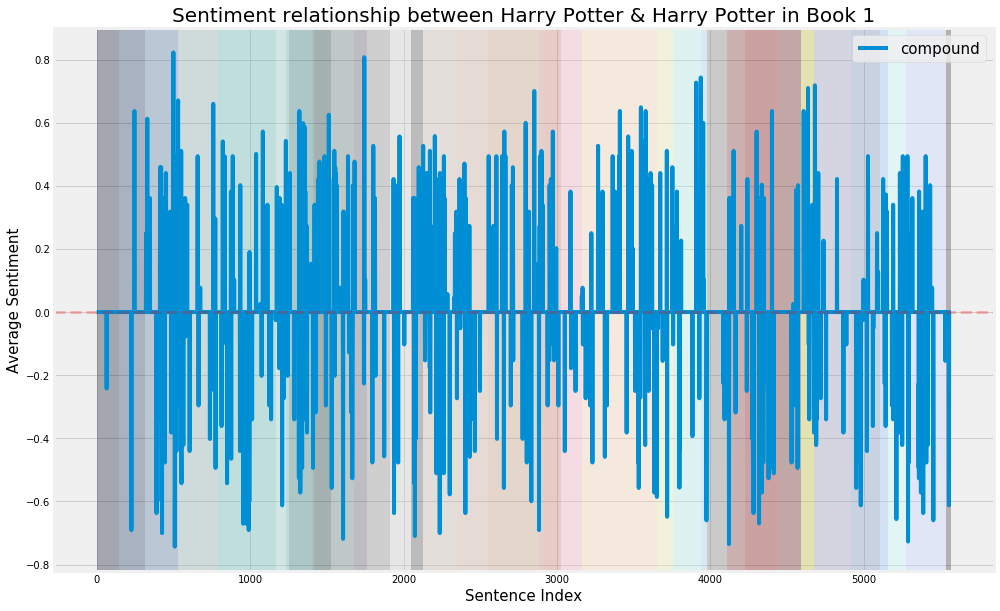

In [188]:
plot_relationship('Harry Potter', 'Harry Potter', None,'episodic', True, ['neu', 'pos', 'neg'])

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 10))
for i, sentiment in enumerate(sentiment_scores):
    plt.plot(x,
             sentiment,
             label=['compound', 'neg', 'neu', 'pos'][i])
    print(x)
    print(sentiment)
# plt.plot(movingaverage(compound_sentiments, 10)+.1, color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
#For Plotting graph

length = sum([len(hp[book]) for book in hp])


for name, group in grouped.items():
    for item in group:
        item.pop('relationship', None)
        item.pop('sentence_count', None)
    x = np.linspace(0, len(group))
    plt.figure(figsize=(15, 10))
    for i, sentiment in enumerate(group):
        plt.plot(x,
                 sentiment,
                 label=['compound', 'neg', 'neu', 'pos'][i])
    # plt.plot(movingaverage(compound_sentiments, 10)+.1, color='k', linewidth=3, linestyle=':', label = 'Moving Average')
    plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
    plt.legend(loc='best', fontsize=15)
    plt.title('Sentence sentiment of {name}', fontsize=20)
    plt.xlabel('Sentence no.', fontsize=15)
    plt.ylabel('Average Sentiment', fontsize=15)
    plt.show()

In [ ]:
#Maybe should not run
for book in tqdm(hp, desc='Progress'):
    print(book)
    for chapter in tqdm(hp[book], postfix=book):
#         print('  ', hp[book][chapter][0])
        text = hp[book][chapter][1].replace('\n', '')
        sentence_list = tokenize.sent_tokenize(text)
        sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0}
        
        for sentence in sentence_list:
            vs = analyzer.polarity_scores(sentence)
            sentiments['compound'] += vs['compound']
            sentiments['neg'] += vs['neg']
            sentiments['neu'] += vs['neu']
            sentiments['pos'] += vs['pos']
            
        sentiments['compound'] = sentiments['compound'] / len(sentence_list)
        sentiments['neg'] = sentiments['neg'] / len(sentence_list)
        sentiments['neu'] = sentiments['neu'] / len(sentence_list)
        sentiments['pos'] = sentiments['pos'] / len(sentence_list)

        hp[book][chapter] = (hp[book][chapter][0], hp[book][chapter][1], sentiments)
#     print()

In [ ]:
compound_sentiments = [hp[book][chapter][2]['compound'] for book in hp for chapter in hp[book]]

In [ ]:
chap = 0
for book in hp:
    print(book)
    book_chap = 1
    for chapter in hp[book]:
        print('  Chapter', book_chap, '-', hp[book][chapter][0])
        print('     ', compound_sentiments[chap])
        book_chap += 1
        chap += 1
    print()

In [ ]:
book_indices = {}
idx = 0
for book in hp:
    start = idx
    for chapter in hp[book]:
        idx += 1
    book_indices[book] = (start, idx)

In [ ]:
book_indices

In [ ]:
def movingaverage(interval, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(interval, window, 'same')

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)
y = [hp[book][chapter][2]['compound'] for book in hp for chapter in hp[book]]

plt.figure(figsize=(15, 10))
for book in book_indices:
    plt.plot(x[book_indices[book][0]: book_indices[book][1]],
             y[book_indices[book][0]: book_indices[book][1]],
             label=book)
plt.plot(movingaverage(y, 10), color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)
y = [hp[book][chapter][2]['compound'] for book in hp for chapter in hp[book]]

plt.figure(figsize=(15, 10))
for book in book_indices:
    plt.plot(x[book_indices[book][0]: book_indices[book][1]],
             y[book_indices[book][0]: book_indices[book][1]],
             label=book)
plt.plot(movingaverage(y, 10), color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.xticks(np.arange(0, 225, 25), '')
plt.yticks(np.arange(-.15, .15, .05), '')
plt.show()

In [ ]:
sentiment_scores = [[hp[book][chapter][2][sentiment] for book in hp for chapter in hp[book]]
                    for sentiment in ['compound', 'neg', 'neu', 'pos']]
sentiment_scores

In [ ]:
compound_sentiment = sentiment_scores[0]
print('Average Book Sentiment:')
print()
for book in book_indices:
    compound = compound_sentiment[book_indices[book][0]: book_indices[book][1]]
    print('{:45}{:.2f}%'.format(book, 100 * sum(compound) / len(compound)))
print('{:45}{:.2f}%'.format('Across the entire series', 100 * sum(compound_sentiment) / len(compound_sentiment)))

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 10))
for i, sentiment in enumerate(sentiment_scores):
    plt.plot(x,
             sentiment,
             label=['compound', 'neg', 'neu', 'pos'][i])
    print(x)
    print(sentiment)
# plt.plot(movingaverage(compound_sentiments, 10)+.1, color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

# Word2Vec Implementation

# Testing - analyze whole chapter instead of average of sentences

In [ ]:
pattern = ("(C H A P T E R (?:[A-Z-][ ]){2,}[A-Z]|"
           "E P I L O G U E)\s+" +                   # Group 1 selects the chapter number
           "([A-Z \n',.-]+)\\b(?![A-Z]+(?=\.)\\b)" + # Group 2 selects the chapter title but excludes all caps word beginning first sentence of the chapter
           "(?![a-z']|[A-Z.])" +                     # chapter title ends before lowercase letters or a period
           "(.*?)" +                                 # Group 3 selects the chapter contents
           "(?=C H A P T E R (?:[A-Z][ ]){2,}|"
           "This\s+book\s+was\s+art\s+directed\s+|"
           "E P I L O G U E)")                       # chapter contents ends with a new chapter, epilogue or the end of book
hp2 = defaultdict(dict)
for book in books:
    title = book[28:-4]
    with open(book, 'r') as f:
        text = (f.read().replace('&rsquo;', "'")
                        .replace('&lsquo;', "'")
                        .replace('&rdquo;', '"')
                        .replace('&ldquo;', '"')
                        .replace('&mdash;', '—'))
    chapters = re.findall(pattern, text, re.DOTALL)
    chap = 0
    for chapter in chapters:
        chap += 1
        chap_title = chapter[1].replace('\n','')
        chap_text = chapter[2][3:]
        phrase = ' HE-WHO-MUST-NOT-BE-NAMED RETURNS'
        if phrase in chap_title:
            chap_title = chap_title.replace(phrase, '')
            chap_text = phrase[1:] + ' I' + chap_text
        chap_text = re.sub('\n*&bull; [0-9]+ &bull; \n*' + chap_title + ' \n*', '', chap_text, flags=re.IGNORECASE)
        chap_text = re.sub('\n*&bull; [0-9]+ &bull;\s*(CHAPTER [A-Z-]+\s*)|(EPILOGUE)\s*', '', chap_text)
        chap_text = re.sub(' \n&bull; [0-9]+ &bull; \n*', '', chap_text)
        chap_text = re.sub('\s*'.join([word for word in chap_title.split()]), '', chap_text)
        hp2[title]['Chapter ' + str(chap)] = (chap_title, chap_text)
hp2 = dict(hp2)
hp2["Harry Potter and the Deathly Hallows"]['Epilogue'] = hp2["Harry Potter and the Deathly Hallows"].pop('Chapter 37')

In [ ]:
for book in tqdm(hp2, desc='Progress'):
    print(book)
    for chapter in tqdm(hp2[book]):
#         print('  ', hp2[book][chapter][0])
        text = hp2[book][chapter][1].replace('\n', '')
        sentence_list = tokenize.sent_tokenize(text)
        sentiments2 = {'compound': [], 'neg': [], 'neu': [], 'pos': []}
        
        vs = analyzer.polarity_scores(text)
        sentiments2['compound'] = vs['compound']
        sentiments2['neg'] = vs['neg']
        sentiments2['neu'] = vs['neu']
        sentiments2['pos'] = vs['pos']

        hp2[book][chapter] = (hp2[book][chapter][0], hp2[book][chapter][1], sentiments2)
#     print()

In [ ]:
length = sum([len(hp2[book]) for book in hp2])
x = np.linspace(0, length - 1, num=length)
y = [hp2[book][chapter][2]['compound'] for book in hp2 for chapter in hp2[book]]

plt.figure(figsize=(15, 10))
for book in book_indices:
    plt.plot(x[book_indices[book][0]: book_indices[book][1]],
             y[book_indices[book][0]: book_indices[book][1]],
             label=book)
# plt.plot(movingaverage(y, 2), color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
sentiment_scores2 = [[hp2[book][chapter][2][sentiment] for book in hp2 for chapter in hp2[book]]
                     for sentiment in ['compound', 'neg', 'neu', 'pos']]
length = sum([len(hp2[book]) for book in hp2])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 10))
for i, sentiment in enumerate(sentiment_scores2):
    plt.plot(x,
             sentiment,
             label=['compound', 'neg', 'neu', 'pos'][i])
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
compound_sentiment2 = sentiment_scores2[0]
print('Average Book Sentiment:')
print()
for book in book_indices:
    compound = compound_sentiment2[book_indices[book][0]: book_indices[book][1]]
    print('{:45}{:.2f}%'.format(book, 100 * sum(compound) / len(compound)))
print('{:45}{:.2f}%'.format('Across the entire series', 100 * sum(compound_sentiment2) / len(compound_sentiment2)))

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot([hp[book][chapter][2]['compound'] for book in hp for chapter in hp[book]])
plt.plot([hp2[book][chapter][2]['compound'] for book in hp2 for chapter in hp2[book]], linestyle="--")
plt.show()

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot([hp[book][chapter][2]['neg'] for book in hp for chapter in hp[book]])
plt.plot([hp2[book][chapter][2]['neg'] for book in hp2 for chapter in hp2[book]], linestyle="--")
plt.show()

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot([hp[book][chapter][2]['neu'] for book in hp for chapter in hp[book]])
plt.plot([hp2[book][chapter][2]['neu'] for book in hp2 for chapter in hp2[book]], linestyle="--")
plt.show()

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot([hp[book][chapter][2]['pos'] for book in hp for chapter in hp[book]])
plt.plot([hp2[book][chapter][2]['pos'] for book in hp2 for chapter in hp2[book]], linestyle="--")
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 15))
for i, sentiment in enumerate(sentiment_scores):
    plt.plot(x,
             sentiment,
             label=['compound', 'neg', 'neu', 'pos'][i])
# plt.plot(movingaverage(compound_sentiments, 10)+.1, color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)




sentiment_scores2 = [[hp2[book][chapter][2][sentiment] for book in hp2 for chapter in hp2[book]] for sentiment in ['compound', 'neg', 'neu', 'pos']]
length = sum([len(hp2[book]) for book in hp2])
x = np.linspace(0, length - 1, num=length)

for i, sentiment in enumerate(sentiment_scores2):
    plt.plot(x,
             sentiment,
             label=['compound', 'neg', 'neu', 'pos'][i],
             linestyle=':')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter')
plt.ylabel('Average Sentiment')
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 15))
for i, sentiment in enumerate(sentiment_scores[1:]):
    plt.plot(x,
             sentiment,
             label=['neg', 'neu', 'pos'][i])

sentiment_scores2 = [[hp2[book][chapter][2][sentiment] for book in hp2 for chapter in hp2[book]] for sentiment in ['compound', 'neg', 'neu', 'pos']]
length = sum([len(hp2[book]) for book in hp2])
x = np.linspace(0, length - 1, num=length)

for i, sentiment in enumerate(sentiment_scores2[1:]):
    plt.plot(x,
             sentiment,
             label=['neg', 'neu', 'pos'][i],
             linestyle=':')
plt.legend(loc='best', fontsize=15)
plt.show()

# Test TextBlob NaiveBayes and Pattern analyzers

In [ ]:
from textblob import Blobber
from textblob.sentiments import NaiveBayesAnalyzer
from textblob.sentiments import PatternAnalyzer

In [ ]:
hp3 = defaultdict(dict)
for book in books:
    title = book[28:-4]
    with open(book, 'r') as f:
        text = (f.read().replace('&rsquo;', "'")
                        .replace('&lsquo;', "'")
                        .replace('&rdquo;', '"')
                        .replace('&ldquo;', '"')
                        .replace('&mdash;', '—'))
    chapters = re.findall(pattern, text, re.DOTALL)
    chap = 0
    for chapter in chapters:
        chap += 1
        chap_title = chapter[1].replace('\n','')
        chap_text = chapter[2][3:]
        phrase = ' HE-WHO-MUST-NOT-BE-NAMED RETURNS'
        if phrase in chap_title:
            chap_title = chap_title.replace(phrase, '')
            chap_text = phrase[1:] + ' I' + chap_text
        chap_text = re.sub('\n*&bull; [0-9]+ &bull; \n*' + chap_title + ' \n*', '', chap_text, flags=re.IGNORECASE)
        chap_text = re.sub('\n*&bull; [0-9]+ &bull;\s*(CHAPTER [A-Z-]+\s*)|(EPILOGUE)\s*', '', chap_text)
        chap_text = re.sub(' \n&bull; [0-9]+ &bull; \n*', '', chap_text)
        chap_text = re.sub('\s*'.join([word for word in chap_title.split()]), '', chap_text)
        hp3[title]['Chapter ' + str(chap)] = (chap_title, chap_text)
hp3 = dict(hp3)
hp3["Harry Potter and the Deathly Hallows"]['Epilogue'] = hp3["Harry Potter and the Deathly Hallows"].pop('Chapter 37')

In [ ]:
nb = Blobber(analyzer=NaiveBayesAnalyzer())

In [ ]:
for book in hp3:
    print(book)
    for chapter in tqdm(hp3[book]):
#         print('  ', hp3[book][chapter][0])
        text = hp3[book][chapter][1].replace('\n', '')
        sentence_list = tokenize.sent_tokenize(text)
        sentiments3 = 0
        
        for sentence in sentence_list:
            sentiments3 += nb(sentence).sentiment.p_pos * 2 - 1
            
        sentiments3 = sentiments3 / len(sentence_list)

        hp3[book][chapter] = (hp3[book][chapter][0], hp3[book][chapter][1], sentiments3 )
#     print()

In [ ]:
length = sum([len(hp3[book]) for book in hp3])
x = np.linspace(0, length - 1, num=length)
y = [hp3[book][chapter][2] for book in hp3 for chapter in hp3[book]]

plt.figure(figsize=(15, 10))
for book in book_indices:
    plt.plot(x[book_indices[book][0]: book_indices[book][1]],
             y[book_indices[book][0]: book_indices[book][1]],
             label=book)
plt.plot(movingaverage(y, 10), color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
hp4 = defaultdict(dict)
for book in books:
    title = book[28:-4]
    with open(book, 'r') as f:
        text = (f.read().replace('&rsquo;', "'")
                        .replace('&lsquo;', "'")
                        .replace('&rdquo;', '"')
                        .replace('&ldquo;', '"')
                        .replace('&mdash;', '—'))
    chapters = re.findall(pattern, text, re.DOTALL)
    chap = 0
    for chapter in chapters:
        chap += 1
        chap_title = chapter[1].replace('\n','')
        chap_text = chapter[2][3:]
        phrase = ' HE-WHO-MUST-NOT-BE-NAMED RETURNS'
        if phrase in chap_title:
            chap_title = chap_title.replace(phrase, '')
            chap_text = phrase[1:] + ' I' + chap_text
        chap_text = re.sub('\n*&bull; [0-9]+ &bull; \n*' + chap_title + ' \n*', '', chap_text, flags=re.IGNORECASE)
        chap_text = re.sub('\n*&bull; [0-9]+ &bull;\s*(CHAPTER [A-Z-]+\s*)|(EPILOGUE)\s*', '', chap_text)
        chap_text = re.sub(' \n&bull; [0-9]+ &bull; \n*', '', chap_text)
        chap_text = re.sub('\s*'.join([word for word in chap_title.split()]), '', chap_text)
        hp4[title]['Chapter ' + str(chap)] = (chap_title, chap_text)
hp4 = dict(hp4)
hp4["Harry Potter and the Deathly Hallows"]['Epilogue'] = hp4["Harry Potter and the Deathly Hallows"].pop('Chapter 37')

In [ ]:
p = Blobber(analyzer=PatternAnalyzer())

In [ ]:
for book in hp4:
    print(book)
    for chapter in tqdm(hp4[book]):
#         print('  ', hp4[book][chapter][0])
        text = hp4[book][chapter][1].replace('\n', '')
        sentence_list = tokenize.sent_tokenize(text)
        sentiments4 = 0
        
        for sentence in sentence_list:
            sentiments4 += p(sentence).sentiment.polarity
            
        sentiments4 = sentiments4 / len(sentence_list)

        hp4[book][chapter] = (hp4[book][chapter][0], hp4[book][chapter][1], sentiments4)
#     print()

In [ ]:
length = sum([len(hp4[book]) for book in hp4])
x = np.linspace(0, length - 1, num=length)
y = [hp4[book][chapter][2] for book in hp4 for chapter in hp4[book]]

plt.figure(figsize=(15, 10))
for book in book_indices:
    plt.plot(x[book_indices[book][0]: book_indices[book][1]],
             y[book_indices[book][0]: book_indices[book][1]],
             label=book)
plt.plot(movingaverage(y, 10), color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
hp5 = defaultdict(dict)
for book in books:
    title = book[28:-4]
    with open(book, 'r') as f:
        text = (f.read().replace('&rsquo;', "'")
                        .replace('&lsquo;', "'")
                        .replace('&rdquo;', '"')
                        .replace('&ldquo;', '"')
                        .replace('&mdash;', '—'))
    chapters = re.findall(pattern, text, re.DOTALL)
    chap = 0
    for chapter in chapters:
        chap += 1
        chap_title = chapter[1].replace('\n','')
        chap_text = chapter[2][3:]
        phrase = ' HE-WHO-MUST-NOT-BE-NAMED RETURNS'
        if phrase in chap_title:
            chap_title = chap_title.replace(phrase, '')
            chap_text = phrase[1:] + ' I' + chap_text
        chap_text = re.sub('\n*&bull; [0-9]+ &bull; \n*' + chap_title + ' \n*', '', chap_text, flags=re.IGNORECASE)
        chap_text = re.sub('\n*&bull; [0-9]+ &bull;\s*(CHAPTER [A-Z-]+\s*)|(EPILOGUE)\s*', '', chap_text)
        chap_text = re.sub(' \n&bull; [0-9]+ &bull; \n*', '', chap_text)
        chap_text = re.sub('\s*'.join([word for word in chap_title.split()]), '', chap_text)
        hp5[title]['Chapter ' + str(chap)] = (chap_title, chap_text)
hp5 = dict(hp5)
hp5["Harry Potter and the Deathly Hallows"]['Epilogue'] = hp5["Harry Potter and the Deathly Hallows"].pop('Chapter 37')

In [ ]:
for book in hp5:
    print(book)
    for chapter in tqdm(hp5[book]):
#         print('  ', hp5[book][chapter][0])
        text = hp5[book][chapter][1].replace('\n', '')
        
        sentiment = nb(text).sentiment.p_pos * 2 - 1

        hp5[book][chapter] = (hp5[book][chapter][0], hp5[book][chapter][1], sentiment)
#     print()

In [ ]:
length = sum([len(hp5[book]) for book in hp5])
x = np.linspace(0, length - 1, num=length)
y = [hp5[book][chapter][2] for book in hp5 for chapter in hp5[book]]

plt.figure(figsize=(15, 10))
for book in book_indices:
    plt.plot(x[book_indices[book][0]: book_indices[book][1]],
             y[book_indices[book][0]: book_indices[book][1]],
             label=book)
plt.plot(movingaverage(y, 10), color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
hp6 = defaultdict(dict)
for book in books:
    title = book[28:-4]
    with open(book, 'r') as f:
        text = (f.read().replace('&rsquo;', "'")
                        .replace('&lsquo;', "'")
                        .replace('&rdquo;', '"')
                        .replace('&ldquo;', '"')
                        .replace('&mdash;', '—'))
    chapters = re.findall(pattern, text, re.DOTALL)
    chap = 0
    for chapter in chapters:
        chap += 1
        chap_title = chapter[1].replace('\n','')
        chap_text = chapter[2][3:]
        phrase = ' HE-WHO-MUST-NOT-BE-NAMED RETURNS'
        if phrase in chap_title:
            chap_title = chap_title.replace(phrase, '')
            chap_text = phrase[1:] + ' I' + chap_text
        chap_text = re.sub('\n*&bull; [0-9]+ &bull; \n*' + chap_title + ' \n*', '', chap_text, flags=re.IGNORECASE)
        chap_text = re.sub('\n*&bull; [0-9]+ &bull;\s*(CHAPTER [A-Z-]+\s*)|(EPILOGUE)\s*', '', chap_text)
        chap_text = re.sub(' \n&bull; [0-9]+ &bull; \n*', '', chap_text)
        chap_text = re.sub('\s*'.join([word for word in chap_title.split()]), '', chap_text)
        hp6[title]['Chapter ' + str(chap)] = (chap_title, chap_text)
hp6 = dict(hp6)
hp6["Harry Potter and the Deathly Hallows"]['Epilogue'] = hp6["Harry Potter and the Deathly Hallows"].pop('Chapter 37')

In [ ]:
for book in hp6:
    print(book)
    for chapter in tqdm(hp6[book]):
#         print('  ', hp6[book][chapter][0])
        text = hp6[book][chapter][1].replace('\n', '')
        
        sentiment = p(text).sentiment.polarity

        hp6[book][chapter] = (hp6[book][chapter][0], hp6[book][chapter][1], sentiment)
#     print()

In [ ]:
length = sum([len(hp6[book]) for book in hp6])
x = np.linspace(0, length - 1, num=length)
y = [hp6[book][chapter][2] for book in hp6 for chapter in hp6[book]]

plt.figure(figsize=(15, 10))
for book in book_indices:
    plt.plot(x[book_indices[book][0]: book_indices[book][1]],
             y[book_indices[book][0]: book_indices[book][1]],
             label=book)
plt.plot(movingaverage(y, 10), color='k', linewidth=3, linestyle=':', label = 'Moving Average')
plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

# NRC emotion lexicon
# #Important

In [102]:
#MUST-RUN
import pandas as pd
from nltk import word_tokenize
from nltk.stem.snowball import SnowballStemmer

filepath = ('NRC-Sentiment-Emotion-Lexicons/'
            'NRC-Sentiment-Emotion-Lexicons/'
            'NRC-Emotion-Lexicon-v0.92/'
            'NRC-Emotion-Lexicon-Wordlevel-v0.92.txt')
emolex_df = pd.read_csv(filepath,
                        names=["word", "emotion", "association"],
                        sep='\t')
emolex_words = emolex_df.pivot(index='word',
                               columns='emotion',
                               values='association').reset_index()
emotions = emolex_words.columns.drop('word')

stemmer = SnowballStemmer("english")

In [451]:
for emotion in emotions:
    print(emotion)
    print(type(emotion))

anger
<class 'str'>
anticipation
<class 'str'>
disgust
<class 'str'>
fear
<class 'str'>
joy
<class 'str'>
negative
<class 'str'>
positive
<class 'str'>
sadness
<class 'str'>
surprise
<class 'str'>
trust
<class 'str'>


In [103]:


def text_emotion(df, column):
    '''
    Takes a DataFrame and a specified column of text and adds 10 columns to the
    DataFrame for each of the 10 emotions in the NRC Emotion Lexicon, with each
    column containing the value of the text in that emotions
    INPUT: DataFrame, string
    OUTPUT: the original DataFrame with ten new columns
    '''

    new_df = df.copy()

    filepath = ('NRC-Sentiment-Emotion-Lexicons/'
                'NRC-Sentiment-Emotion-Lexicons/'
                'NRC-Emotion-Lexicon-v0.92/'
                'NRC-Emotion-Lexicon-Wordlevel-v0.92.txt')
    emolex_df = pd.read_csv(filepath,
                            names=["word", "emotion", "association"],
                            sep='\t')
    emolex_words = emolex_df.pivot(index='word',
                                   columns='emotion',
                                   values='association').reset_index()
    emotions = emolex_words.columns.drop('word')
    emo_df = pd.DataFrame(0, index=df.index, columns=emotions)

    stemmer = SnowballStemmer("english")

    
    book = ''
    chapter = ''
    
    with tqdm(total=len(list(new_df.iterrows()))) as pbar:
        for i, row in new_df.iterrows():
            pbar.update(1)
            if row['book'] != book:
                print(row['book'])
                book = row['book']
            if row['chapter_title'] != chapter:
                print('   ', row['chapter_title'])
                chapter = row['chapter_title']
                chap = row['chapter_title']
            document = word_tokenize(new_df.loc[i][column])
            for word in document:
                word = stemmer.stem(word.lower())
                emo_score = emolex_words[emolex_words.word == word]
                if not emo_score.empty:
                    for emotion in list(emotions):
                        emo_df.at[i, emotion] += emo_score[emotion]

    new_df = pd.concat([new_df, emo_df], axis=1)

    return new_df

In [104]:
#MUST-RUN
#Bring the sentences to vader sentiment analysis & output result. Available output_types -> moving average, total, episodic
def find_emotion_relationship_spacy(subject, target, output_type, cleaned_all_relationship_dict):
    phrase_to_analyze = []
    episodic_emotion_list = []
    moving_average_emotion_list = []
    interaction_counter = 0
    relationship_string = subject + '-' + target
    
    data = {'sentence_index': [], 'phrase': [], 'sentence': []}
    
    for sentence_to_analyze in cleaned_all_relationship_dict[relationship_string]:
        data['sentence_index'].append(sentence_to_analyze[1])
        data['phrase'].append(sentence_to_analyze[0])
        data['sentence'].append(sentence_to_analyze[2])
    sentence_df = pd.DataFrame(data)
    
    print(sentence_df)
    
    filepath = ('NRC-Sentiment-Emotion-Lexicons/'
                'NRC-Sentiment-Emotion-Lexicons/'
                'NRC-Emotion-Lexicon-v0.92/'
                'NRC-Emotion-Lexicon-Wordlevel-v0.92.txt')
    emolex_df = pd.read_csv(filepath,
                            names=["word", "emotion", "association"],
                            sep='\t')
    emolex_words = emolex_df.pivot(index='word',
                                   columns='emotion',
                                   values='association').reset_index()
    emotions = emolex_words.columns.drop('word')
    emo_df = pd.DataFrame(0, index = sentence_df.index, columns=emotions)

    stemmer = SnowballStemmer("english")
    
    for sentence_to_analyze in cleaned_all_relationship_dict[relationship_string]:
        #VADER Sentiment Analysis
        tokenized_sentence = word_tokenize(sentence_to_analyze[0])
        for word in tokenized_sentence:
                word = stemmer.stem(word.lower())
                emo_score = emolex_words[emolex_words.word == word]
                if not emo_score.empty:
                    for emotion in list(emotions):
                        emo_df.at[interaction_counter, emotion] += emo_score[emotion]
        interaction_counter += 1
    
    final_df = pd.concat([sentence_df, emo_df], axis=1)
    
    if output_type == 'moving average':
        return final_df
    elif output_type == 'total':
        return final_df
    elif output_type == 'episodic':
        return final_df
          

In [105]:
#MUST-RUN
#Bring the sentences to vader sentiment analysis & output result. Available output_types -> moving average, total, episodic
def find_sentiment_emotion_relationship_spacy(subject, target, output_type, cleaned_all_relationship_dict):
    analyzer = SentimentIntensityAnalyzer()
    phrase_to_analyze = []
    episodic_sentiment_list = []
    episodic_emotion_list = []
    moving_average_emotion_list = []
    interaction_counter = 0
    sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0}
    relationship_string = subject + '-' + target
    
    data = {'sentence_index': [], 'phrase': [], 'sentence': []}
    
    for sentence_to_analyze in cleaned_all_relationship_dict[relationship_string]:
        data['sentence_index'].append(sentence_to_analyze[1])
        data['phrase'].append(sentence_to_analyze[0])
        data['sentence'].append(sentence_to_analyze[2])
    sentence_df = pd.DataFrame(data)
    
    print(sentence_df)
    
    filepath = ('NRC-Sentiment-Emotion-Lexicons/'
                'NRC-Sentiment-Emotion-Lexicons/'
                'NRC-Emotion-Lexicon-v0.92/'
                'NRC-Emotion-Lexicon-Wordlevel-v0.92.txt')
    emolex_df = pd.read_csv(filepath,
                            names=["word", "emotion", "association"],
                            sep='\t')
    emolex_words = emolex_df.pivot(index='word',
                                   columns='emotion',
                                   values='association').reset_index()
    emotions = emolex_words.columns.drop('word')
    emo_df = pd.DataFrame(0, index = sentence_df.index, columns=emotions)
    
    sentiments = ['VADER compound','VADER neg', 'VADER neu', 'VADER pos']
    sentiment_df = pd.DataFrame(0.00, index = sentence_df.index, columns=sentiments)

    stemmer = SnowballStemmer("english")
    
    for sentence_to_analyze in cleaned_all_relationship_dict[relationship_string]:
        vs = analyzer.polarity_scores(sentence_to_analyze[0])
        
        #Episodic
        sentiment_df.at[interaction_counter, 'VADER compound'] += vs['compound']
        sentiment_df.at[interaction_counter, 'VADER neg'] += vs['neg']
        sentiment_df.at[interaction_counter, 'VADER neu'] += vs['neu']
        sentiment_df.at[interaction_counter, 'VADER pos'] += vs['pos']
        
        tokenized_sentence = word_tokenize(sentence_to_analyze[0])
        for word in tokenized_sentence:
                word = stemmer.stem(word.lower())
                emo_score = emolex_words[emolex_words.word == word]
                if not emo_score.empty:
                    for emotion in list(emotions):
                        emo_df.at[interaction_counter, emotion] += emo_score[emotion]
        interaction_counter += 1
    
    final_df = pd.concat([sentence_df, emo_df], axis=1)
    final_df = pd.concat([final_df, sentiment_df], axis = 1)
    
    if output_type == 'moving average':
        return final_df
    elif output_type == 'total':
        return final_df
    elif output_type == 'episodic':
        return final_df
          

In [179]:
harry_df = find_sentiment_emotion_relationship_spacy('Harry Potter', 'Harry Potter', 'total', cleaned_all_relationship_dict)
harry_df

      sentence_index                                             phrase  \
0                 60                      Harry nephew was called Harry   
1                 61                   Harry ’d never even seen the boy   
2                 65                 if Harry ’d had a sister like that   
3                 65       when Harry left the building at five o’clock   
4                 65              Harry was still so worried that Harry   
...              ...                                                ...   
2523            5555       looking terrified at the very sight of Harry   
2524            5556                         You must be Harry’s family   
2525            5563  Harry, and they were surprised at the grin tha...   
2526            5563                 that was spreading over Harry face   
2527            5565                                              Harry   

                                               sentence  
0     Come to think of it, Harry wasn’t e

,sentence_index,phrase,sentence,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,VADER compound,VADER neg,VADER neu,VADER pos
0,60,Harry nephew was called Harry,"Come to think of it, Harry wasn’t even sure Ha...",0,0,0,0,0,0,0,0,0,0,0.0000,0.000,1.000,0.000
1,61,Harry ’d never even seen the boy,Harry ’d never even seen the boy.,0,0,1,0,0,1,0,0,0,0,0.0000,0.000,1.000,0.000
2,65,if Harry ’d had a sister like that,Harry didn’t blame Petunia — if Harry ’d had a...,0,0,0,0,0,0,0,0,0,0,0.3612,0.000,0.706,0.294
3,65,when Harry left the building at five o’clock,Harry didn’t blame Petunia — if Harry ’d had a...,0,1,0,0,0,0,1,0,0,0,0.0000,0.000,1.000,0.000
4,65,Harry was still so worried that Harry,Harry didn’t blame Petunia — if Harry ’d had a...,0,0,0,0,0,0,0,0,0,0,-0.4341,0.323,0.677,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2523,5555,looking terrified at the very sight of Harry,"Behind Harry stood Aunt Petunia and Dudley, lo...",0,0,0,0,0,0,0,0,0,0,-0.6124,0.364,0.636,0.000
2524,5556,You must be Harry’s family,“You must be Harry’s family!” said Mrs. Weasley.,0,0,0,0,0,0,0,0,0,0,0.0000,0.000,1.000,0.000
2525,5563,"Harry, and they were surprised at the grin tha...","“Oh, Vernon will,” said Harry, and they were s...",0,1,0,0,1,0,1,0,1,1,0.6124,0.000,0.688,0.312
2526,5563,that was spreading over Harry face,"“Oh, Vernon will,” said Harry, and they were s...",0,0,0,0,0,0,0,0,0,0,0.0000,0.000,1.000,0.000


In [180]:
#MUST-RUN
from pathlib import Path
import os

def save_df(df, file_name):
    output_path = Path(os.getcwd() + "/CSV/" + file_name + '.xlsx')
    with pd.ExcelWriter(output_path) as writer:
        df.to_excel(writer, sheet_name = '1')

In [181]:
save_df(harry_df, 'Harry-Harry sentiment_emotion spacy v7')

In [ ]:
cleaned_all_relationship_dict['Harry Potter-Hermione Granger']

In [ ]:
sentence_list[198]

In [ ]:
tokenize.sent_tokenize('Malfoy’s eagle owl was always bringing Harry packages of sweets from home, which Harry opened gloatingly at the Slytherin table. A barn owl brought Neville a small package from Neville grandmother.')

In [ ]:
spacy_find_subject_target(sentence_list[1560], 89)

In [161]:
def plot_emotion_graph(df):
    length = total_no_of_sentences
    x = np.linspace(0, length - 1, num=length)

    emotion_df = convert_to_emotion_score_sentence_indexing(df, length)

    fig, ax = plt.subplots(4, 3, figsize=(60, 60), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.1)
    fig.suptitle('Sentiment of the Harry Potter series', fontsize=20, y=1.02)
    fig.subplots_adjust(top=0.88)

    ax = ax.ravel()

    for i, emotion in enumerate(emotions):
        y = emotion_df[emotion]
        ax[i].plot(x,
                 y,
                 label=book, linewidth=2)

        ax[i].set_title('{} Sentiment'.format(emotion.title()))
        ax[i].set_xticks([])
        #mark_events(ax[i])
        
    

    fig.legend(list(hp), loc='upper right', fontsize=15, bbox_to_anchor=(.85, .2))
    fig.tight_layout()
    fig.delaxes(ax[-1])
    fig.delaxes(ax[-2])
    plt.show()

In [162]:
#MUST-RUN
#Convert to emotion scores for graphing WITH SENTENCE INDEXING
def convert_to_emotion_score_sentence_indexing(df, total_no_of_sentences):
    combined_dict = {}
    for i, emotion in enumerate(emotions):
        combined_dict[emotion] = [0]*total_no_of_sentences
    for index, row in df.iterrows():
        for emotion in emotions:
            combined_dict[emotion][row['sentence_index']] = row[emotion]
    return combined_dict

In [186]:
def mark_events(plt):
    plt.axvspan(0, 144, facecolor='#182132', alpha=0.35)
    plt.axvspan(144, 313, facecolor='#223f6b', alpha=0.35)
    plt.axvspan(313, 530, facecolor='#547fa2', alpha=0.35)
    plt.axvspan(530, 788, facecolor='#94b4b1', alpha=0.35)
    plt.axvspan(788, 1172, facecolor='#69c0b8', alpha=0.35)
    plt.axvspan(1172, 1235, facecolor='#99d6d2', alpha=0.35)
    plt.axvspan(1235, 1255, facecolor='#65b4b2', alpha=0.35)
    plt.axvspan(1255, 1412, facecolor='#2d7c7a', alpha=0.35)
    plt.axvspan(1412, 1423, facecolor='#175456', alpha=0.35)
    plt.axvspan(1423, 1528, facecolor='#153e3b', alpha=0.35)
    plt.axvspan(1528, 1675, facecolor='#607e7c', alpha=0.35)
    plt.axvspan(1675, 1765, facecolor='#615f6f', alpha=0.35)
    plt.axvspan(1765, 1910, facecolor='#949494', alpha=0.35)
    plt.axvspan(1910, 2046, facecolor='#d4d4d4', alpha=0.35)
    plt.axvspan(2046, 2124, facecolor='#5c5c5c', alpha=0.35)
    plt.axvspan(2124, 2347, facecolor='#cfbdb1', alpha=0.35)
    plt.axvspan(2347, 2550, facecolor='#d2b4a0', alpha=0.35)
    plt.axvspan(2550, 2885, facecolor='#d2a88b', alpha=0.35)
    plt.axvspan(2885, 2919, facecolor='#d69387', alpha=0.35)
    plt.axvspan(2919, 3028, facecolor='#dd8878', alpha=0.35)
    plt.axvspan(3028, 3166, facecolor='#fdb9c9', alpha=0.35)
    plt.axvspan(3166, 3654, facecolor='#ffdcbe', alpha=0.35)
    plt.axvspan(3654, 3754, facecolor='#f6f3b5', alpha=0.35)
    plt.axvspan(3754, 3937, facecolor='#bbf6f3', alpha=0.35)
    plt.axvspan(3937, 3975, facecolor='#a7e0f4', alpha=0.35)
    plt.axvspan(3975, 4107, facecolor='#838383', alpha=0.35)
    plt.axvspan(4107, 4227, facecolor='#873c3c', alpha=0.35)
    plt.axvspan(4227, 4438, facecolor='#891010', alpha=0.35)
    plt.axvspan(4438, 4592, facecolor='#6d2020', alpha=0.35)
    plt.axvspan(4592, 4678, facecolor='#c8c941', alpha=0.35)
    plt.axvspan(4678, 4918, facecolor='#a3a5c6', alpha=0.35)
    plt.axvspan(4918, 5108, facecolor='#7f9cc6', alpha=0.35)
    plt.axvspan(5108, 5157, facecolor='#9ec6ff', alpha=0.35)
    plt.axvspan(5157, 5275, facecolor='#c8ffff', alpha=0.35)
    plt.axvspan(5275, 5537, facecolor='#c3d6ff', alpha=0.35)
    plt.axvspan(5537, 5538, facecolor='#30375a', alpha=0.35)
    plt.axvspan(5538, len(sentence_list), facecolor='#4f3b3b', alpha=0.35)

In [57]:
def mark_events(plt):
    plt.axvspan(0, 46, facecolor='#182132', alpha=0.2)
    plt.axvspan(46, 294, facecolor='#223f6b', alpha=0.2)
    plt.axvspan(294, 392, facecolor='#547fa2', alpha=0.2)
    plt.axvspan(392, 535, facecolor='#94b4b1', alpha=0.2)
    plt.axvspan(535, 758, facecolor='#69c0b8', alpha=0.2)
    plt.axvspan(758, 793, facecolor='#99d6d2', alpha=0.2)
    plt.axvspan(793, 801, facecolor='#65b4b2', alpha=0.2)
    plt.axvspan(801, 892, facecolor='#2d7c7a', alpha=0.2)
    plt.axvspan(892, 895, facecolor='#175456', alpha=0.2)
    plt.axvspan(895, 1031, facecolor='#153e3b', alpha=0.2)
    plt.axvspan(1031, 1086, facecolor='#607e7c', alpha=0.2)
    plt.axvspan(1086, 1097, facecolor='#615f6f', alpha=0.2)
    plt.axvspan(1097, 1176, facecolor='#949494', alpha=0.2)
    plt.axvspan(1176, 1254, facecolor='#d4d4d4', alpha=0.2)
    plt.axvspan(1254, 1303, facecolor='#5c5c5c', alpha=0.2)
    plt.axvspan(1303, 1438, facecolor='#cfbdb1', alpha=0.2)
    plt.axvspan(1438, 1542, facecolor='#d2b4a0', alpha=0.2)
    plt.axvspan(1542, 1728, facecolor='#d2a88b', alpha=0.2)
    plt.axvspan(1728, 1743, facecolor='#d69387', alpha=0.2)
    plt.axvspan(1743, 1809, facecolor='#dd8878', alpha=0.2)
    plt.axvspan(1809, 1879, facecolor='#fdb9c9', alpha=0.2)
    plt.axvspan(1879, 2006, facecolor='#ffdcbe', alpha=0.2)
    plt.axvspan(2006, 2160, facecolor='#f6f3b5', alpha=0.2)
    plt.axvspan(2160, 2219, facecolor='#bbf6f3', alpha=0.2)
    plt.axvspan(2219, 2319, facecolor='#a7e0f4', alpha=0.2)
    plt.axvspan(2319, 2425, facecolor='#838383', alpha=0.2)
    plt.axvspan(2425, 2470, facecolor='#873c3c', alpha=0.2)
    plt.axvspan(2470, 2574, facecolor='#891010', alpha=0.2)
    plt.axvspan(2574, 2711, facecolor='#6d2020', alpha=0.2)
    plt.axvspan(2711, 2725, facecolor='#c8c941', alpha=0.2)
    plt.axvspan(2725, 2806, facecolor='#a3a5c6', alpha=0.2)
    plt.axvspan(2806, 2911, facecolor='#7f9cc6', alpha=0.2)
    plt.axvspan(2911, 3011, facecolor='#9ec6ff', alpha=0.2)
    plt.axvspan(3011, 3035, facecolor='#c8ffff', alpha=0.2)
    plt.axvspan(3035, 3108, facecolor='#c3d6ff', alpha=0.2)
    plt.axvspan(3108, 3227, facecolor='#73C6B6', alpha=0.2)
    plt.axvspan(3227, 3288, facecolor='#30375a', alpha=0.2)
    plt.axvspan(3288, len(sentence_list), facecolor='#4f3b3b', alpha=0.2)

      sentence_index                                             phrase  \
0                 60                      Harry nephew was called Harry   
1                 65                         Harry didn’t blame Petunia   
2                 65       when Harry left the building at five o’clock   
3                 65              Harry was still so worried that Harry   
4                 65  when Harry left the building at five o’clock, ...   
...              ...                                                ...   
2312            5555       looking terrified at the very sight of Harry   
2313            5556                         You must be Harry’s family   
2314            5556                                                      
2315            5563                 that was spreading over Harry face   
2316            5565                                              Harry   

                                               sentence  
0     Come to think of it, Harry wasn’t e

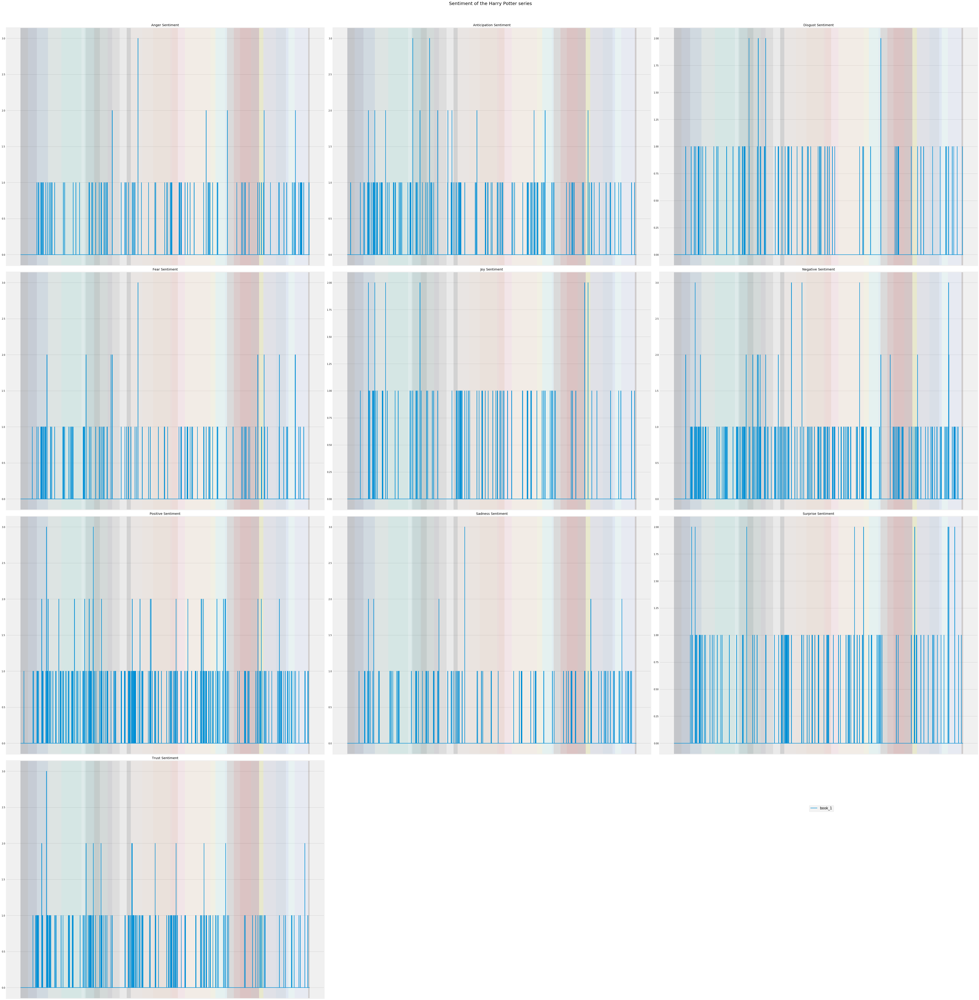

In [163]:
plot_emotion_graph(find_emotion_relationship_spacy('Harry Potter', 'Harry Potter', 'total', cleaned_all_relationship_dict))

In [ ]:
hp

In [ ]:
data = {'book': [], 'chapter_title': [], 'text': []}

for book in hp:
    print(book)
    for chapter in tqdm(hp[book]):
        title = hp[book][chapter][0]
#         print('   ', chapter, title)
        text = hp[book][chapter][1].replace('\n', '')
        data['book'].append(book)
        data['chapter_title'].append(title)
        data['text'].append(text)
#     print()
    
hp_df = pd.DataFrame(data=data)

In [ ]:
hp_df

In [ ]:
hp_df = text_emotion(hp_df, 'text')

In [ ]:
hp_df.head()

In [ ]:
hp_df['word_count'] = hp_df['text'].apply(tokenize.word_tokenize).apply(len)

In [ ]:
emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness', 'surprise', 'trust']

In [ ]:
for emotion in emotions:
    hp_df[emotion] = hp_df[emotion] / hp_df['word_count']

In [ ]:
hp_df.set_index(['book', 'chapter_title'], inplace=True)

In [ ]:
hp_df.head()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

for emotion in emotions:
    y = [hp_df.loc[book].loc[hp[book][chapter][0]][emotion] for book in hp for chapter in hp[book]]

    plt.figure(figsize=(15, 10))
    for book in book_indices:
        plt.plot(x[book_indices[book][0]: book_indices[book][1]],
                 y[book_indices[book][0]: book_indices[book][1]],
                 label=book)
    plt.plot(movingaverage(y, 10), color='k', linewidth=3, linestyle=':', label='Moving Average')
    plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.05, 1))
    plt.title('{} Sentiment of the Harry Potter series'.format(emotion.title()), fontsize=20)
    plt.xlabel('Chapter', fontsize=15)
    plt.ylabel('Average Sentiment', fontsize=15)
    plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

fig, ax = plt.subplots(4, 3, figsize=(15, 15), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.suptitle('Sentiment of the Harry Potter series', fontsize=20, y=1.02)
fig.subplots_adjust(top=0.88)

ax = ax.ravel()

for i, emotion in enumerate(emotions):
    y = [hp_df.loc[book].loc[hp[book][chapter][0]][emotion] for book in hp for chapter in hp[book]]
    for book in book_indices:
        ax[i].plot(x[book_indices[book][0]: book_indices[book][1]],
                 y[book_indices[book][0]: book_indices[book][1]],
                 label=book, linewidth=2)

    ax[i].set_title('{} Sentiment'.format(emotion.title()))
    ax[i].set_xticks([])

fig.legend(list(hp), loc='upper right', fontsize=15, bbox_to_anchor=(.85, .2))
fig.tight_layout()
fig.delaxes(ax[-1])
fig.delaxes(ax[-2])
plt.show()

In [ ]:
tab10 = matplotlib.cm.get_cmap('tab10')

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1)


y = [hp_df[emotion].tolist() for emotion in emotions]
plt.stackplot(x, y, colors=(tab10(0),
                            tab10(.1),
                            tab10(.2),
                            tab10(.3),
                            tab10(.4),
                            tab10(.5),
                            tab10(.6),
                            tab10(.7),
                            tab10(.8),
                            tab10(.9)), labels=emotions)
# Plot vertical lines marking the books
for book in book_indices:
    plt.axvline(x=book_indices[book][0], color='black', linewidth=3, linestyle=':')
plt.axvline(x=book_indices[book][1]-1, color='black', linewidth=3, linestyle=':')

plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Relative Sentiment', fontsize=15)

# Reverse the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))

ax.grid(False)

plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)
window = 10

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1)


y = [movingaverage(hp_df[emotion].tolist(), window) for emotion in emotions]

plt.stackplot(x, y, colors=(tab10(0),
                            tab10(.1),
                            tab10(.2),
                            tab10(.3),
                            tab10(.4),
                            tab10(.5),
                            tab10(.6),
                            tab10(.7),
                            tab10(.8),
                            tab10(.9)), labels=emotions)
# Plot vertical lines marking the books
for book in book_indices:
    plt.axvline(x=book_indices[book][0], color='black', linewidth=3, linestyle=':')
plt.axvline(x=book_indices[book][1]-1, color='black', linewidth=3, linestyle=':')

plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Relative Sentiment', fontsize=15)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))

axes = plt.gca()
axes.set_xlim([min(x) + window / 2, max(x) - window / 2])

ax.grid(False)

plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
window = 10
x = np.linspace(0, length - 1, num=length)[int(window / 2): -int(window / 2)]

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1)

y = [movingaverage(hp_df[emotion].tolist(), window)[int(window / 2): -int(window / 2)] for emotion in emotions]

plt.stackplot(x, y, colors=(tab10(0),
                            tab10(.1),
                            tab10(.2),
                            tab10(.3),
                            tab10(.4),
                            tab10(.5),
                            tab10(.6),
                            tab10(.7),
                            tab10(.8),
                            tab10(.9)), labels=emotions)
# Plot vertical lines marking the books
for book in book_indices:
    plt.axvline(x=book_indices[book][0], color='black', linewidth=3, linestyle=':')
plt.axvline(x=book_indices[book][1]-1, color='black', linewidth=3, linestyle=':')

plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Relative Sentiment', fontsize=15)

# Reverse the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))

ax.grid(False)

plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

fig = plt.figure(figsize=(15, 15))
ax =fig.add_subplot(1, 1, 1)

for emotion in emotions:
    y = [hp_df.loc[book].loc[hp[book][chapter][0]][emotion] for book in hp for chapter in hp[book]]
    plt.plot(x, y, linewidth=2, label=emotion)
# plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
window = 20
x = np.linspace(0, length - 1, num=length)[int(window / 2): -int(window / 2)]

fig = plt.figure(figsize=(15, 15))
ax =fig.add_subplot(1, 1, 1)

for c, emotion in enumerate(emotions):
    y = movingaverage([hp_df.loc[book].loc[hp[book][chapter][0]][emotion] for
                       book in hp for chapter in hp[book]], window)[int(window / 2): -int(window / 2)]
    plt.plot(x, y, linewidth=5, label=emotion, color=(tab10(c)))
    
# Plot vertical lines marking the books
for book in book_indices:
    plt.axvline(x=book_indices[book][0], color='black', linewidth=2, linestyle=':')
plt.axvline(x=book_indices[book][1]-1, color='black', linewidth=2, linestyle=':')

plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.ylabel('Relative Sentiment', fontsize=15)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))

ax.grid(False)

# axes = plt.gca()
# axes.set_xlim([min(x) + window / 2, max(x) - window / 2])

plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 10))
for emotion in ['joy', 'sadness']:
    y = [hp_df.loc[book].loc[hp[book][chapter][0]][emotion] for book in hp for chapter in hp[book]]
    plt.plot(x, y, linewidth=2, label=emotion)
# plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 10))
for emotion in ['positive', 'negative']:
    y = [hp_df.loc[book].loc[hp[book][chapter][0]][emotion] for book in hp for chapter in hp[book]]
    plt.plot(x, y, linewidth=2, label=emotion)
# plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 10))
for emotion in ['anger', 'fear']:
    y = [hp_df.loc[book].loc[hp[book][chapter][0]][emotion] for book in hp for chapter in hp[book]]
    plt.plot(x, y, linewidth=2, label=emotion)
# plt.axhline(y=0, xmin=0, xmax=length, alpha=.25, color='r', linestyle='--', linewidth=3)
plt.legend(loc='best', fontsize=15)
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xlabel('Chapter', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)

plt.figure(figsize=(15, 15))
y = [hp_df[emotion].tolist() for emotion in ['joy', 'anger']]
plt.stackplot(x, y, labels=['joy', 'anger'])
for book in book_indices:
    plt.axvline(x=book_indices[book][1], color='black', linewidth=3, linestyle=':')
plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)
emots = ['joy', 'sadness']

plt.figure(figsize=(15, 15))
y = [hp_df[emotion].tolist() for emotion in emots]
plt.stackplot(x, y, labels=emots)
for book in book_indices:
    plt.axvline(x=book_indices[book][1], color='black', linewidth=3, linestyle=':')
plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)
emots = ['positive', 'negative']

plt.figure(figsize=(15, 15))
y = [hp_df[emotion].tolist() for emotion in emots]
plt.stackplot(x, y, labels=emots)
for book in book_indices:
    plt.axvline(x=book_indices[book][1], color='black', linewidth=3, linestyle=':')
plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)
emots = ['anger', 'fear']

plt.figure(figsize=(15, 15))
y = [hp_df[emotion].tolist() for emotion in emots]
plt.stackplot(x, y, labels=emots)
for book in book_indices:
    plt.axvline(x=book_indices[book][1], color='black', linewidth=3, linestyle=':')
plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
length = sum([len(hp[book]) for book in hp])
x = np.linspace(0, length - 1, num=length)
emots = ['surprise', 'anticipation']

plt.figure(figsize=(15, 15))
y = [hp_df[emotion].tolist() for emotion in emots]
plt.stackplot(x, y, labels=emots)
for book in book_indices:
    plt.axvline(x=book_indices[book][1], color='black', linewidth=3, linestyle=':')
plt.legend(loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks([(book_indices[book][0] + book_indices[book][1]) / 2 for book in book_indices],
           list(hp),
           rotation=-30,
           fontsize=15,
           ha='left')
plt.yticks([])
plt.ylabel('Average Sentiment', fontsize=15)
plt.show()

In [ ]:
hp_df2 = hp_df.groupby('book').mean().reindex([book for book in hp])

In [ ]:
length = len(hp)
x = np.linspace(0, length - 1, num=length)

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1,1)

y = [hp_df2[emotion].tolist() for emotion in emotions]
plt.stackplot(list(hp), y, labels=emotions)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks(list(hp), list(hp), rotation=-30, ha='left', fontsize=15)
plt.ylabel('Relative Sentiment Score', fontsize=15)
plt.yticks([])
ax.grid(False)
plt.show()

In [ ]:
books = list(hp)
margin_bottom = np.zeros(len(books))

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1)

for c, emotion in enumerate(emotions):
    y = np.array(hp_df2[emotion])
    plt.bar(books, y, bottom=margin_bottom, label=emotion, color=(tab10(c)))
    margin_bottom += y

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks(books, books, rotation=-30, ha='left', fontsize=15)
plt.ylabel('Relative Sentiment Score', fontsize=15)
plt.yticks([])
ax.grid(False)
plt.show()

In [ ]:
books = list(hp)
margin_bottom = np.zeros(len(books))

fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1)

for idx, emotion in enumerate(emotions):
    y = np.array(hp_df2[emotion])
    plt.bar(books, y, bottom=margin_bottom, label=emotion) #emotions[len(emotions) - idx - 1])
    margin_bottom += y
    
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], loc='best', fontsize=15, bbox_to_anchor=(1.2, 1))
plt.title('Emotional Sentiment of the Harry Potter series', fontsize=20)
plt.xticks(books, books, rotation=-30, ha='left', fontsize=15)
plt.ylabel('Relative Sentiment Score', fontsize=15)
plt.yticks([])
ax.grid(False)
plt.show()